## ANN dMap all-atom latent space -> pairwise distances in molecule

### setup

In [4]:
import os
import matplotlib as mpl
if os.environ.get('DISPLAY','') == '':
    print('no display found. Using non-interactive Agg backend')
    mpl.use('Agg')
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

import sys
import math
import time
import pickle
from copy import deepcopy

import numpy as np
import pandas as pd

import torch
from torch import nn #import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable
import torch.utils.data
from torch.utils.data import Dataset, TensorDataset, DataLoader
import torch.nn.parallel
import torch.optim as optim
from torch.autograd import Variable
import torch.utils.data
from torch.utils.data.dataset import random_split

from sklearn.preprocessing import MinMaxScaler

import sklearn.preprocessing as pre
from sklearn.model_selection import train_test_split

from collections import OrderedDict

import mdtraj as md

In [5]:
device = torch.device("cpu")
showPlots=1
useMagics=1
if useMagics:
    %matplotlib inline
    #%matplotlib notebook
    %load_ext autoreload
    %autoreload 2'''

In [6]:
# fix random seed for reproducibility
np.random.seed(200186)
torch.manual_seed(200186)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(200186)

In [12]:
pdb_dir = "/home/maxtopel/Desktop/Desres/CLN/DESRES-Trajectory_CLN025-0-protein/CLN025-0-protein/"
pdb_file = os.path.join(pdb_dir, "system.pdb")

trj_dir = "/home/maxtopel/Desktop/Desres/CLN/DESRES-Trajectory_CLN025-0-protein/CLN025-0-protein/"
trj_file = []
for i in range(10):
    fname = "CLN025-0-protein-00" + str(i) + ".dcd"
    trj_file.append(os.path.join(trj_dir, fname))
for i in range(10,54):
    fname = "CLN025-0-protein-0" + str(i) + ".dcd"
    trj_file.append(os.path.join(trj_dir, fname))
    
# loading
traj_true = md.load(trj_file, top=pdb_file)

# restricting atoms in trajectory
idx_atoms = traj_true.topology.select_atom_indices('heavy') # 'heavy' OR 'minimal' OR 'all'
traj_true = traj_true.atom_slice(idx_atoms)
# rot+trans alignment of trajectory to first frame
traj_true.center_coordinates(mass_weighted=False)
traj_true.superpose(traj_true[0])


traj_true.center_coordinates(mass_weighted=False)
traj_true.superpose(traj_true[0])

print('How many frames? %s' % traj_true.n_frames)
print('How many atoms?    %s' % traj_true.n_atoms)
print(traj_true.xyz.shape)

npzfile = np.load('../../Short Circuit/0A_aa_h2t/mean_h2t_indyx.npz')
mean = npzfile['min_indyx']
mrmsd = npzfile['rmsd']
trj_mid = traj_true.xyz[mean]

How many frames? 534743
How many atoms?    93
(534743, 93, 3)


### loading simulation trajectory

In [13]:
def make_train_step(model, loss_fn, optimizer):
    # Builds function that performs a step in the train loop
    def train_step(x, y):
        # Sets model to TRAIN mode
        model.train()
        # Makes predictions
        yhat = model(x)
        # Computes loss
        loss = loss_fn(y, yhat)
        # Computes gradients
        loss.backward()
        # Updates parameters and zeroes gradients
        optimizer.step()
        optimizer.zero_grad()
        # Returns the loss
        return loss.item()
    
    # Returns the function that will be called inside the train loop
    return train_step 
                                                                                                                                      
def get_activation(name):
    def hook(model, input, output):
        activation[name] = output.detach()
    return hook

START OF CYCLE 
Missing 100,200 20k,10k,5k,2.5k,1k

534743
0
8010
12000
16001
20001
24000
28007
32002
36010
40008


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534732
RMSD_r = 1.30e-01 (nm)
RMSD_train = 2.02e-01 (nm)
0.5285094739351314


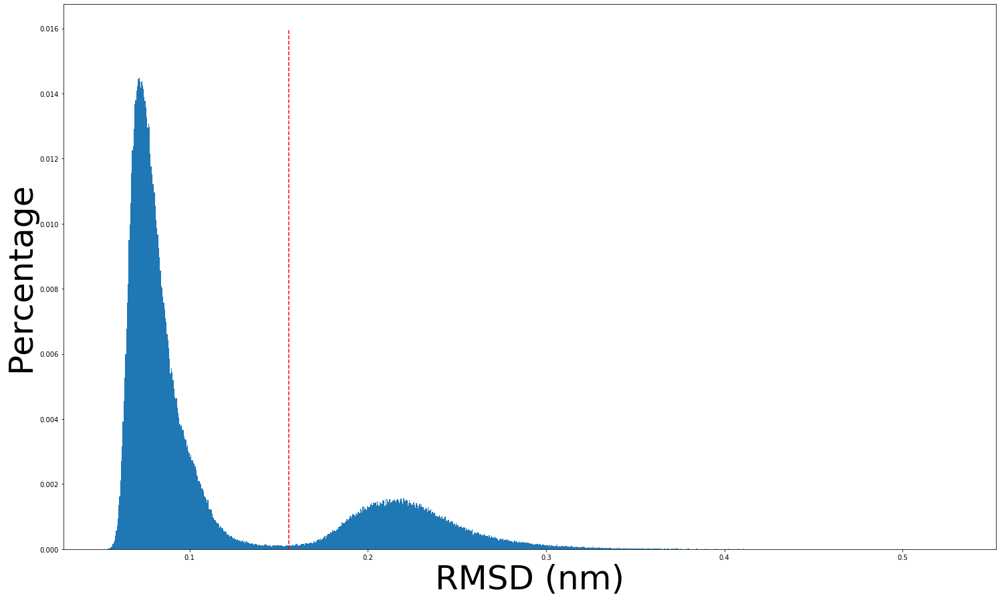

RMSD_r = 1.30e-01 (nm)
0.5285094739351314


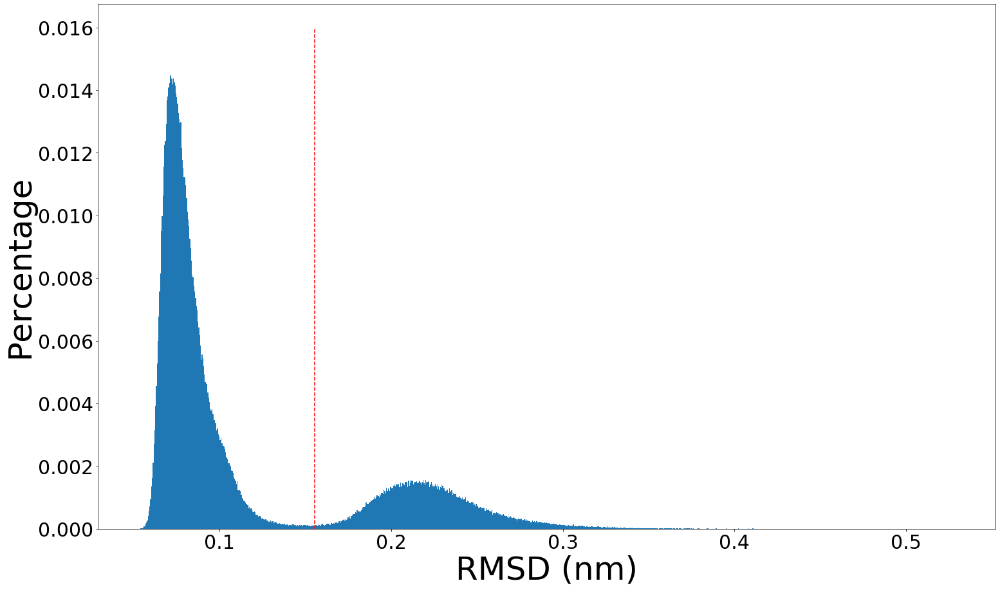

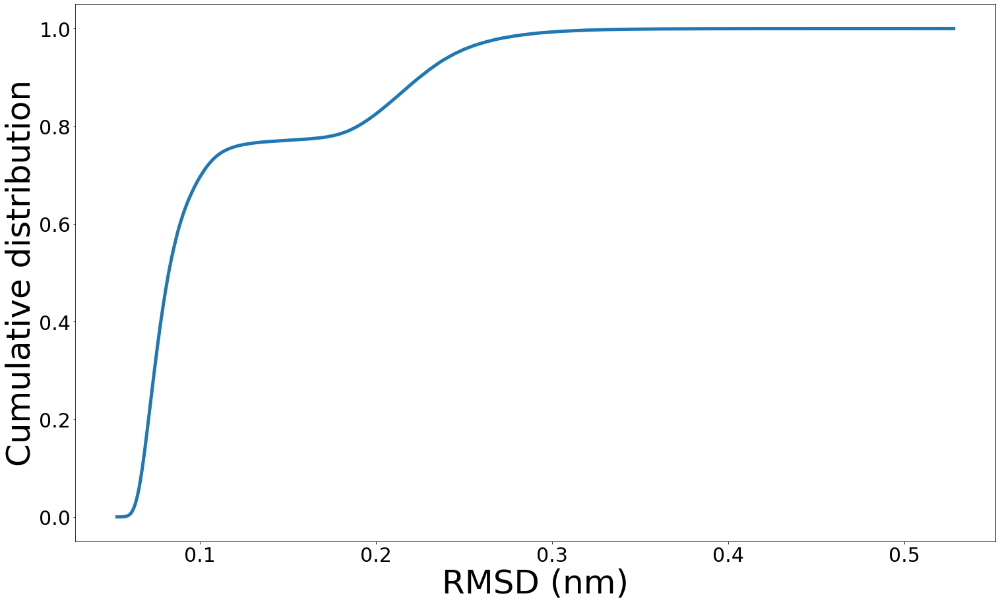

1 / 80 COMPLETE
534743
0
8010
12000
16001
20001
24000
28007
32002
36010
40008


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534732
RMSD_r = 1.30e-01 (nm)
RMSD_train = 2.02e-01 (nm)
0.5230914771904764


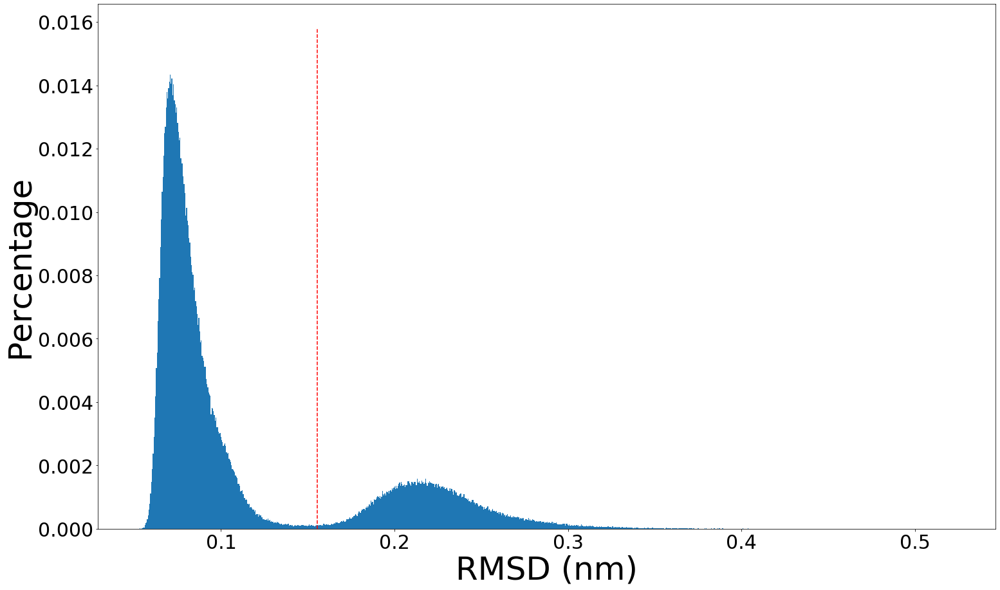

RMSD_r = 1.30e-01 (nm)
0.5230914771904764


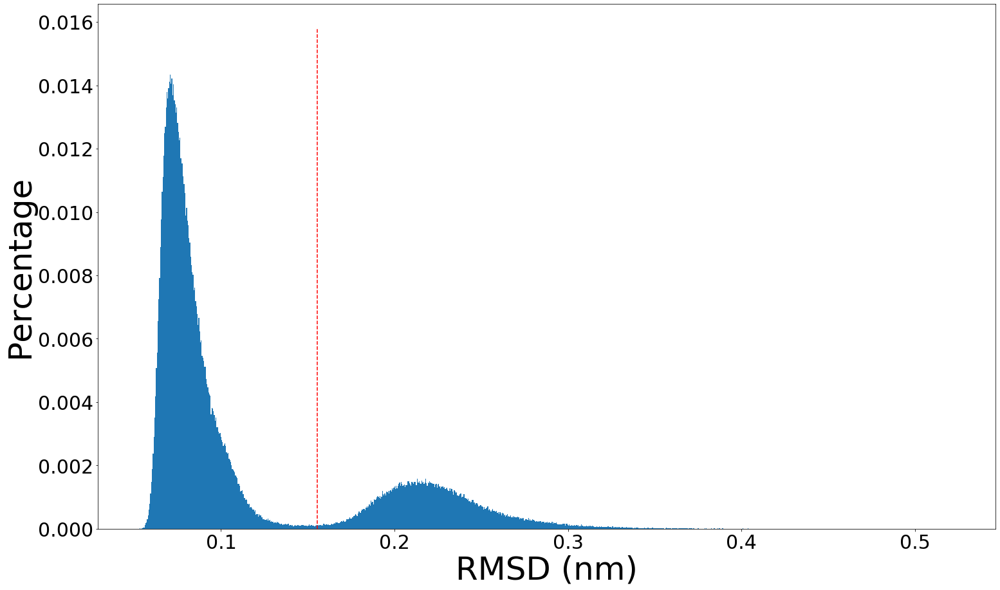

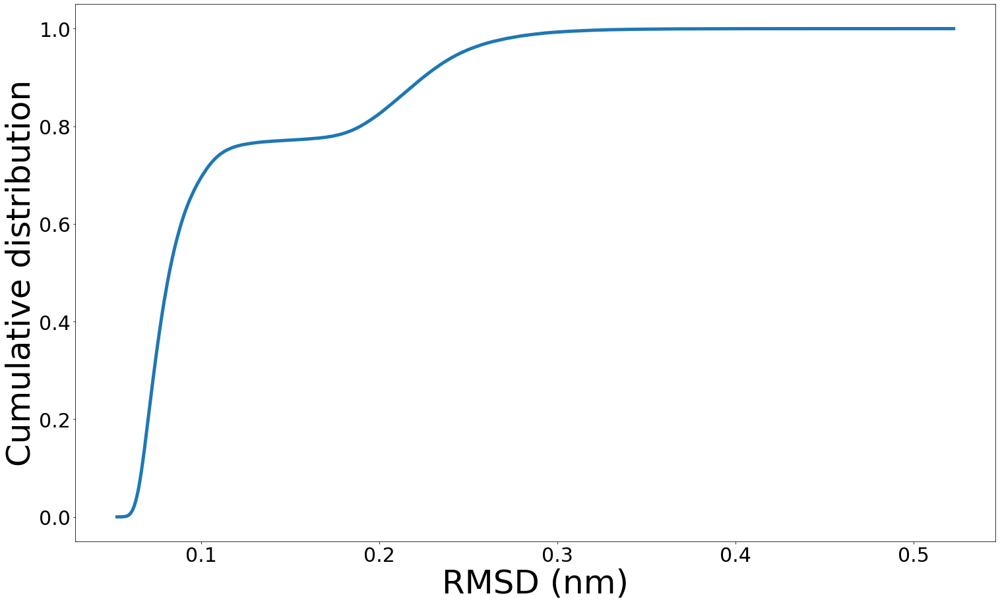

2 / 80 COMPLETE
534743
0
8010
12000
16001
20001
24000
28007
32002
36010
40008


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534732
RMSD_r = 1.30e-01 (nm)
RMSD_train = 2.02e-01 (nm)
0.5205919558711556


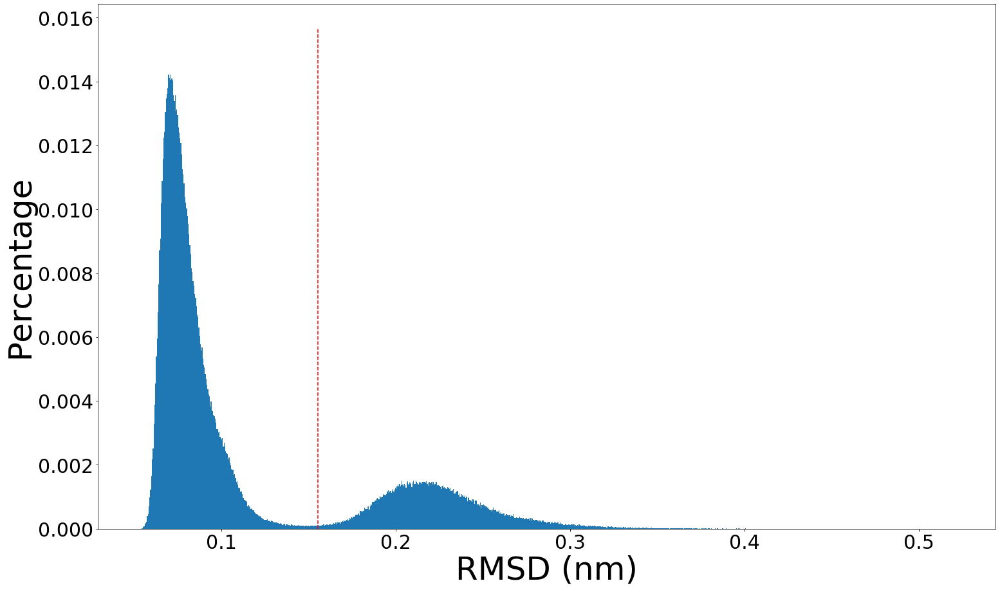

RMSD_r = 1.30e-01 (nm)
0.5205919558711556


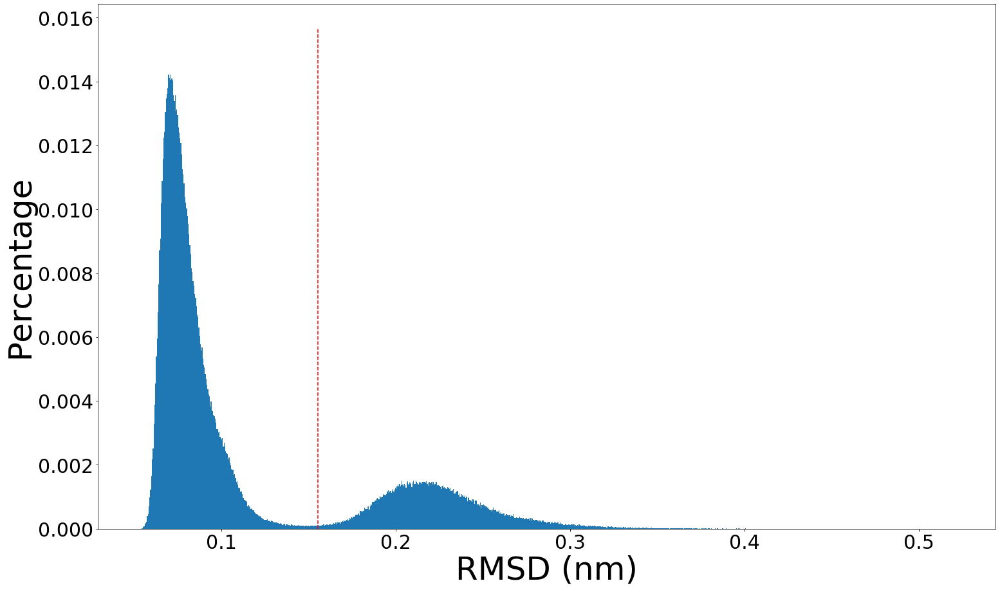

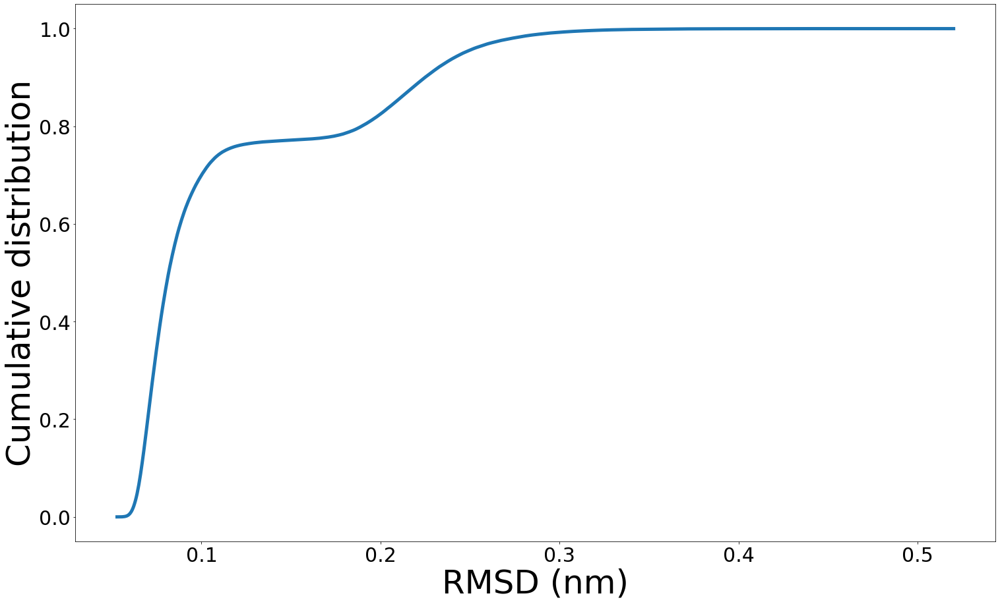

3 / 80 COMPLETE
534743
0
8010
12000
16001
20001
24000
28007
32002
36010
40008


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534732
RMSD_r = 2.53e-01 (nm)
RMSD_train = 2.52e-01 (nm)
0.40800289179805316


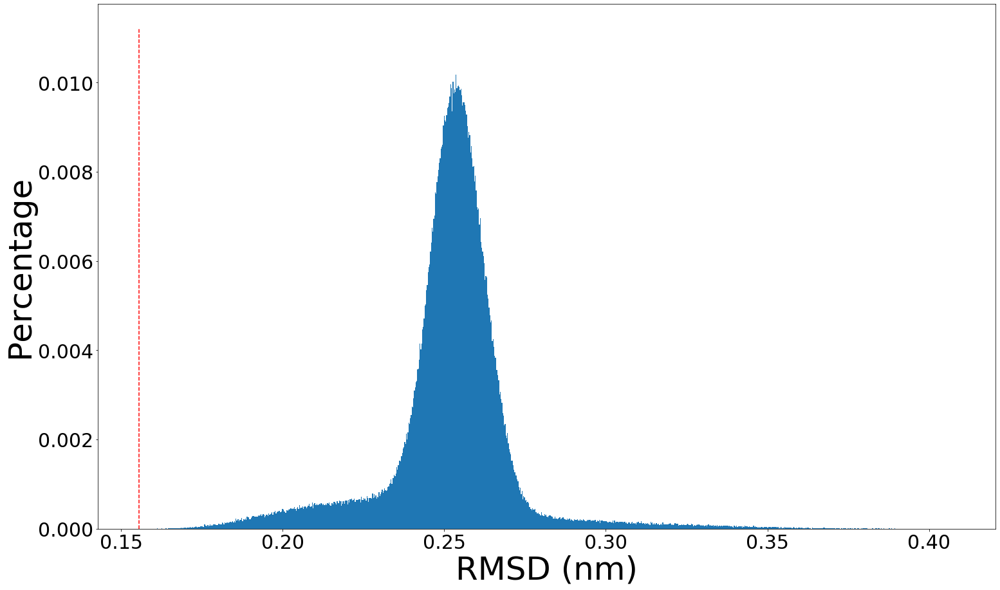

RMSD_r = 2.53e-01 (nm)
0.40800289179805316


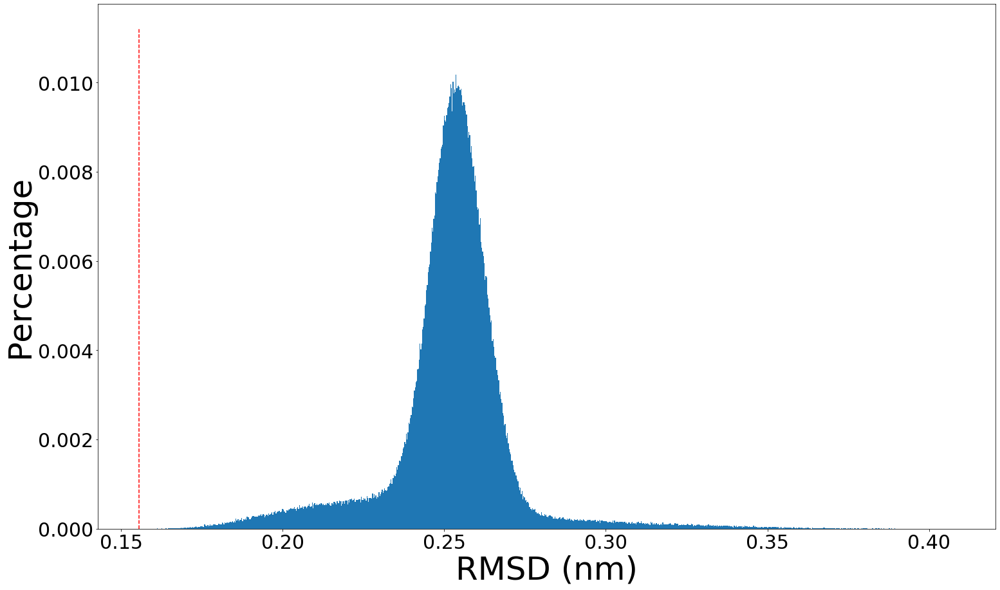

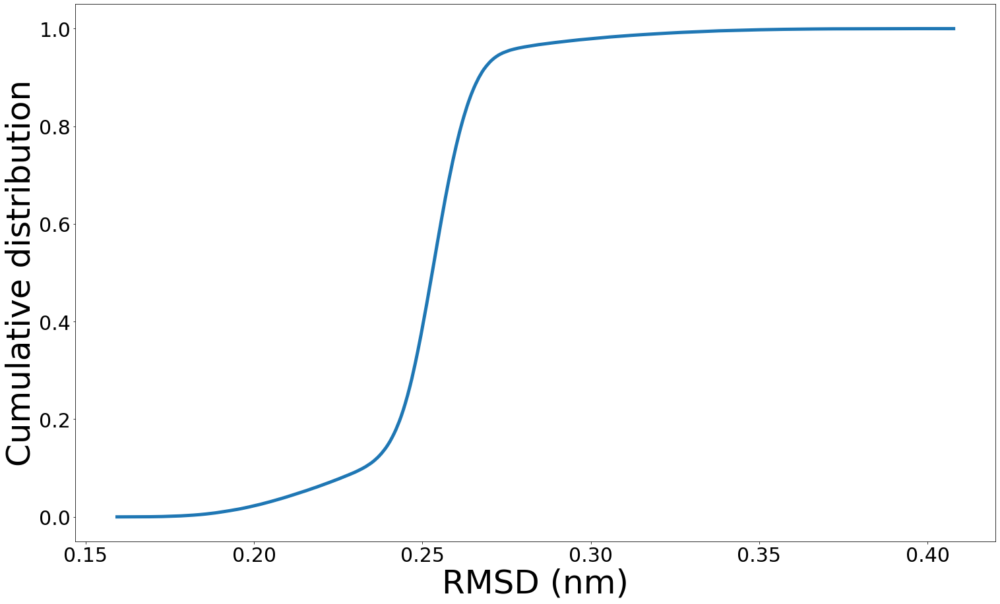

4 / 80 COMPLETE
534743
0
3922
12000
16010
20007
24000
28000
32006
36000
40005


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534688
RMSD_r = 1.09e-01 (nm)
RMSD_train = 1.45e-01 (nm)
0.4138255636688054


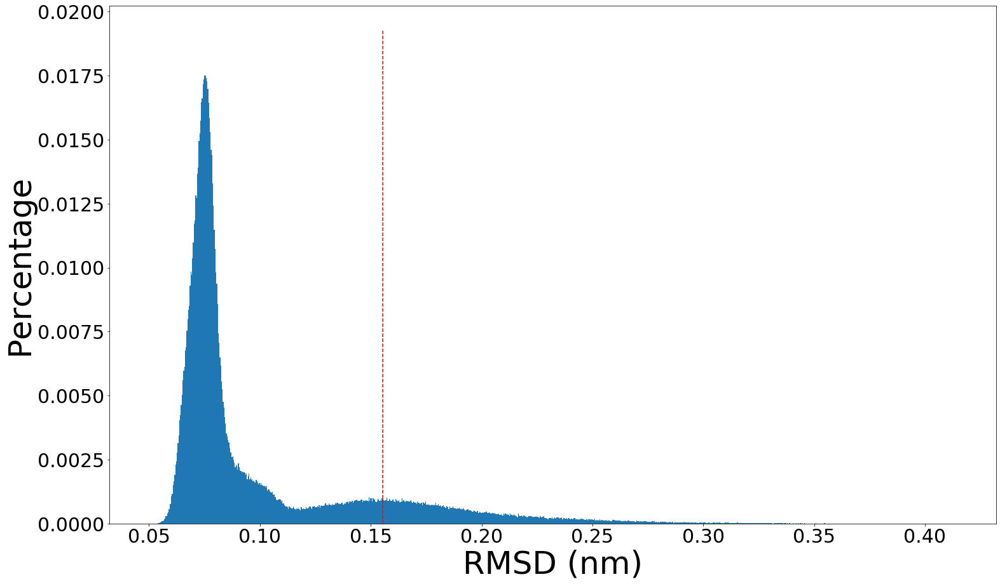

RMSD_r = 1.09e-01 (nm)
0.4149811215554516


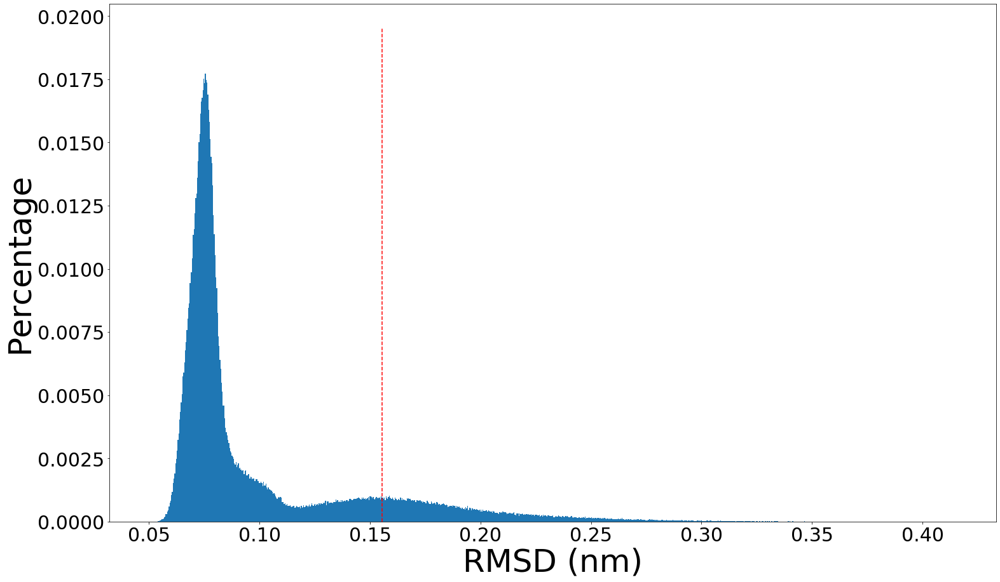

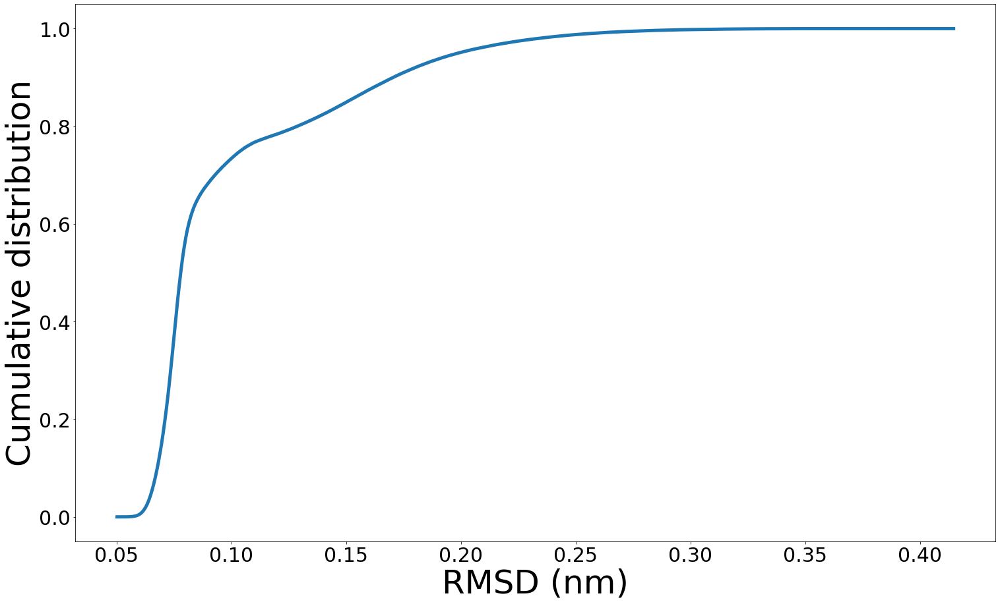

5 / 80 COMPLETE
534743
0
3922
12000
16010
20007
24000
28000
32006
36000
40005


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534688
RMSD_r = 1.09e-01 (nm)
RMSD_train = 1.45e-01 (nm)
0.4205565277716715


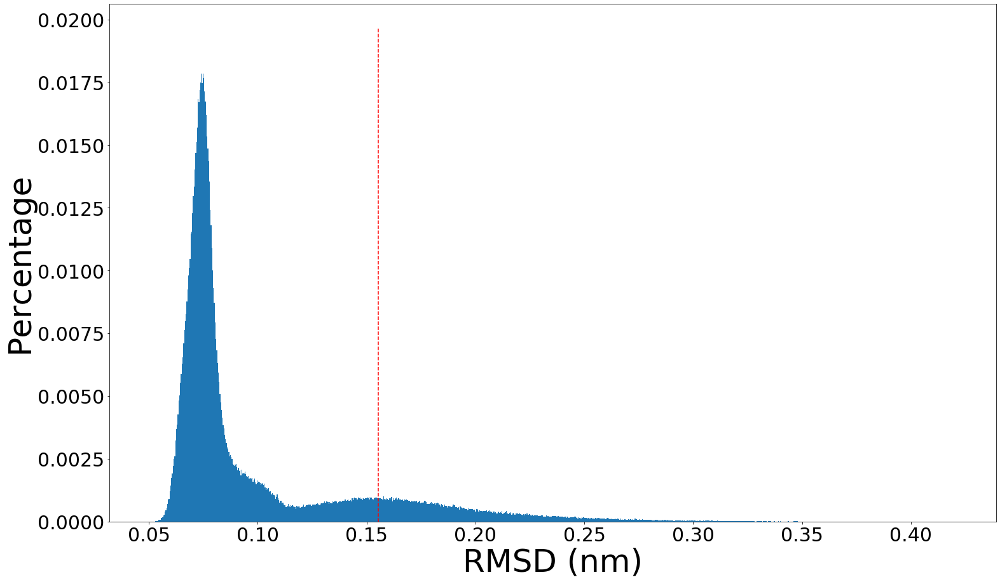

RMSD_r = 1.09e-01 (nm)
0.42419609696154803


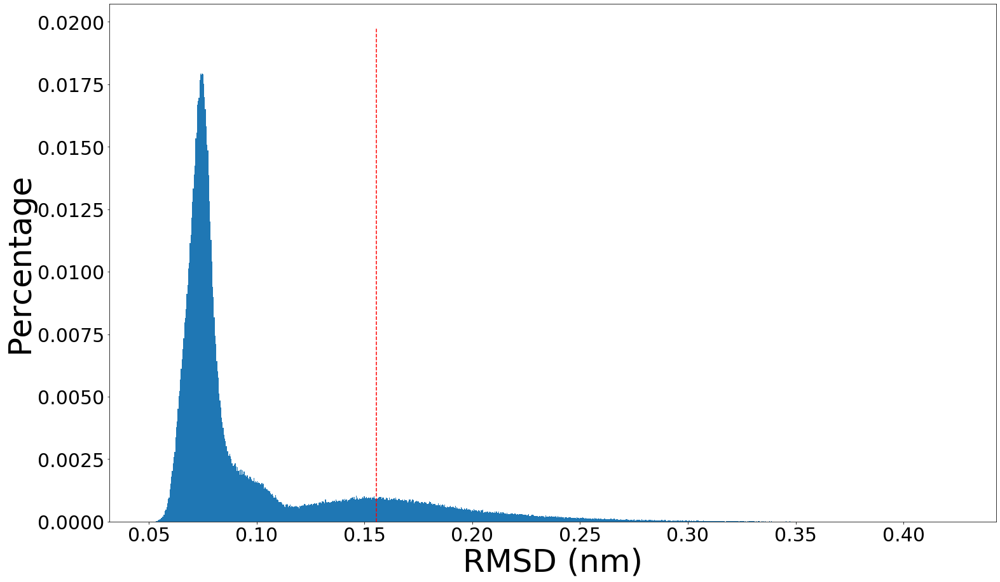

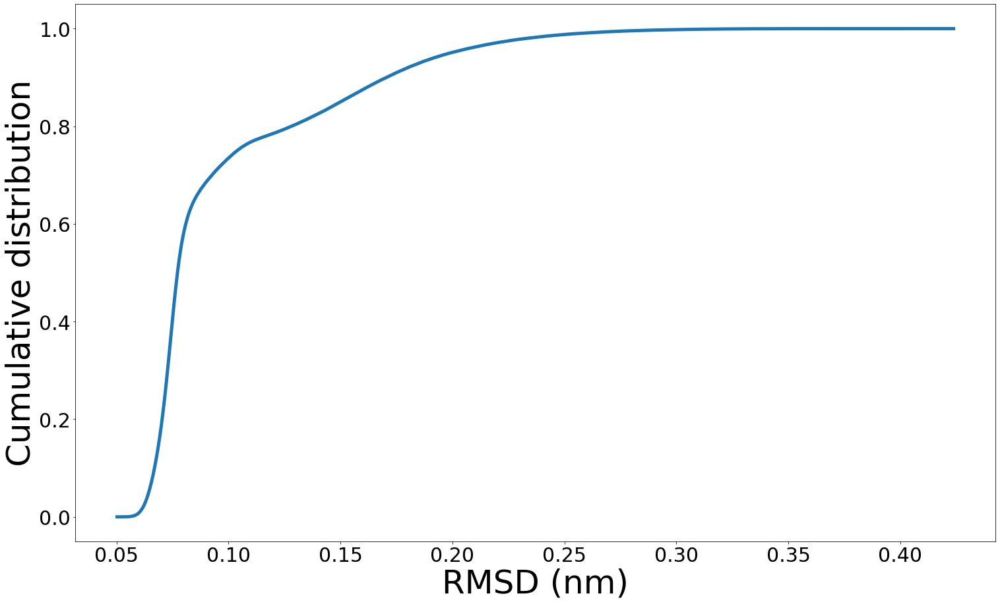

6 / 80 COMPLETE
534743
0
3922
12000
16010
20007
24000
28000
32006
36000
40005


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534688
RMSD_r = 1.09e-01 (nm)
RMSD_train = 1.45e-01 (nm)
0.43235015481185374


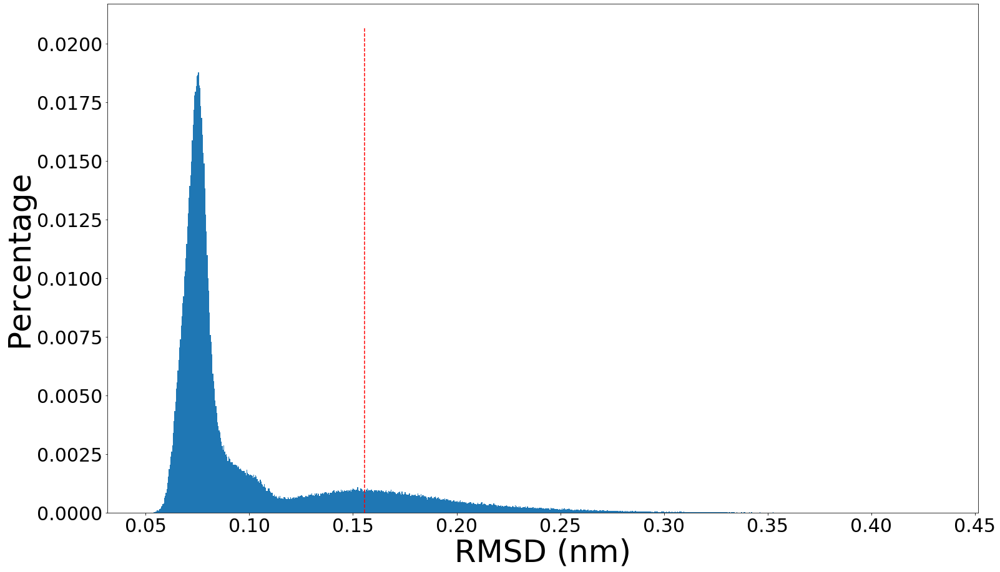

RMSD_r = 1.09e-01 (nm)
0.424549710440107


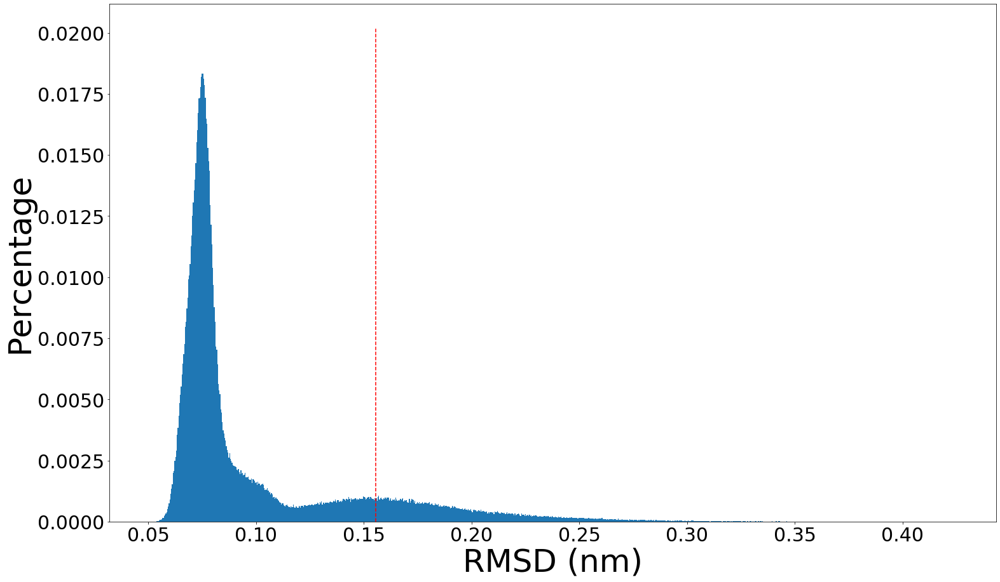

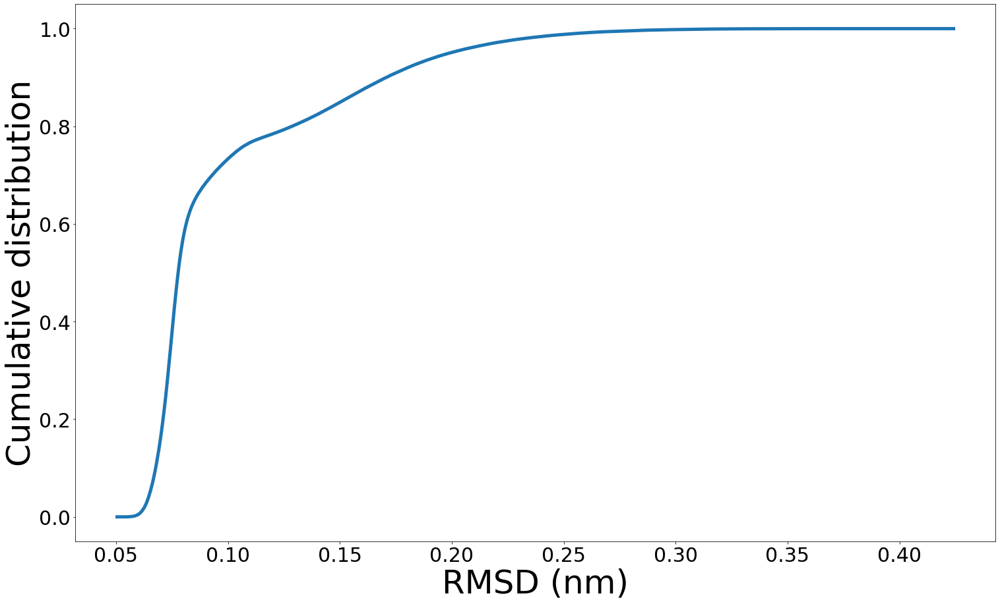

7 / 80 COMPLETE
534743
0
3922
12000
16010
20007
24000
28000
32006
36000
40005


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534688
RMSD_r = 1.10e-01 (nm)
RMSD_train = 1.46e-01 (nm)
0.47564352888778894


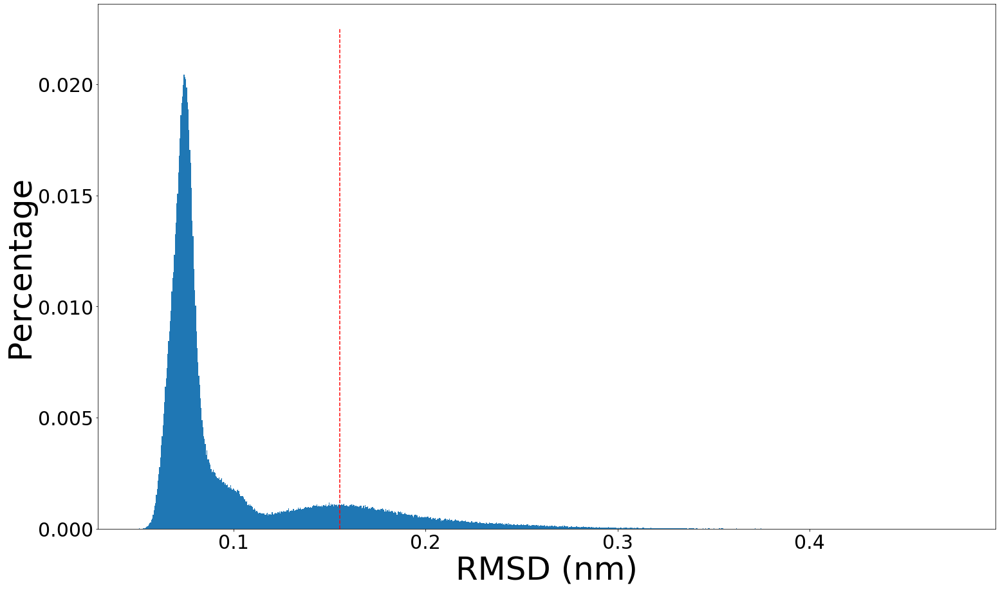

RMSD_r = 1.09e-01 (nm)
0.45124868276008817


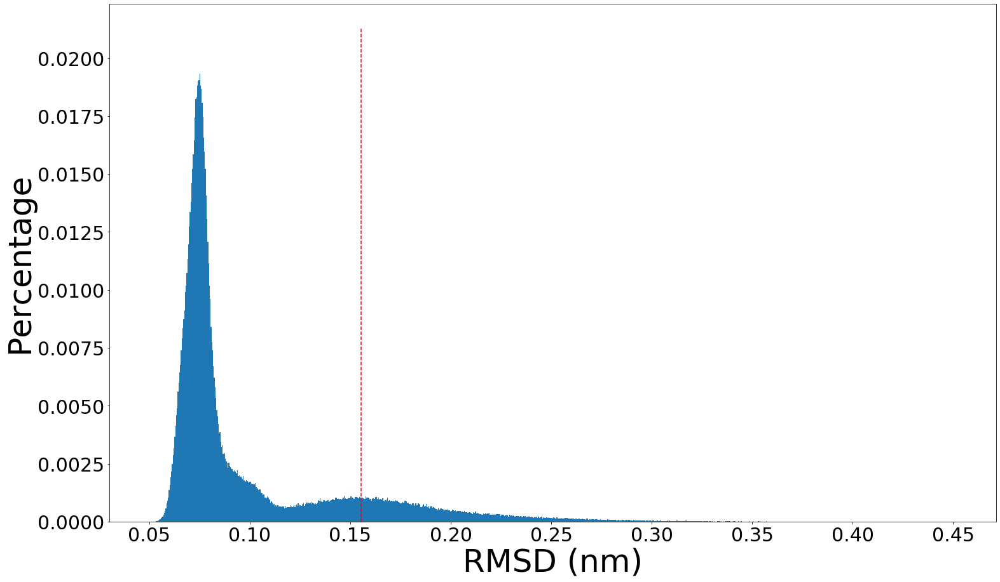

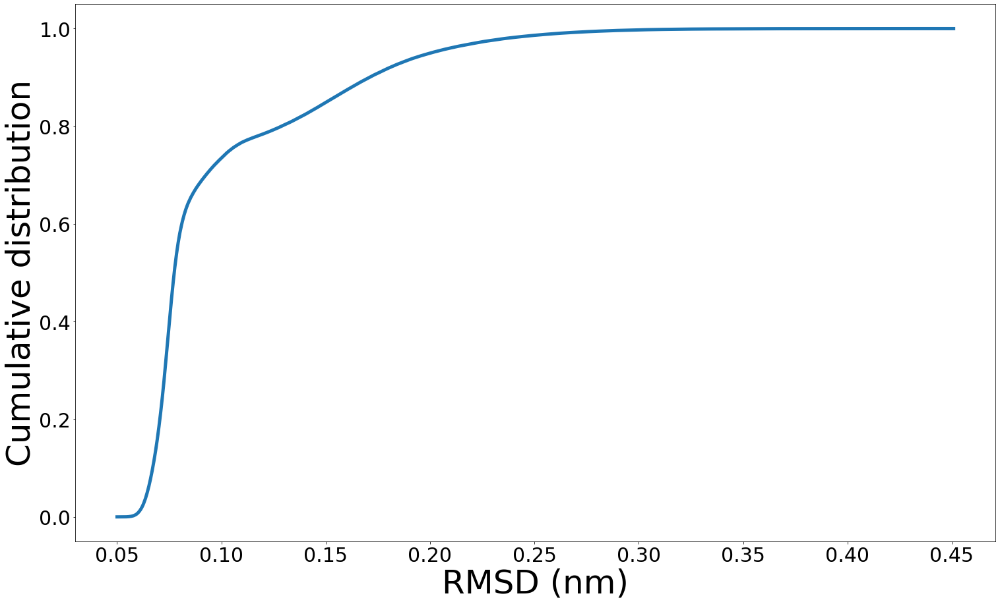

8 / 80 COMPLETE
534743
0
2581
12000
16008
20000
24002
28006
32003
36005
39478


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534633
RMSD_r = 1.04e-01 (nm)
RMSD_train = 1.27e-01 (nm)
0.373538224631027


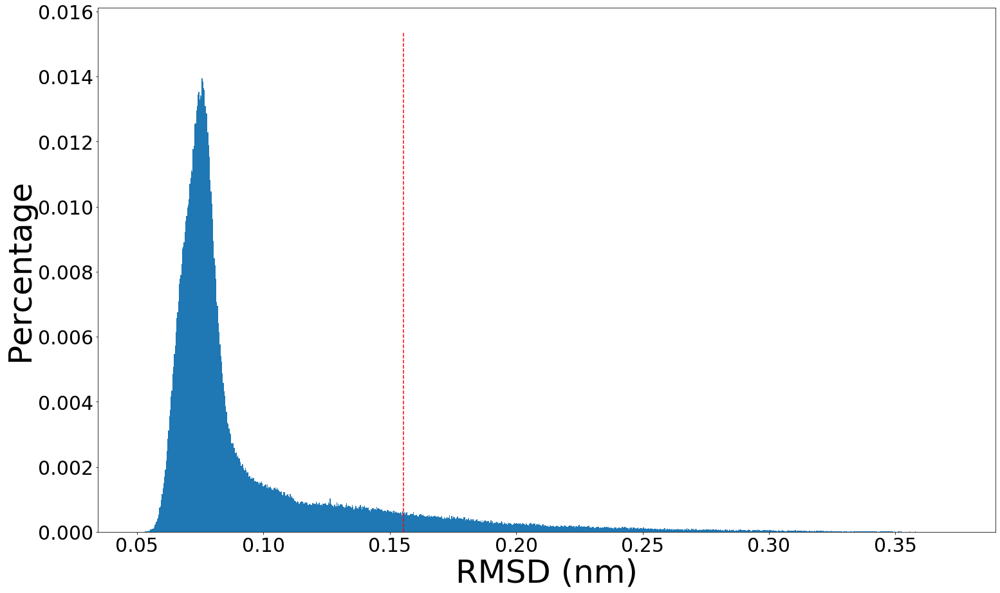

RMSD_r = 1.04e-01 (nm)
0.373538224631027


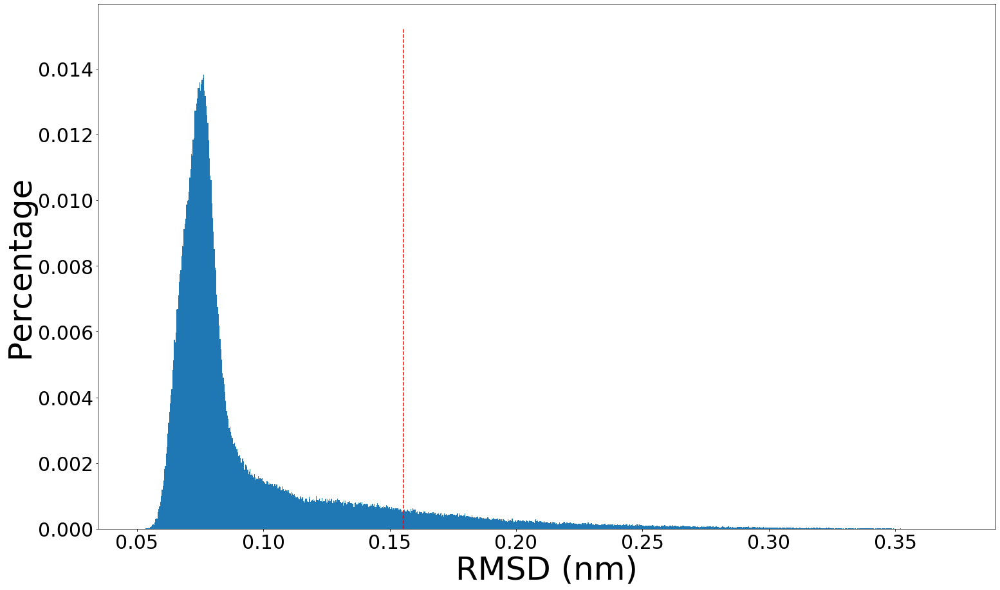

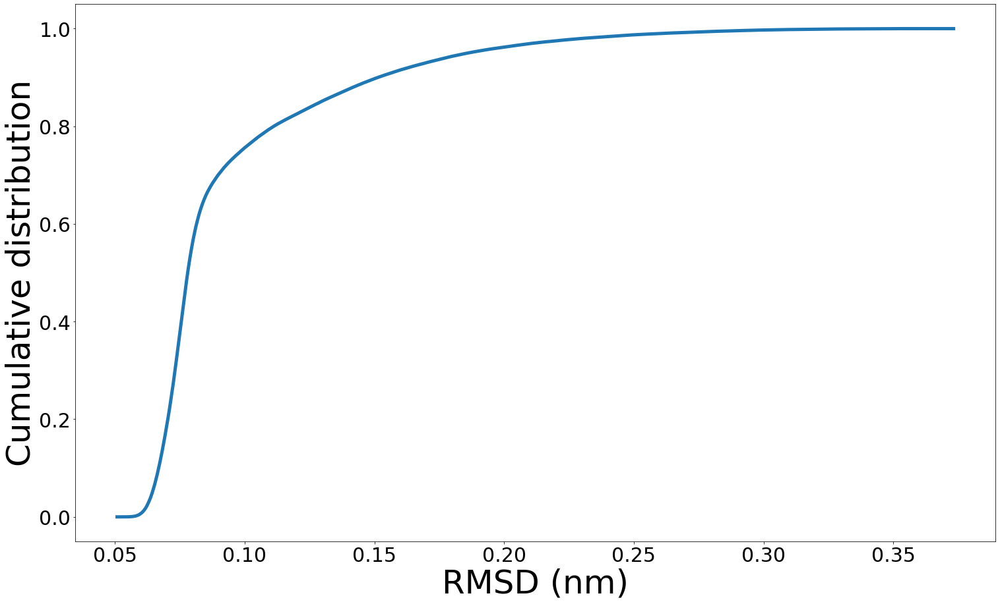

9 / 80 COMPLETE
534743
0
2581
12000
16008
20000
24002
28006
32003
36005
39478


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534633
RMSD_r = 1.05e-01 (nm)
RMSD_train = 1.28e-01 (nm)
0.401406105524814


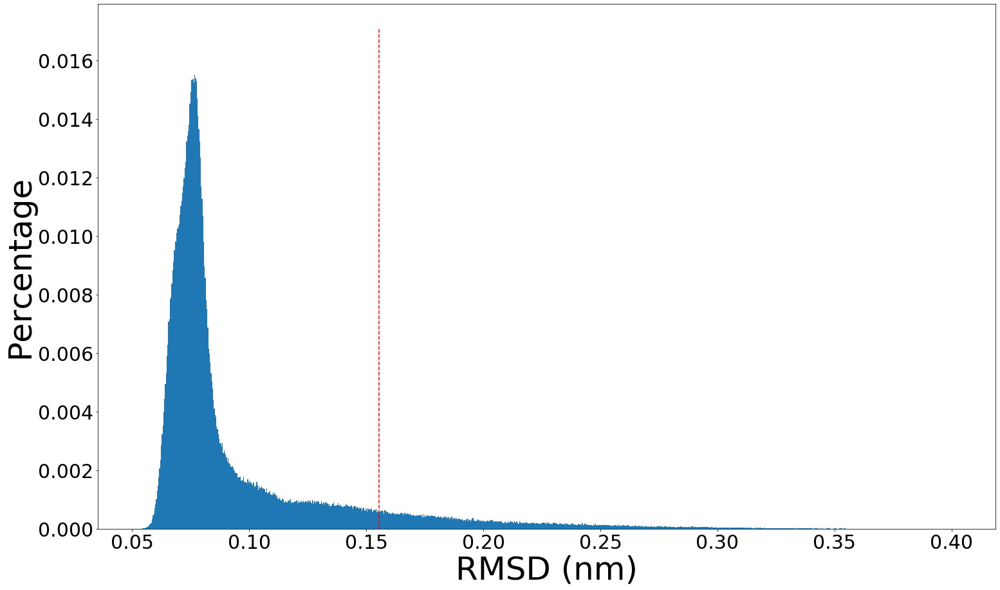

RMSD_r = 1.04e-01 (nm)
0.401406105524814


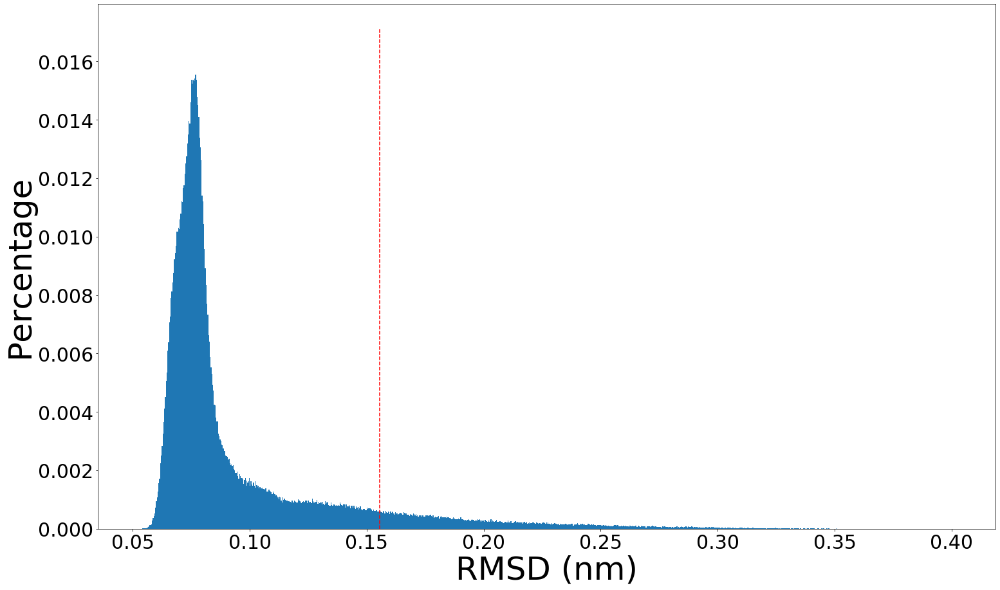

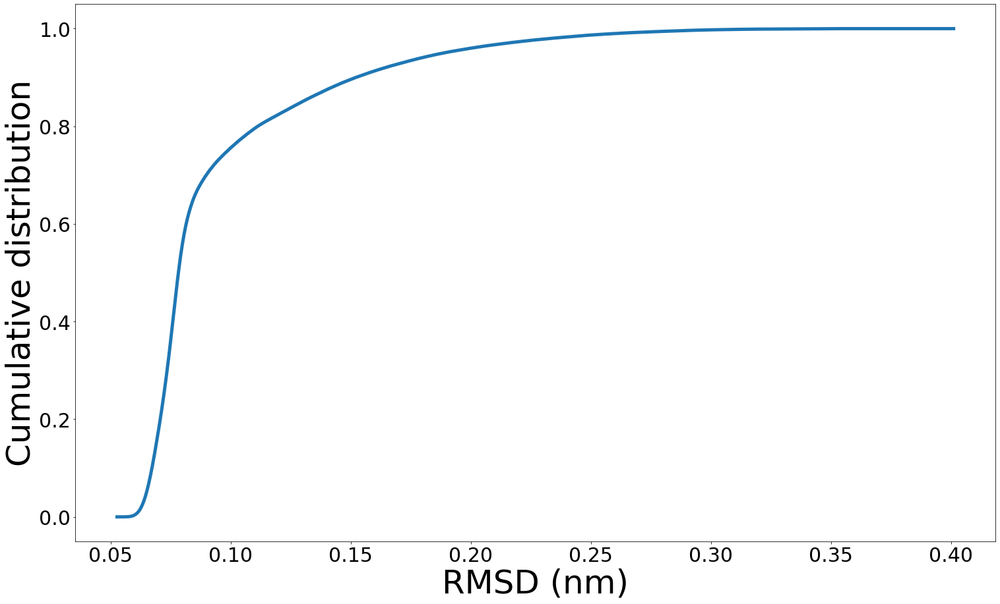

10 / 80 COMPLETE
534743
0
2581
12000
16008
20000
24002
28006
32003
36005
39478


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534633
RMSD_r = 1.05e-01 (nm)
RMSD_train = 1.28e-01 (nm)
0.4240961006017726


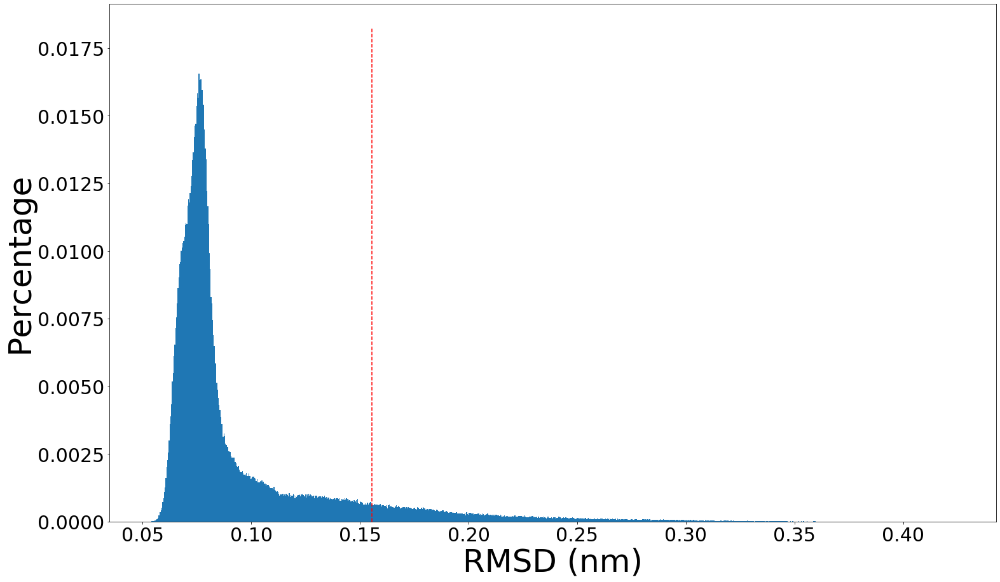

RMSD_r = 1.04e-01 (nm)
0.4240961006017726


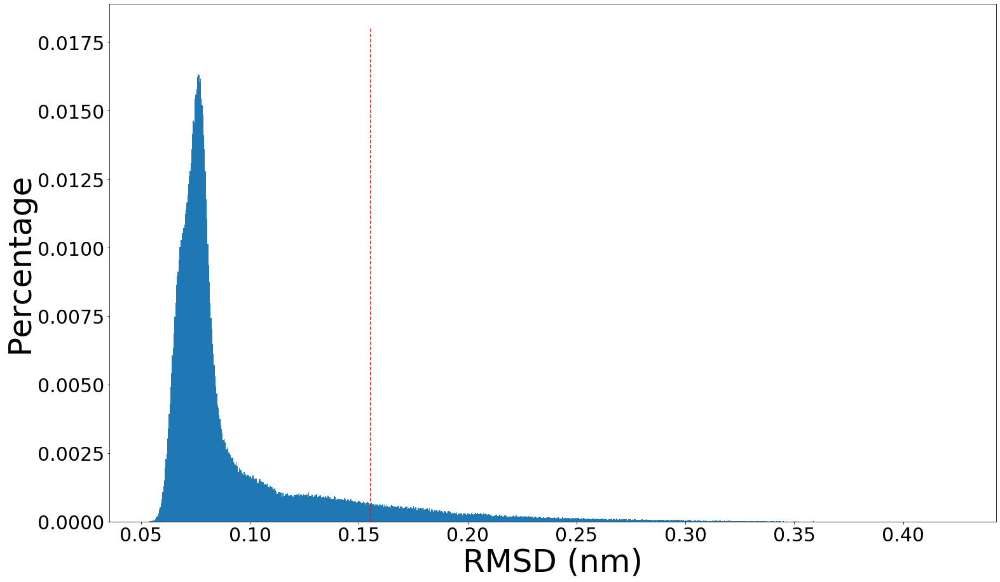

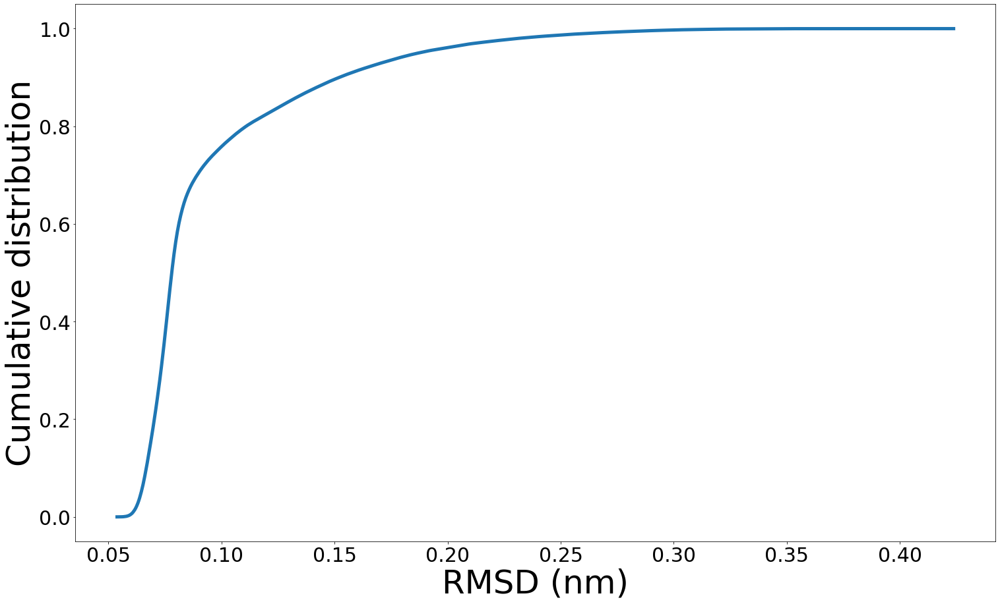

11 / 80 COMPLETE
534743
0
2581
12000
16008
20000
24002
28006
32003
36005
39478


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534633
RMSD_r = 1.04e-01 (nm)
RMSD_train = 1.28e-01 (nm)
0.4609818680806918


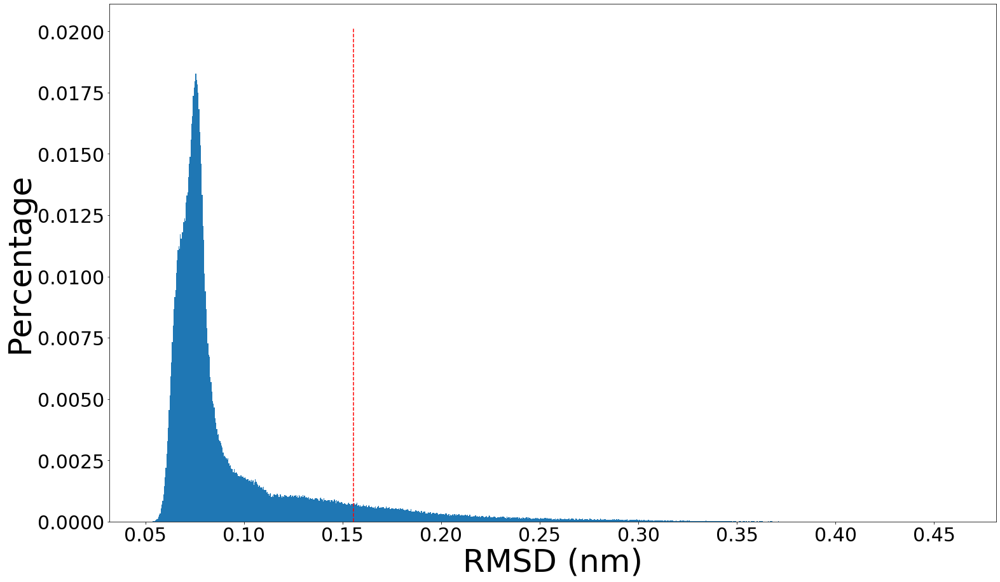

RMSD_r = 1.04e-01 (nm)
0.4539512758677883


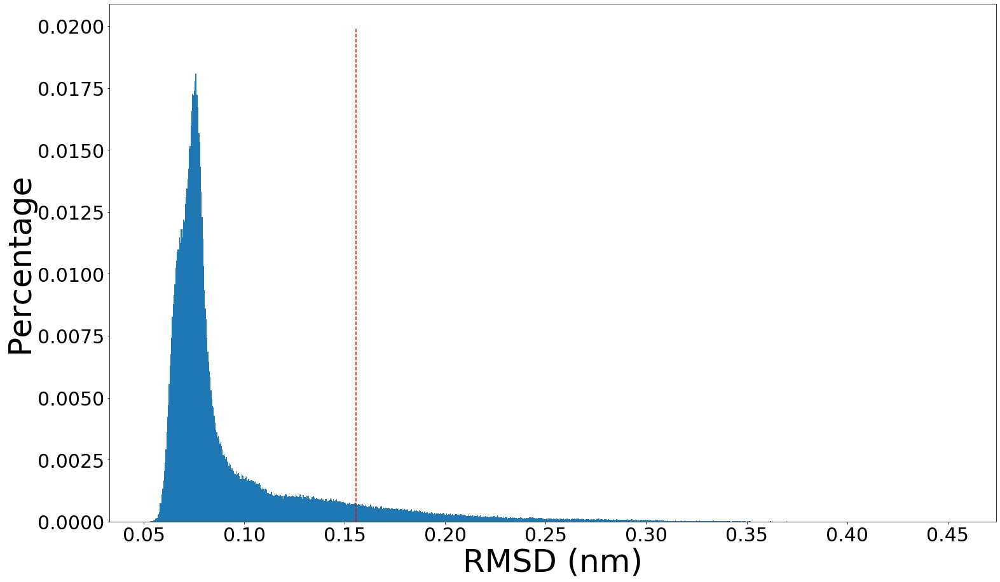

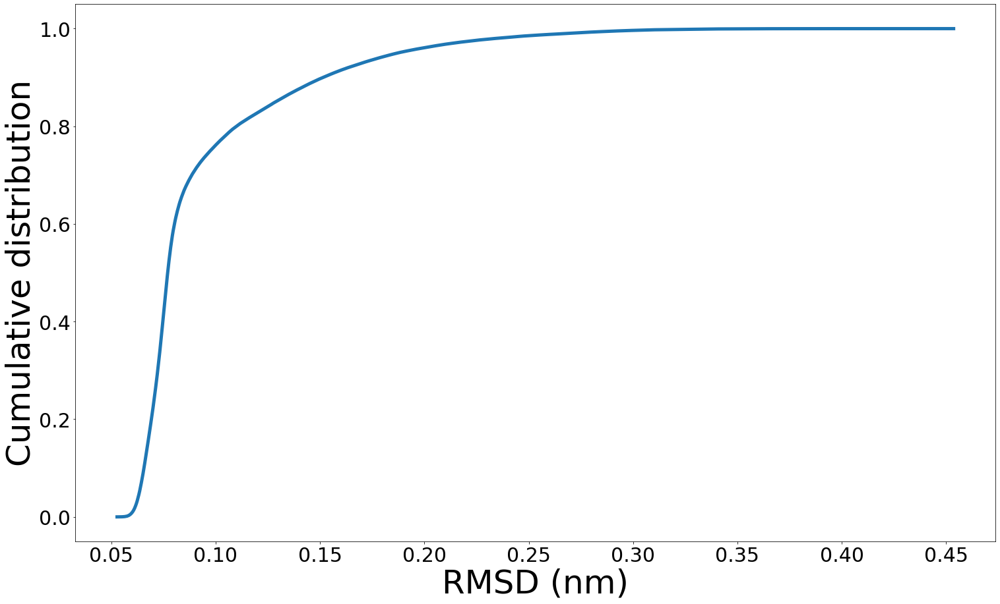

12 / 80 COMPLETE
534743
0
2252
12001
16000
20001
24000
28008
32006
36005
39732


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534468
RMSD_r = 9.59e-02 (nm)
RMSD_train = 1.24e-01 (nm)
0.3833030438449291


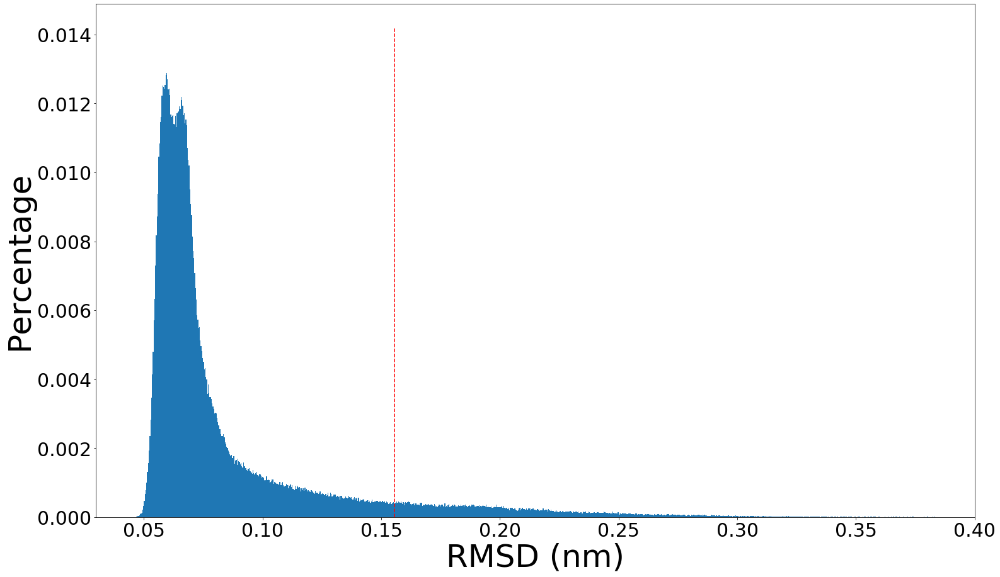

RMSD_r = 9.47e-02 (nm)
0.3784696671077597


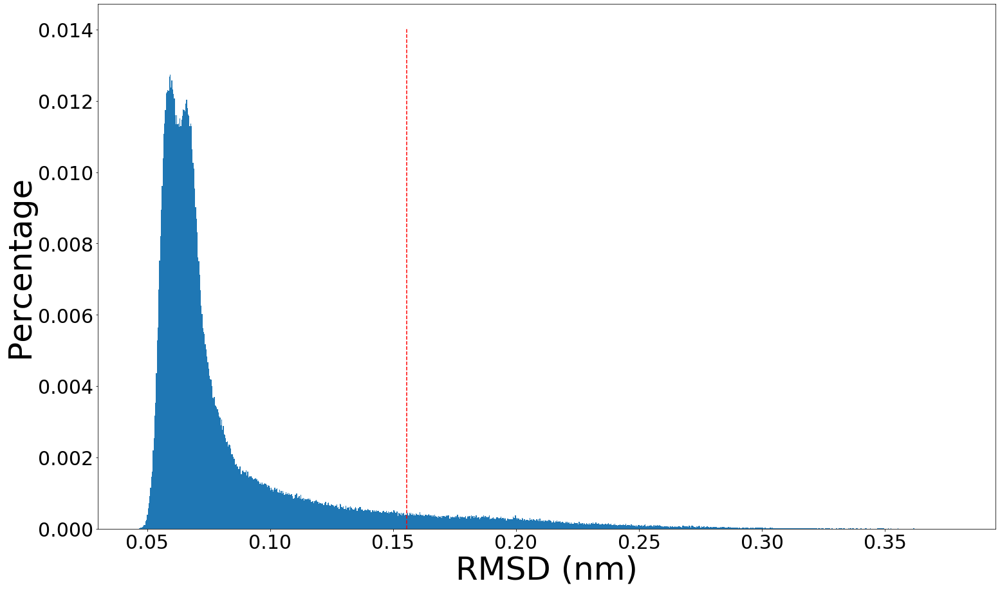

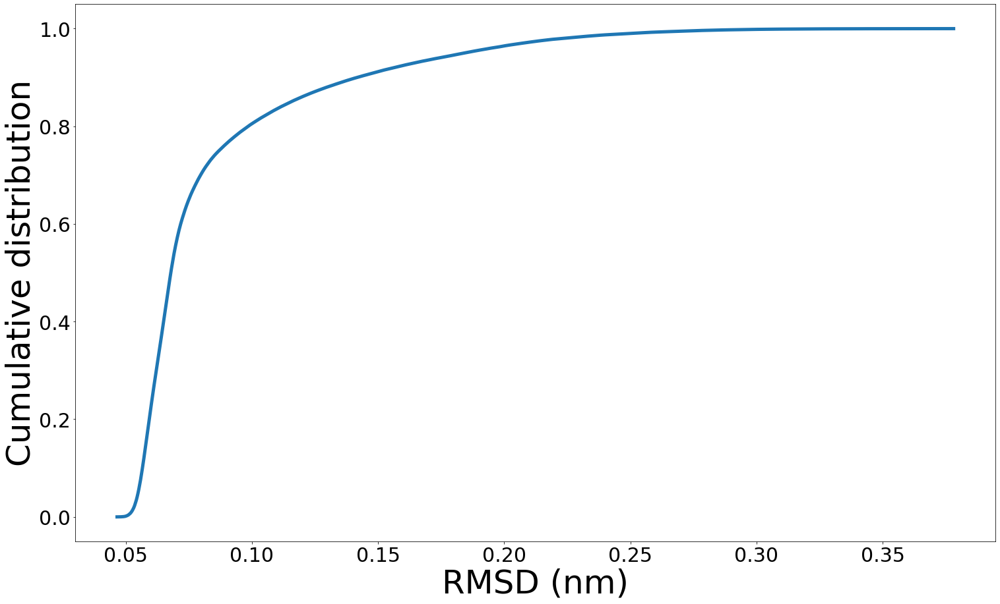

13 / 80 COMPLETE
534743
0
2252
12001
16000
20001
24000
28008
32006
36005
39732


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534468
RMSD_r = 9.63e-02 (nm)
RMSD_train = 1.25e-01 (nm)
0.38663703312201547


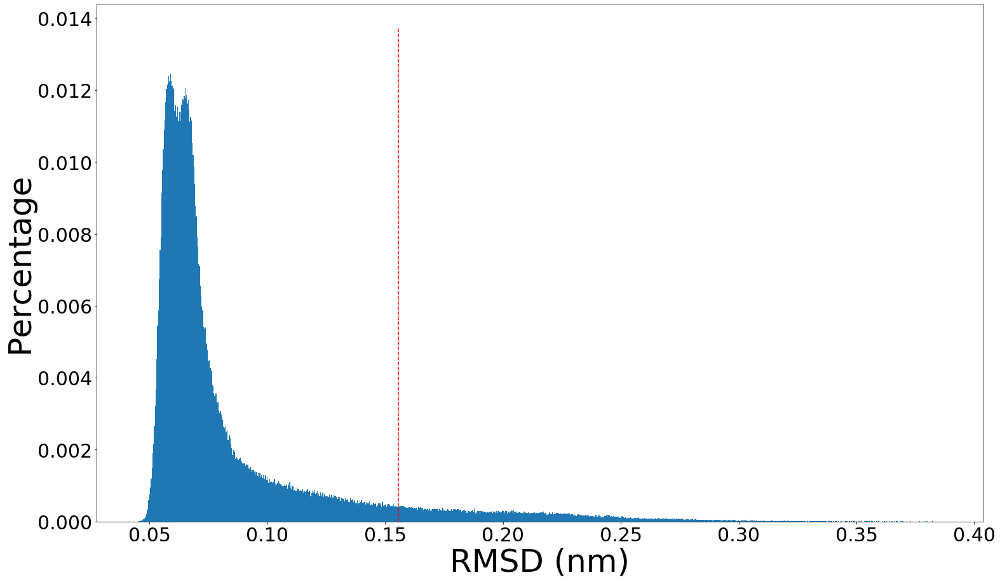

RMSD_r = 9.51e-02 (nm)
0.3778671584633947


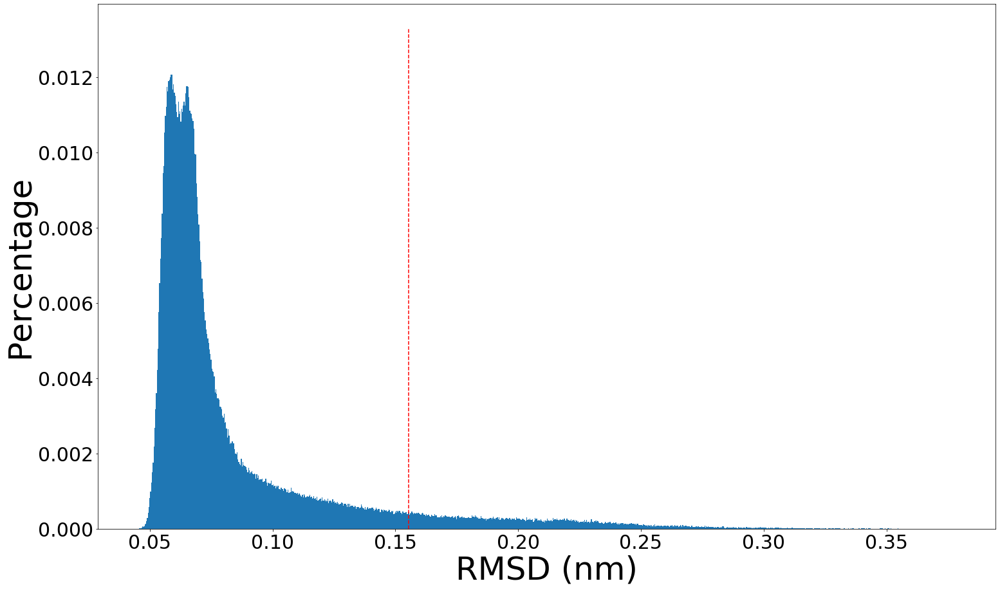

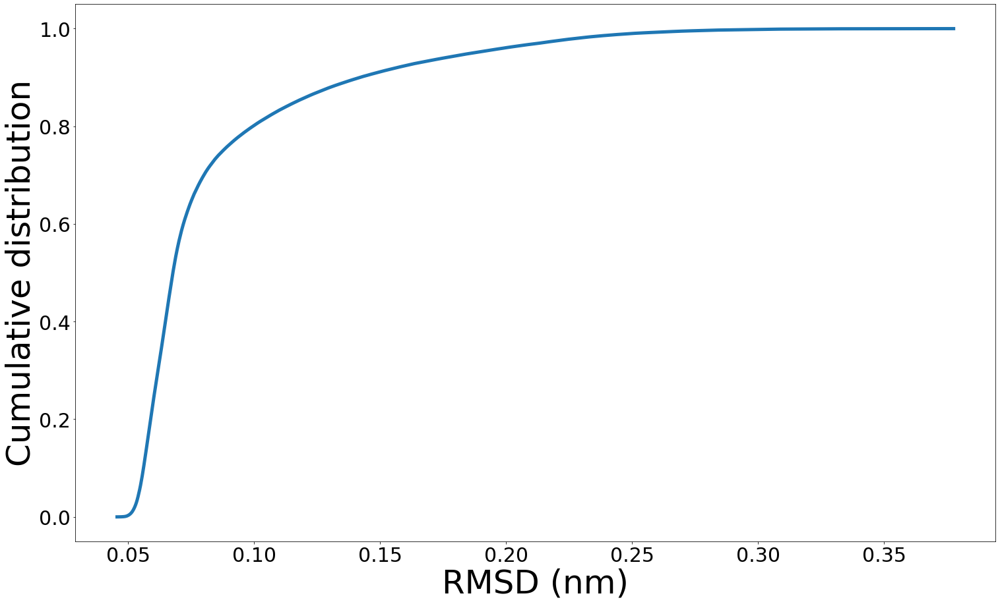

14 / 80 COMPLETE
534743
0
2252
12001
16000
20001
24000
28008
32006
36005
39732


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534468
RMSD_r = 9.73e-02 (nm)
RMSD_train = 1.23e-01 (nm)
0.3833517552870983


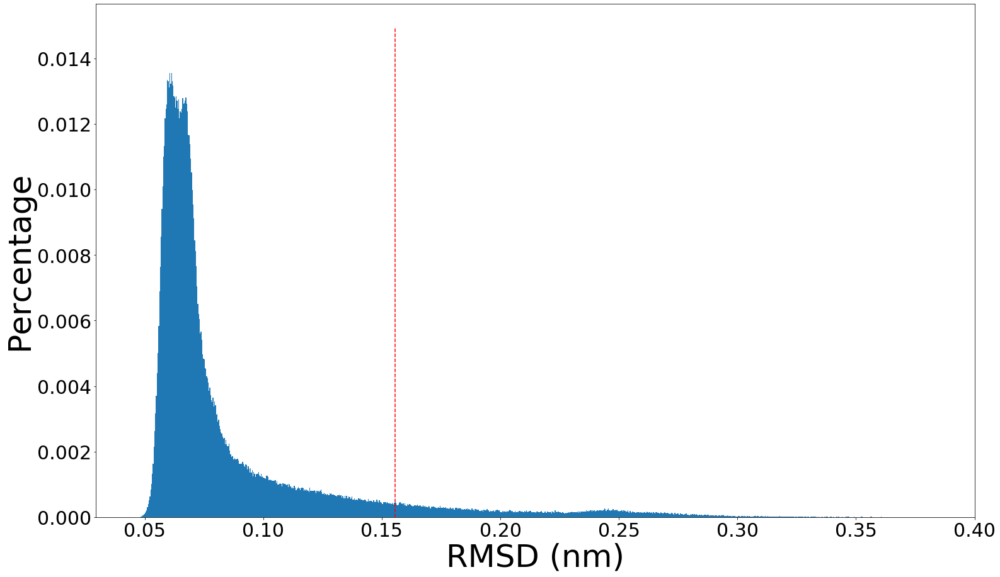

RMSD_r = 9.61e-02 (nm)
0.3640297325312362


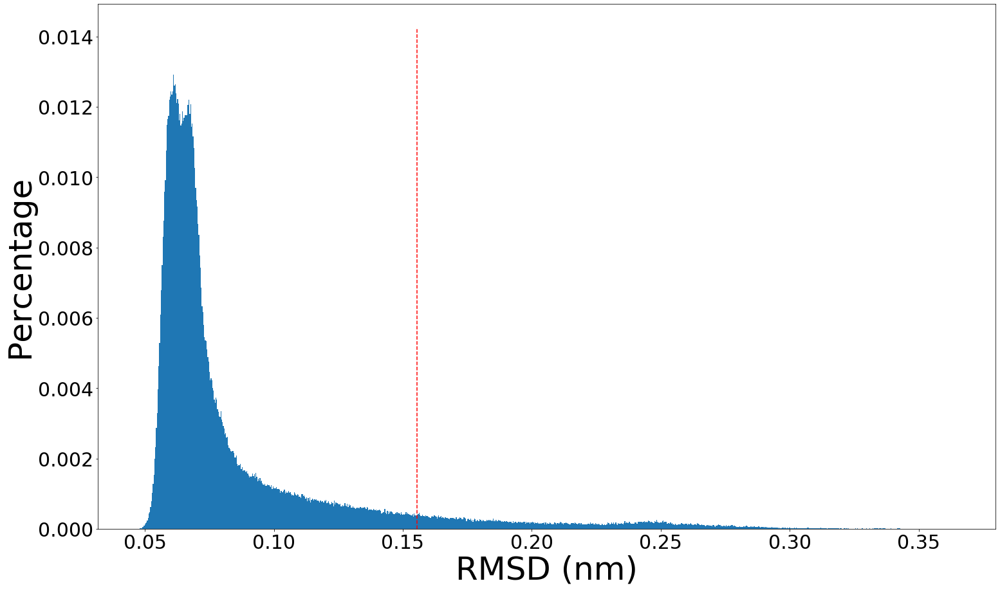

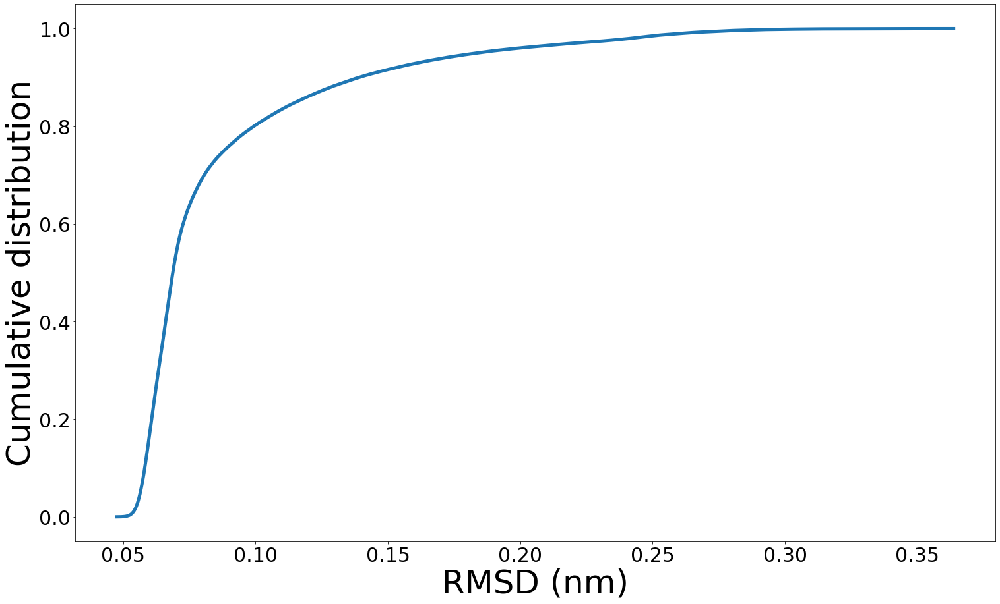

15 / 80 COMPLETE
534743
0
2252
12001
16000
20001
24000
28008
32006
36005
39732


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534468
RMSD_r = 9.73e-02 (nm)
RMSD_train = 1.25e-01 (nm)
0.44547951647549666


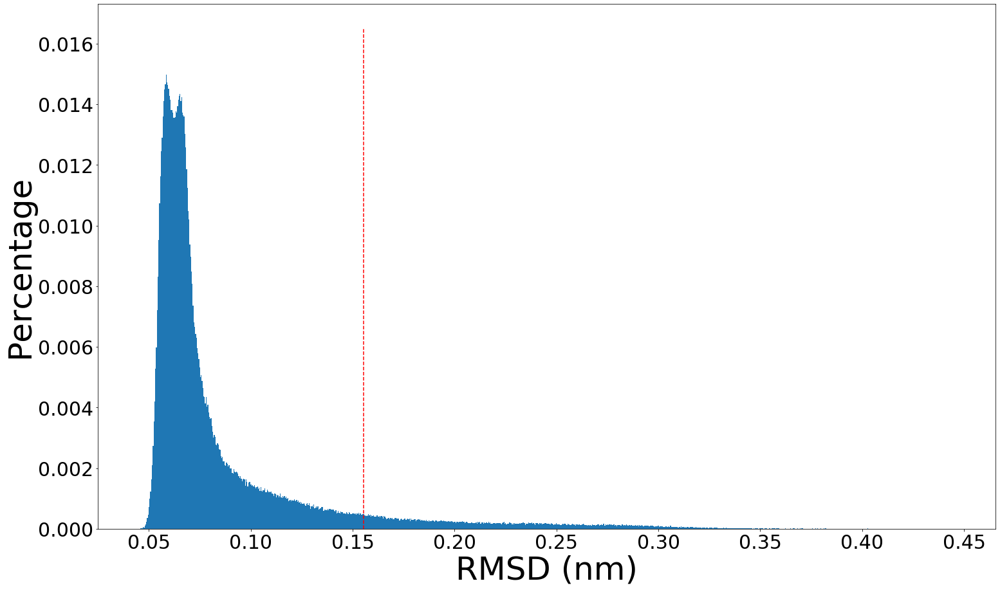

RMSD_r = 9.61e-02 (nm)
0.41102811697034514


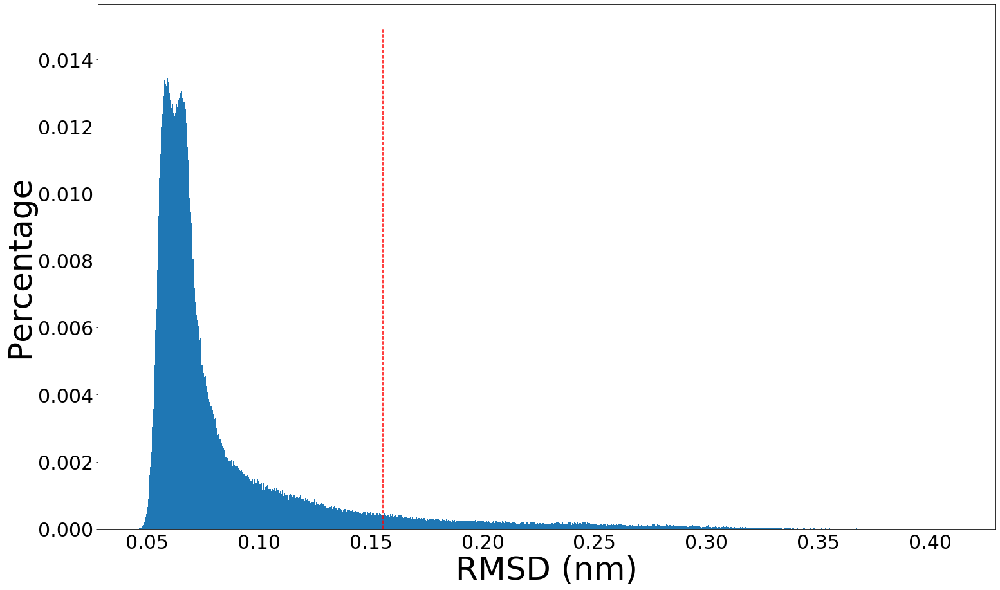

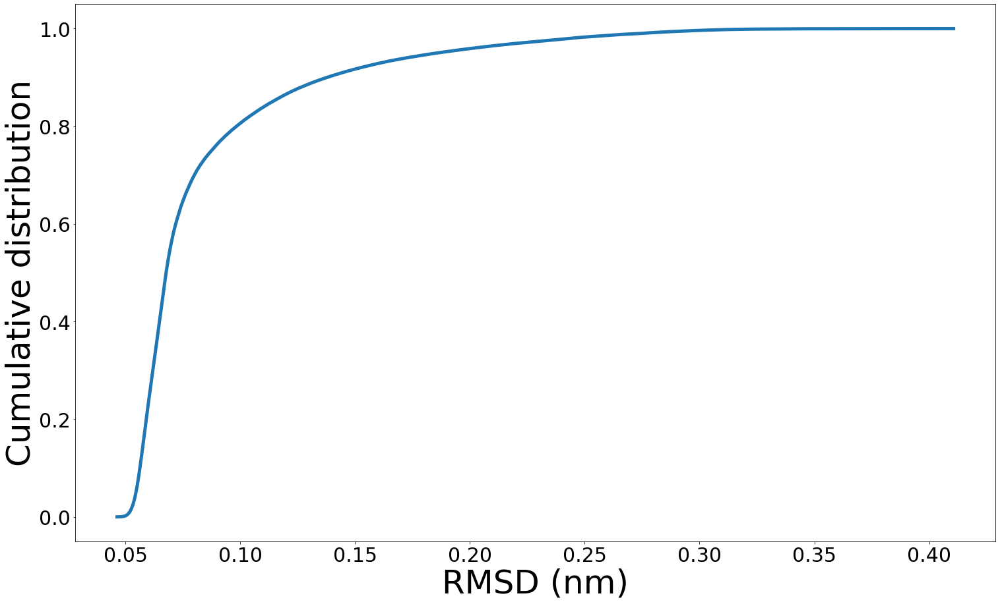

16 / 80 COMPLETE
534743
0
2640
12000
16000
20000
24000
28000
32000
36000
40009


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534193
RMSD_r = 1.02e-01 (nm)
RMSD_train = 1.26e-01 (nm)
0.39541409496668206


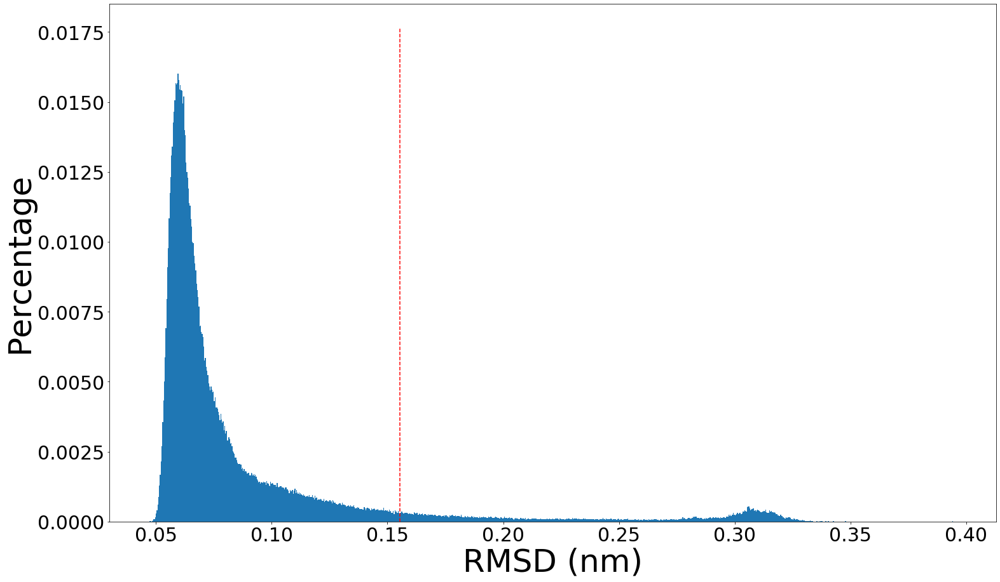

RMSD_r = 1.01e-01 (nm)
0.37285928183410333


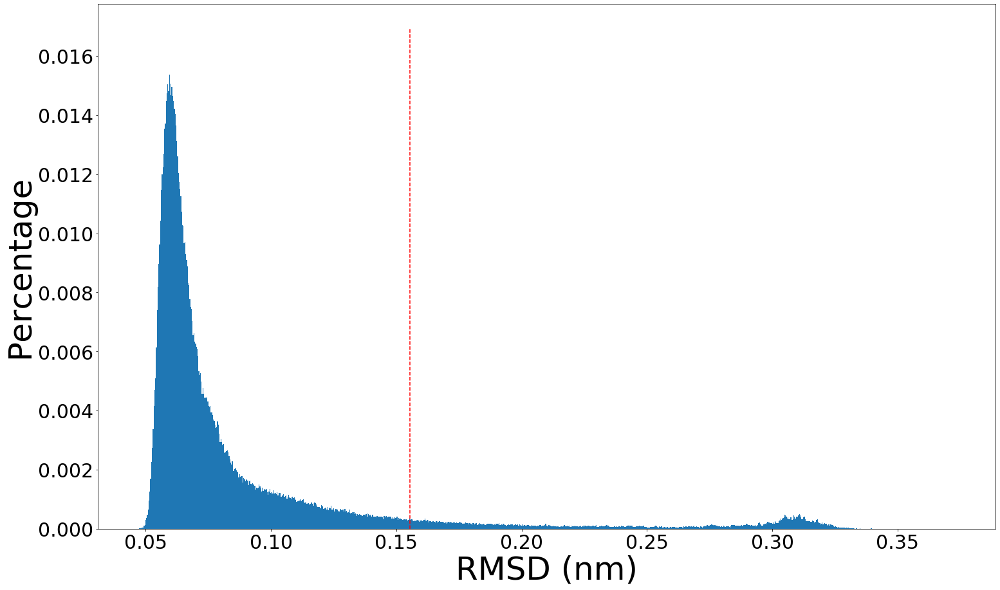

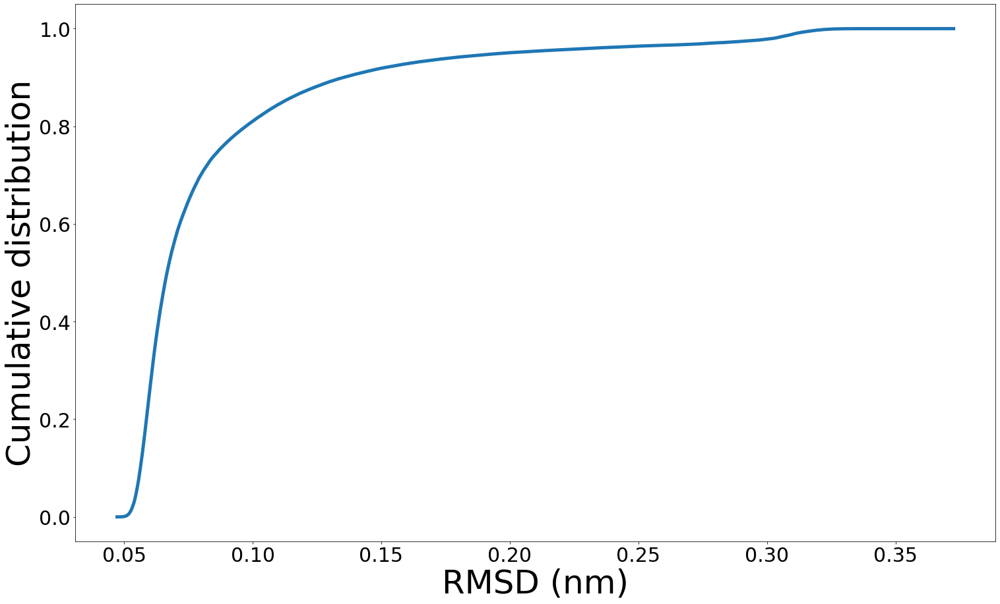

17 / 80 COMPLETE
534743
0
2640
12000
16000
20000
24000
28000
32000
36000
40009


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534193
RMSD_r = 1.04e-01 (nm)
RMSD_train = 1.28e-01 (nm)
0.39578228873946275


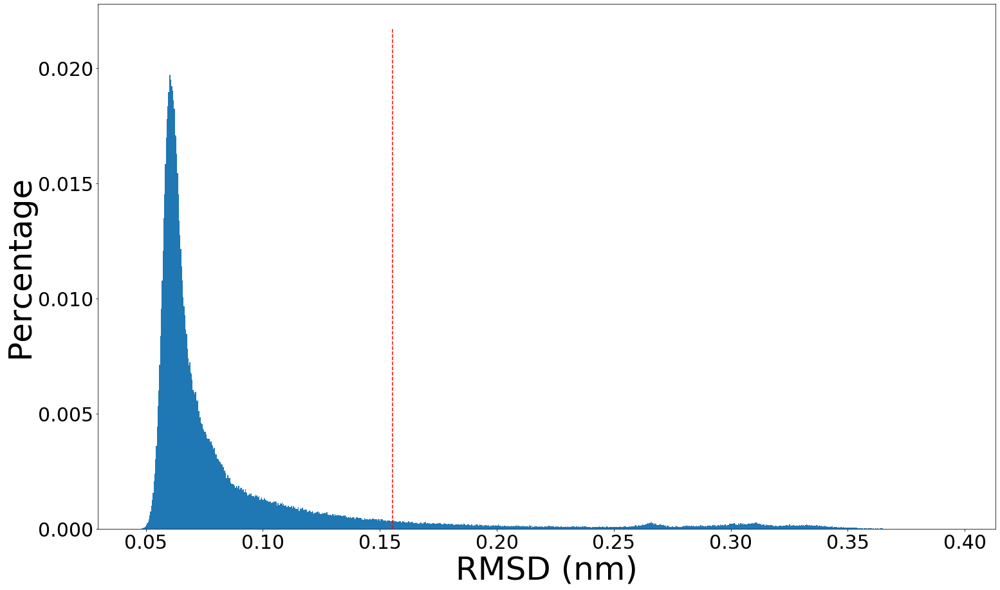

RMSD_r = 1.02e-01 (nm)
0.38098219649627757


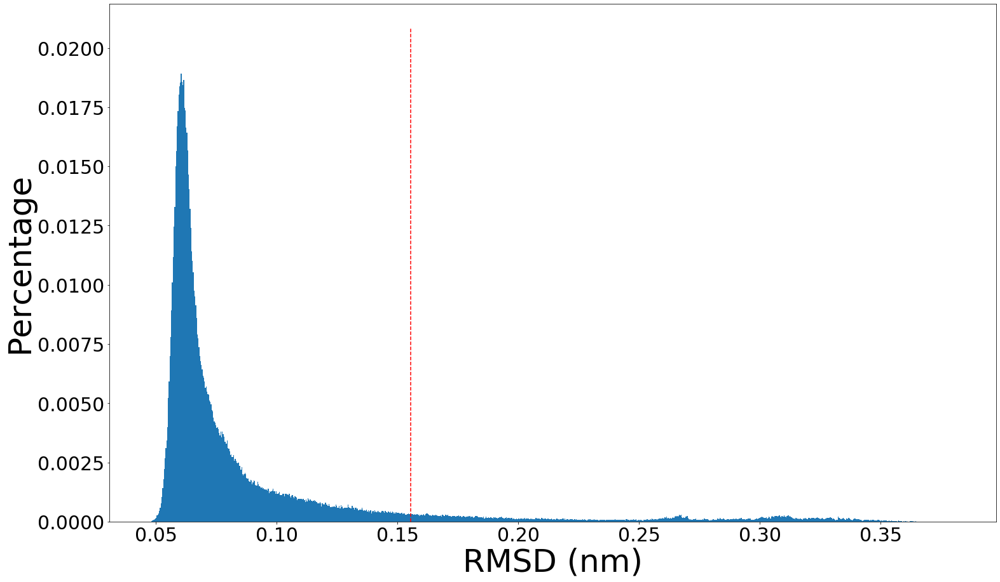

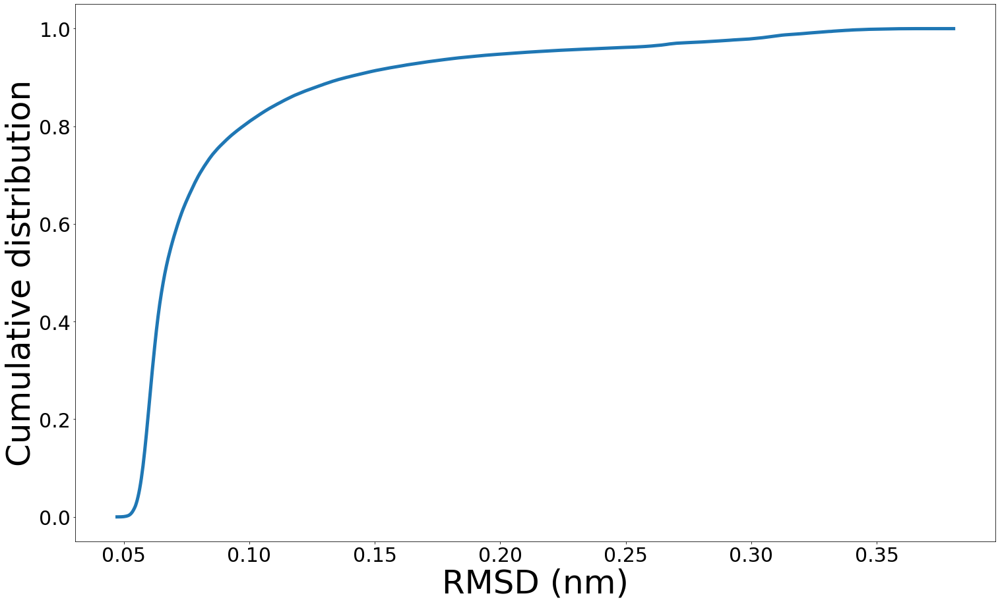

18 / 80 COMPLETE
534743
0
2640
12000
16000
20000
24000
28000
32000
36000
40009


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534193
RMSD_r = 1.03e-01 (nm)
RMSD_train = 1.28e-01 (nm)
0.39964734257694284


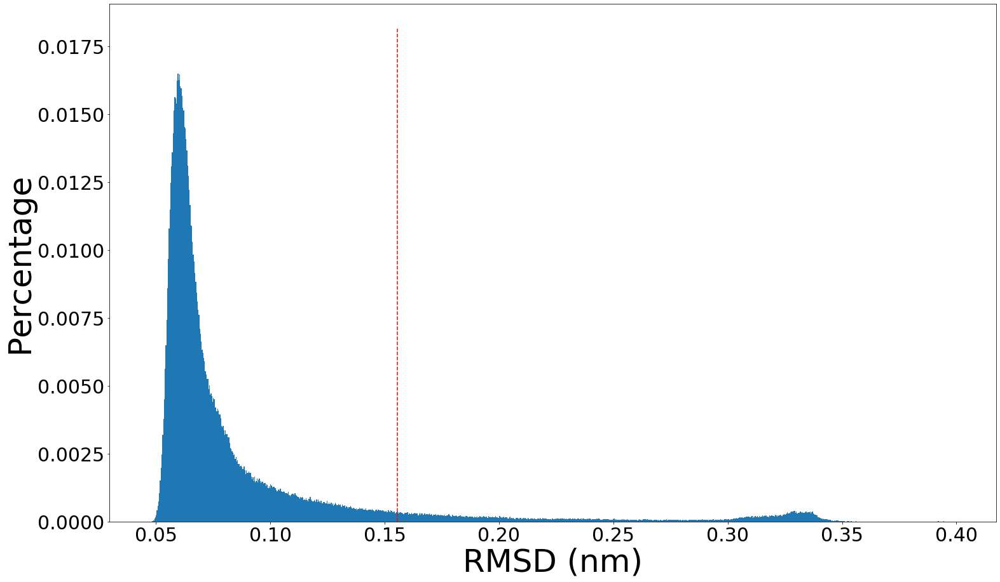

RMSD_r = 1.02e-01 (nm)
0.36895246520667224


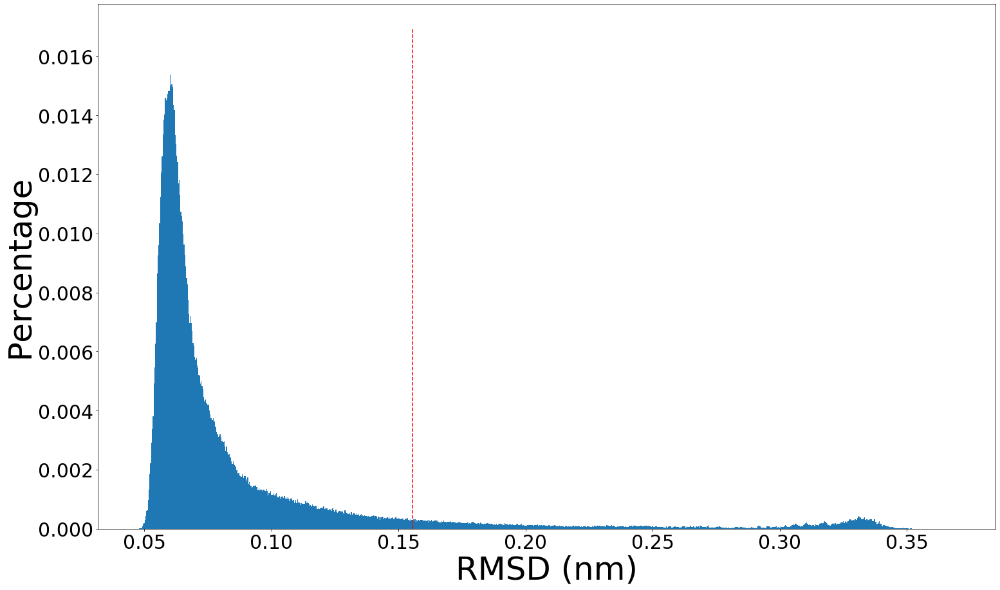

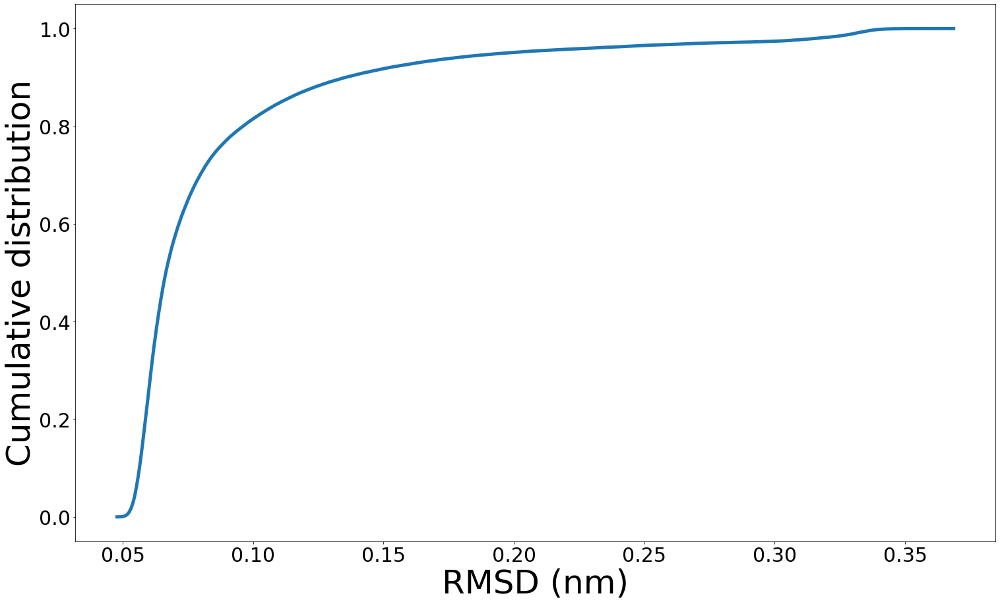

19 / 80 COMPLETE
534743
0
2640
12000
16000
20000
24000
28000
32000
36000
40009


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534193
RMSD_r = 1.03e-01 (nm)
RMSD_train = 1.30e-01 (nm)
0.42526576304459074


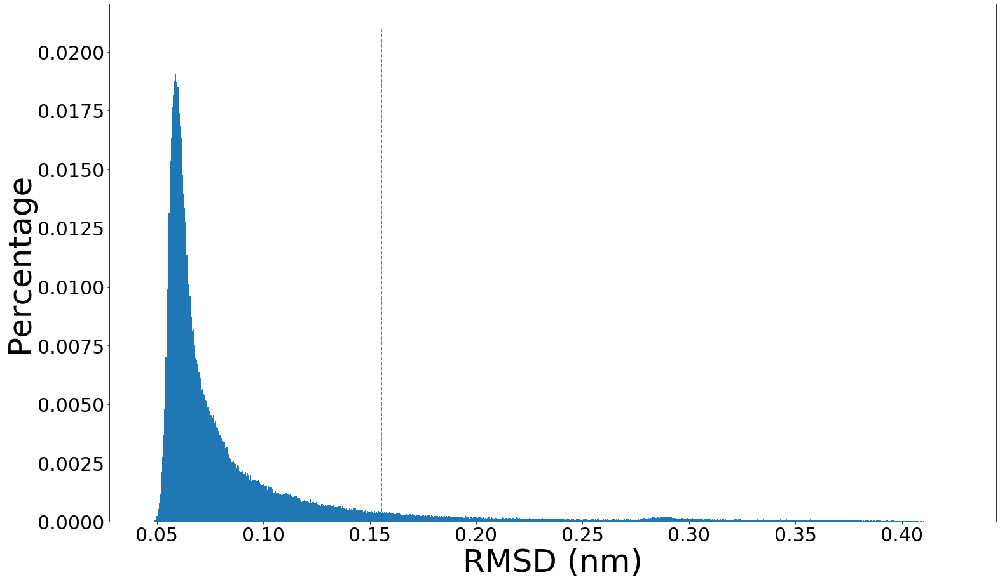

RMSD_r = 1.02e-01 (nm)
0.41112123085975477


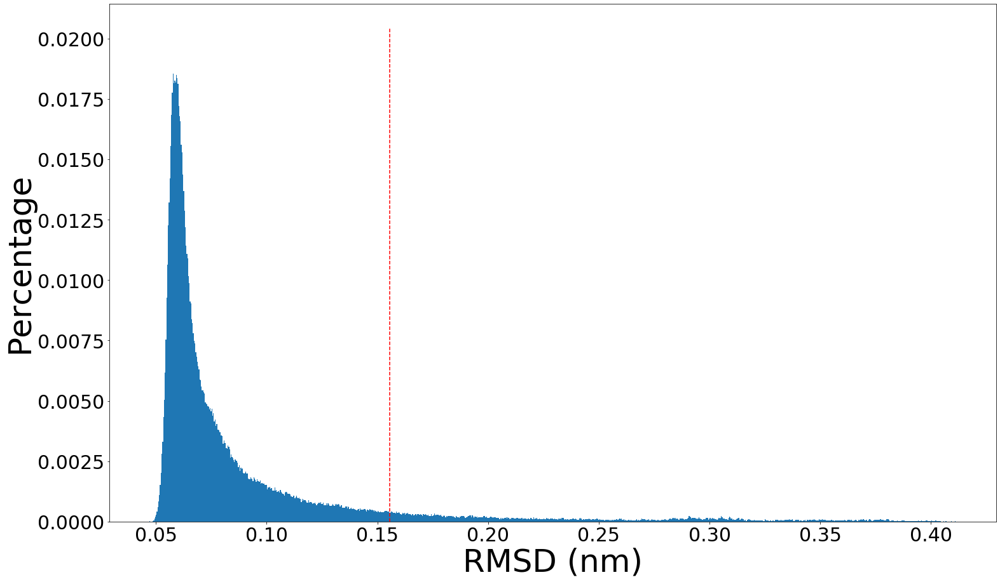

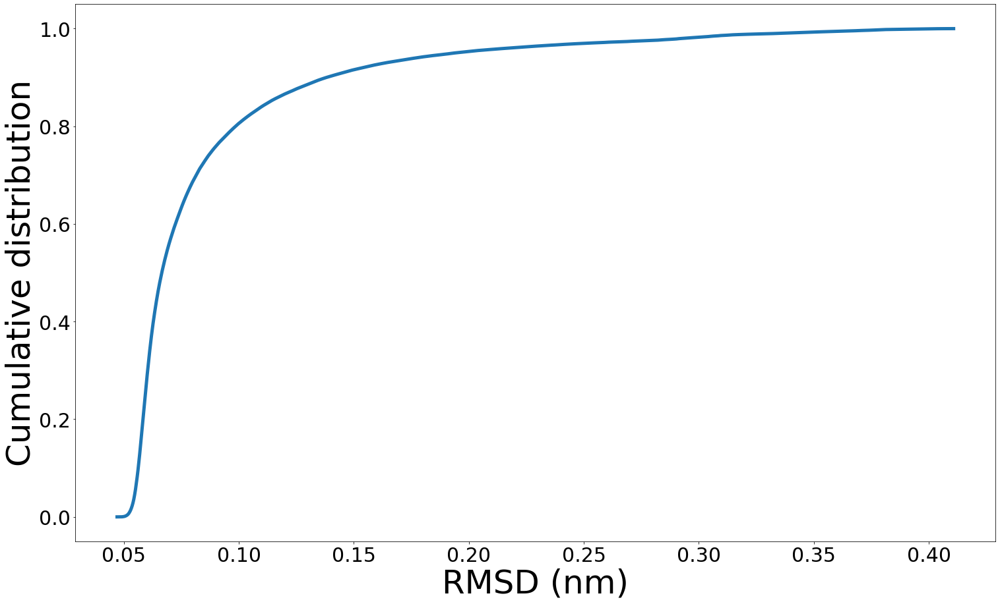

20 / 80 COMPLETE
534743
0
4004
6000
8001
10001
12001
14010
16000
18009
20002


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534732
RMSD_r = 1.34e-01 (nm)
RMSD_train = 2.05e-01 (nm)
0.5341408266741078


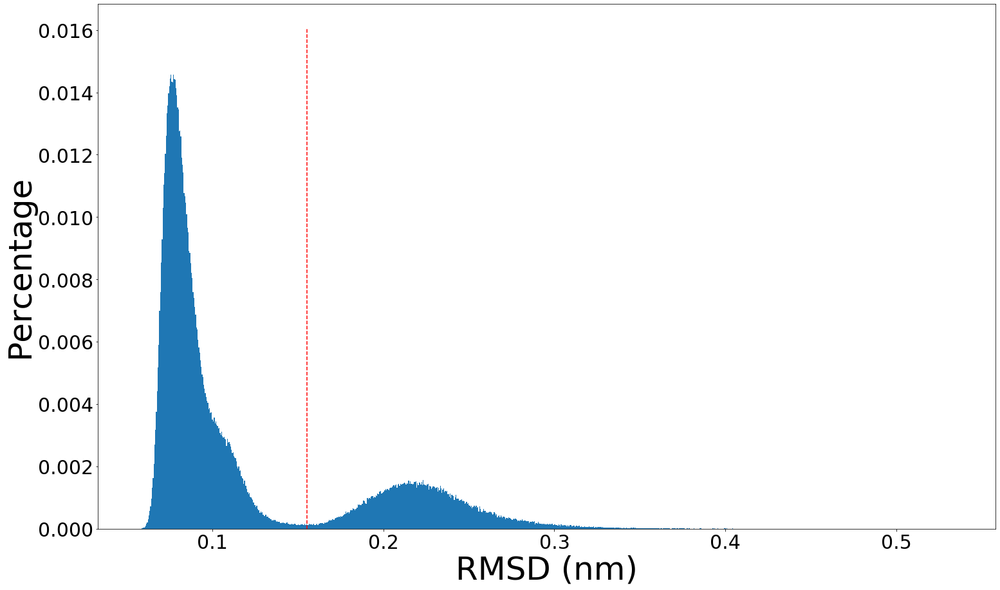

RMSD_r = 1.34e-01 (nm)
0.5341408266741078


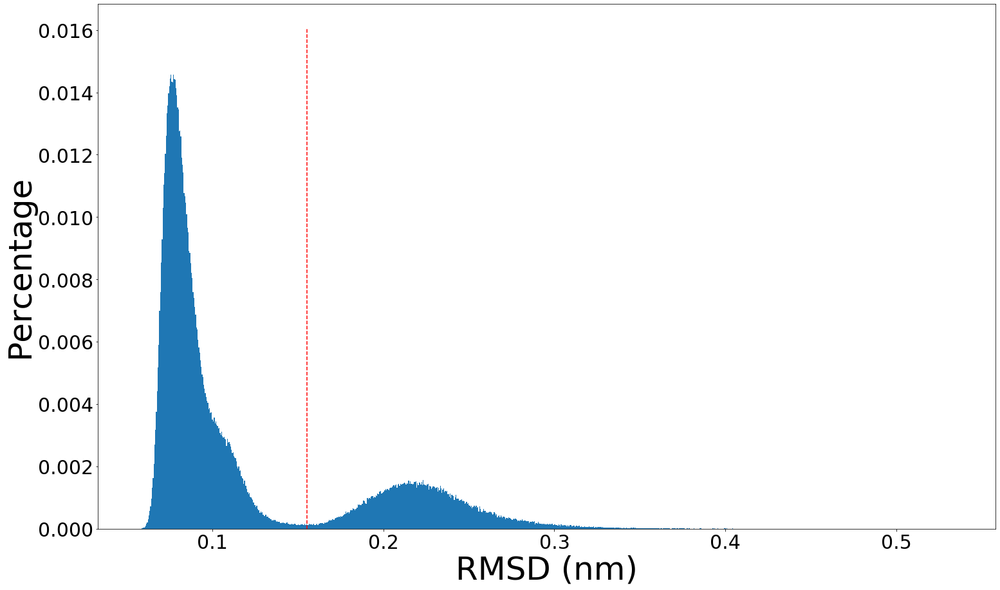

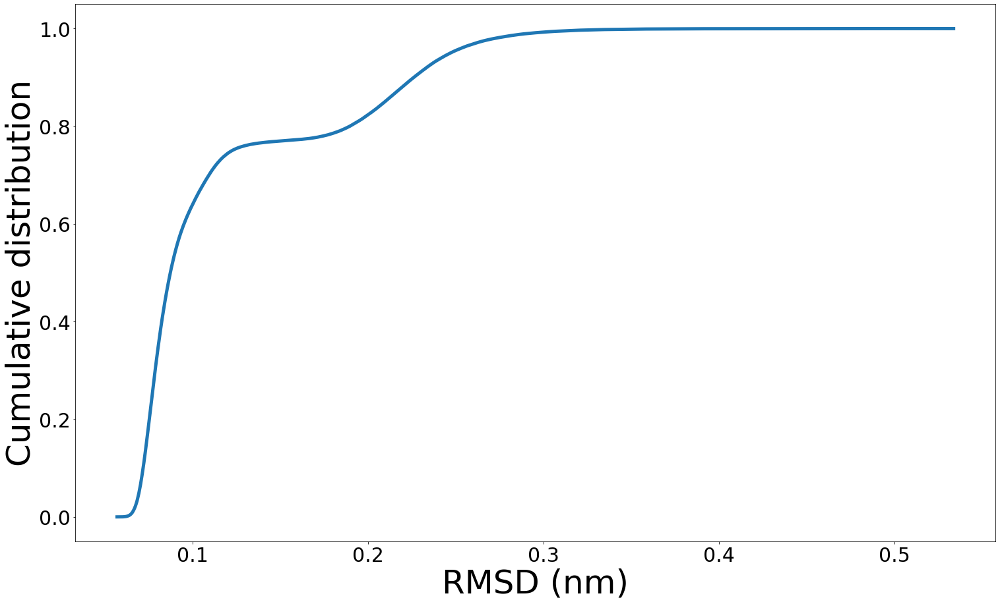

21 / 80 COMPLETE
534743
0
4004
6000
8001
10001
12001
14010
16000
18009
20002


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534732
RMSD_r = 1.34e-01 (nm)
RMSD_train = 2.05e-01 (nm)
0.5324734269337447


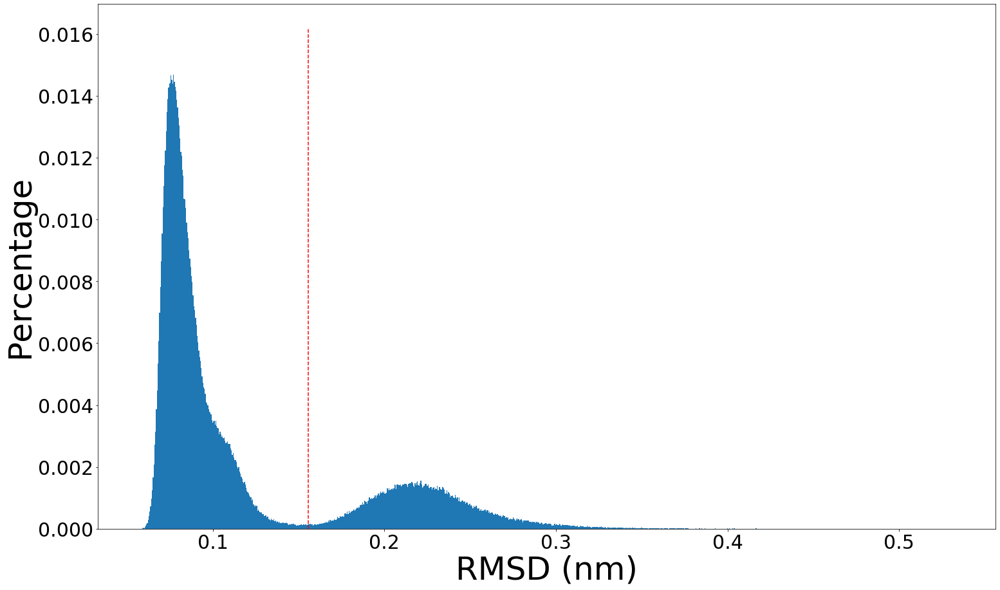

RMSD_r = 1.34e-01 (nm)
0.5324734269337447


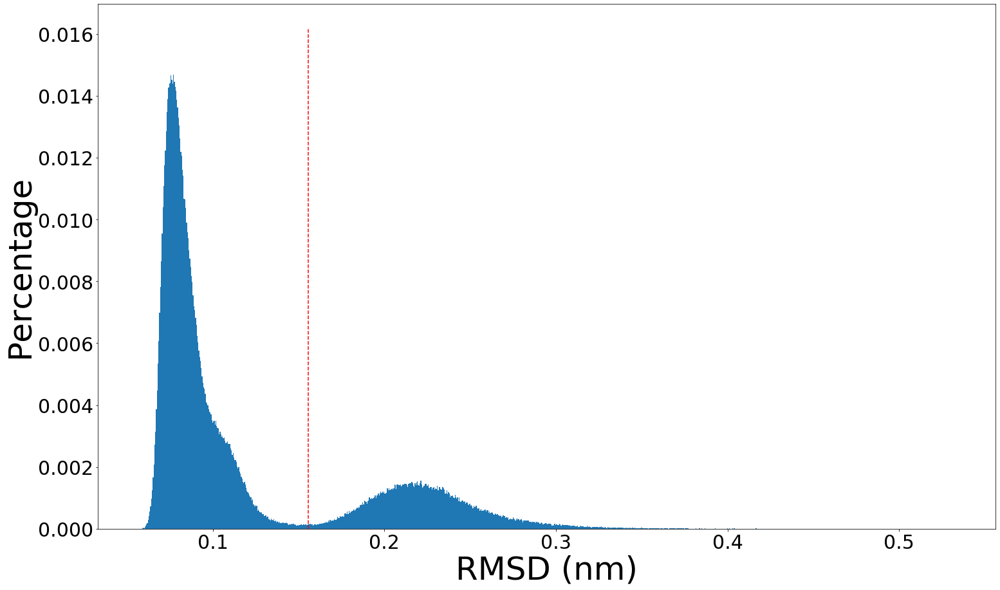

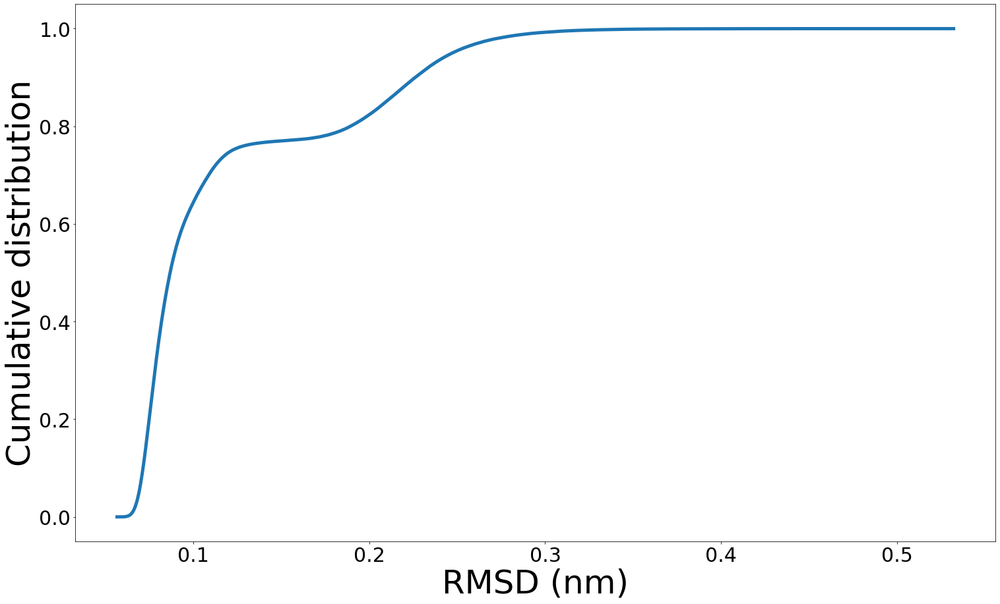

22 / 80 COMPLETE
534743
0
4004
6000
8001
10001
12001
14010
16000
18009
20002


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534732
RMSD_r = 1.33e-01 (nm)
RMSD_train = 2.05e-01 (nm)
0.5288811988042429


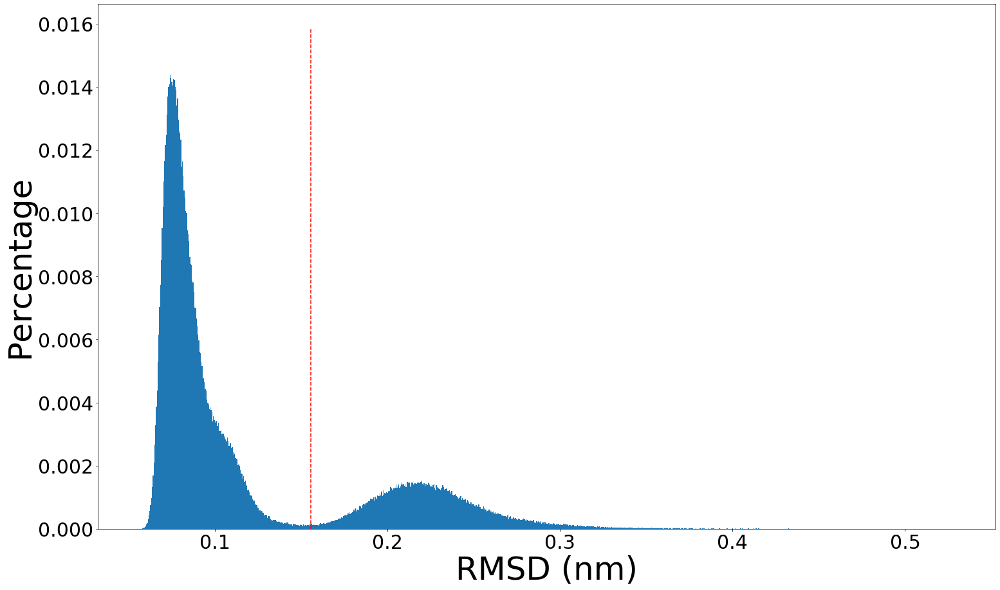

RMSD_r = 1.33e-01 (nm)
0.5288811988042429


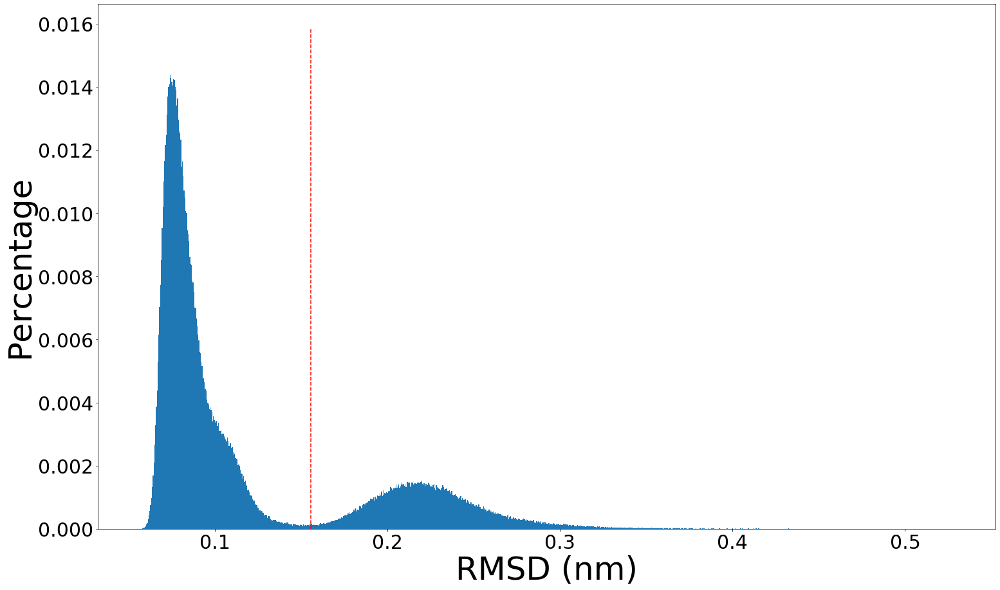

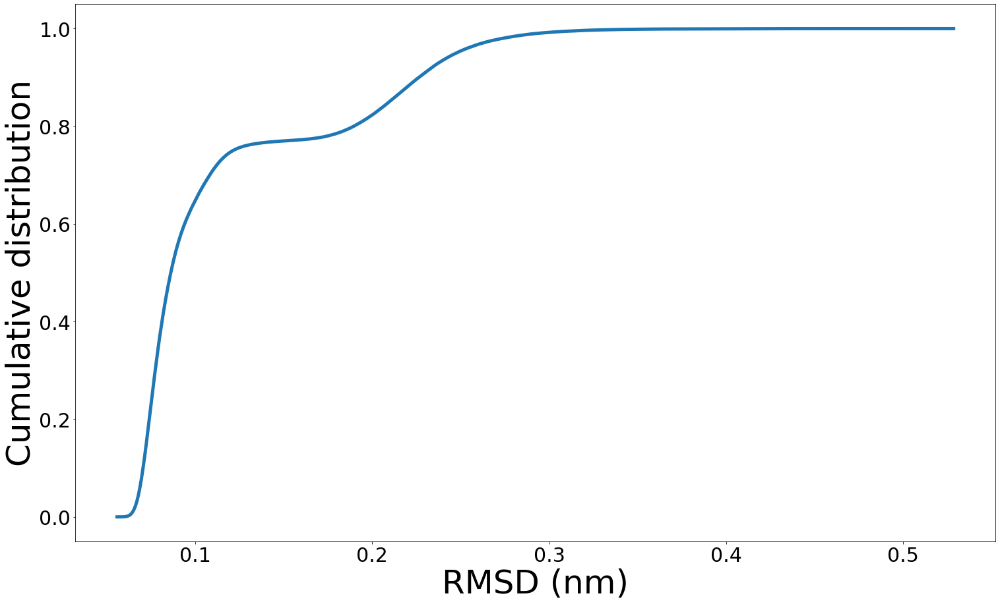

23 / 80 COMPLETE
534743
0
4004
6000
8001
10001
12001
14010
16000
18009
20002


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534732
RMSD_r = 2.52e-01 (nm)
RMSD_train = 2.53e-01 (nm)
0.4082594042844703


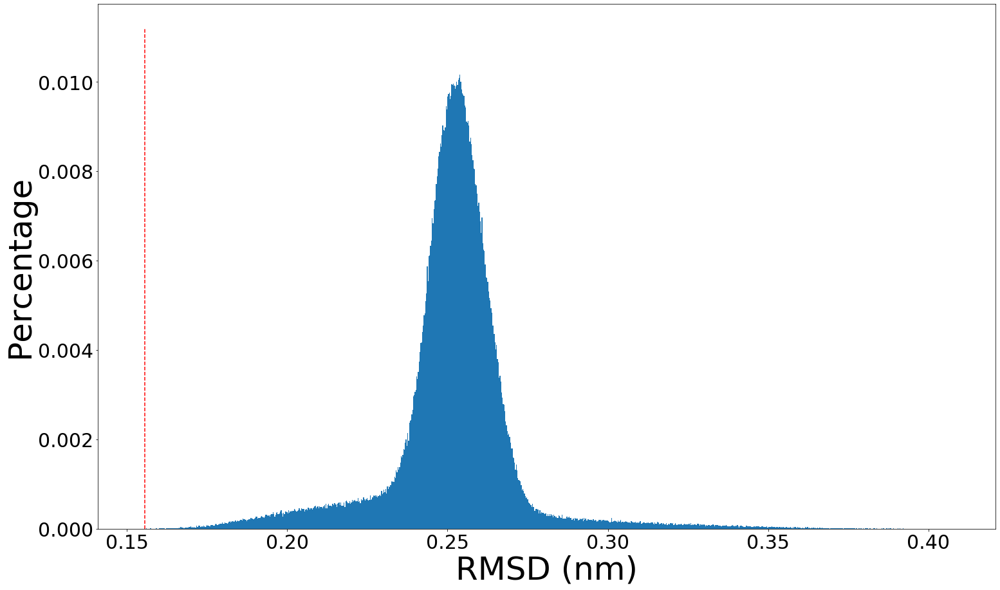

RMSD_r = 2.52e-01 (nm)
0.4082594042844703


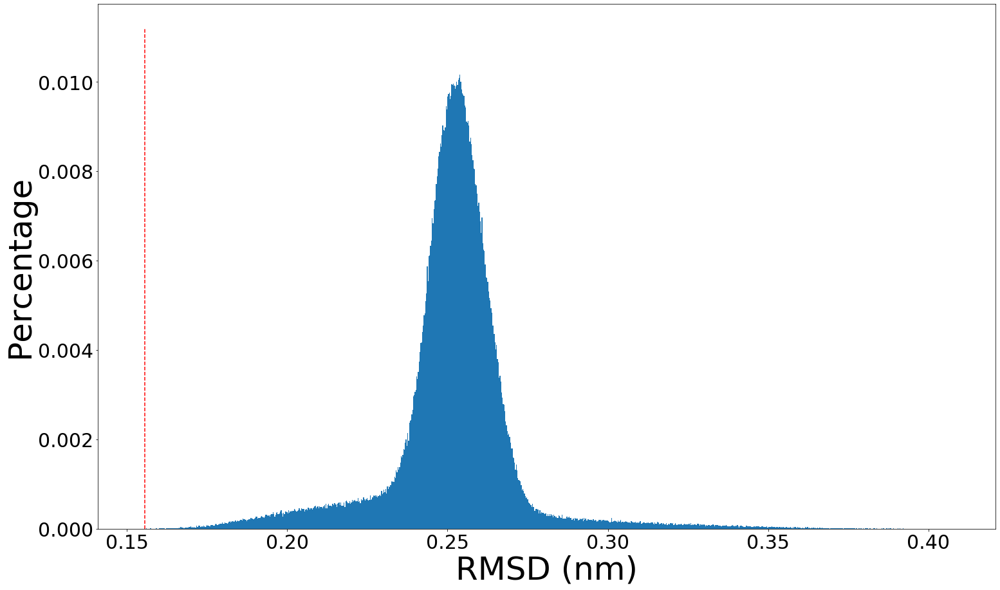

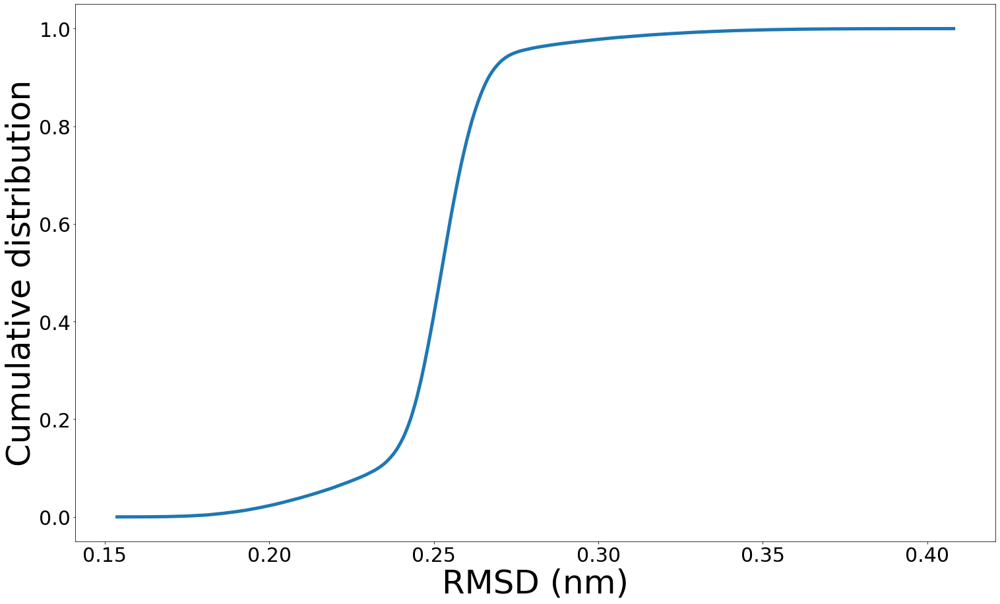

24 / 80 COMPLETE
534743
0
3922
6000
8000
10002
12007
14003
16000
18003
20002


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534688
RMSD_r = 1.13e-01 (nm)
RMSD_train = 1.49e-01 (nm)
0.3897148859174524


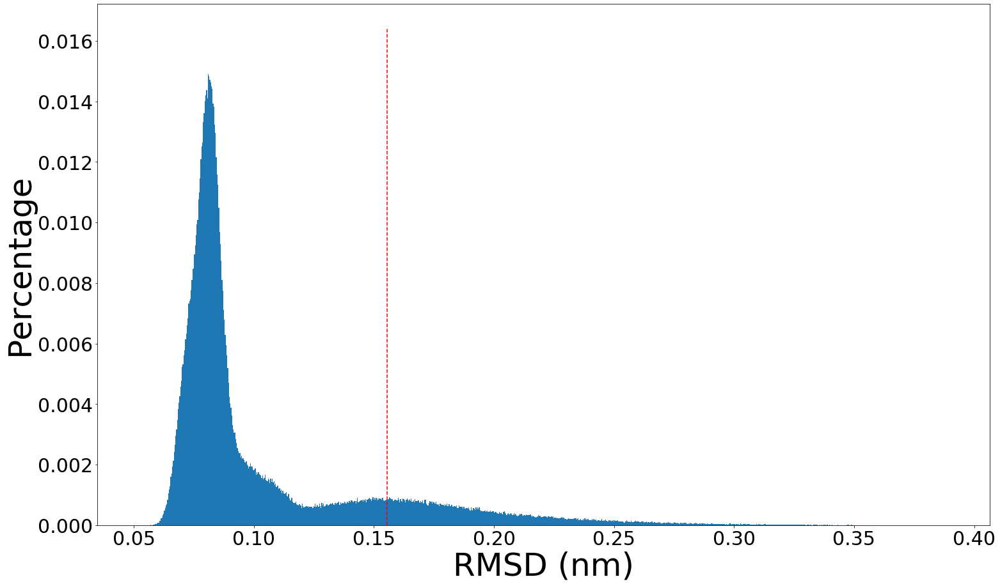

RMSD_r = 1.12e-01 (nm)
0.39120371959413697


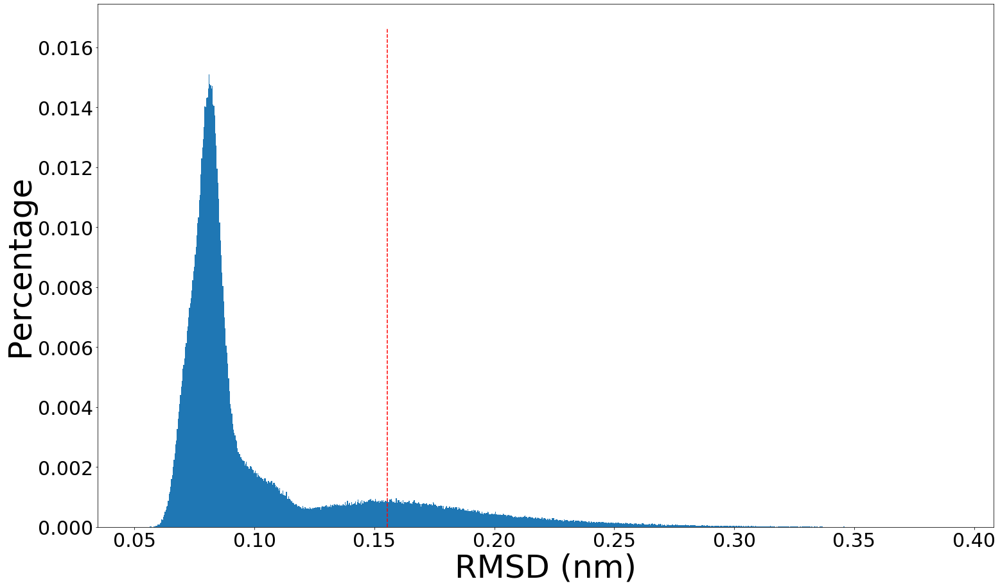

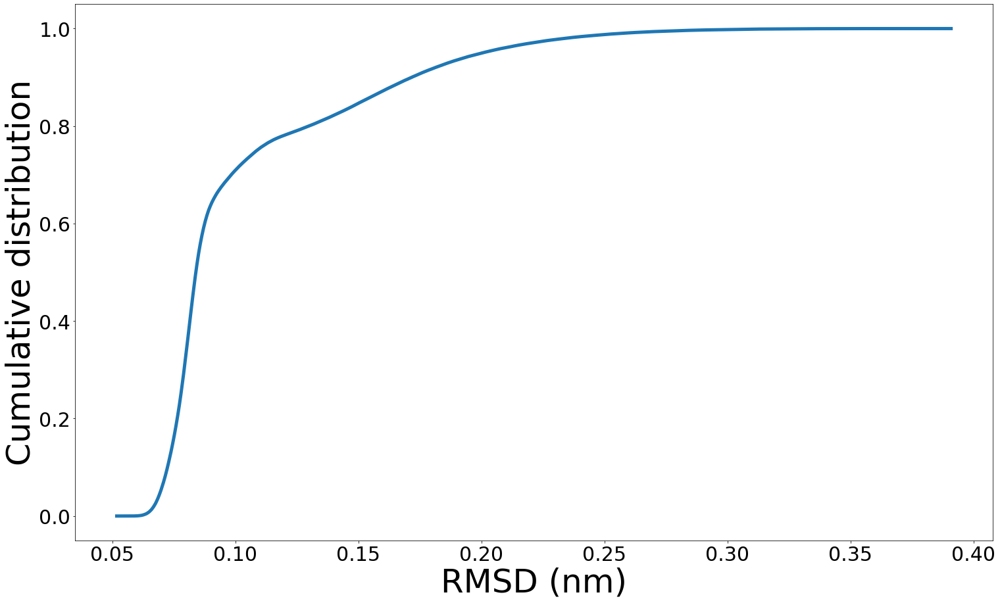

25 / 80 COMPLETE
534743
0
3922
6000
8000
10002
12007
14003
16000
18003
20002


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534688
RMSD_r = 1.13e-01 (nm)
RMSD_train = 1.49e-01 (nm)
0.39555211254540307


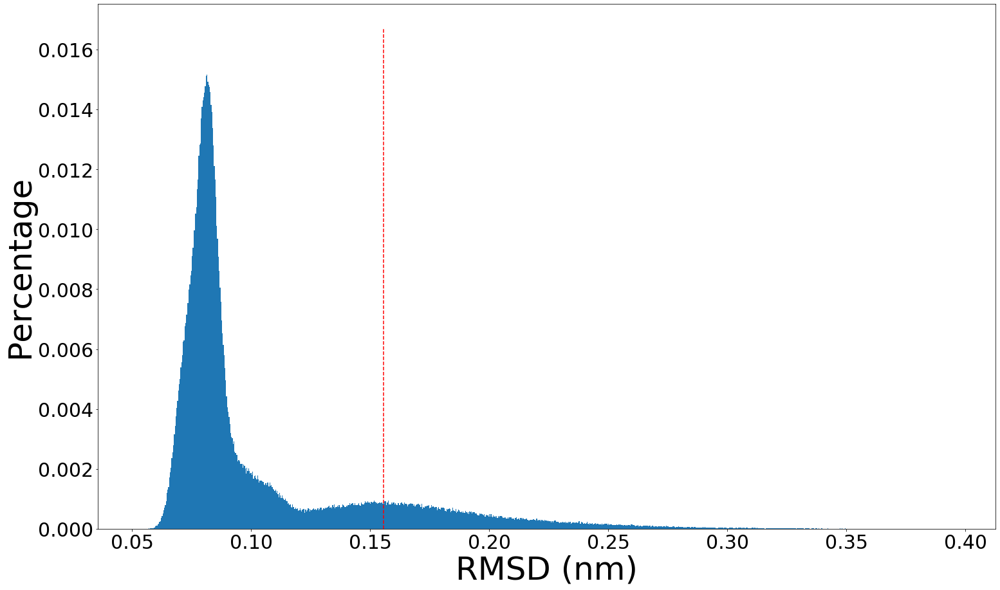

RMSD_r = 1.12e-01 (nm)
0.3983685031856017


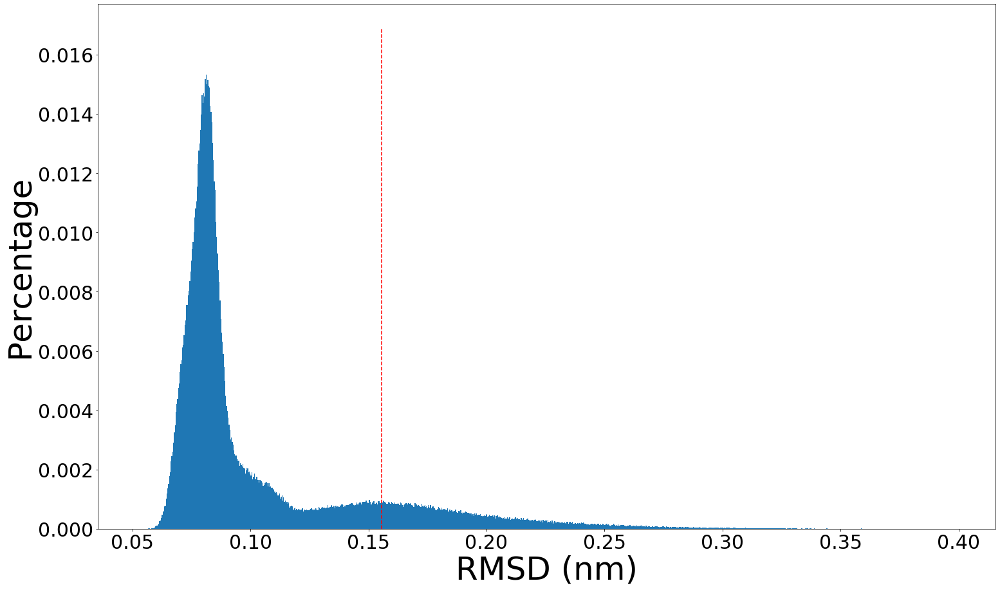

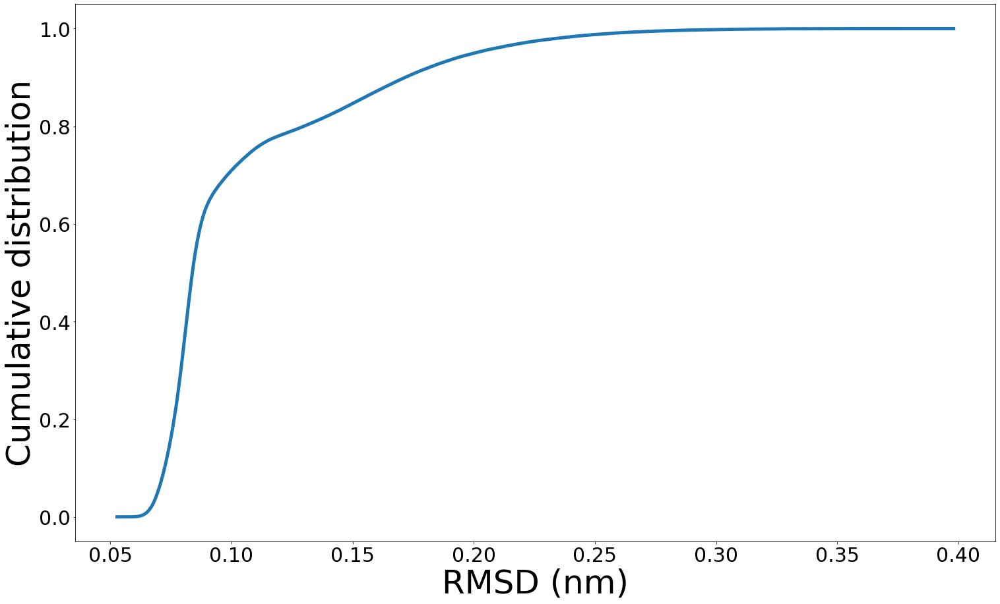

26 / 80 COMPLETE
534743
0
3922
6000
8000
10002
12007
14003
16000
18003
20002


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534688
RMSD_r = 1.13e-01 (nm)
RMSD_train = 1.49e-01 (nm)
0.43455763794635527


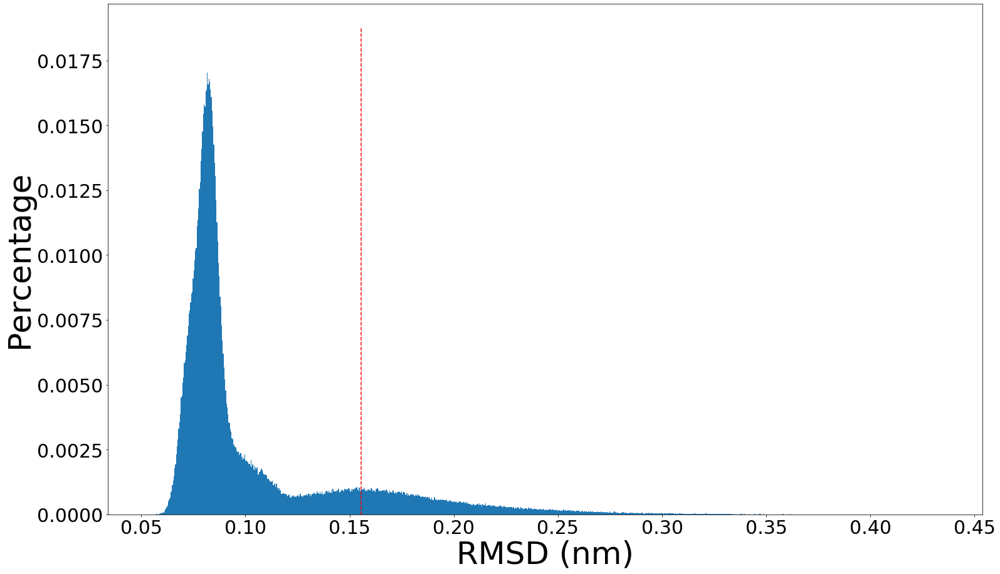

RMSD_r = 1.13e-01 (nm)
0.4257653577421769


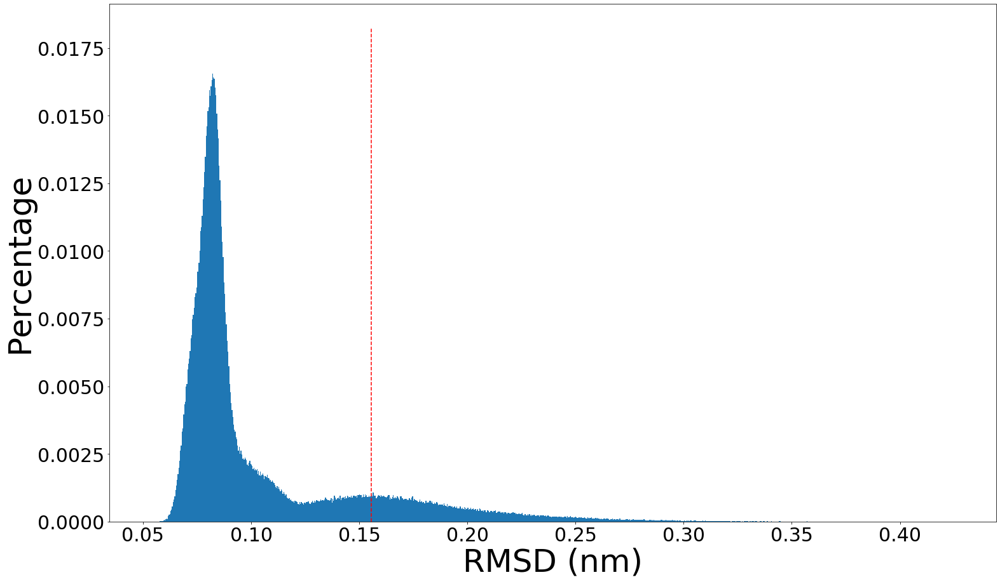

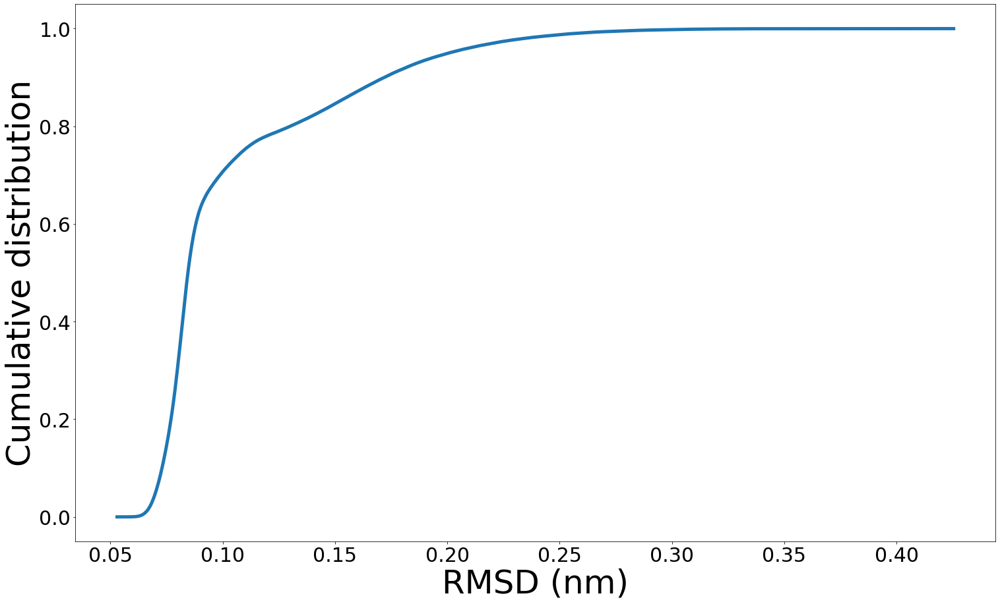

27 / 80 COMPLETE
534743
0
3922
6000
8000
10002
12007
14003
16000
18003
20002


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534688
RMSD_r = 1.13e-01 (nm)
RMSD_train = 1.50e-01 (nm)
0.4781652961356296


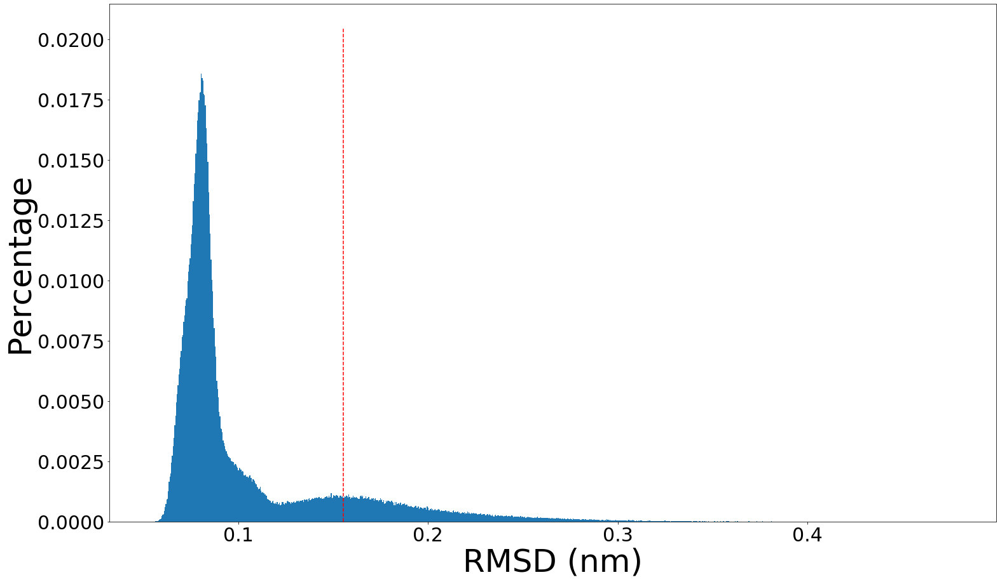

RMSD_r = 1.13e-01 (nm)
0.45471858185778363


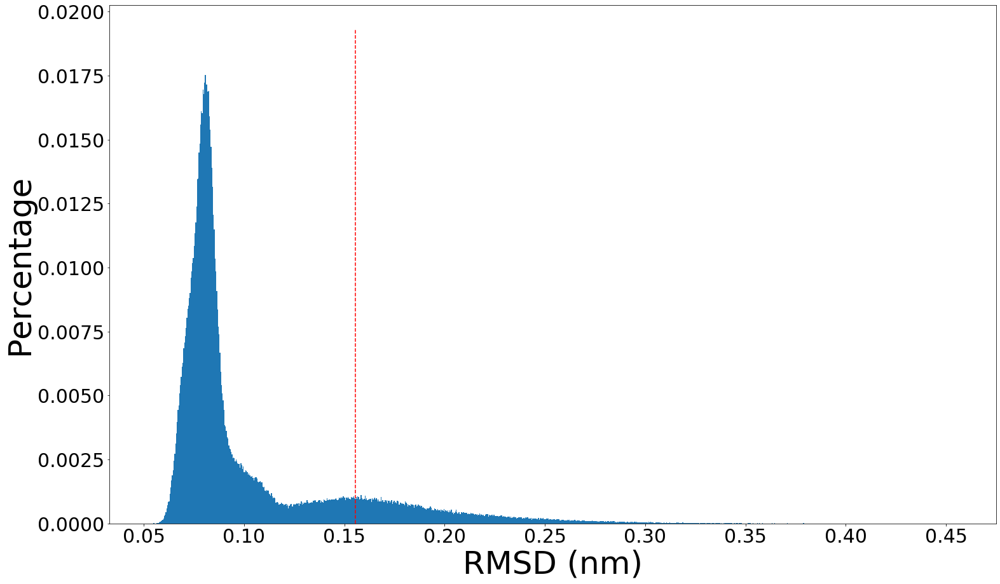

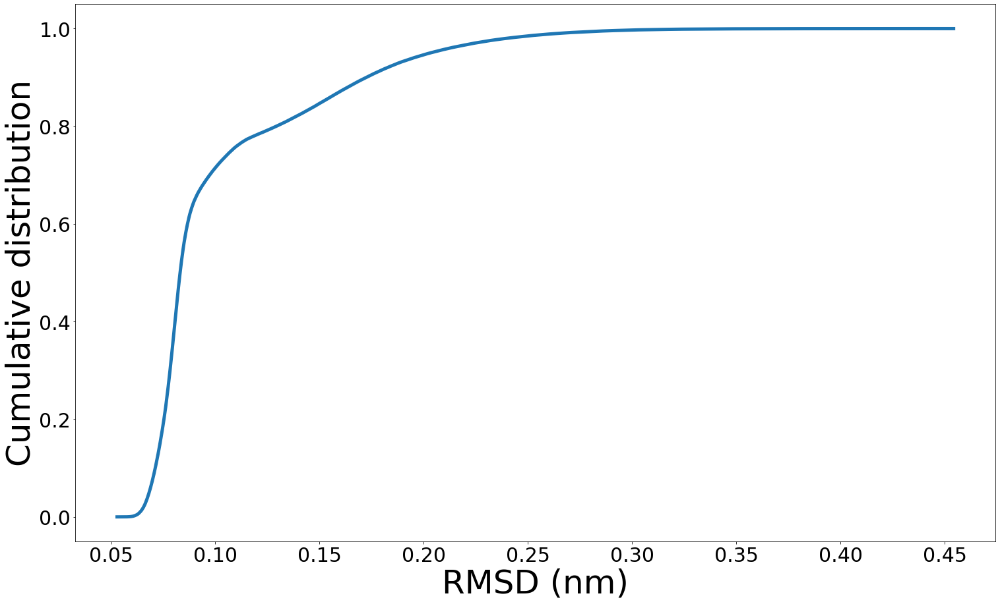

28 / 80 COMPLETE
534743
0
2581
6000
8009
10006
12000
14000
16000
18003
20000


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534633
RMSD_r = 1.09e-01 (nm)
RMSD_train = 1.31e-01 (nm)
0.4052167608093309


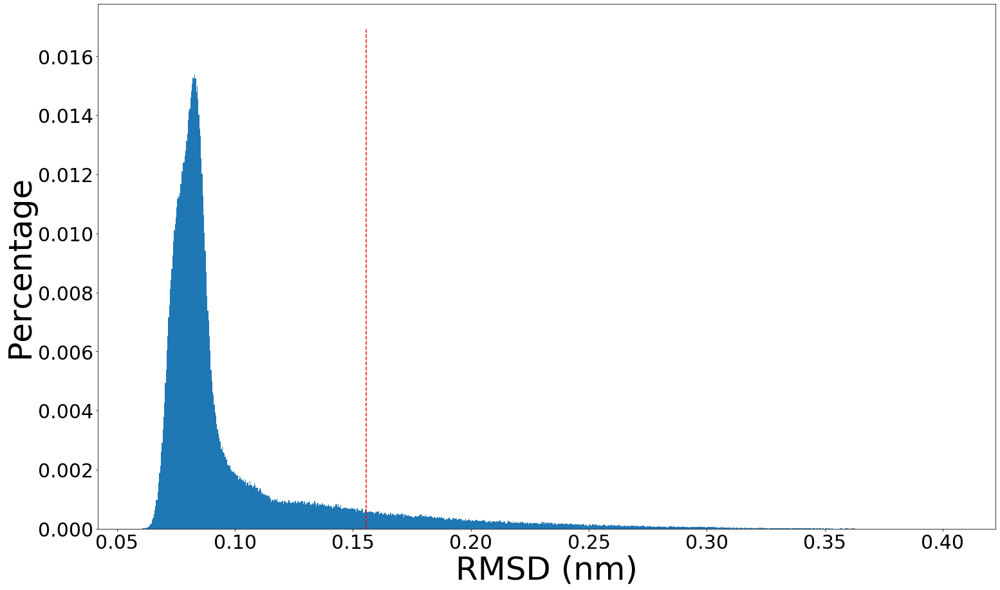

RMSD_r = 1.08e-01 (nm)
0.4052167608093309


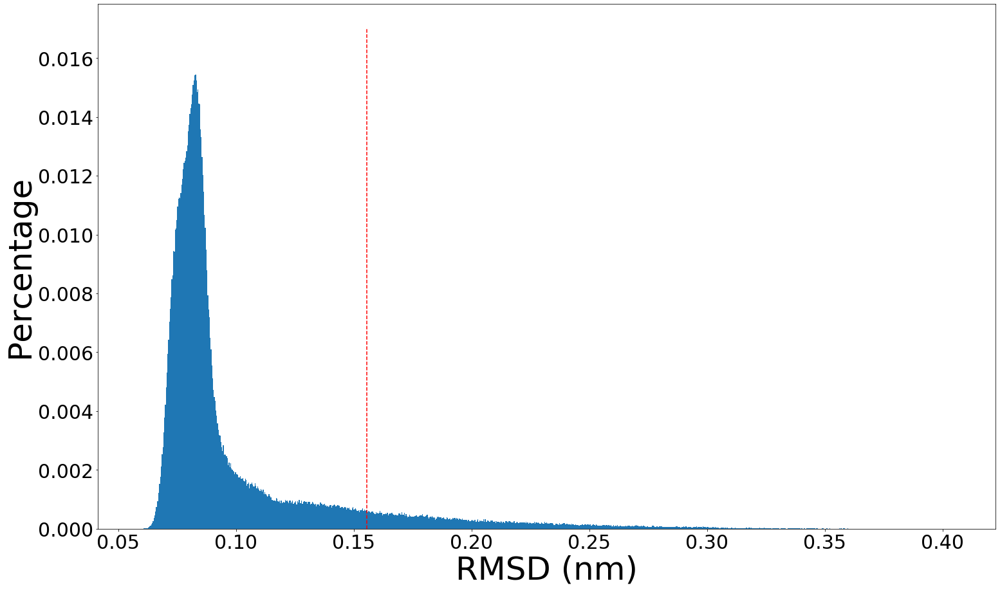

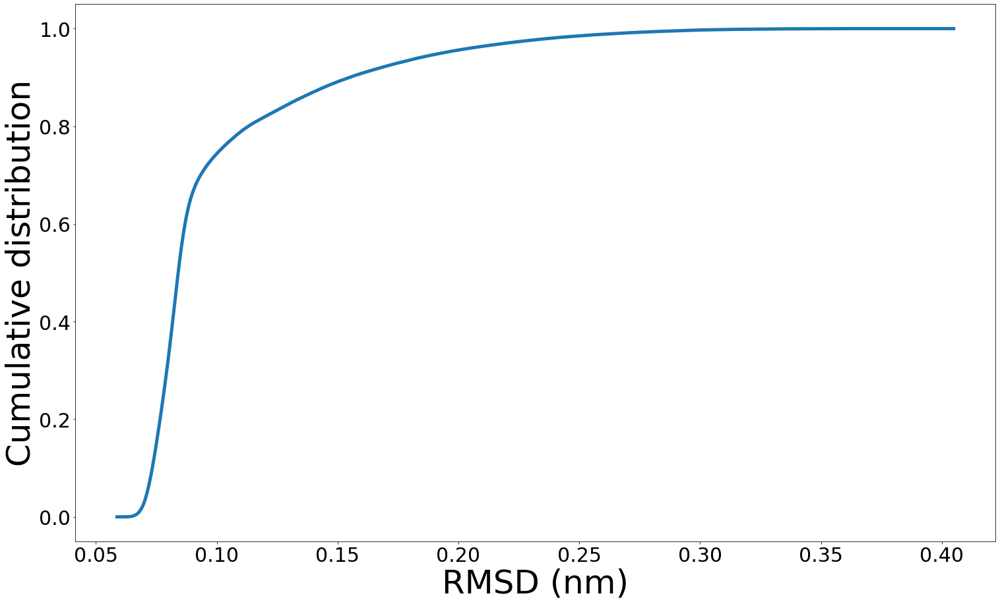

29 / 80 COMPLETE
534743
0
2581
6000
8009
10006
12000
14000
16000
18003
20000


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534633
RMSD_r = 1.10e-01 (nm)
RMSD_train = 1.31e-01 (nm)
0.393507769597633


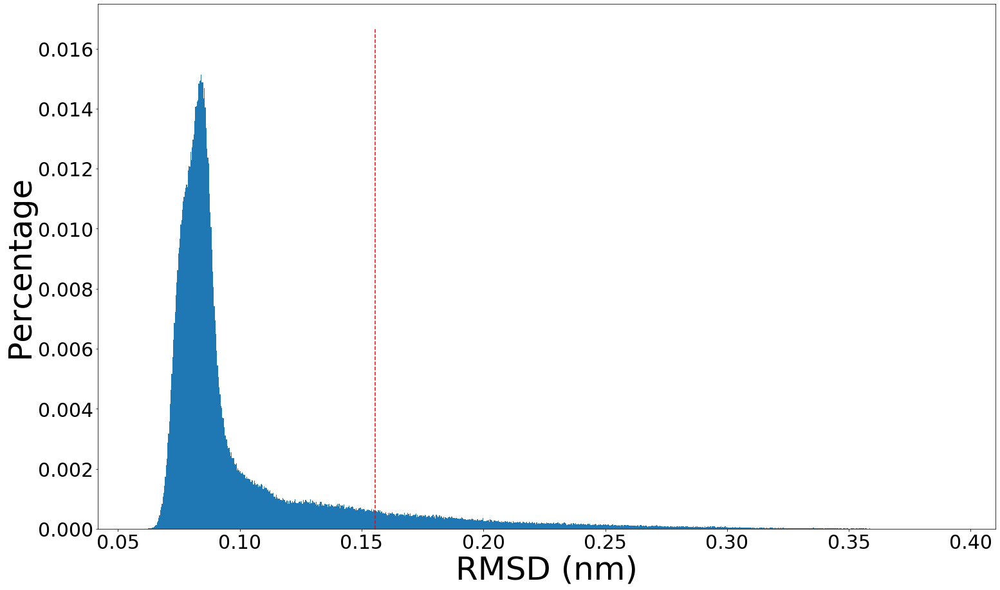

RMSD_r = 1.09e-01 (nm)
0.393507769597633


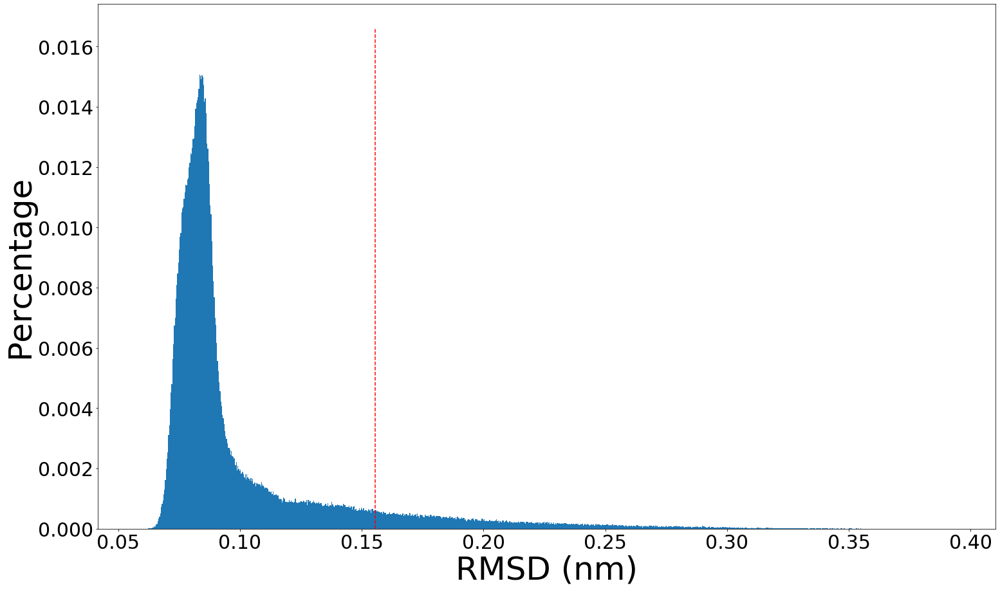

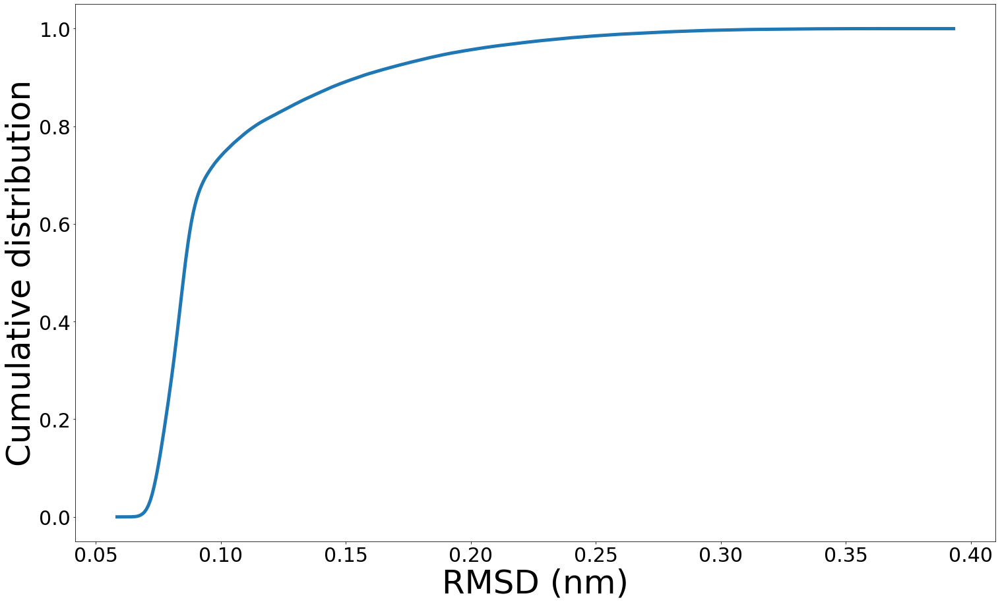

30 / 80 COMPLETE
534743
0
2581
6000
8009
10006
12000
14000
16000
18003
20000


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534633
RMSD_r = 1.10e-01 (nm)
RMSD_train = 1.31e-01 (nm)
0.40137091664424135


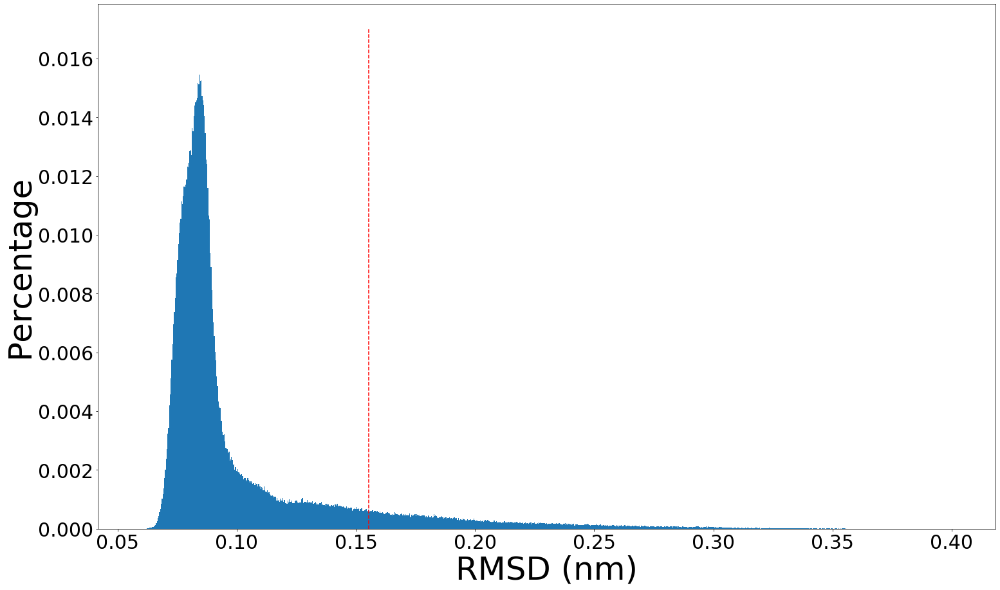

RMSD_r = 1.09e-01 (nm)
0.3904643093094263


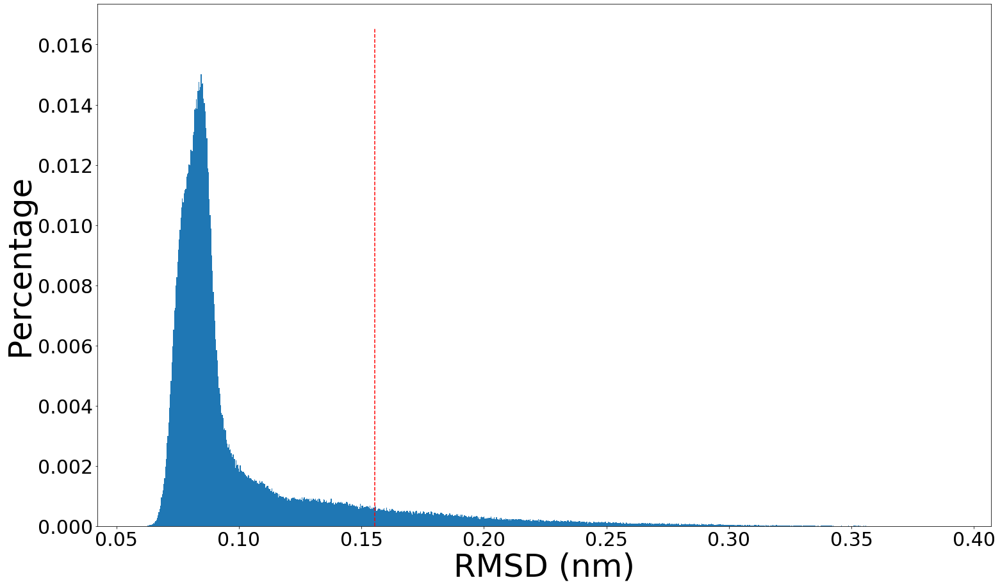

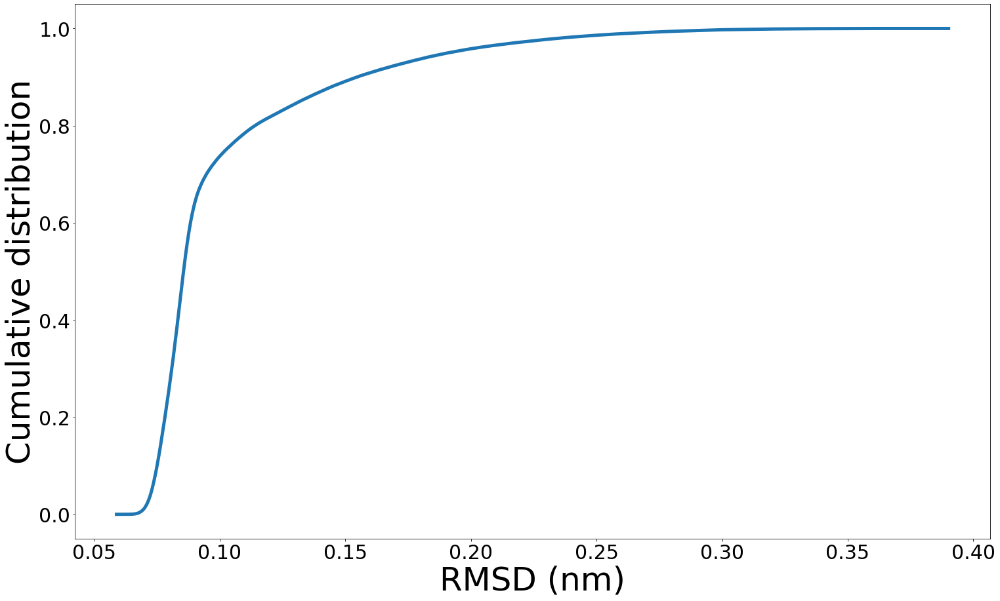

31 / 80 COMPLETE
534743
0
2581
6000
8009
10006
12000
14000
16000
18003
20000


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534633
RMSD_r = 1.10e-01 (nm)
RMSD_train = 1.32e-01 (nm)
0.4715991220882152


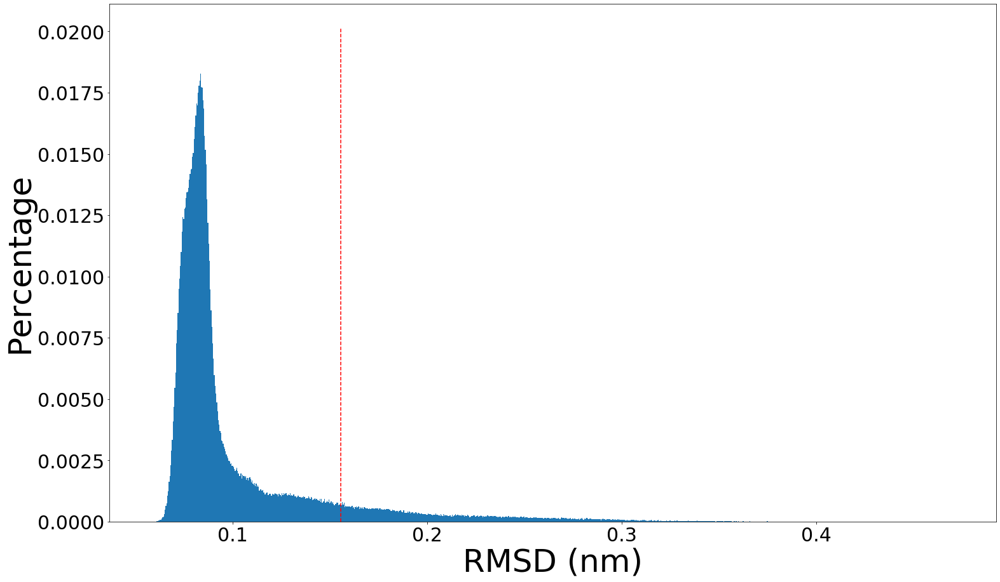

RMSD_r = 1.09e-01 (nm)
0.4702355381973123


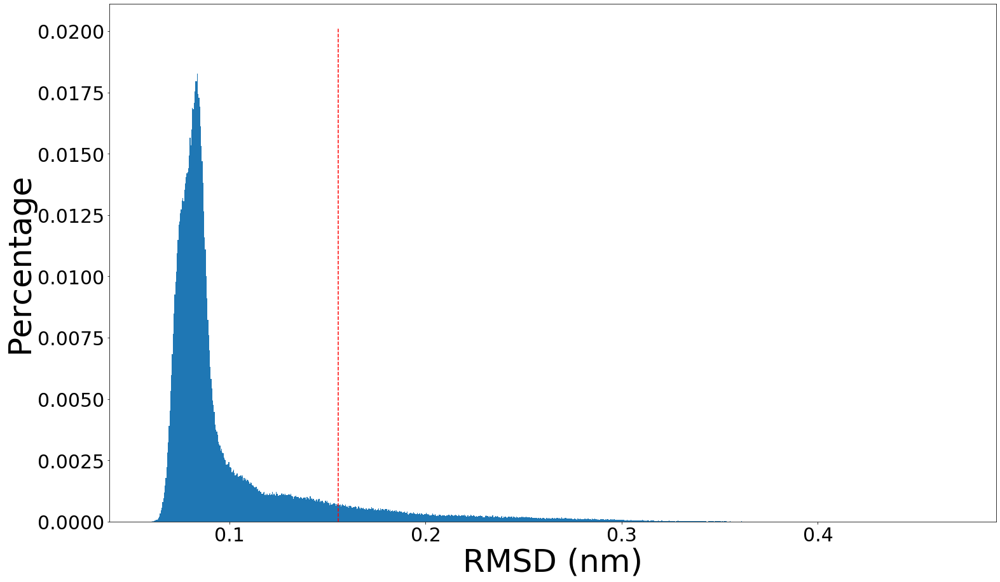

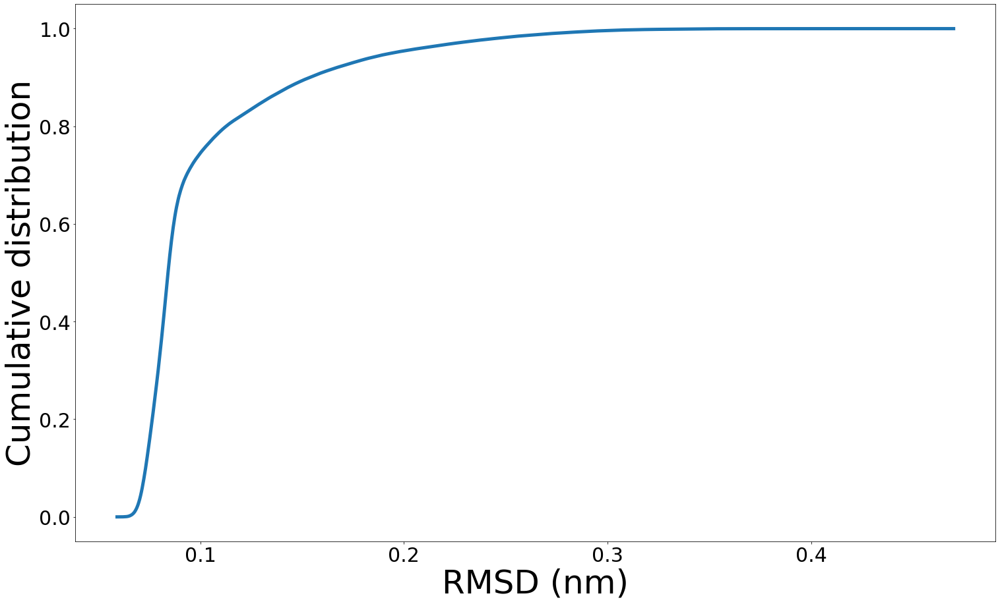

32 / 80 COMPLETE
534743
0
2252
6000
8000
10000
12000
14000
16005
18009
20000


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534468
RMSD_r = 9.93e-02 (nm)
RMSD_train = 1.26e-01 (nm)
0.3878899703391936


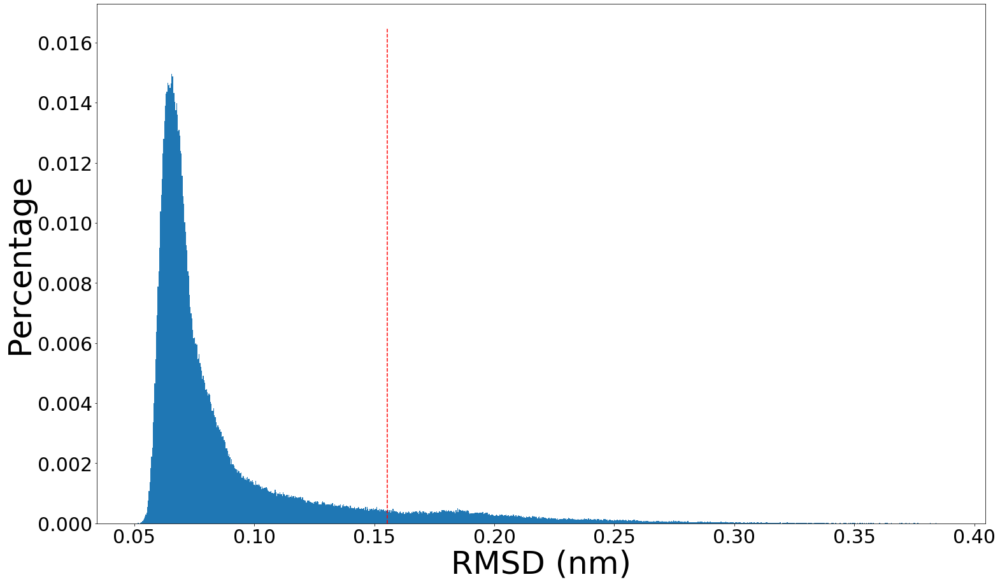

RMSD_r = 9.82e-02 (nm)
0.3805086056428634


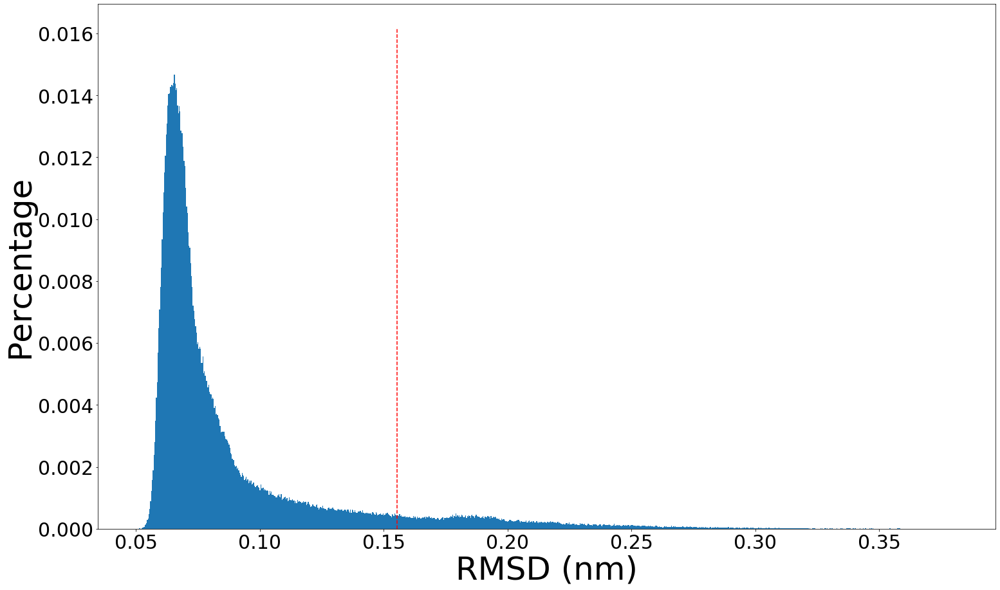

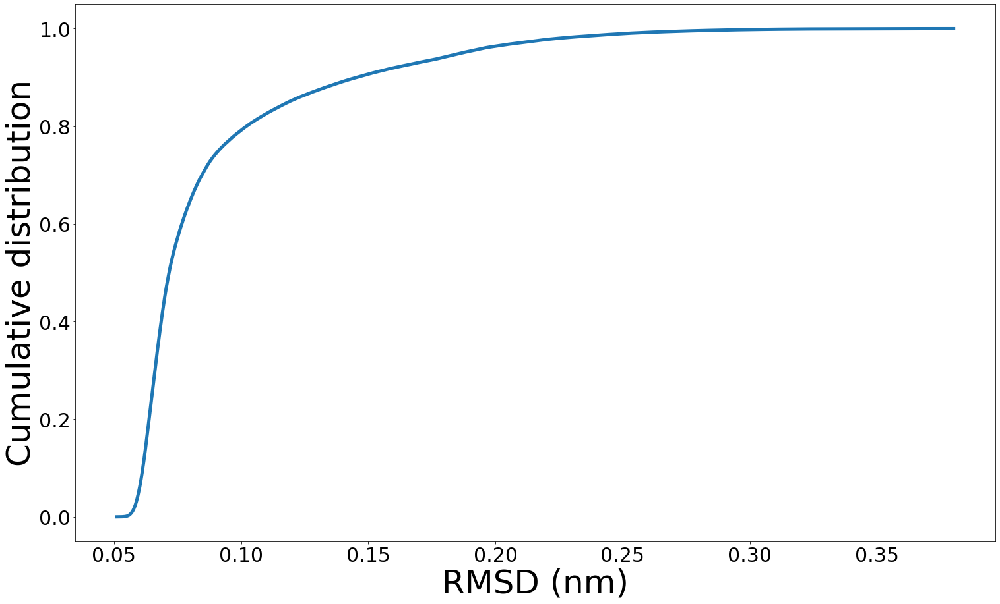

33 / 80 COMPLETE
534743
0
2252
6000
8000
10000
12000
14000
16005
18009
20000


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534468
RMSD_r = 9.94e-02 (nm)
RMSD_train = 1.26e-01 (nm)
0.39213673023167256


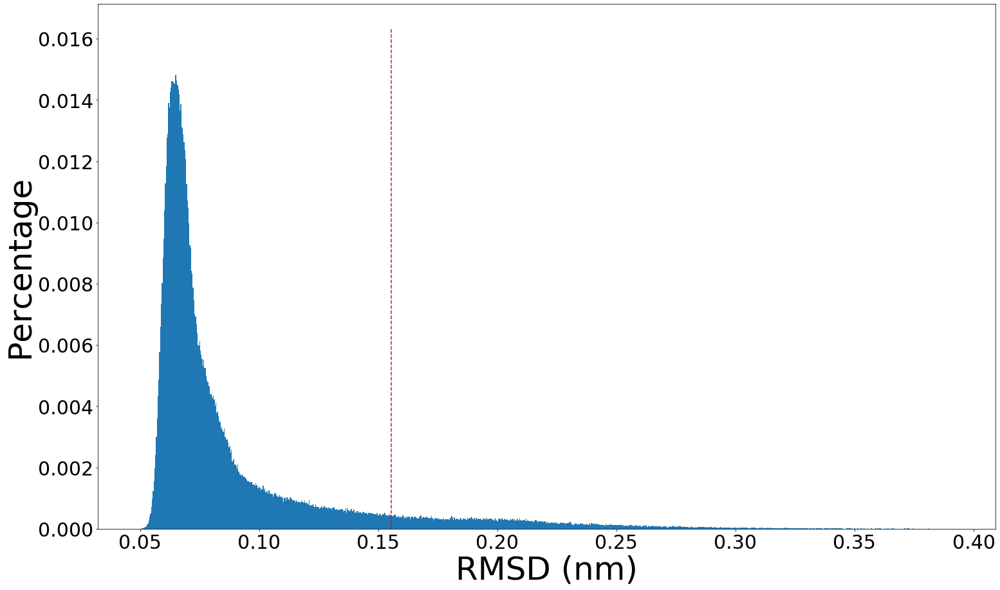

RMSD_r = 9.82e-02 (nm)
0.380947084798634


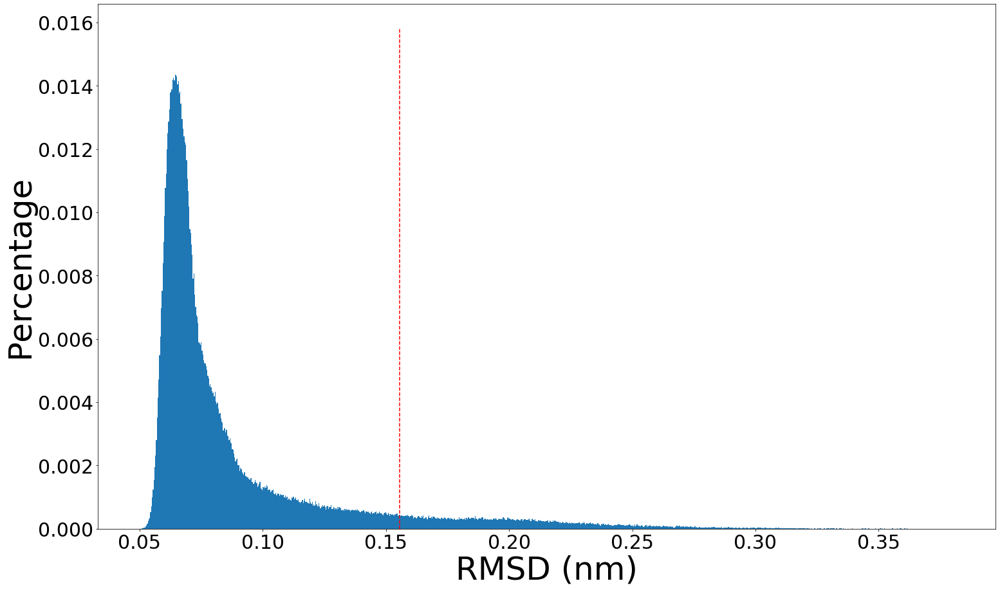

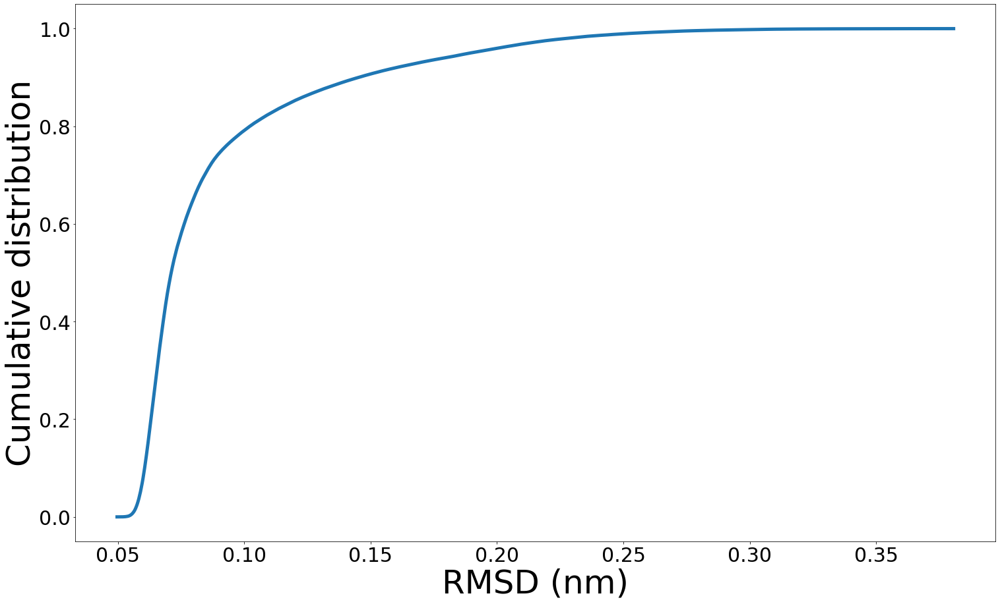

34 / 80 COMPLETE
534743
0
2252
6000
8000
10000
12000
14000
16005
18009
20000


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534468
RMSD_r = 1.00e-01 (nm)
RMSD_train = 1.27e-01 (nm)
0.39503256723416524


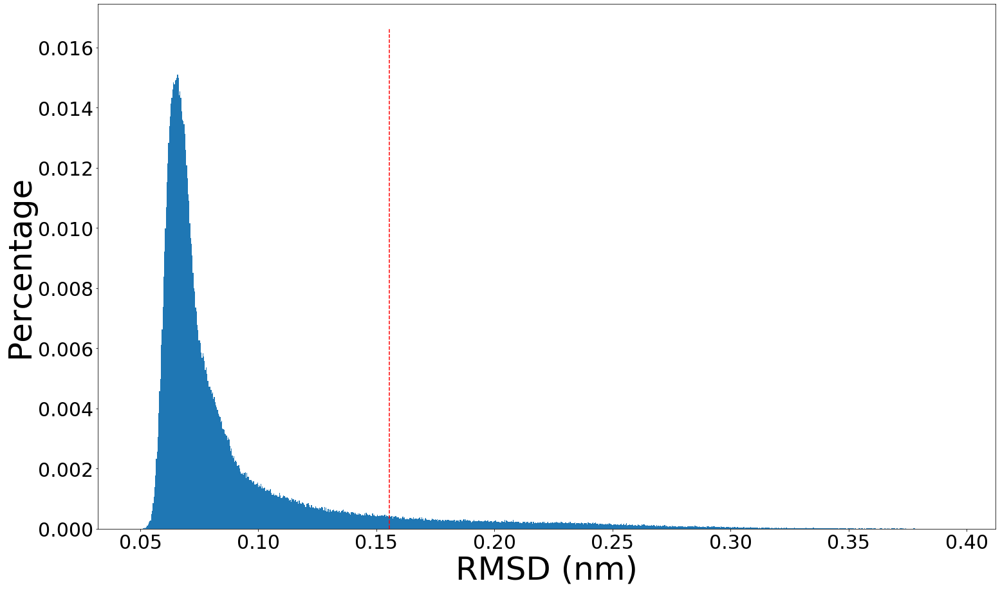

RMSD_r = 9.91e-02 (nm)
0.4017558496977336


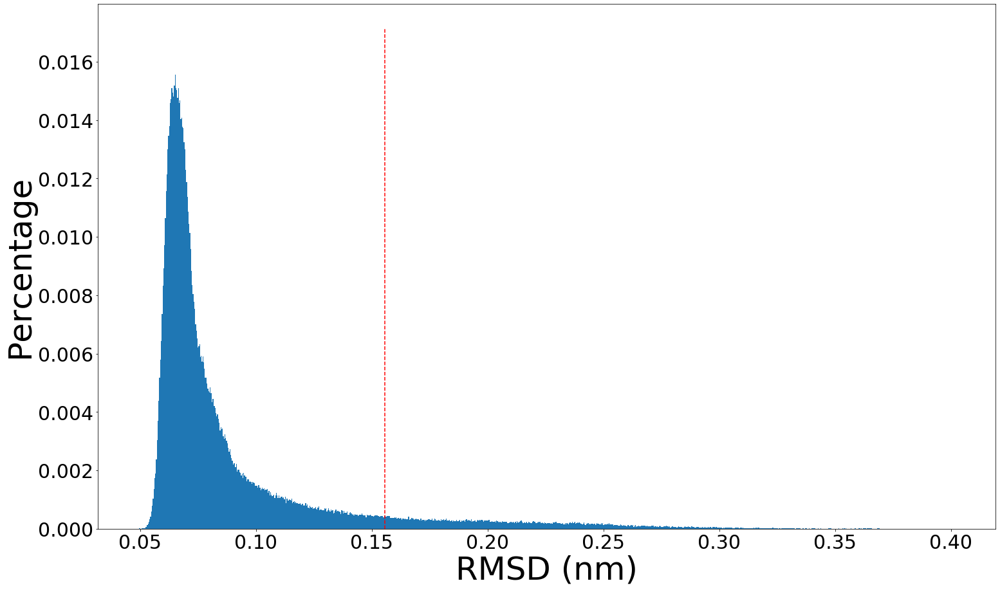

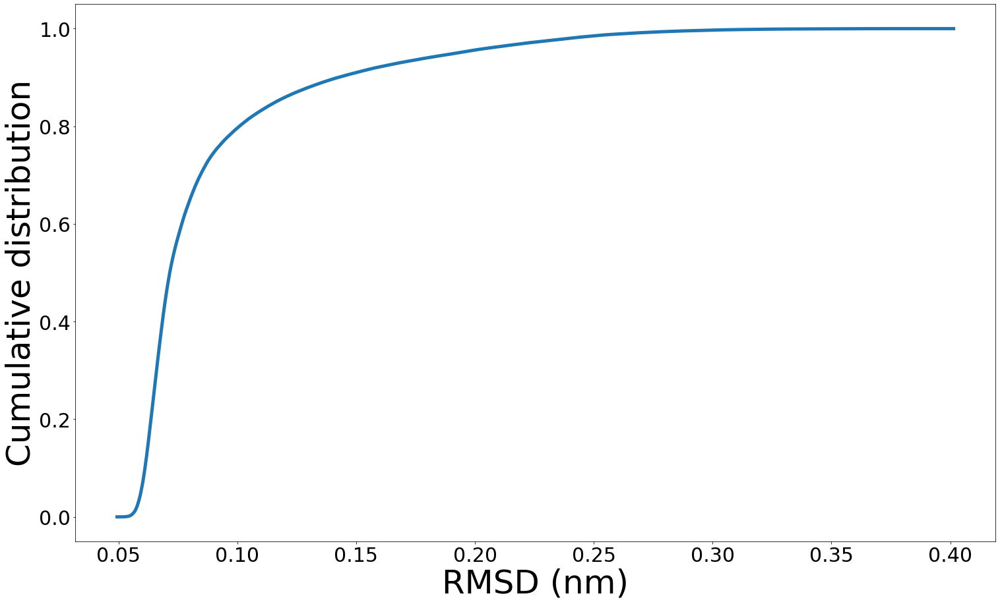

35 / 80 COMPLETE
534743
0
2252
6000
8000
10000
12000
14000
16005
18009
20000


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534468
RMSD_r = 1.01e-01 (nm)
RMSD_train = 1.30e-01 (nm)
0.44534610907889205


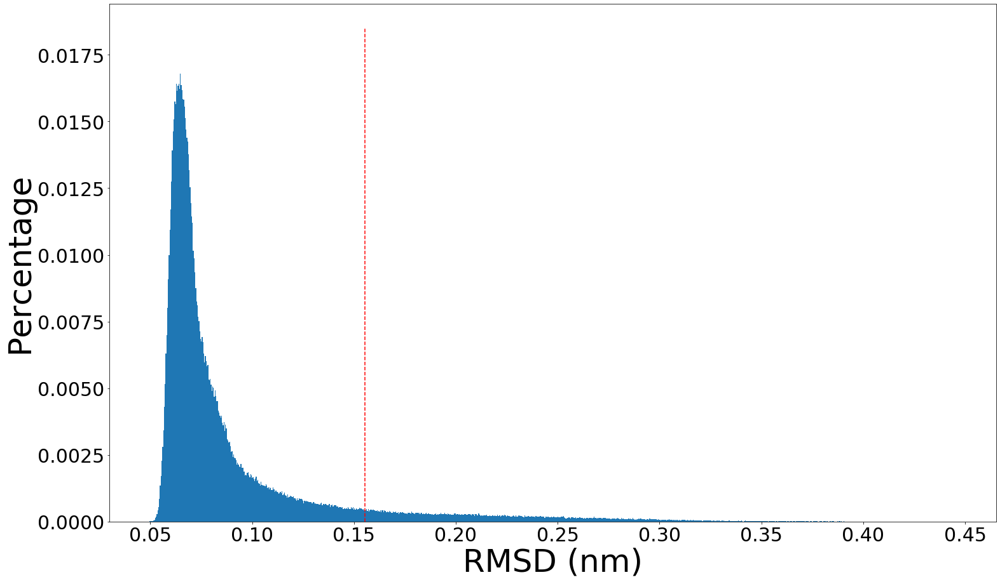

RMSD_r = 9.96e-02 (nm)
0.41443103193109265


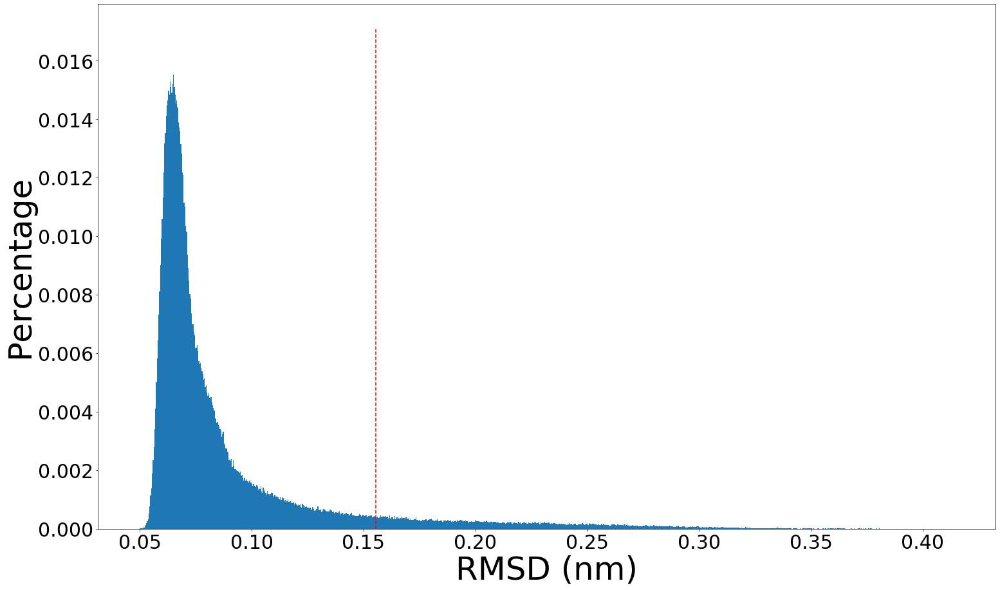

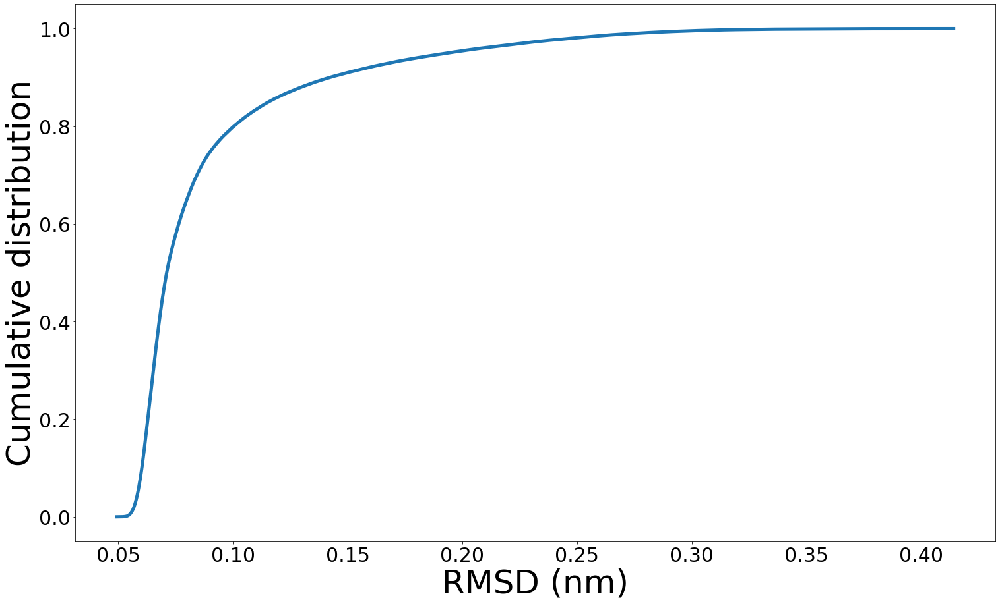

36 / 80 COMPLETE
534743
0
2640
6000
8005
10000
12005
14001
16000
18000
20000


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534193
RMSD_r = 1.07e-01 (nm)
RMSD_train = 1.30e-01 (nm)
0.4020029464683901


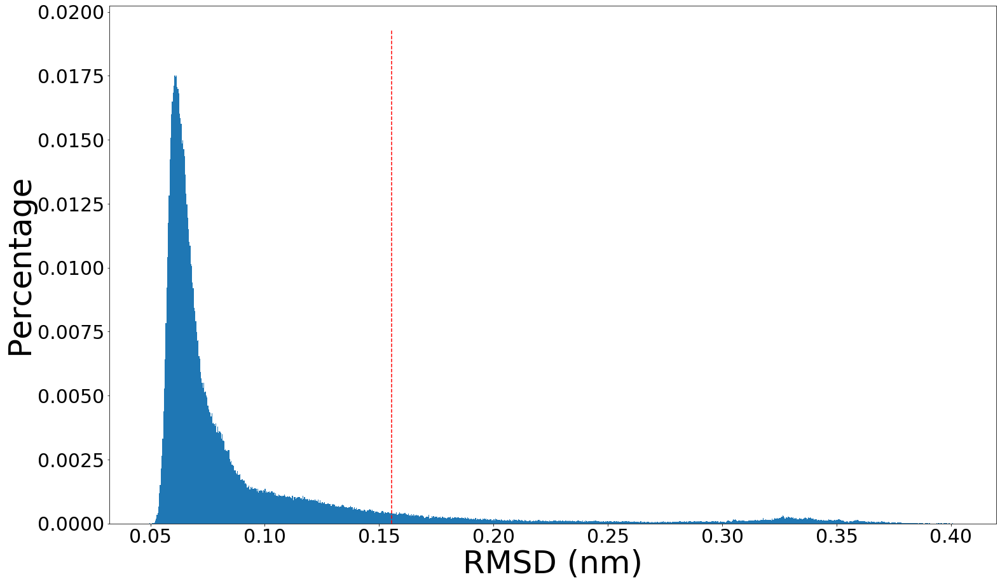

RMSD_r = 1.06e-01 (nm)
0.4001983401216578


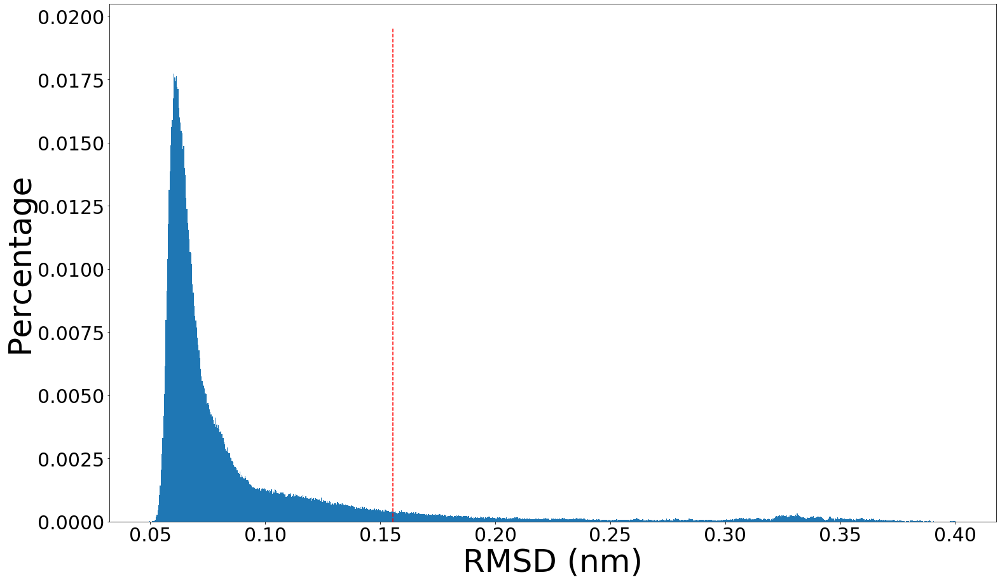

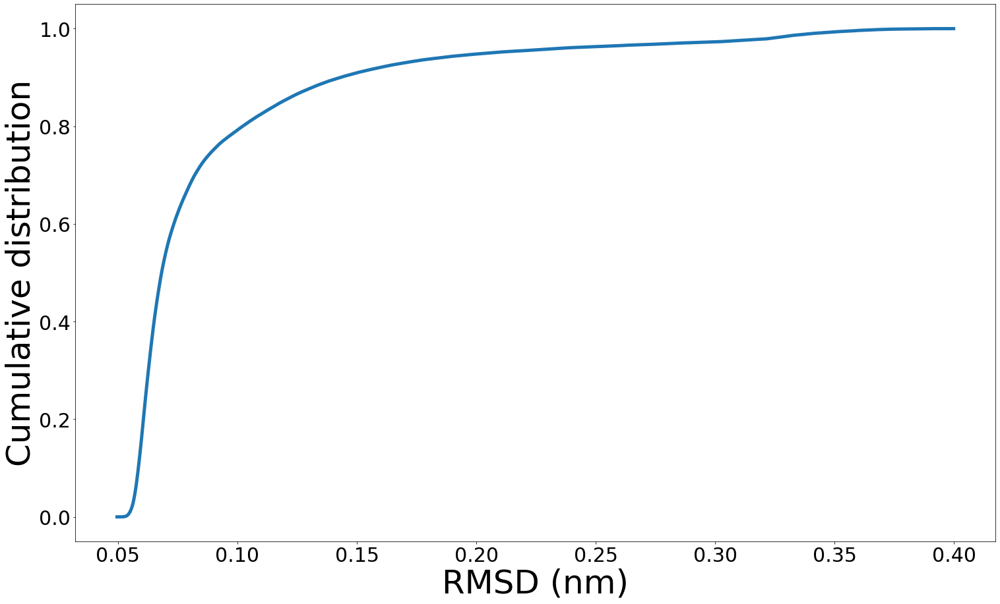

37 / 80 COMPLETE
534743
0
2640
6000
8005
10000
12005
14001
16000
18000
20000


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534193
RMSD_r = 1.05e-01 (nm)
RMSD_train = 1.37e-01 (nm)
0.43095142161530975


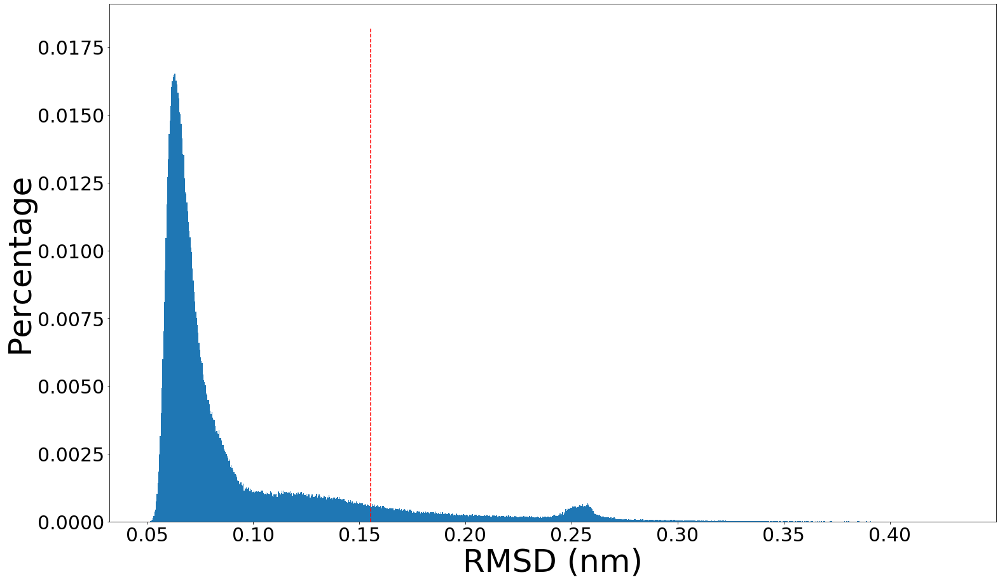

RMSD_r = 1.03e-01 (nm)
0.4193620530135588


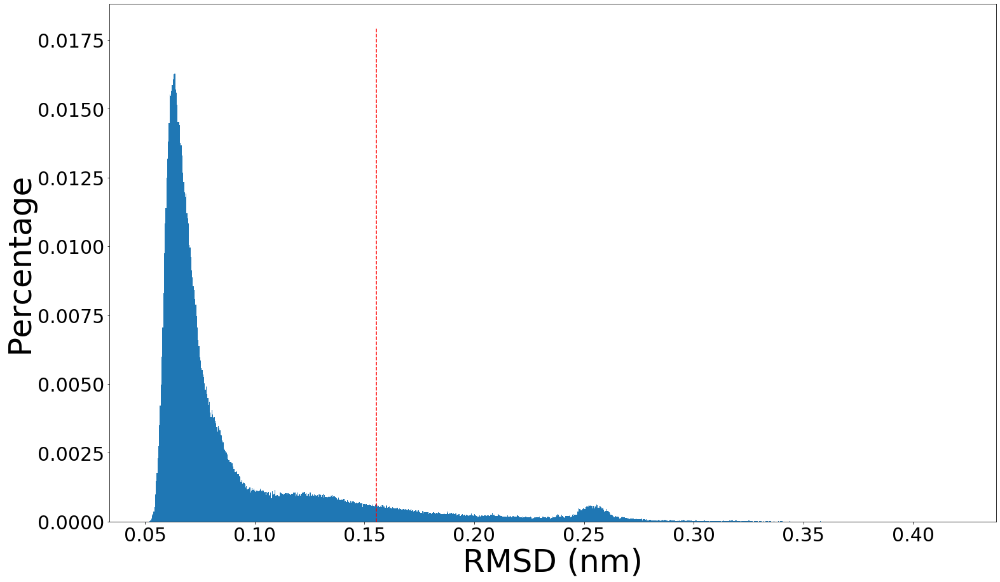

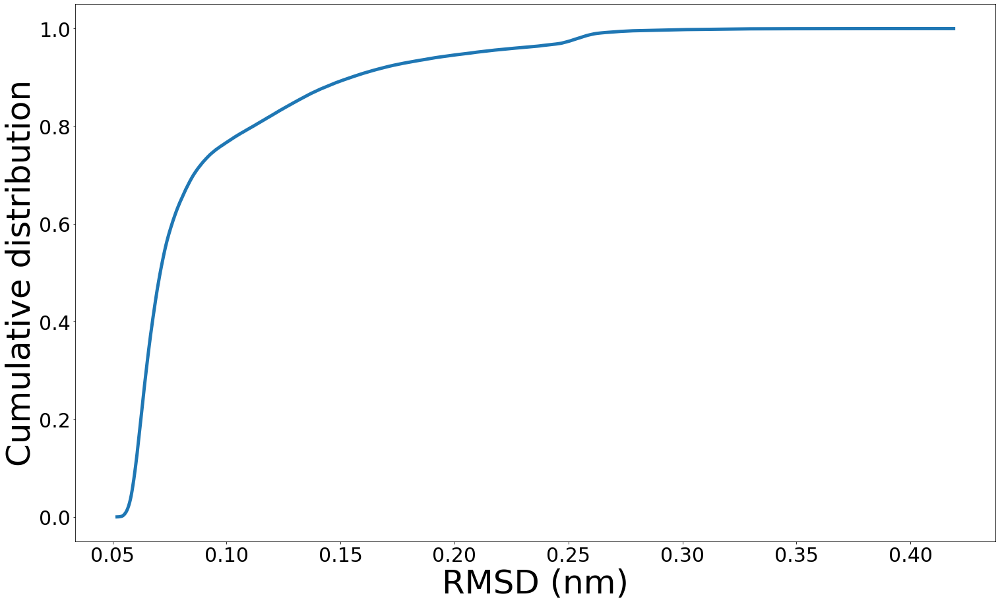

38 / 80 COMPLETE
534743
0
2640
6000
8005
10000
12005
14001
16000
18000
20000


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534193
RMSD_r = 1.10e-01 (nm)
RMSD_train = 1.30e-01 (nm)
0.4104237099331277


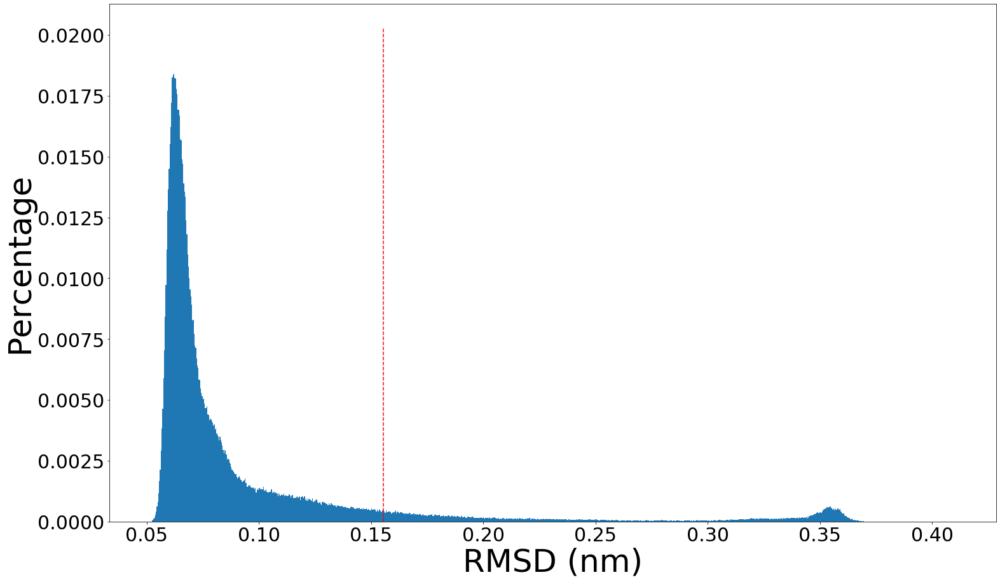

RMSD_r = 1.09e-01 (nm)
0.3735010489717822


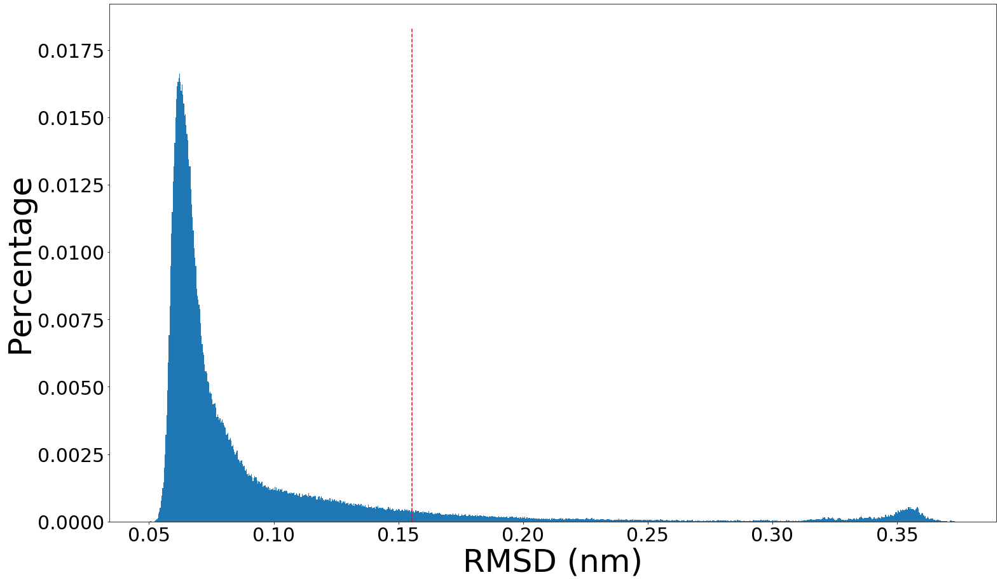

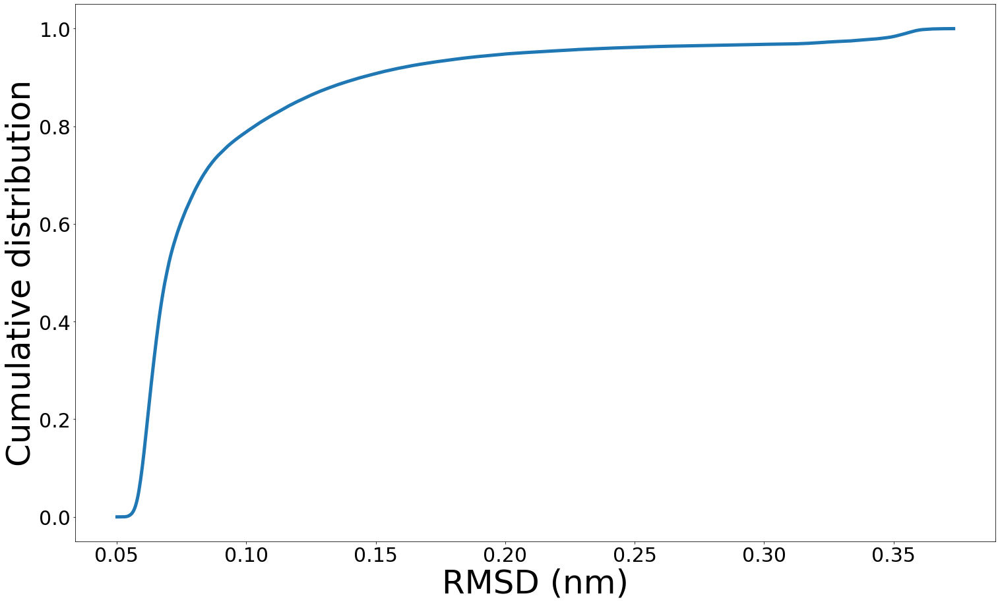

39 / 80 COMPLETE
534743
0
2640
6000
8005
10000
12005
14001
16000
18000
20000


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534193
RMSD_r = 1.09e-01 (nm)
RMSD_train = 1.33e-01 (nm)
0.4406424597943708


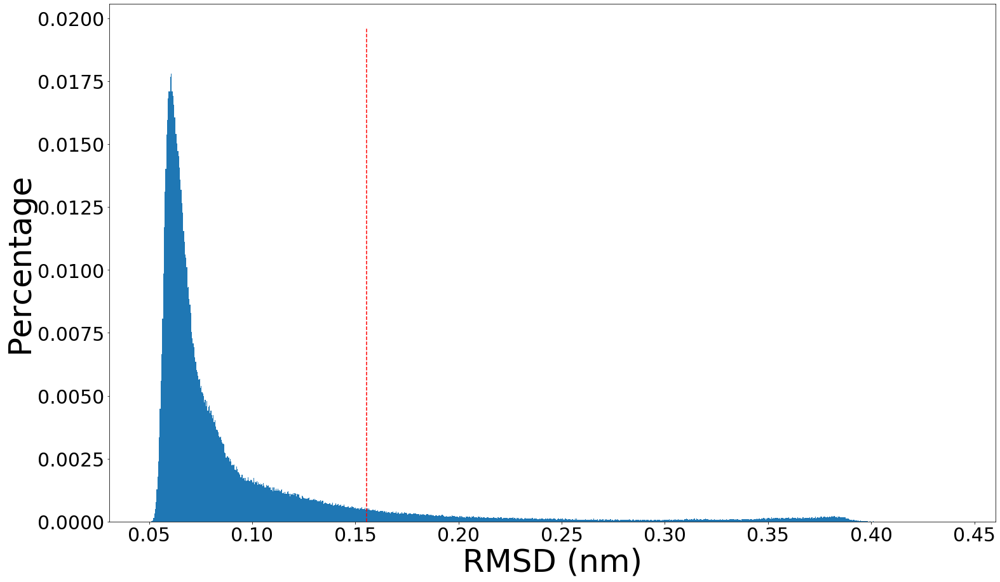

RMSD_r = 1.08e-01 (nm)
0.4043084873088624


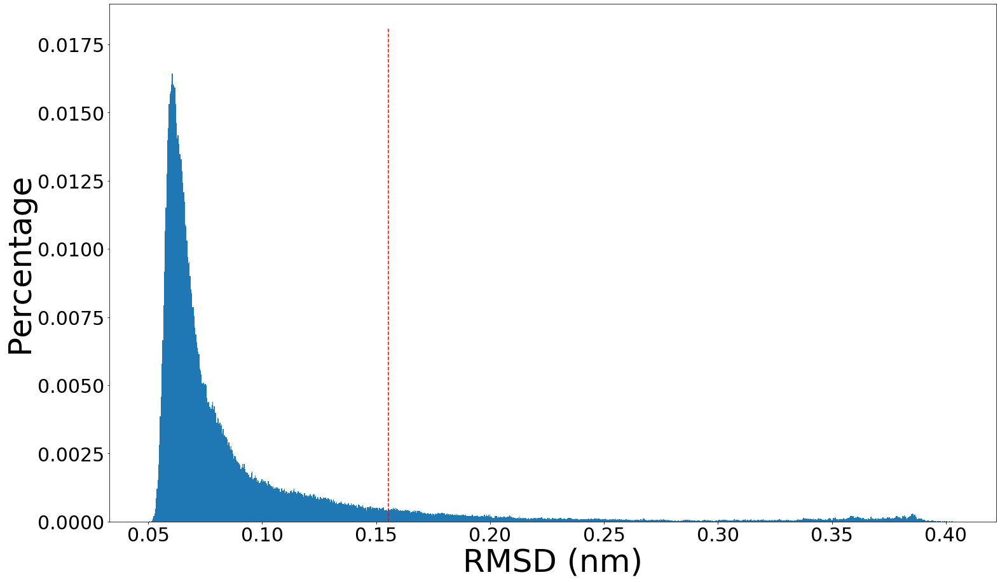

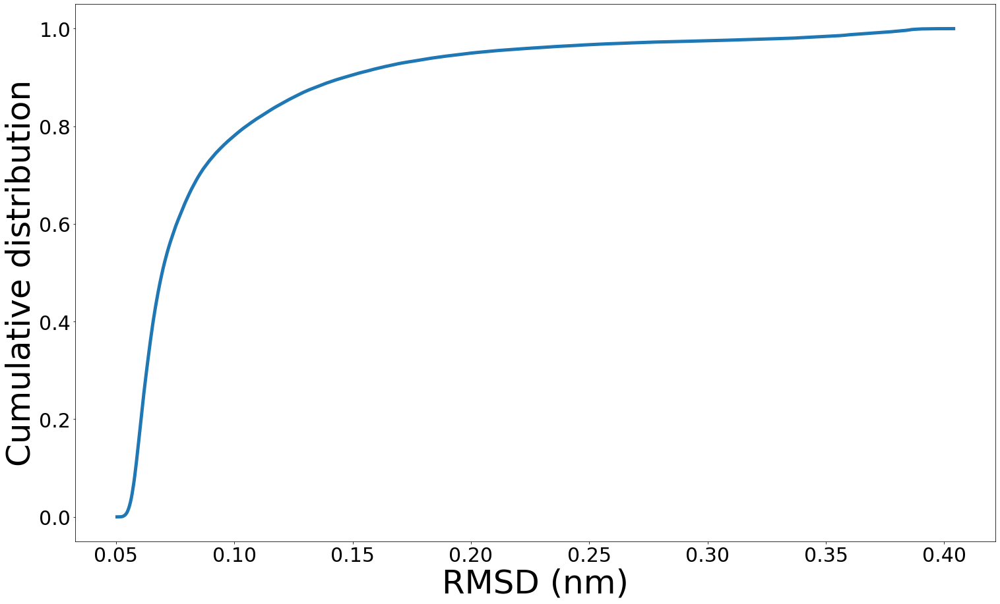

40 / 80 COMPLETE
534743
0
2005
3002
4001
5000
6009
7000
8007
9000
10003


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534732
RMSD_r = 1.36e-01 (nm)
RMSD_train = 2.11e-01 (nm)
0.5366081759956494


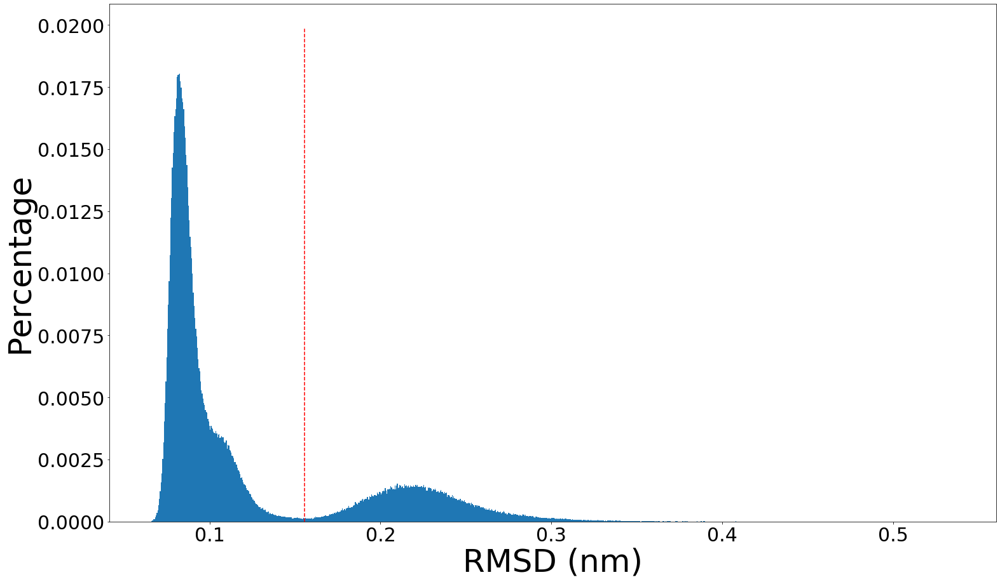

RMSD_r = 1.36e-01 (nm)
0.5366081759956494


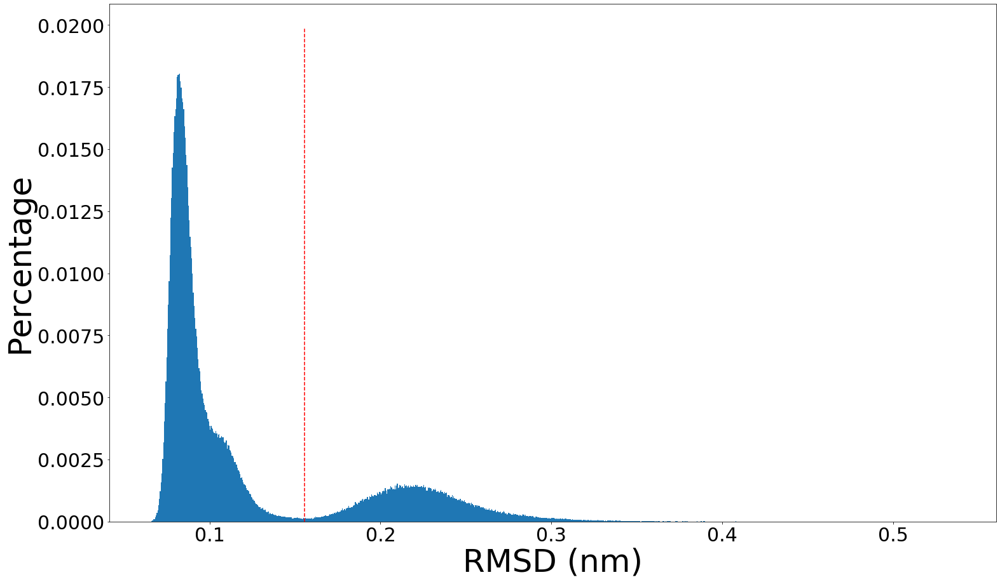

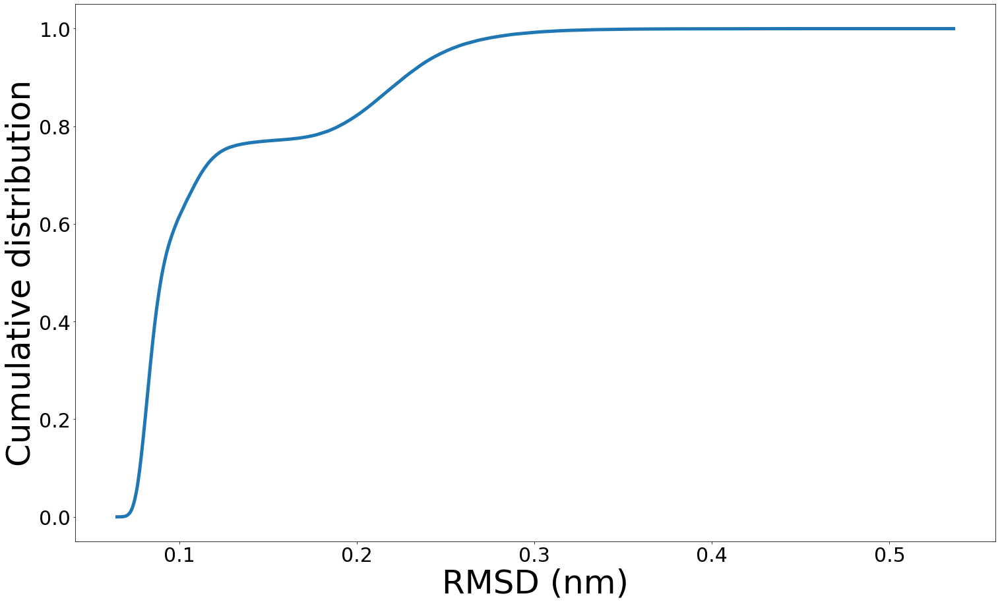

41 / 80 COMPLETE
534743
0
2005
3002
4001
5000
6009
7000
8007
9000
10003


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534732
RMSD_r = 1.36e-01 (nm)
RMSD_train = 2.11e-01 (nm)
0.5379902871446027


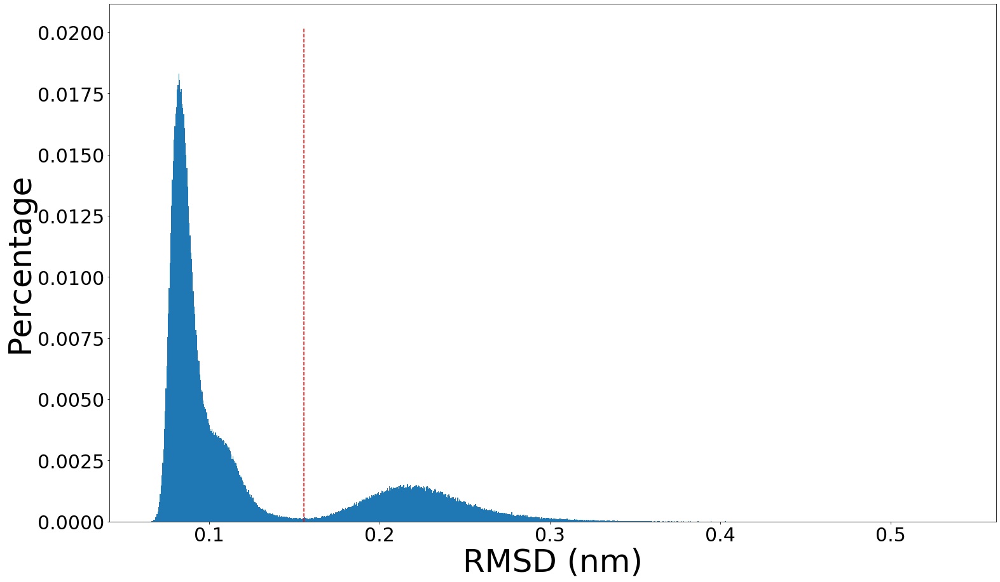

RMSD_r = 1.36e-01 (nm)
0.5379902871446027


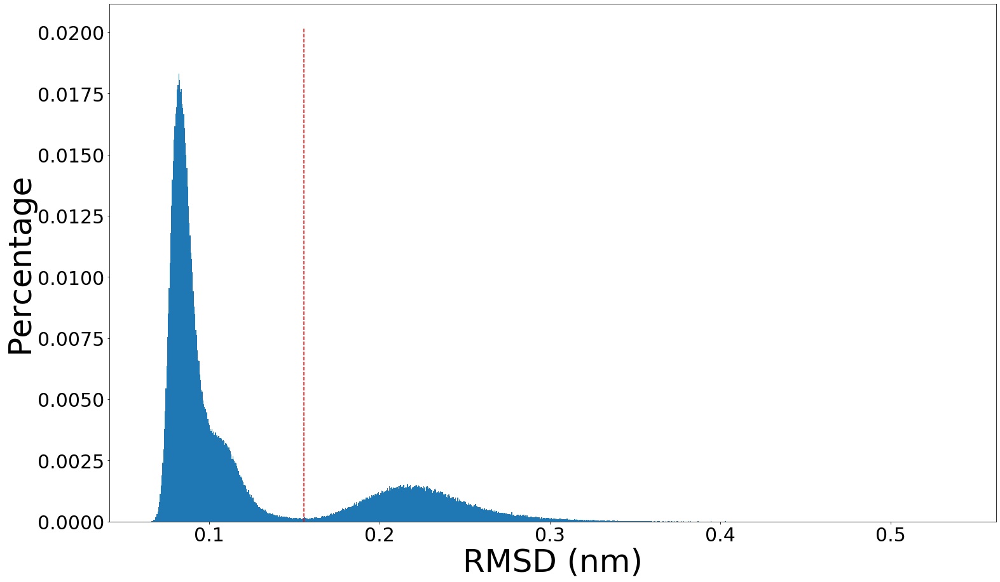

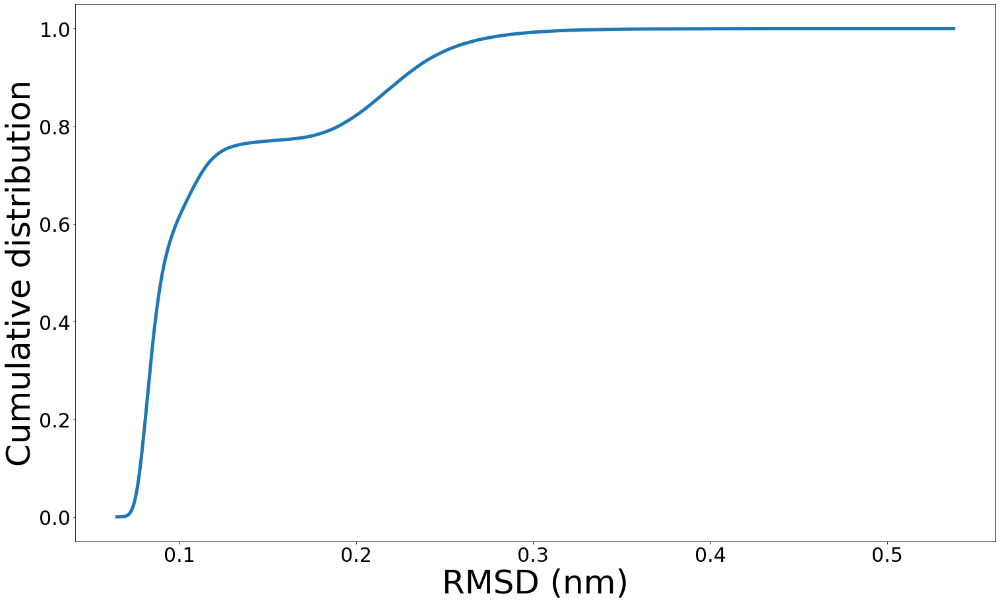

42 / 80 COMPLETE
534743
0
2005
3002
4001
5000
6009
7000
8007
9000
10003


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534732
RMSD_r = 1.36e-01 (nm)
RMSD_train = 2.11e-01 (nm)
0.5355796712508774


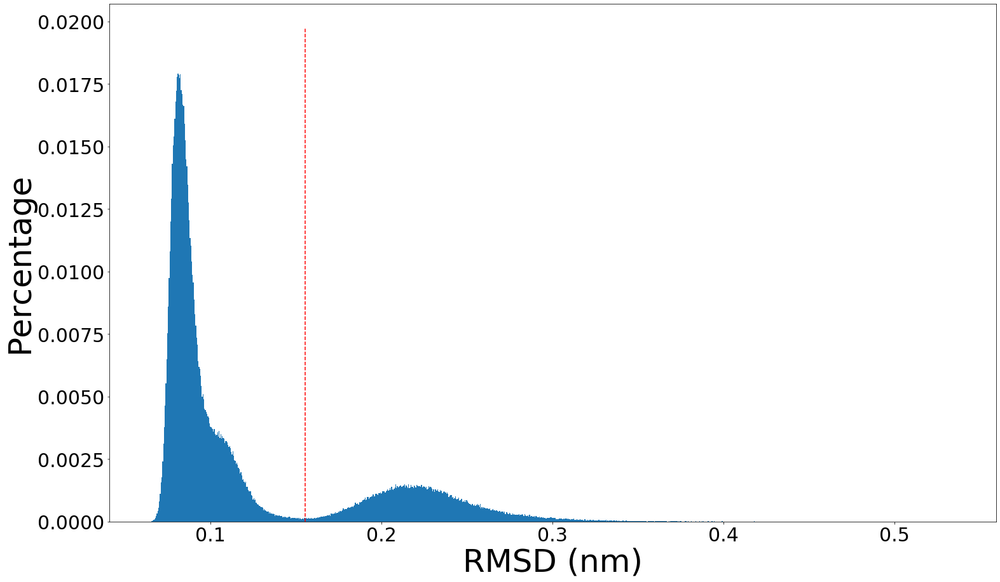

RMSD_r = 1.36e-01 (nm)
0.5355796712508774


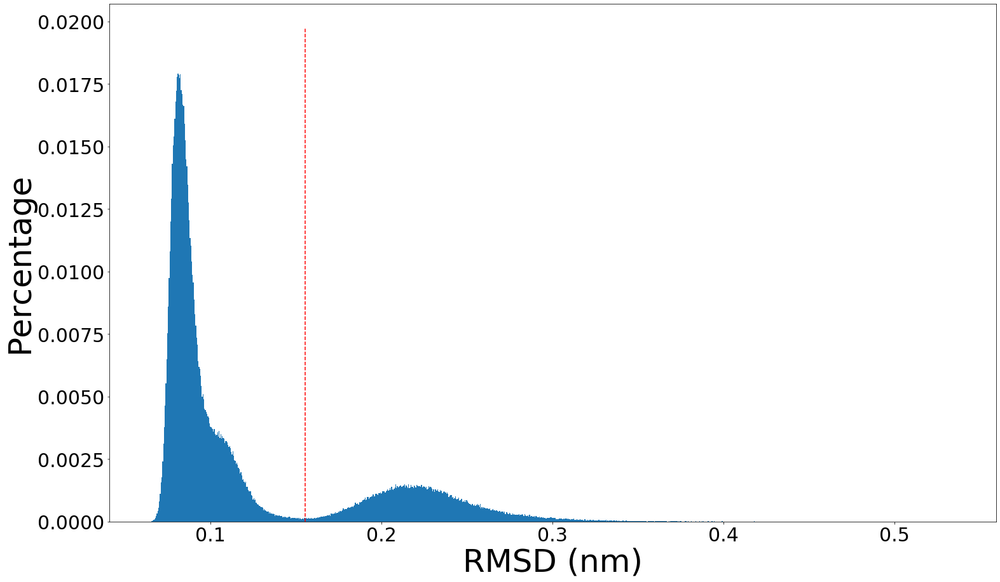

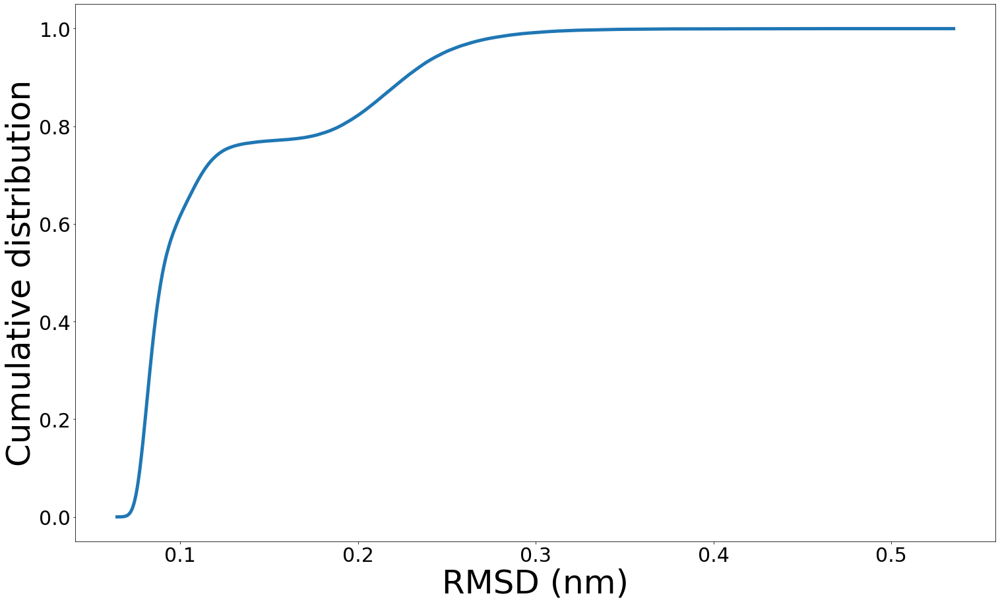

43 / 80 COMPLETE
534743
0
2005
3002
4001
5000
6009
7000
8007
9000
10003


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534732
RMSD_r = 2.62e-01 (nm)
RMSD_train = 2.51e-01 (nm)
0.40061915753561267


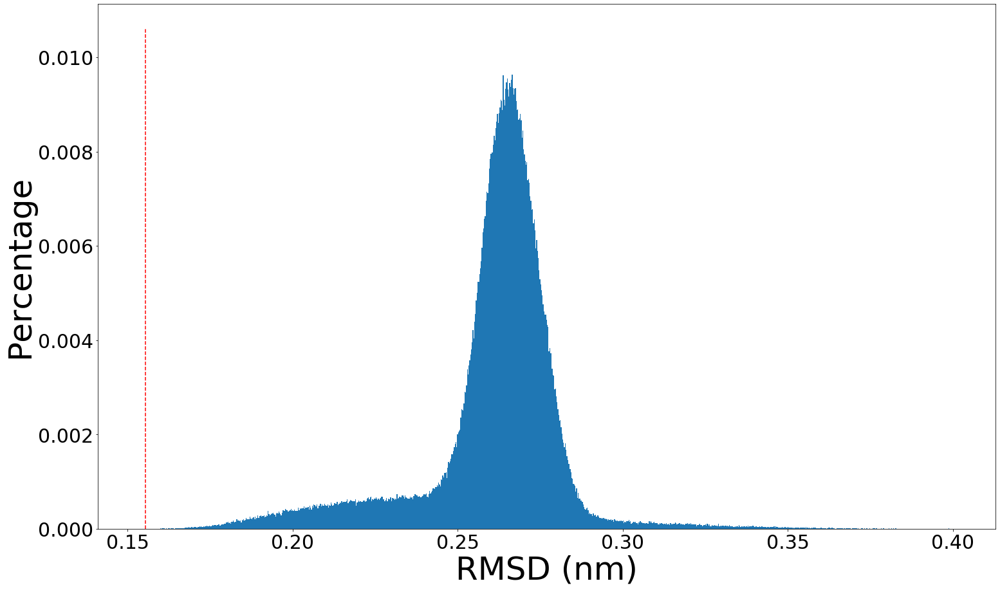

RMSD_r = 2.62e-01 (nm)
0.40061915753561267


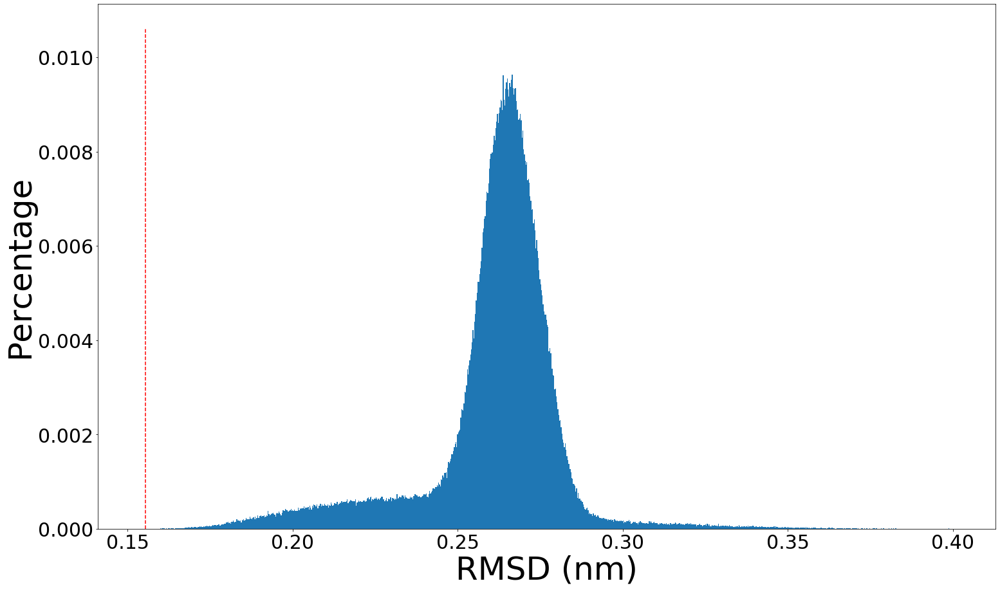

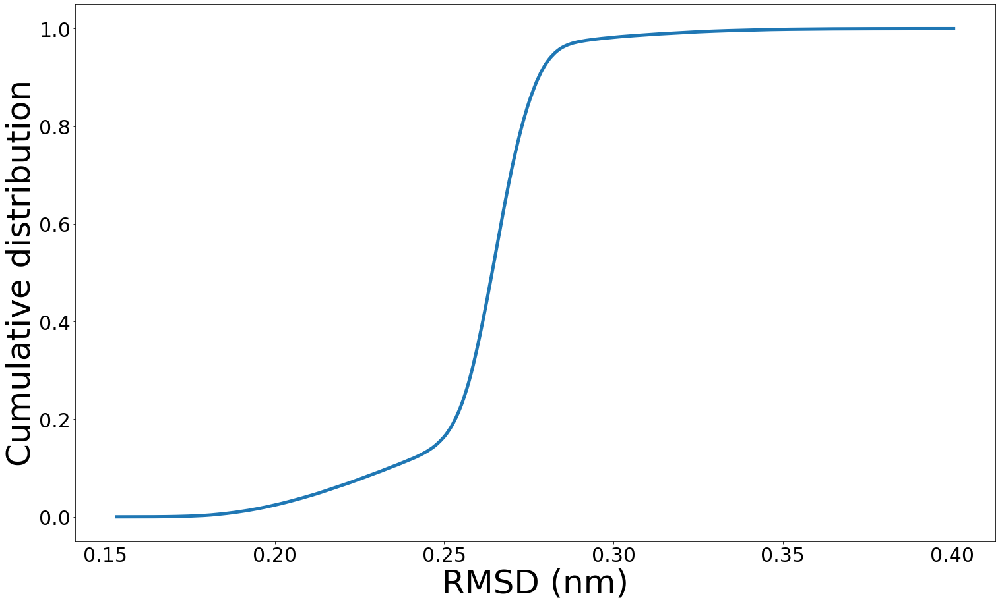

44 / 80 COMPLETE
534743
0
2004
3000
4000
5003
6006
7006
8000
9000
10002


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534688
RMSD_r = 1.17e-01 (nm)
RMSD_train = 1.50e-01 (nm)
0.420256333965099


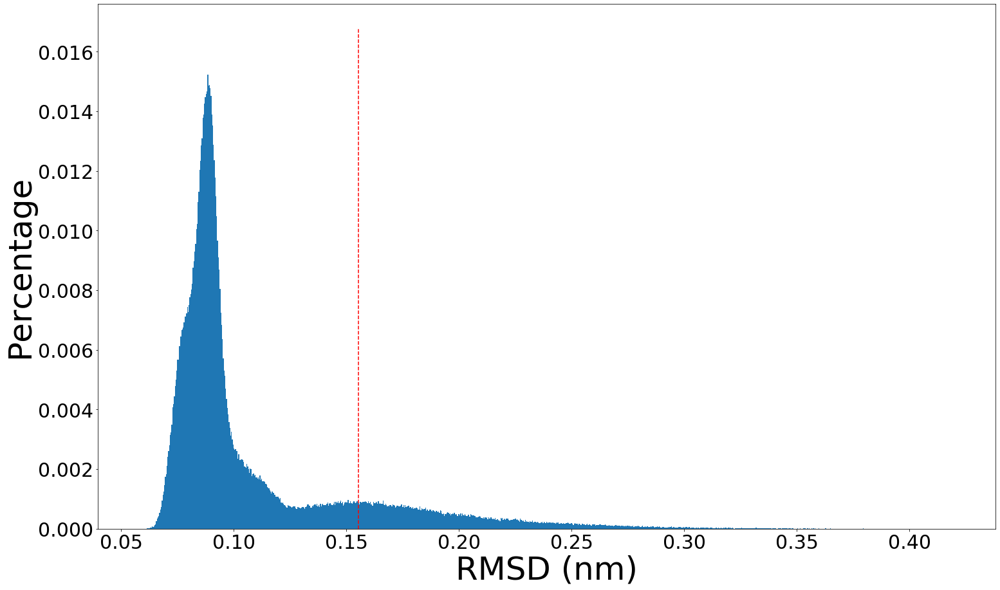

RMSD_r = 1.17e-01 (nm)
0.41467184835148435


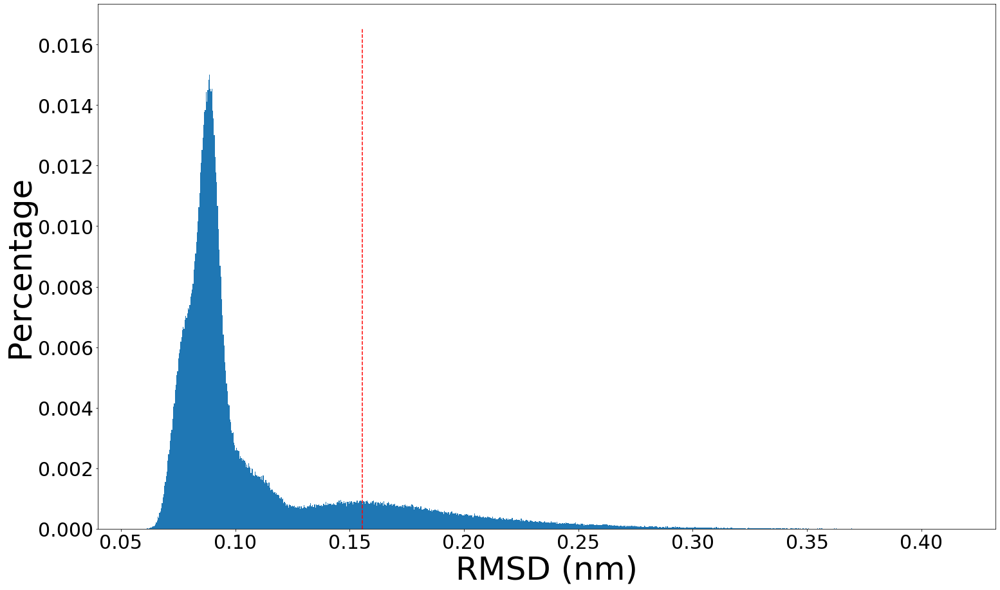

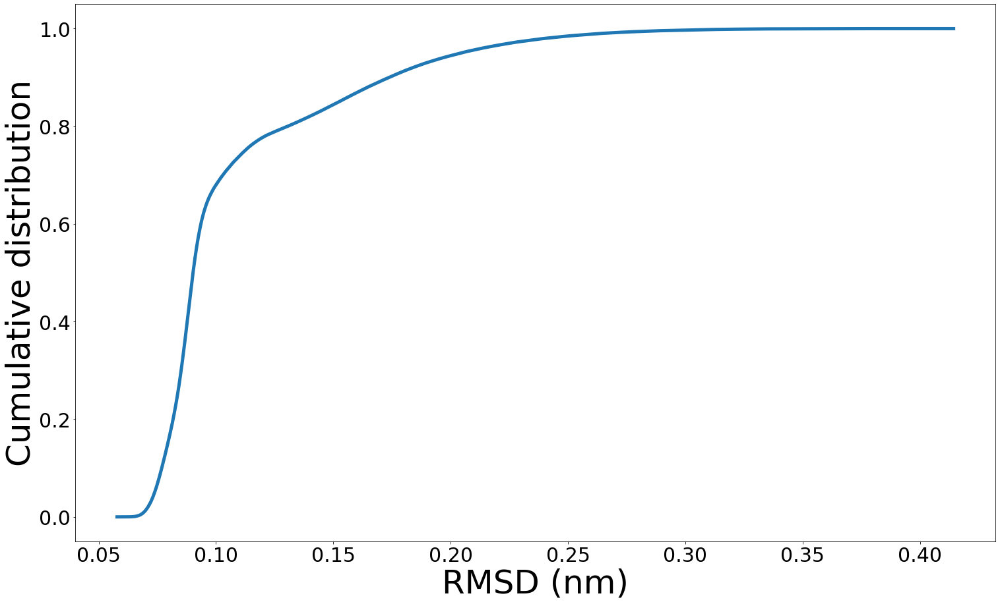

45 / 80 COMPLETE
534743
0
2004
3000
4000
5003
6006
7006
8000
9000
10002


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534688
RMSD_r = 1.17e-01 (nm)
RMSD_train = 1.49e-01 (nm)
0.4348441245761815


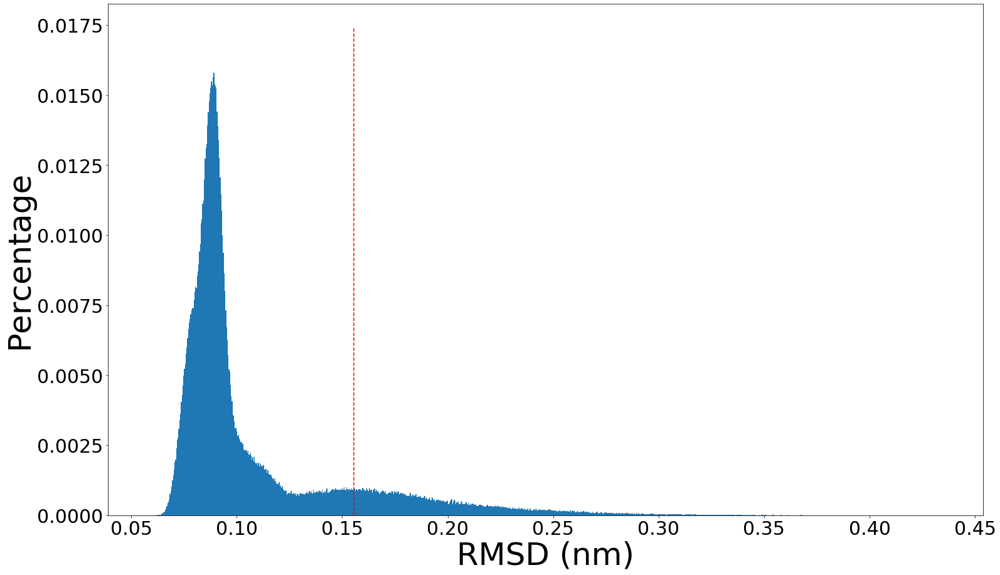

RMSD_r = 1.17e-01 (nm)
0.4125934153265892


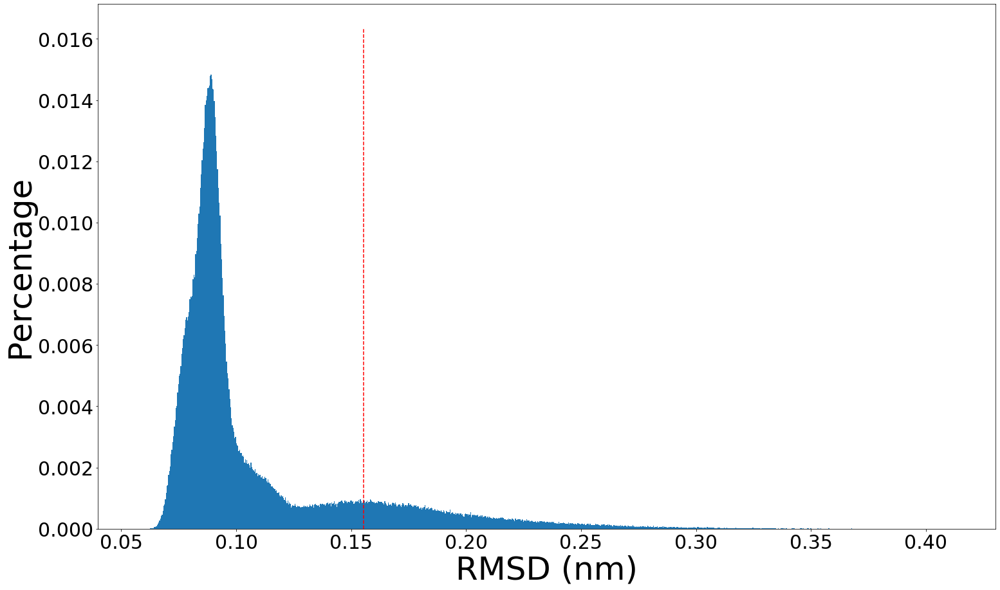

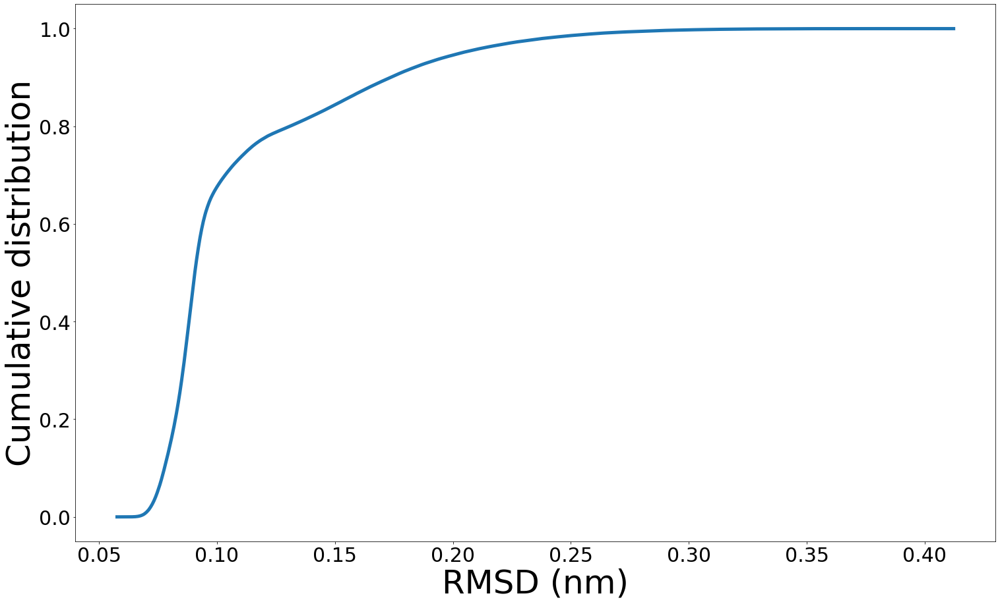

46 / 80 COMPLETE
534743
0
2004
3000
4000
5003
6006
7006
8000
9000
10002


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534688
RMSD_r = 1.18e-01 (nm)
RMSD_train = 1.50e-01 (nm)
0.42625634728730605


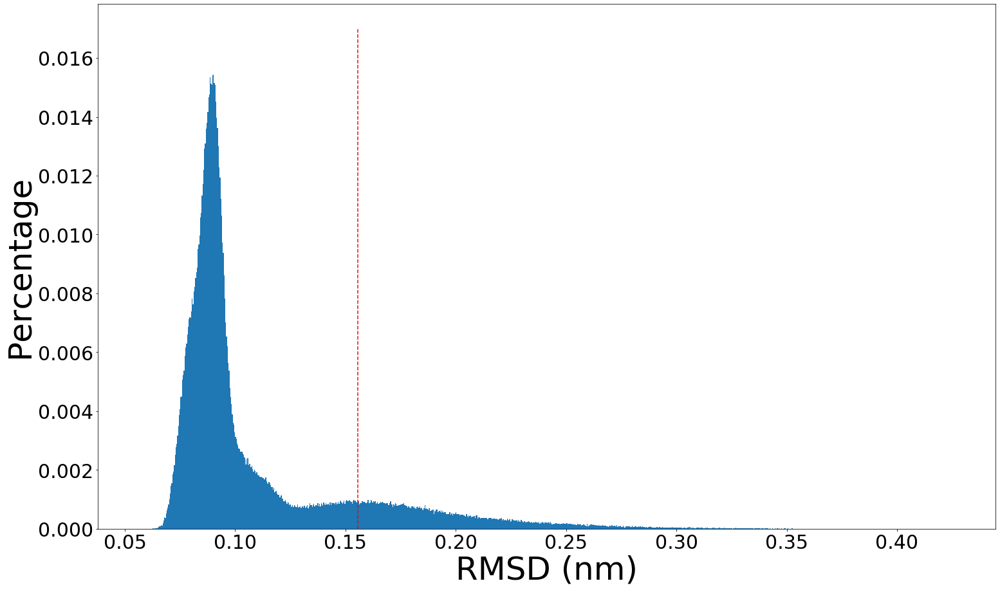

RMSD_r = 1.17e-01 (nm)
0.41169546007994573


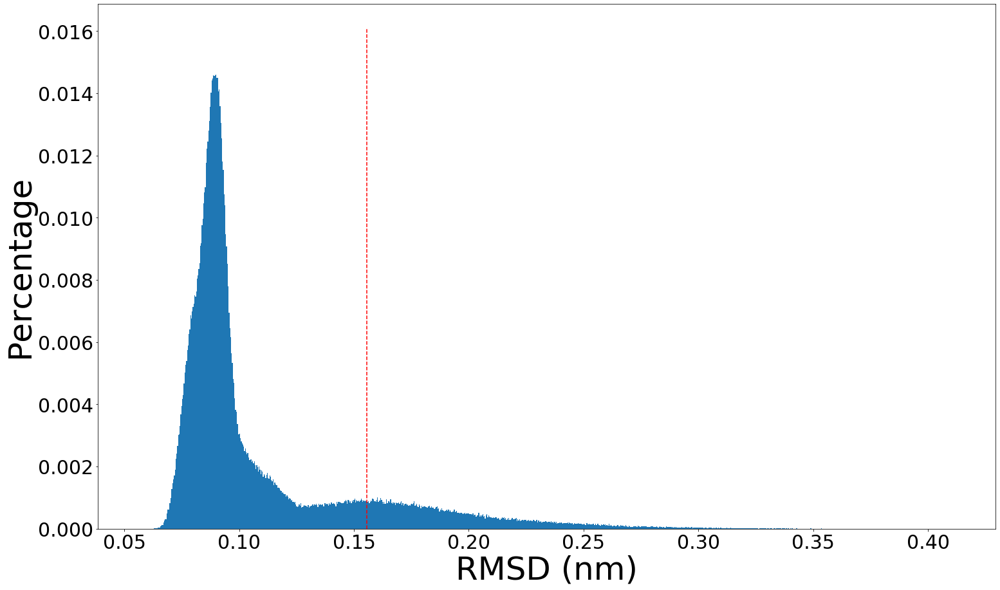

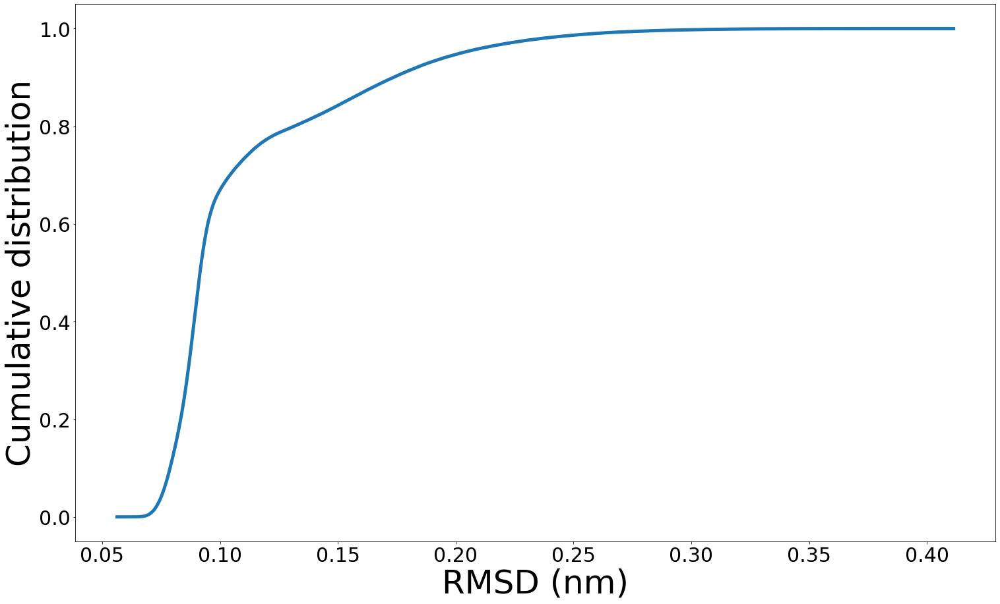

47 / 80 COMPLETE
534743
0
2004
3000
4000
5003
6006
7006
8000
9000
10002


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534688
RMSD_r = 1.18e-01 (nm)
RMSD_train = 1.51e-01 (nm)
0.4745160107083465


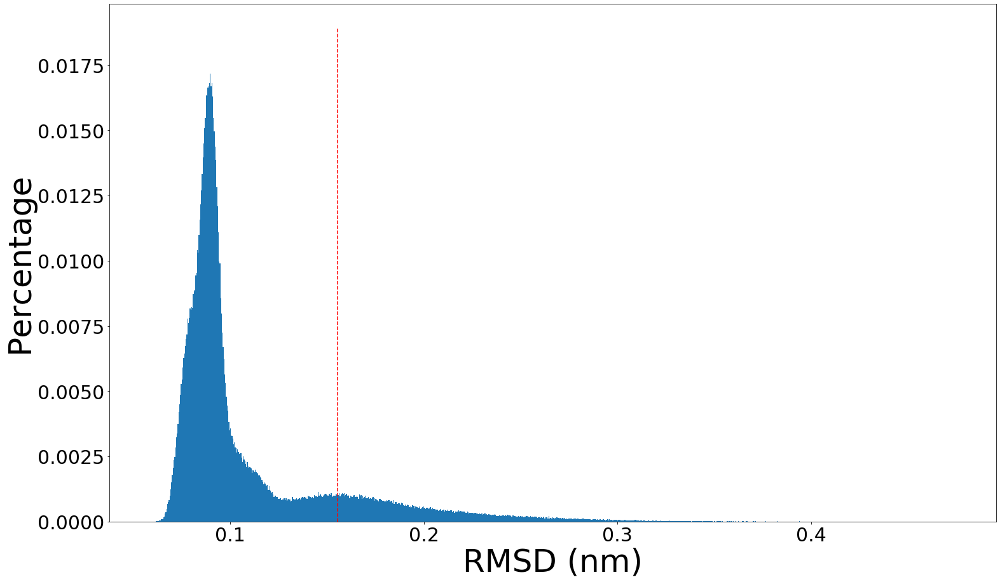

RMSD_r = 1.18e-01 (nm)
0.48181041903193356


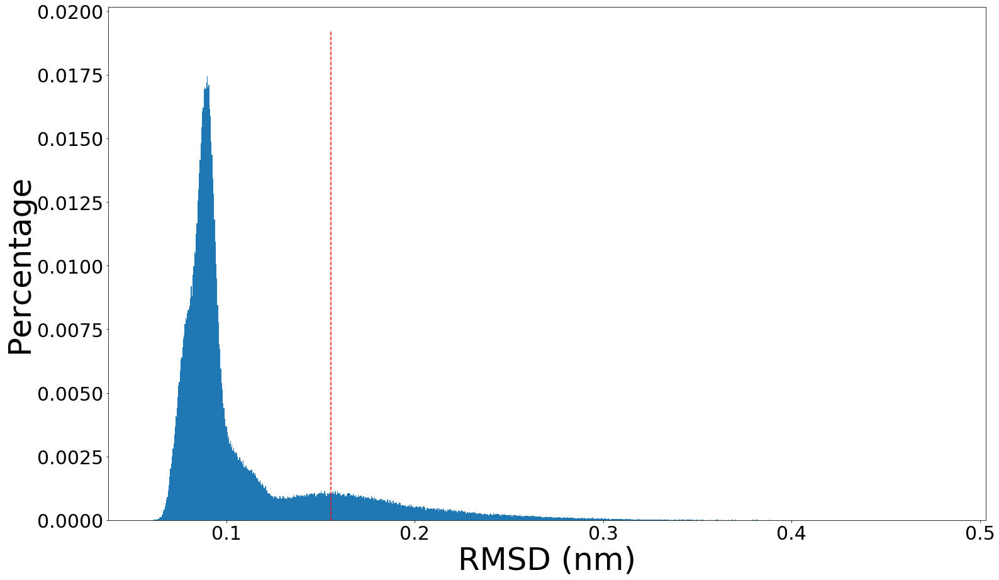

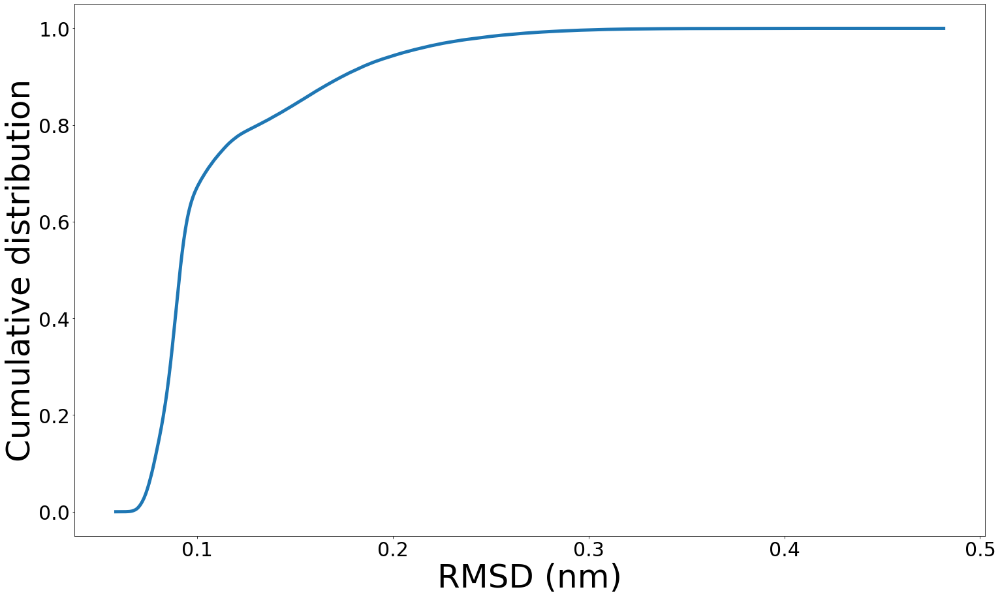

48 / 80 COMPLETE
534743
0
2000
3000
4000
5008
6000
7009
8008
9000
10007


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534633
RMSD_r = 1.13e-01 (nm)
RMSD_train = 1.35e-01 (nm)
0.40927392072324653


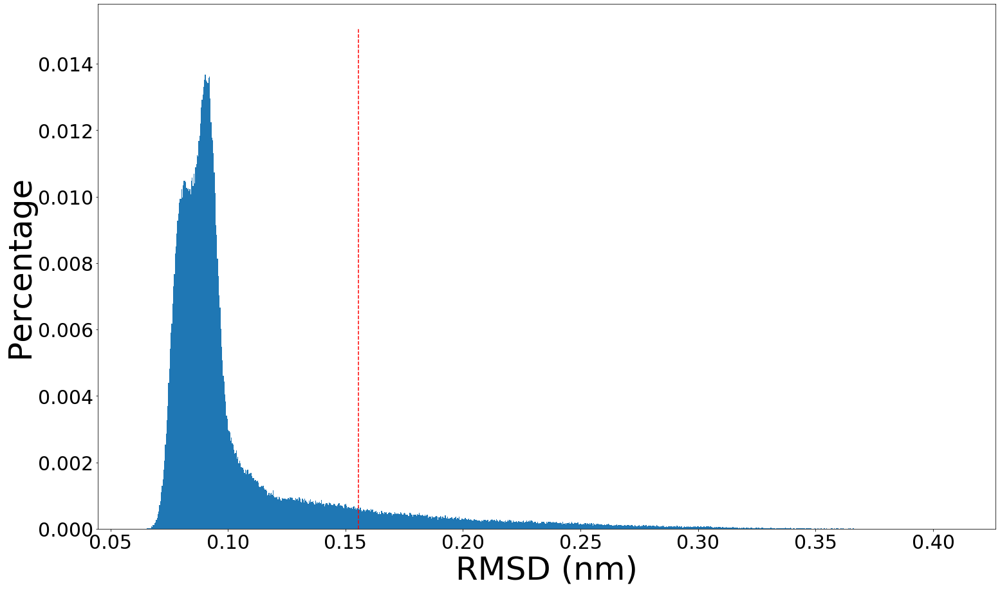

RMSD_r = 1.13e-01 (nm)
0.40927392072324653


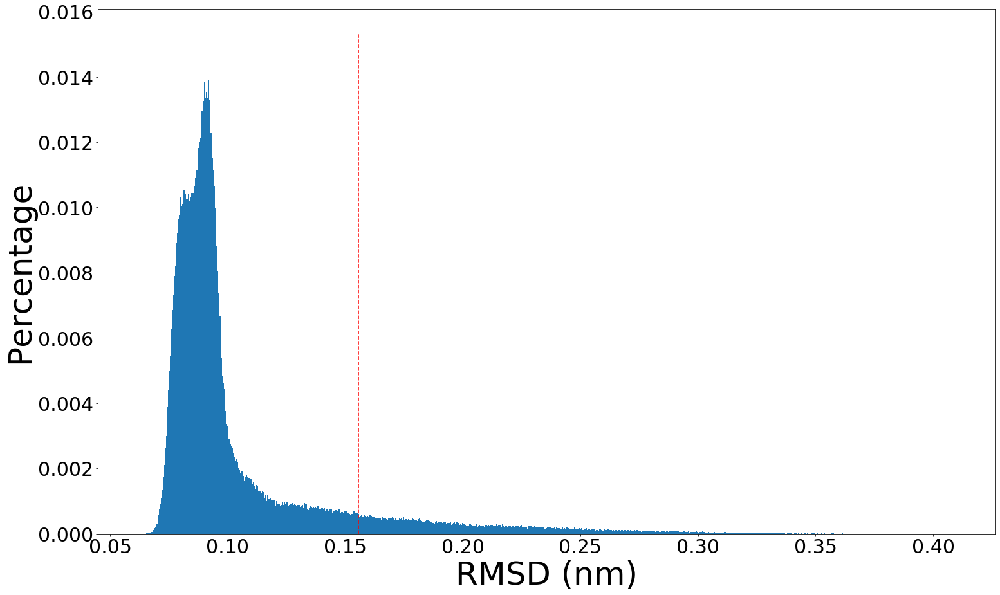

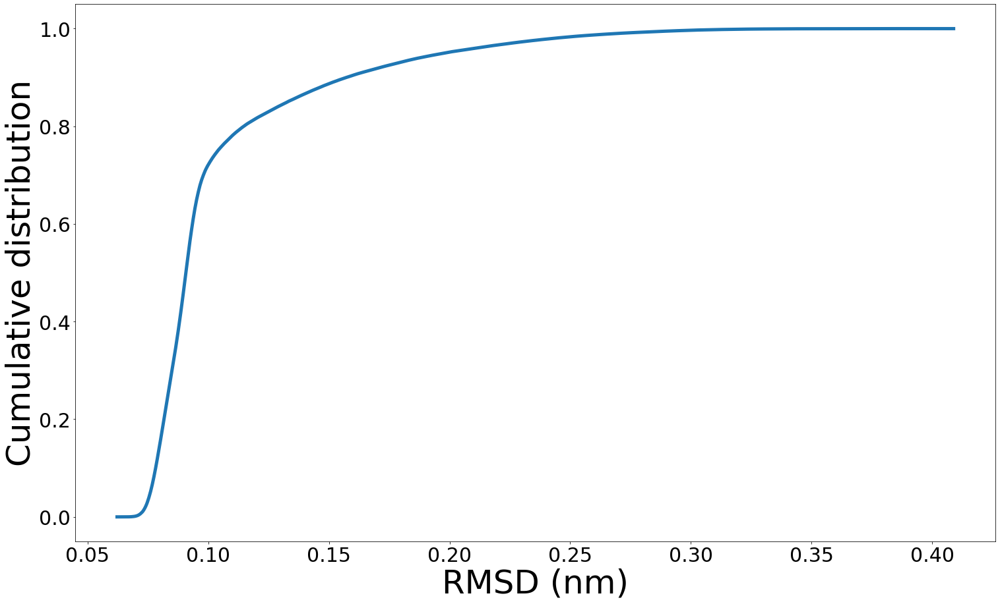

49 / 80 COMPLETE
534743
0
2000
3000
4000
5008
6000
7009
8008
9000
10007


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534633
RMSD_r = 1.13e-01 (nm)
RMSD_train = 1.36e-01 (nm)
0.4312744327774599


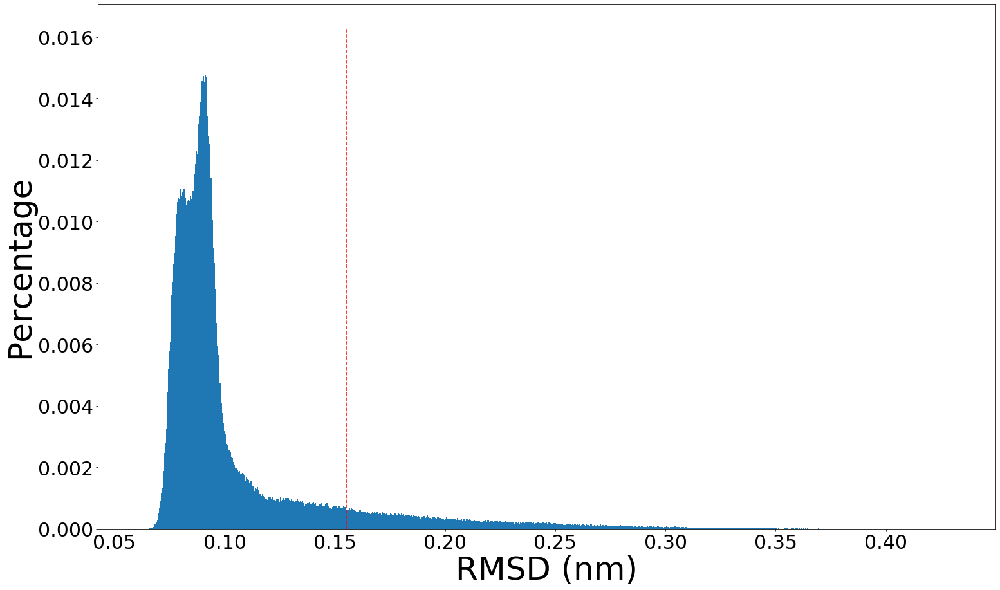

RMSD_r = 1.12e-01 (nm)
0.4312744327774599


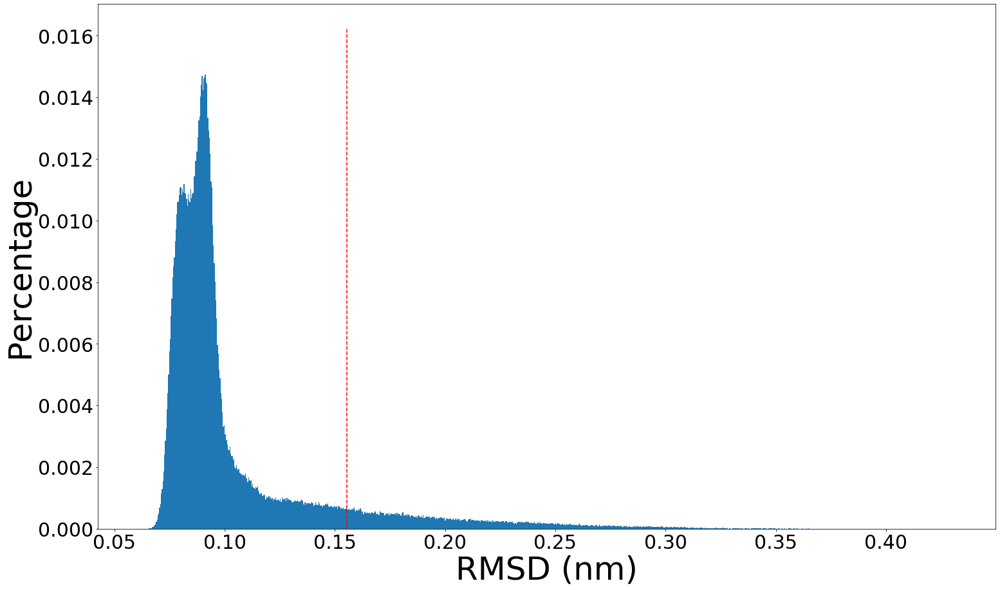

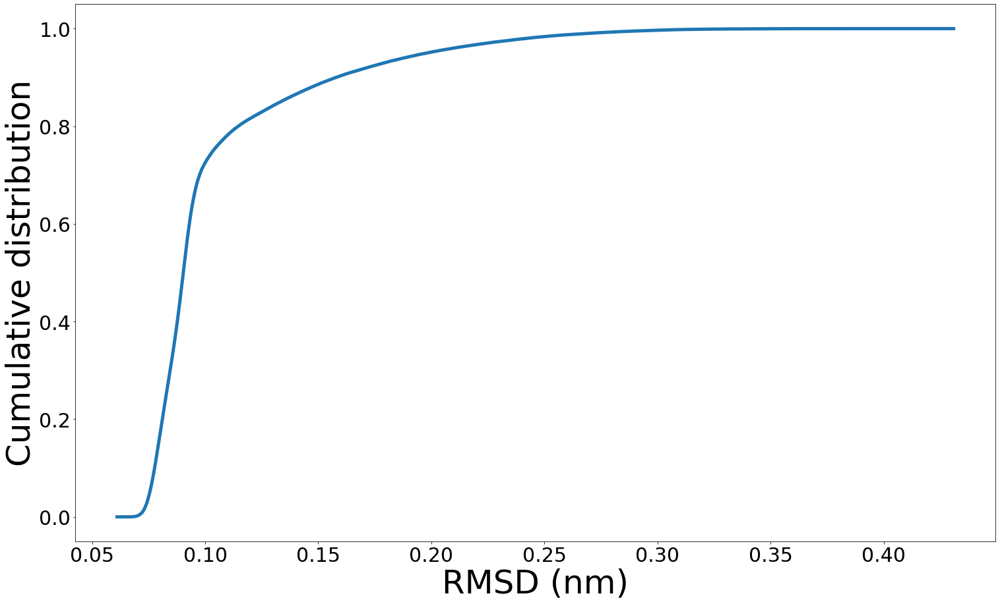

50 / 80 COMPLETE
534743
0
2000
3000
4000
5008
6000
7009
8008
9000
10007


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534633
RMSD_r = 1.13e-01 (nm)
RMSD_train = 1.35e-01 (nm)
0.41219293325912676


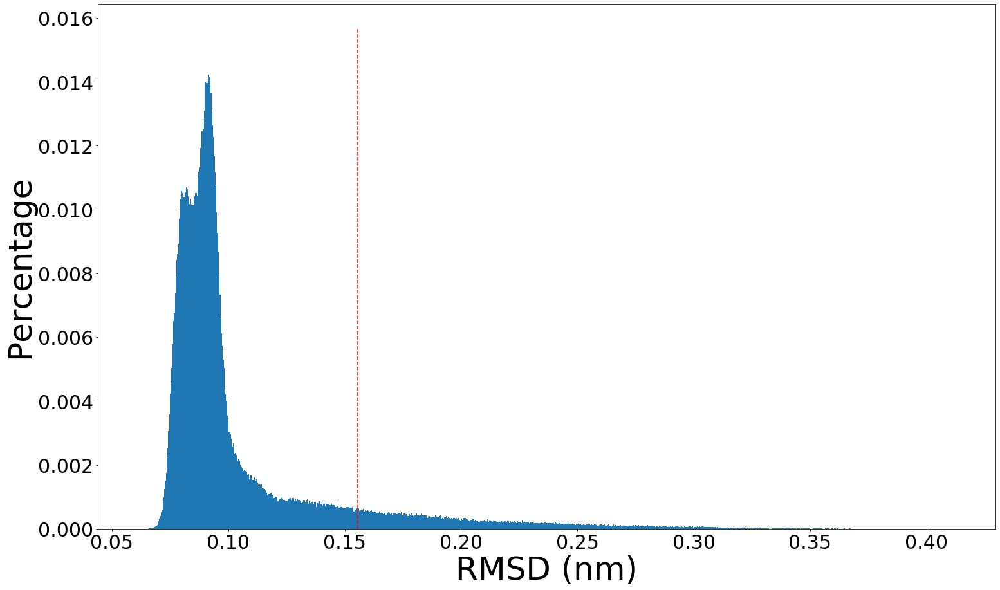

RMSD_r = 1.13e-01 (nm)
0.391095421962973


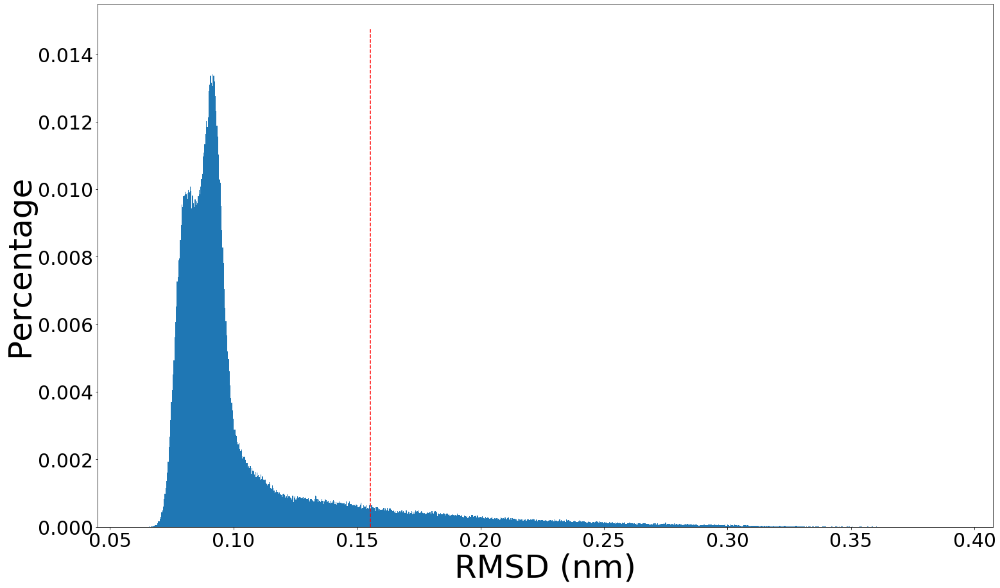

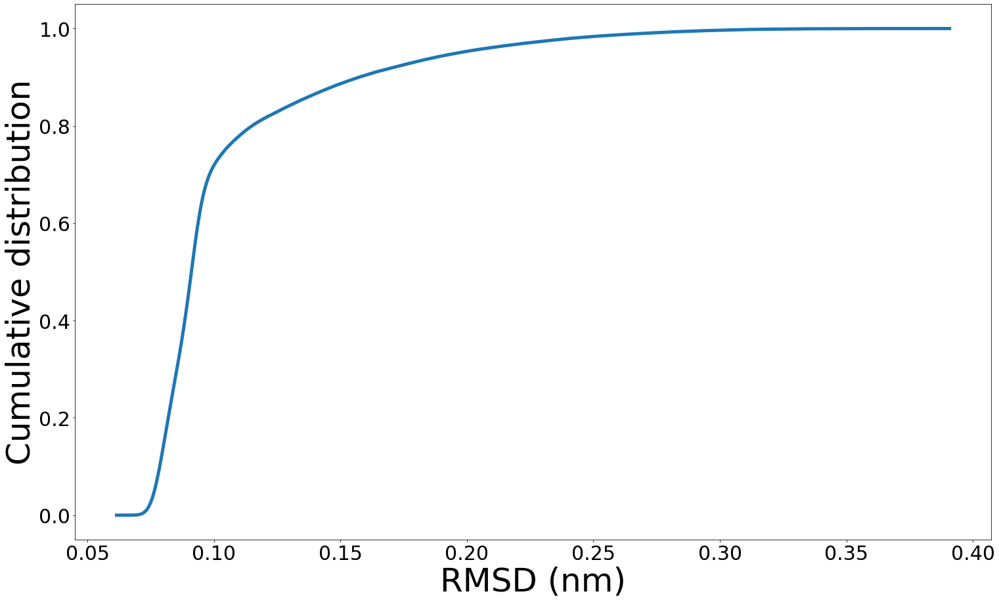

51 / 80 COMPLETE
534743
0
2000
3000
4000
5008
6000
7009
8008
9000
10007


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534633
RMSD_r = 1.14e-01 (nm)
RMSD_train = 1.37e-01 (nm)
0.48860554656975


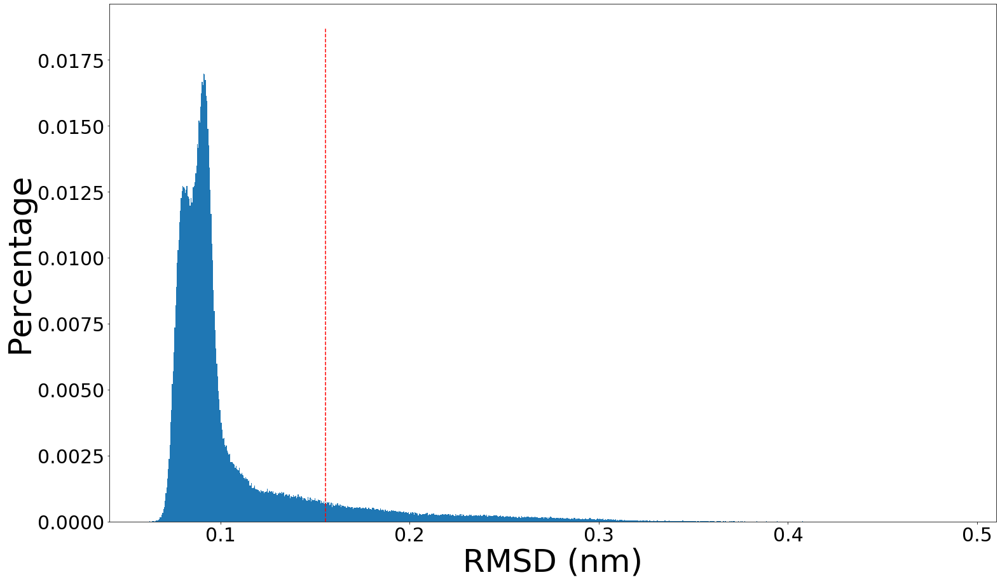

RMSD_r = 1.14e-01 (nm)
0.47322495386930186


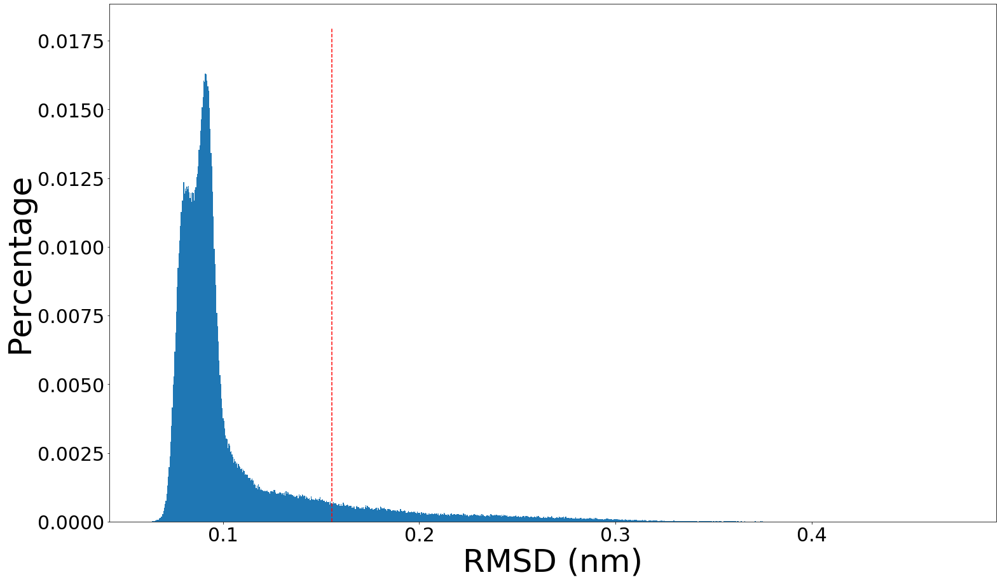

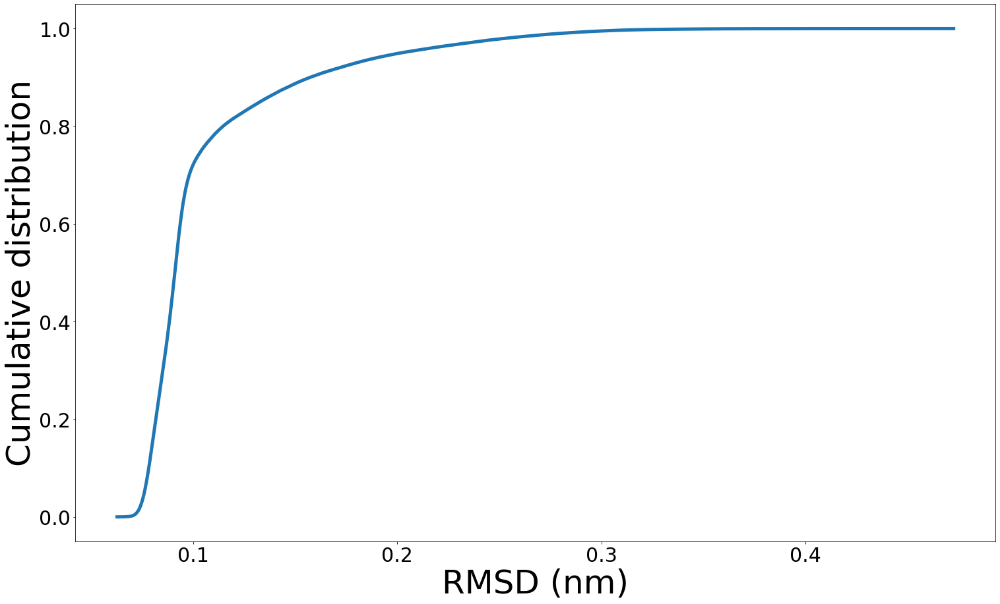

52 / 80 COMPLETE
534743
0
2000
3000
4008
5000
6003
7000
8000
9010
10000


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534468
RMSD_r = 1.09e-01 (nm)
RMSD_train = 1.32e-01 (nm)
0.4001990547543946


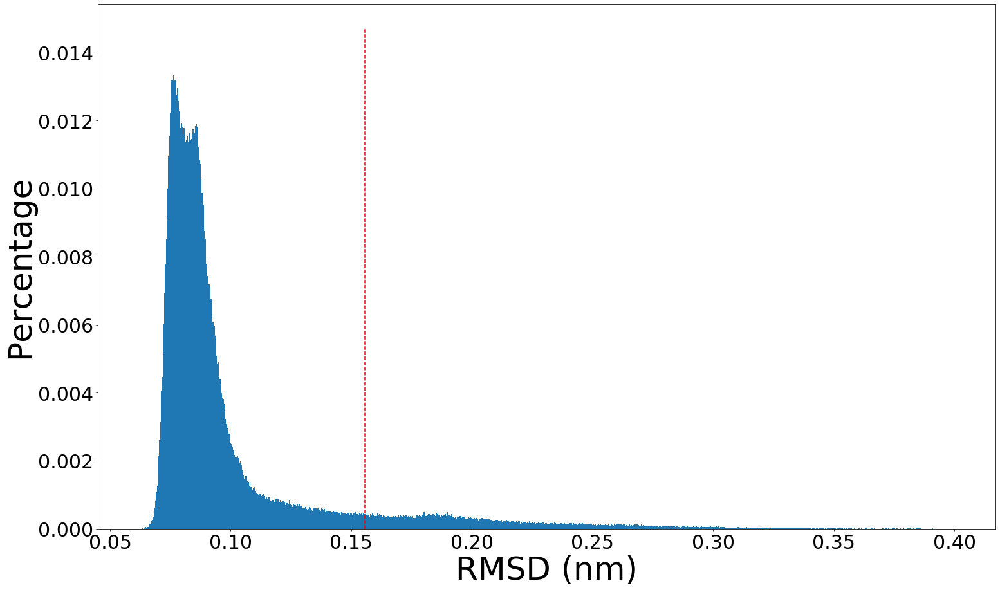

RMSD_r = 1.08e-01 (nm)
0.3877643999941434


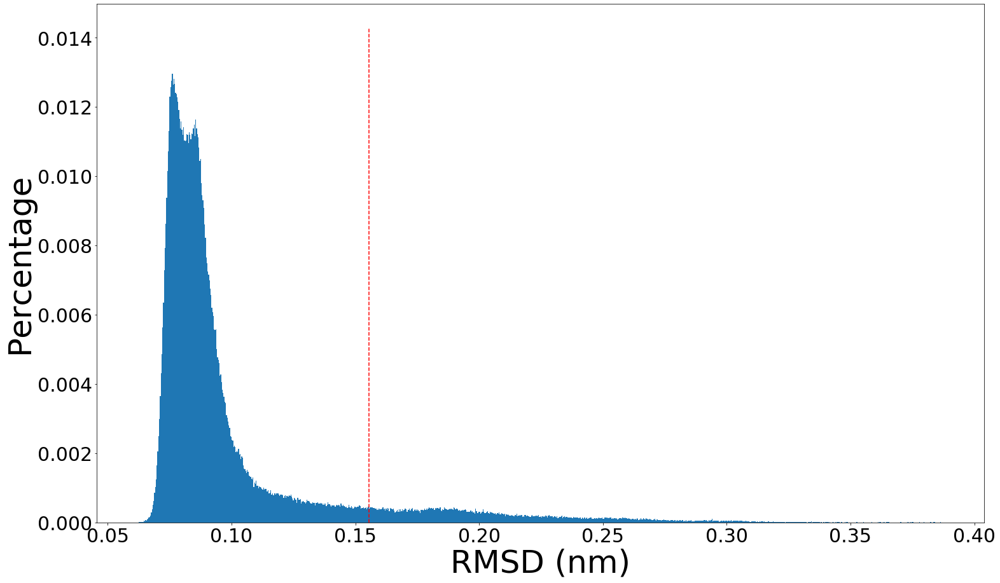

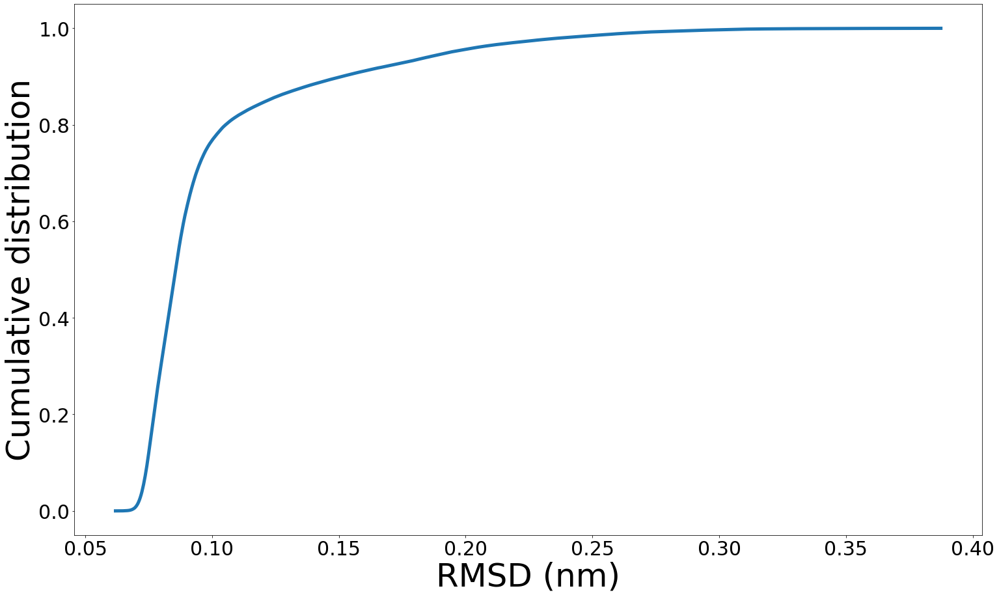

53 / 80 COMPLETE
534743
0
2000
3000
4008
5000
6003
7000
8000
9010
10000


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534468
RMSD_r = 1.09e-01 (nm)
RMSD_train = 1.32e-01 (nm)
0.39991386843295723


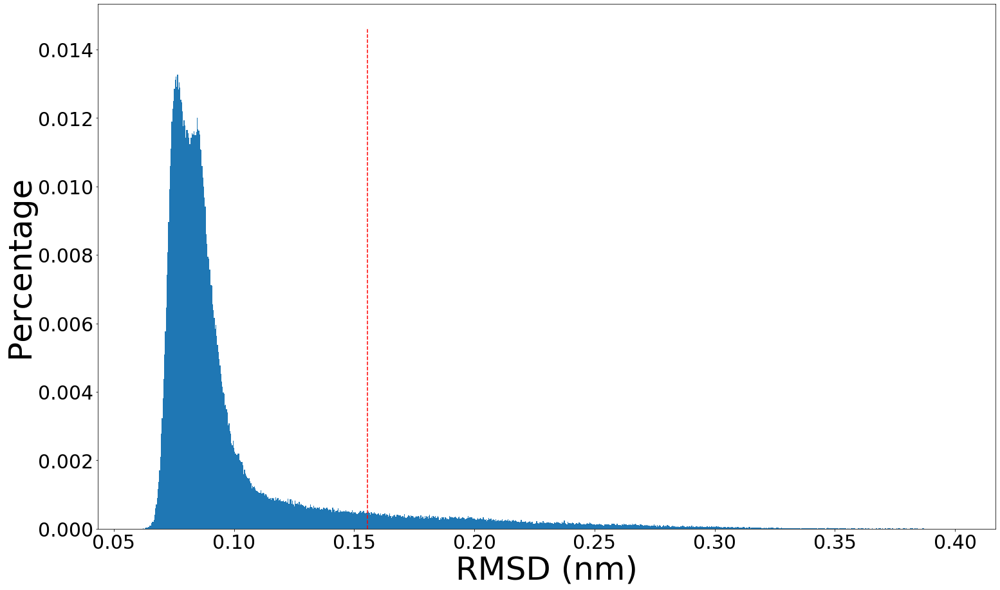

RMSD_r = 1.08e-01 (nm)
0.38914992854224323


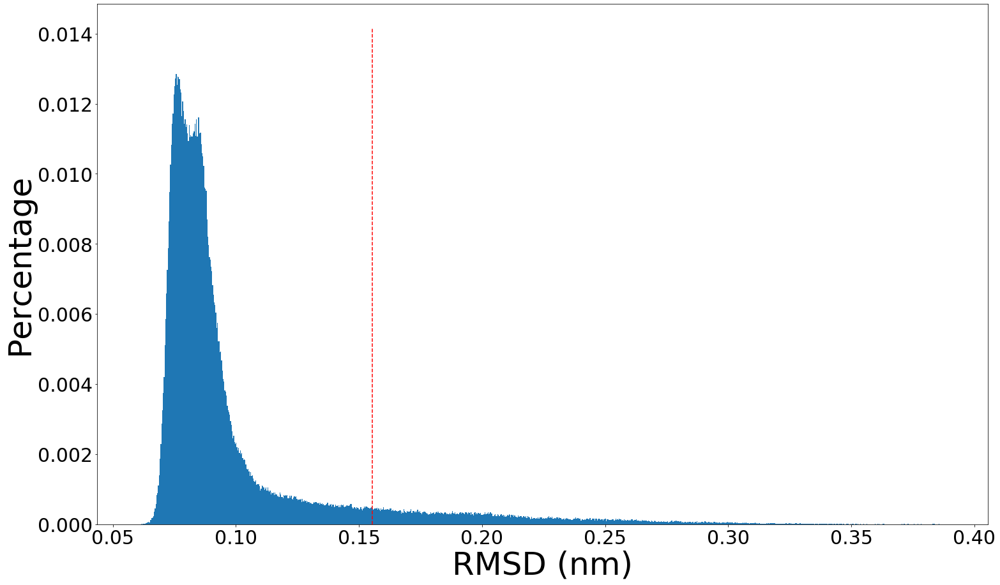

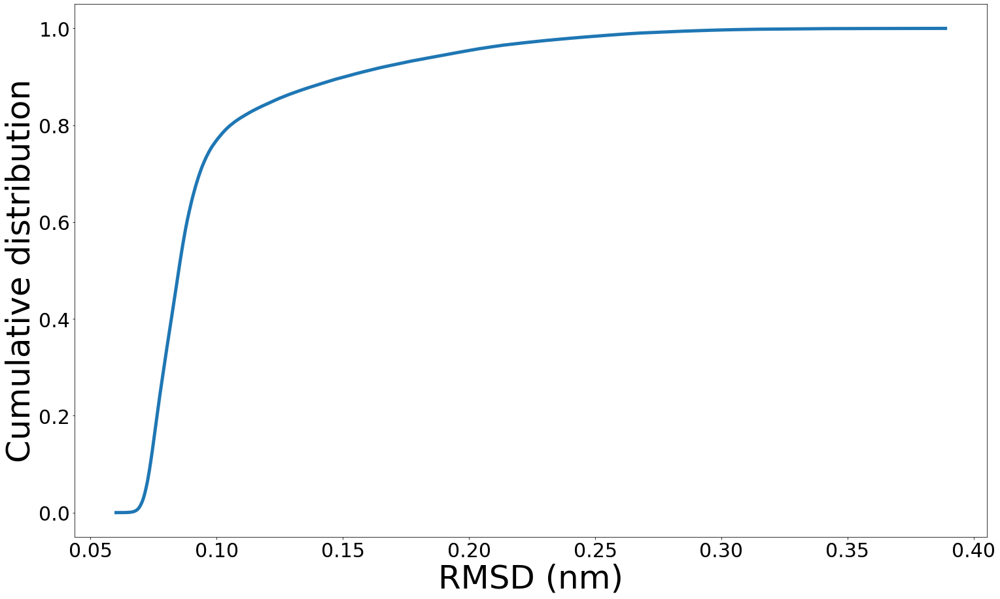

54 / 80 COMPLETE
534743
0
2000
3000
4008
5000
6003
7000
8000
9010
10000


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534468
RMSD_r = 1.10e-01 (nm)
RMSD_train = 1.32e-01 (nm)
0.3971485205160456


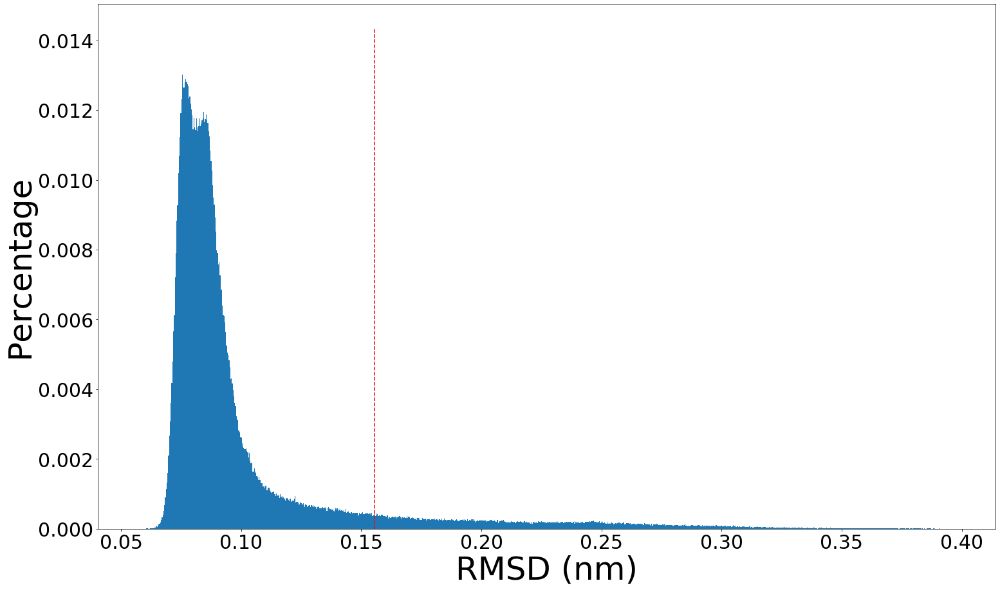

RMSD_r = 1.09e-01 (nm)
0.3915002739267606


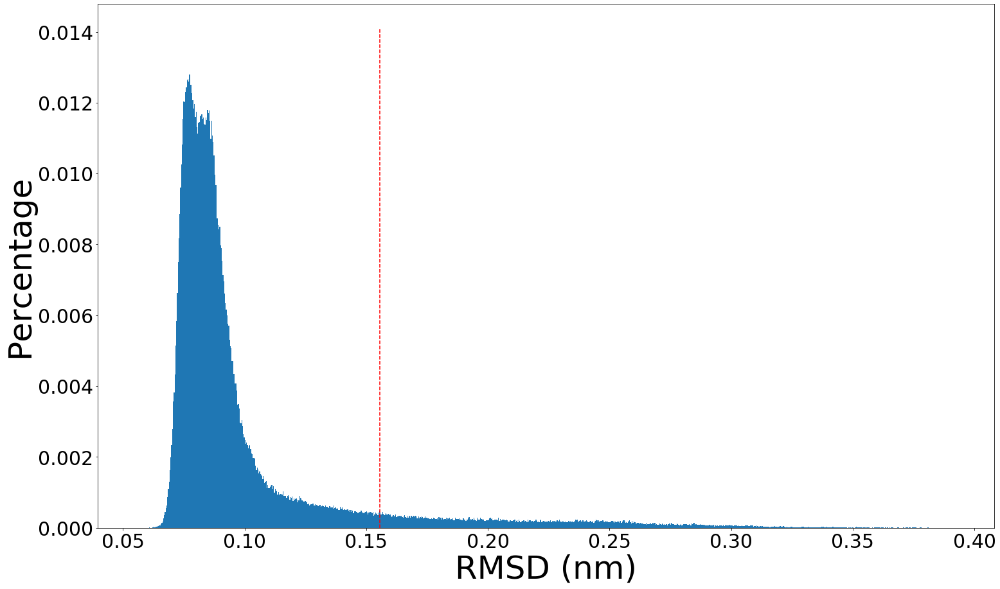

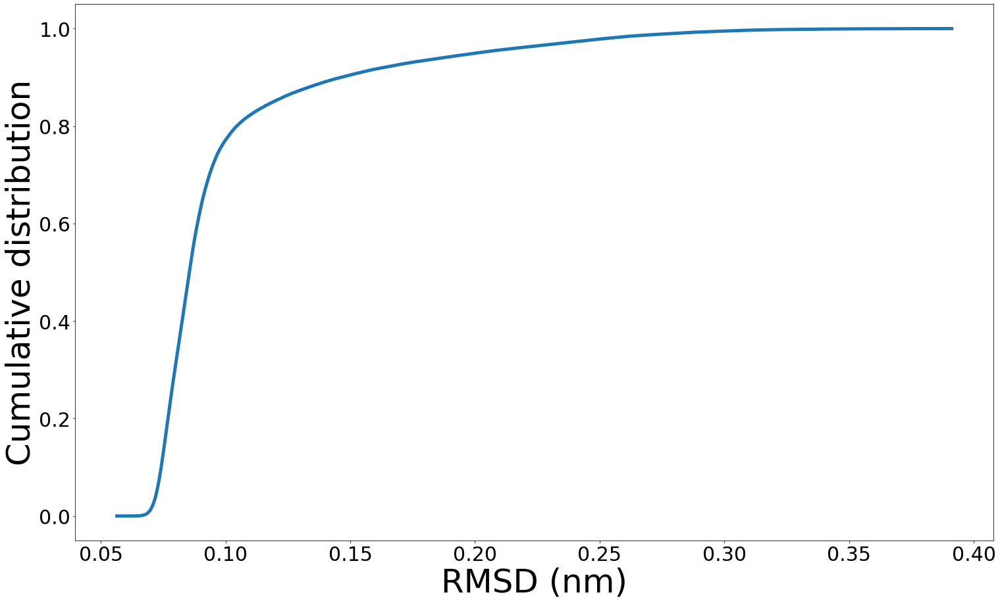

55 / 80 COMPLETE
534743
0
2000
3000
4008
5000
6003
7000
8000
9010
10000


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534468
RMSD_r = 1.09e-01 (nm)
RMSD_train = 1.33e-01 (nm)
0.4441710183194777


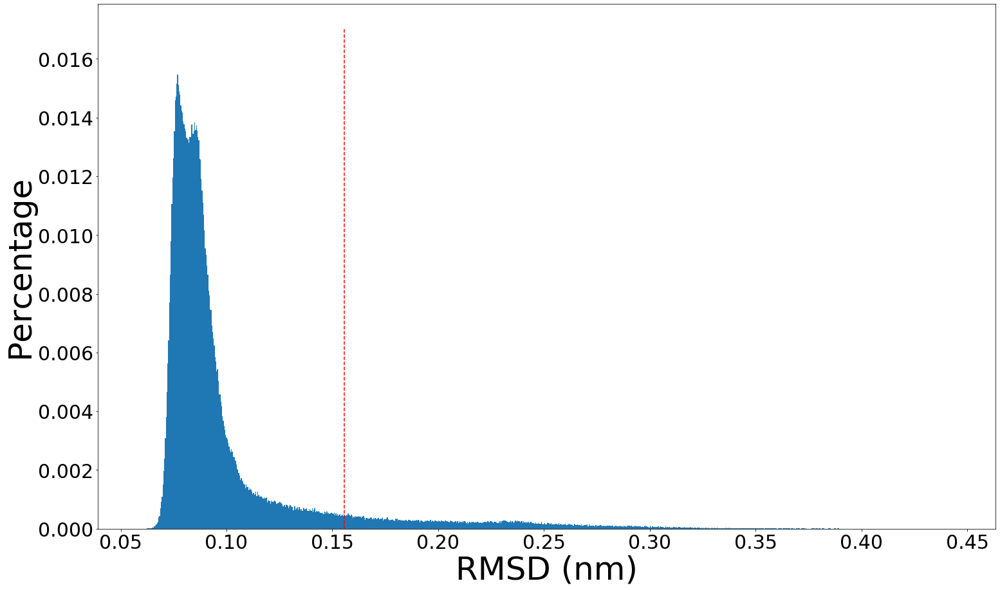

RMSD_r = 1.08e-01 (nm)
0.4120402245375225


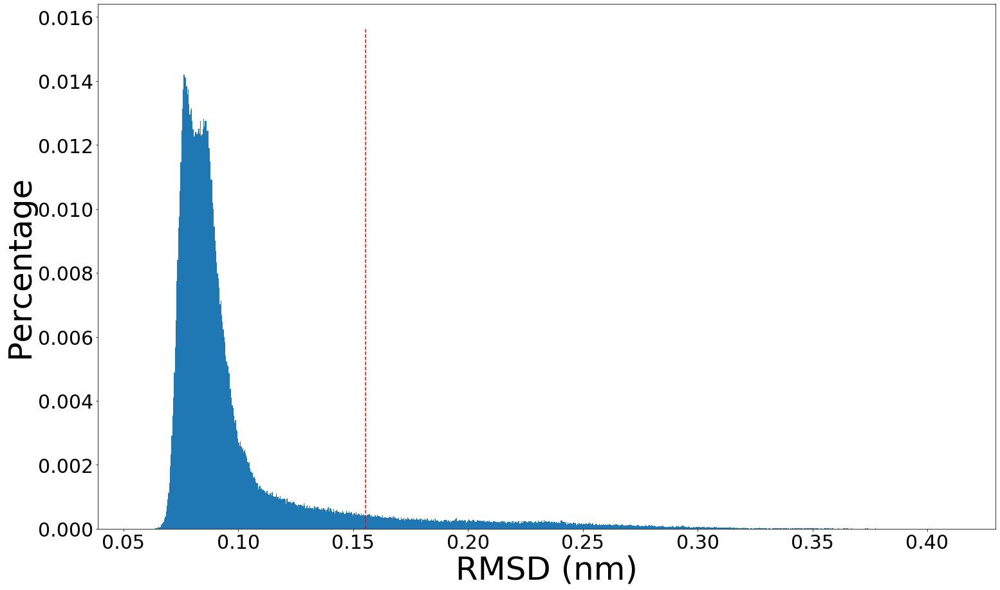

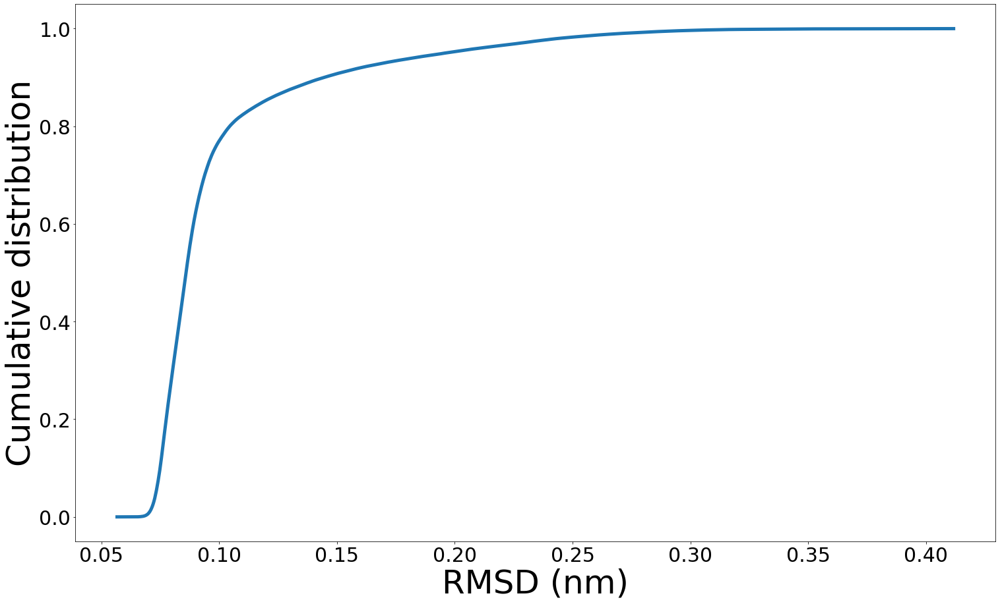

56 / 80 COMPLETE
534743
0
2000
3000
4002
5000
6000
7000
8001
9000
10000


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534193
RMSD_r = 1.08e-01 (nm)
RMSD_train = 1.44e-01 (nm)
0.42427531539169605


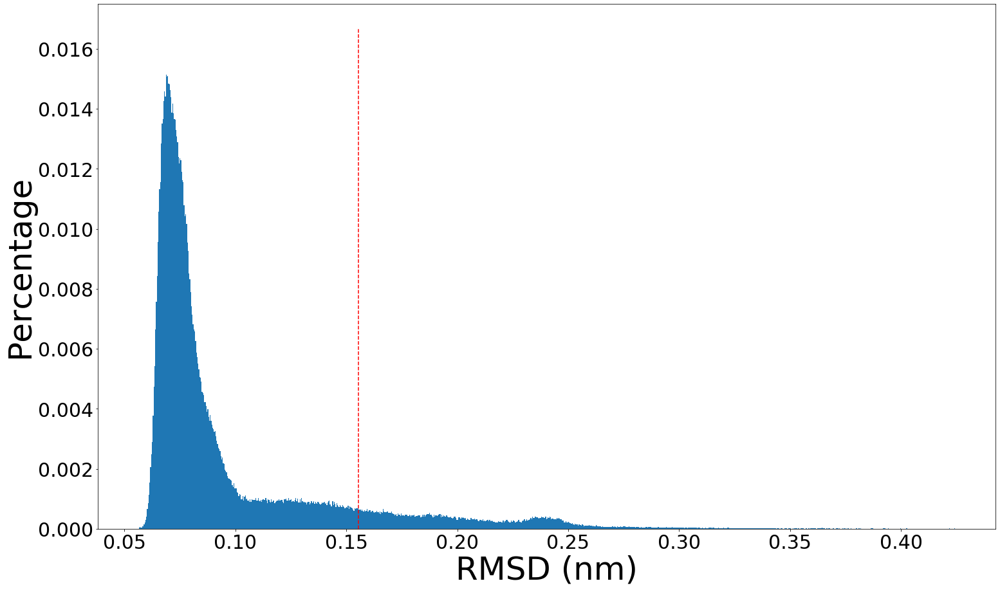

RMSD_r = 1.06e-01 (nm)
0.4150114137495419


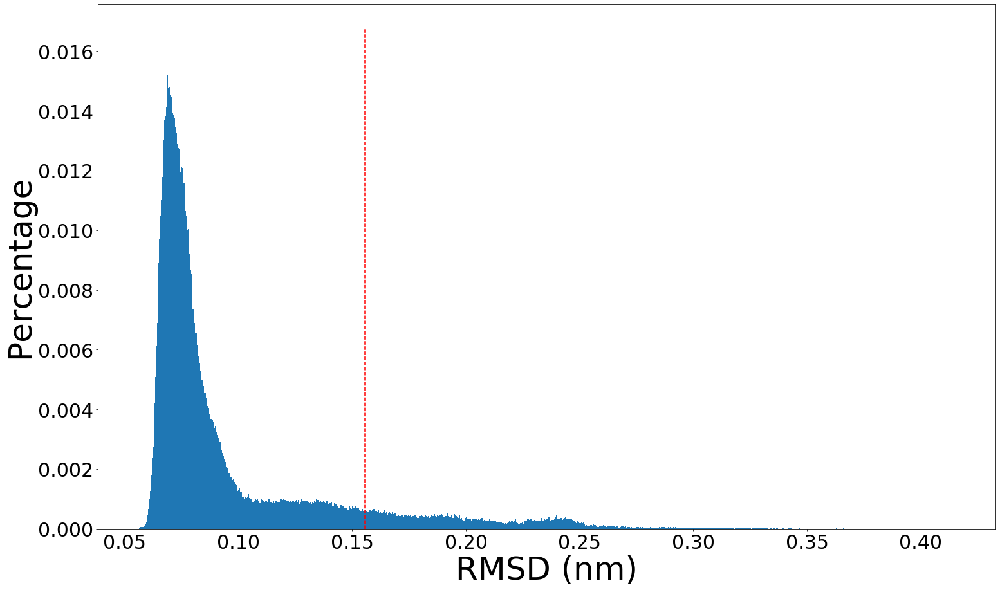

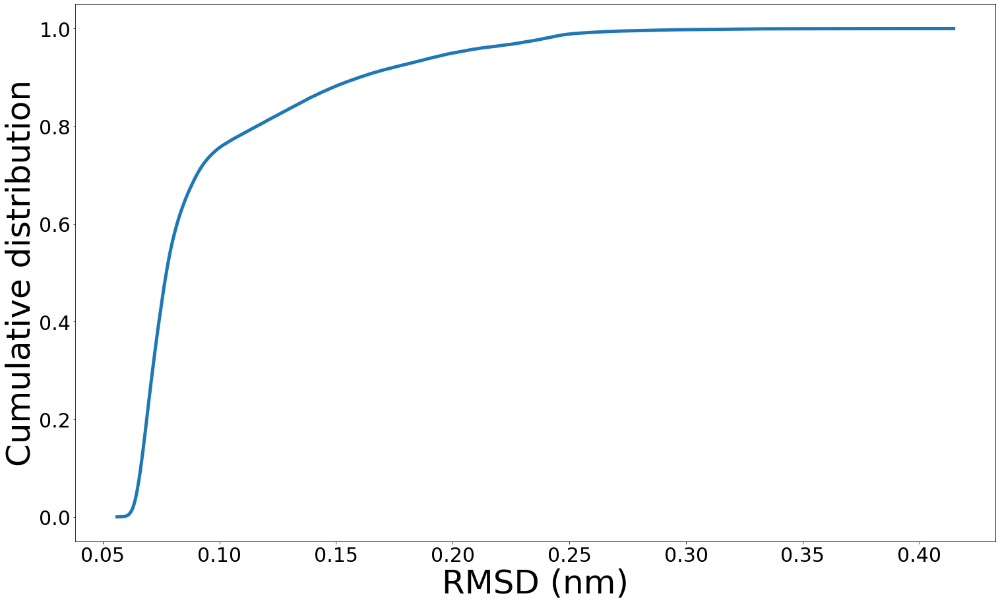

57 / 80 COMPLETE
534743
0
2000
3000
4002
5000
6000
7000
8001
9000
10000


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534193
RMSD_r = 1.08e-01 (nm)
RMSD_train = 1.43e-01 (nm)
0.4225131941020121


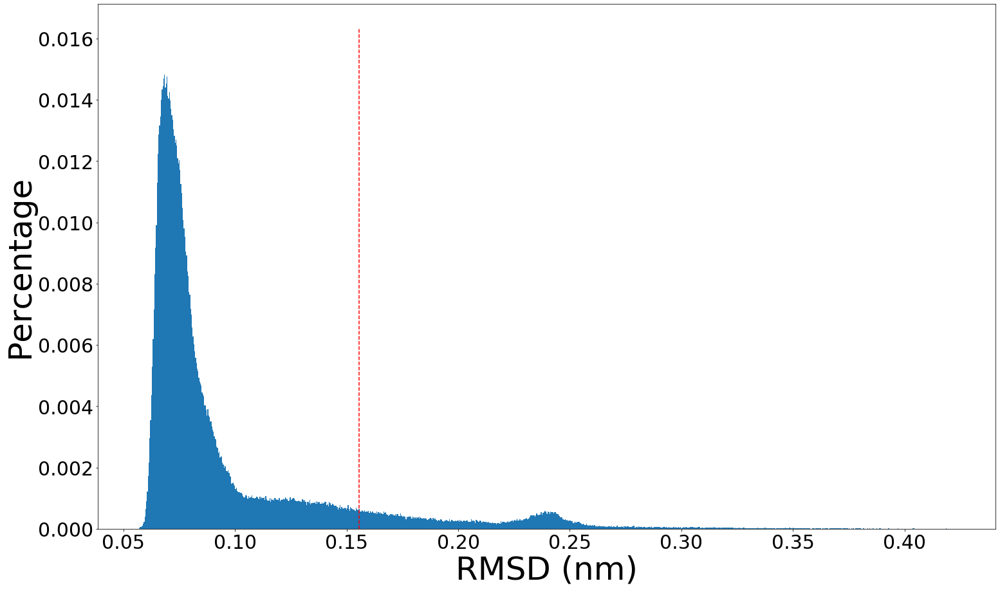

RMSD_r = 1.06e-01 (nm)
0.41644395293355396


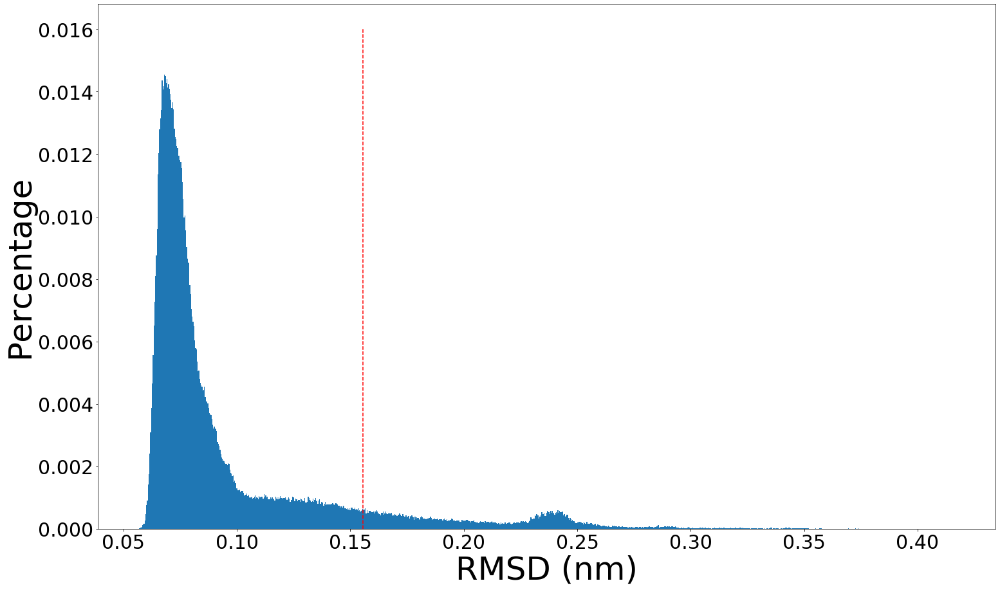

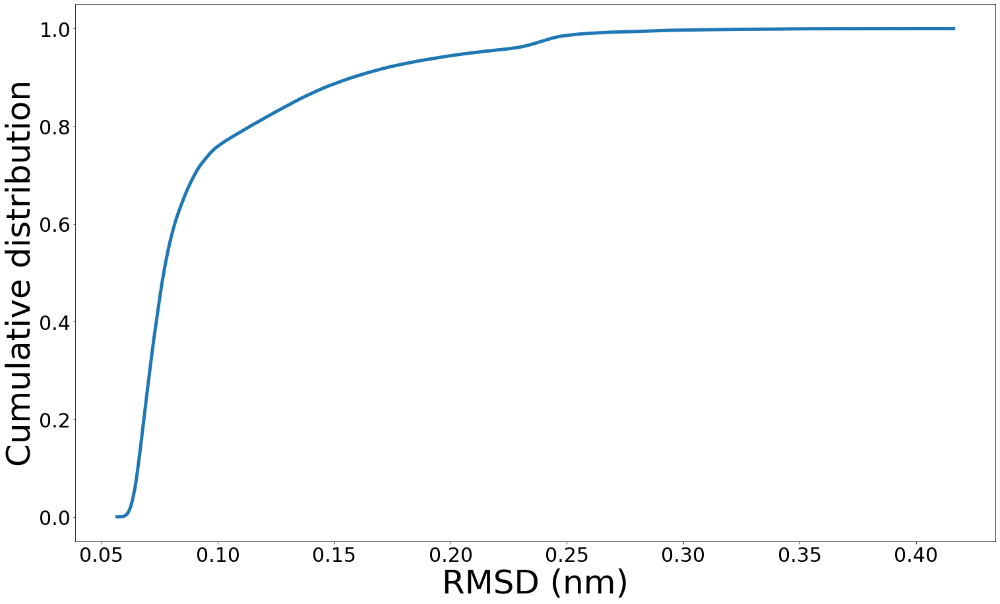

58 / 80 COMPLETE
534743
0
2000
3000
4002
5000
6000
7000
8001
9000
10000


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534193
RMSD_r = 1.08e-01 (nm)
RMSD_train = 1.43e-01 (nm)
0.43005886795536646


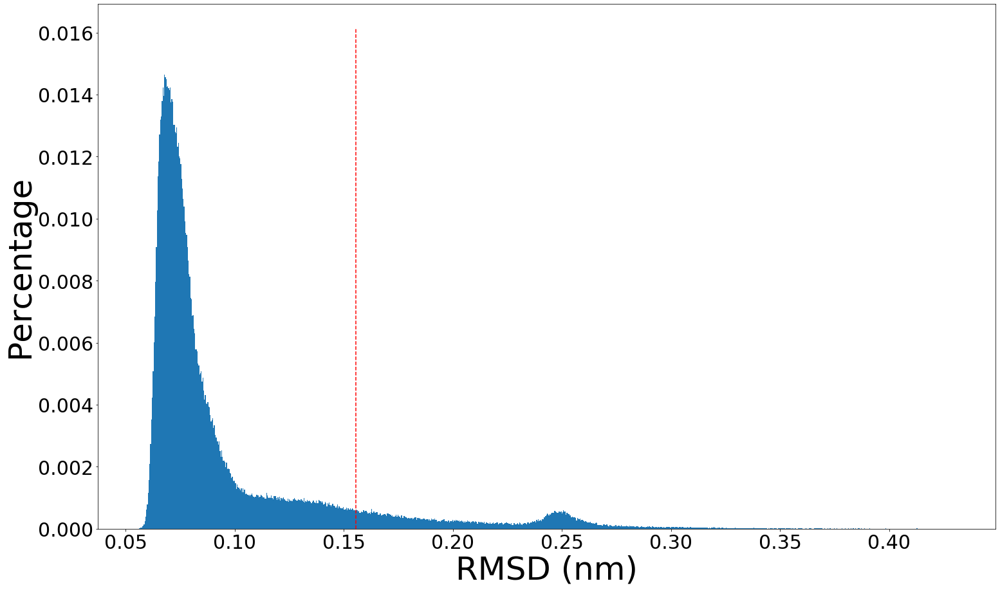

RMSD_r = 1.06e-01 (nm)
0.3964989567020535


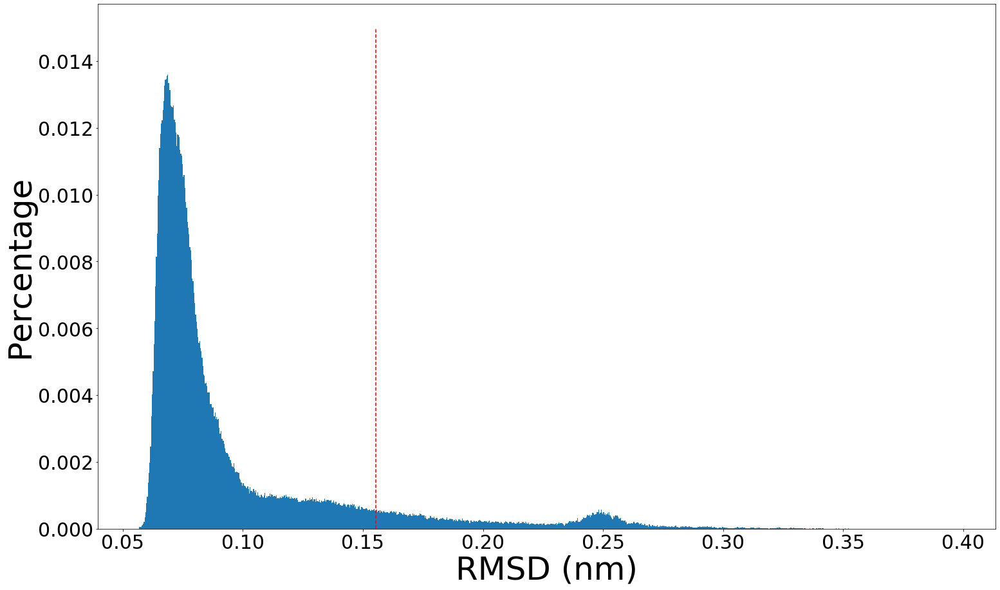

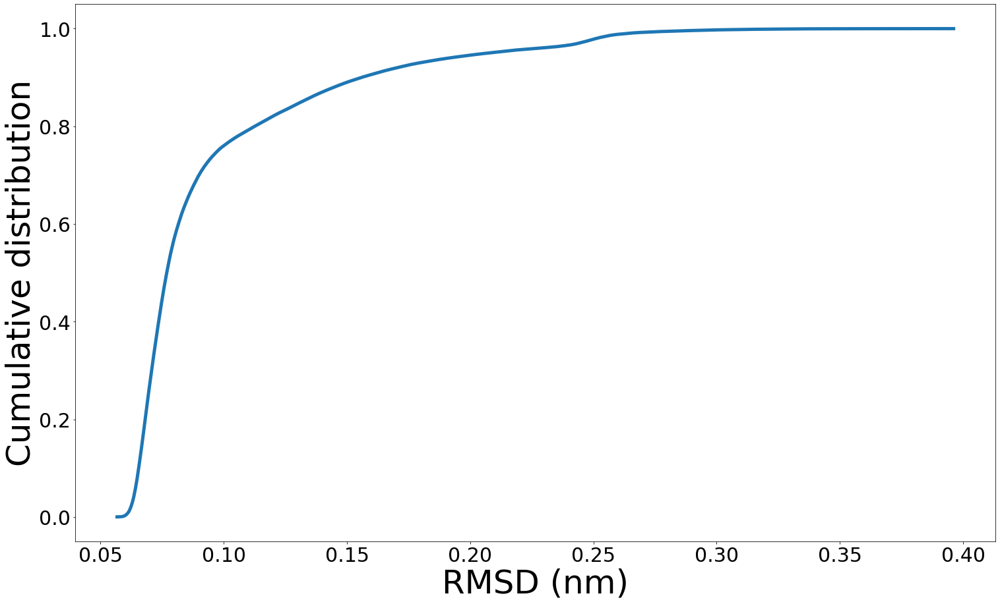

59 / 80 COMPLETE
534743
0
2000
3000
4002
5000
6000
7000
8001
9000
10000


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534193
RMSD_r = 1.09e-01 (nm)
RMSD_train = 1.46e-01 (nm)
0.45267775829934287


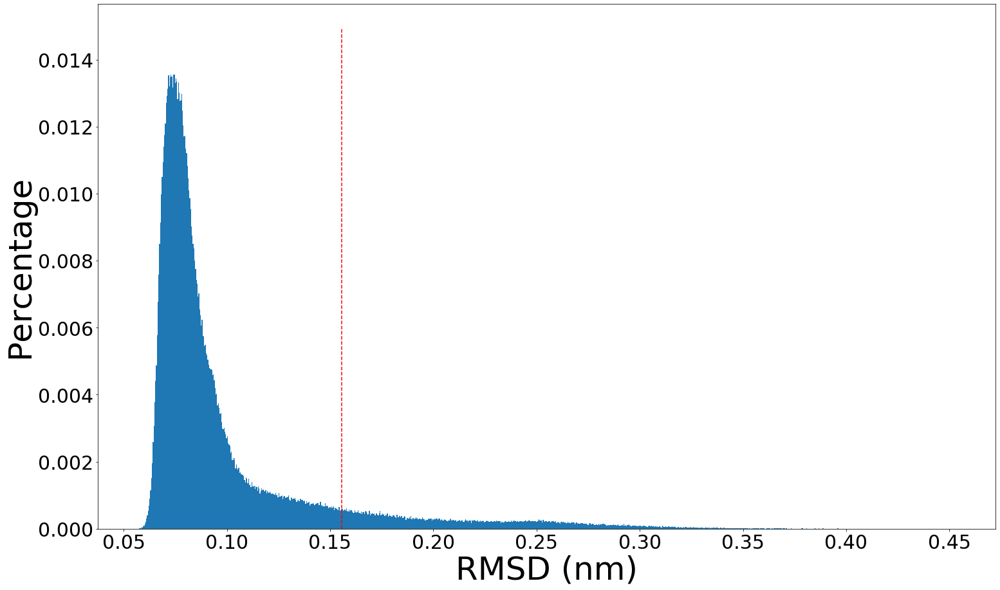

RMSD_r = 1.08e-01 (nm)
0.4405380419390728


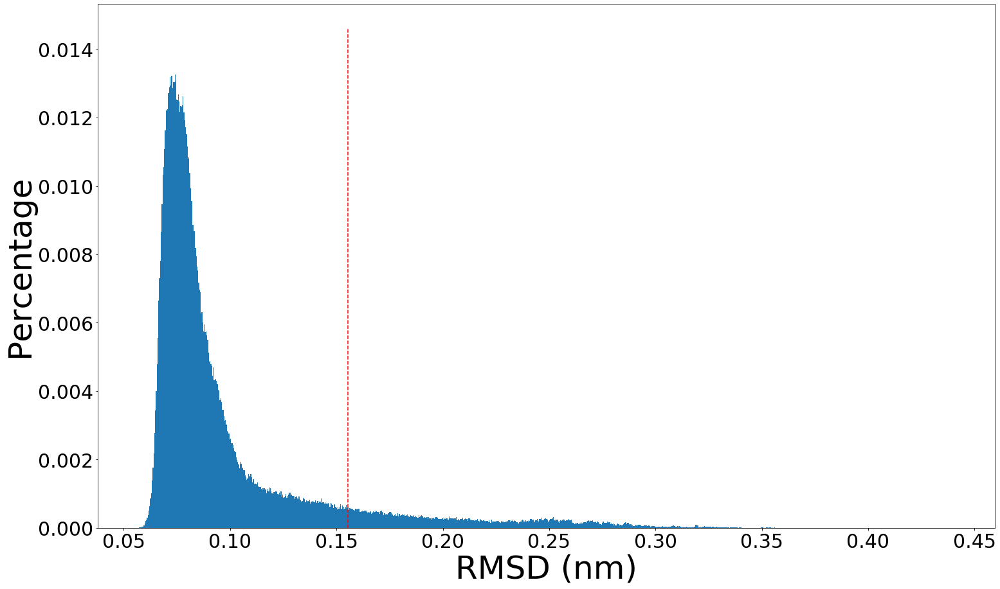

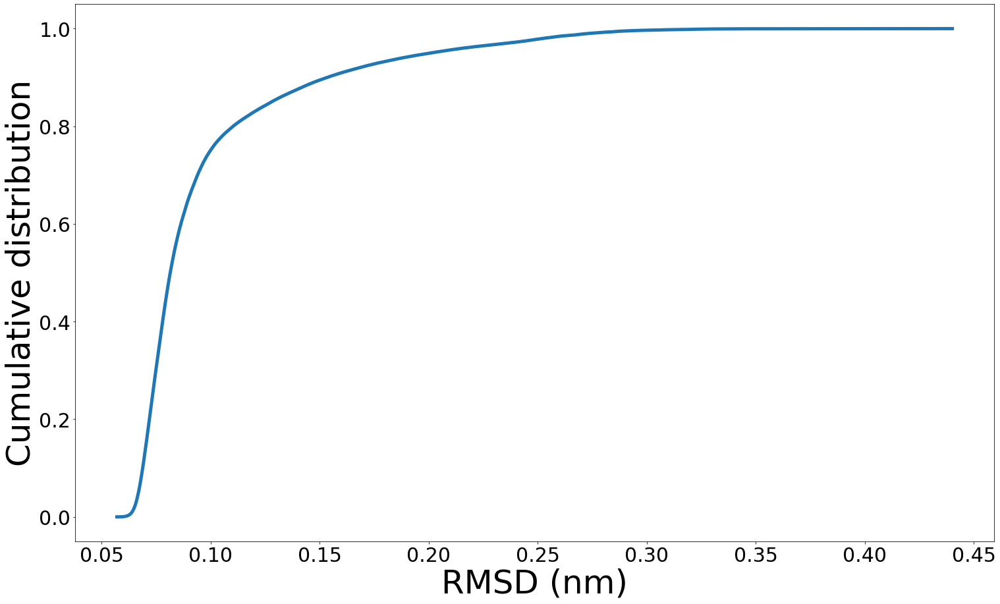

60 / 80 COMPLETE
534743
0
210
303
403
500
603
700
800
901
1005


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534732
RMSD_r = 2.69e-01 (nm)
RMSD_train = 2.41e-01 (nm)
0.3844619799077305


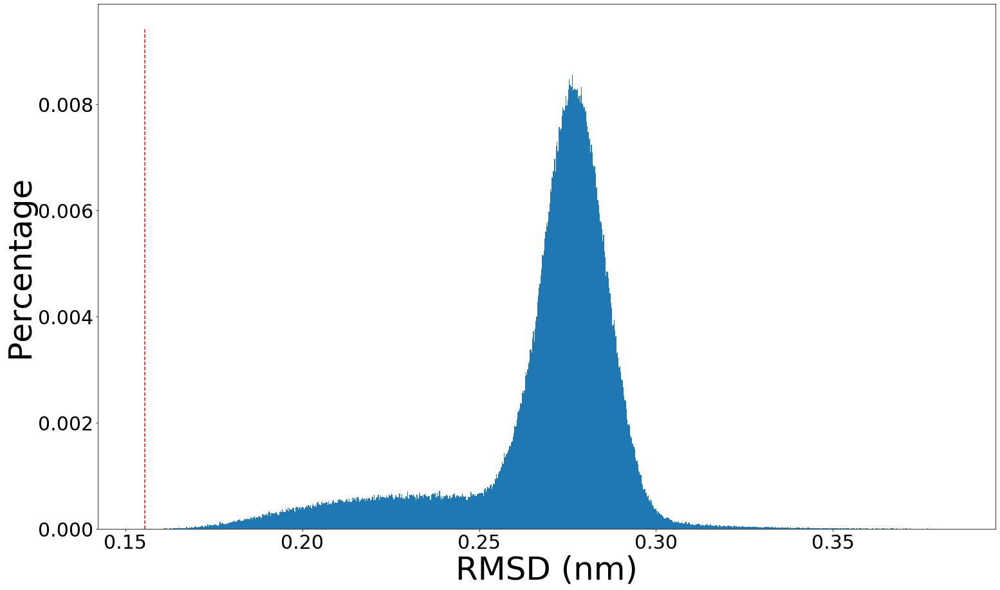

RMSD_r = 2.69e-01 (nm)
0.3844619799077305


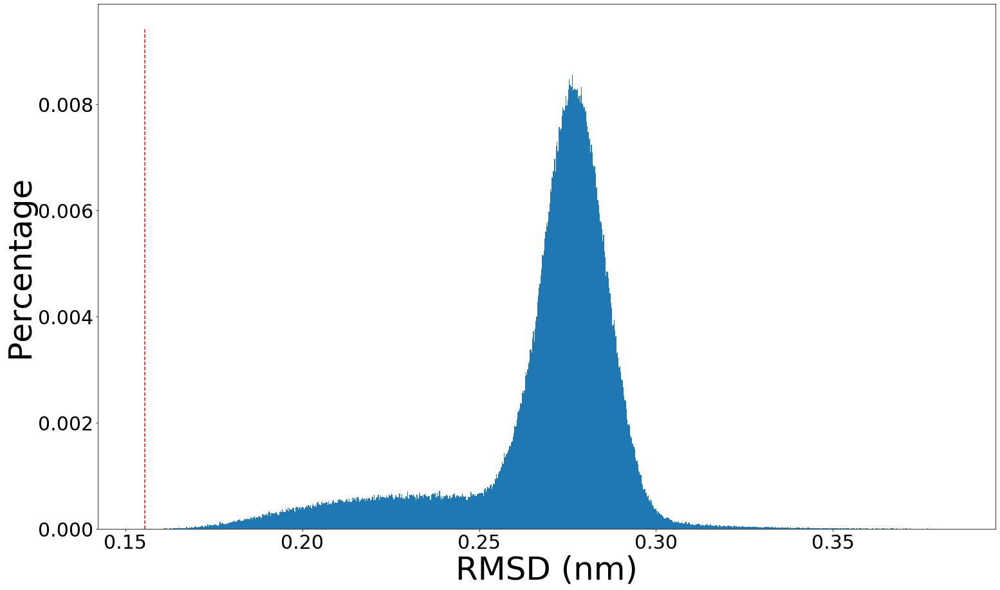

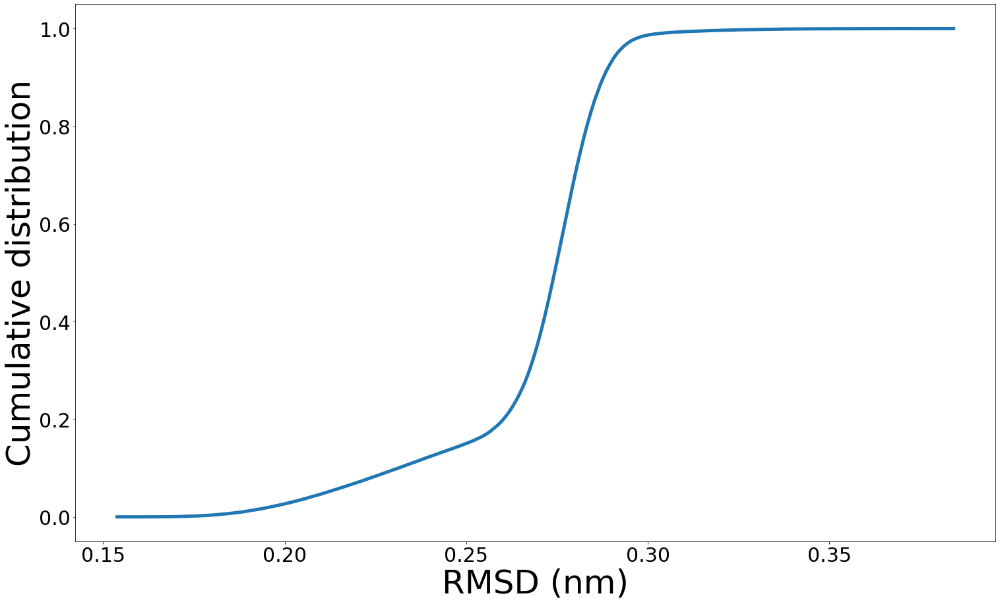

61 / 80 COMPLETE
534743
0
210
303
403
500
603
700
800
901
1005


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534732
RMSD_r = 2.67e-01 (nm)
RMSD_train = 2.39e-01 (nm)
0.3799521391756353


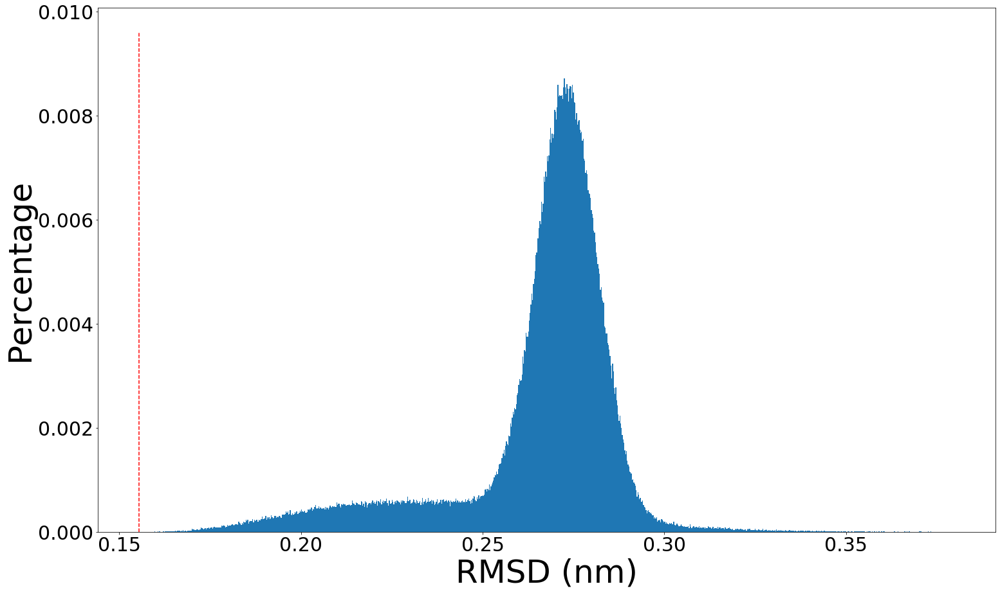

RMSD_r = 2.67e-01 (nm)
0.3799521391756353


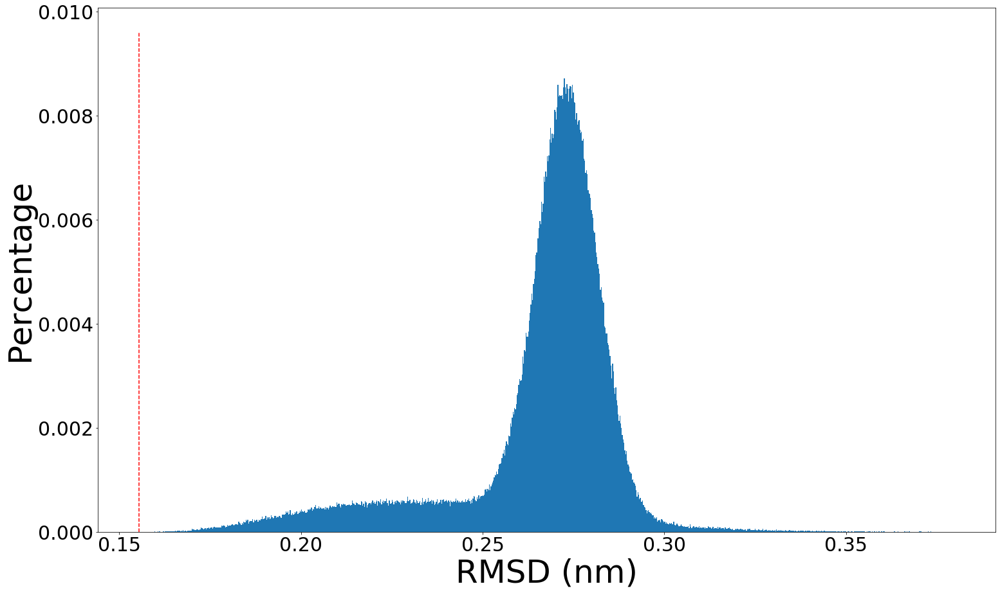

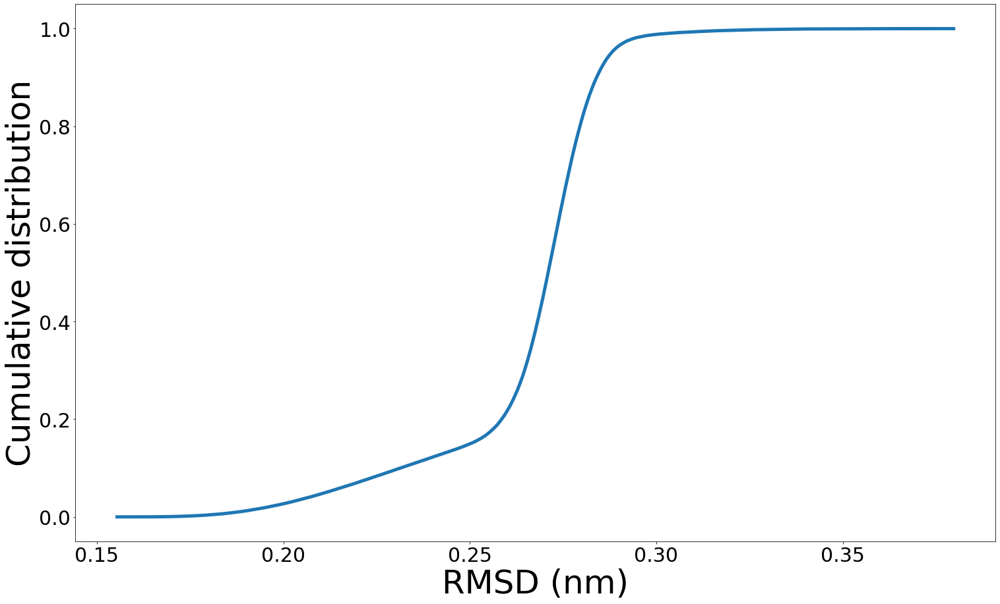

62 / 80 COMPLETE
534743
0
210
303
403
500
603
700
800
901
1005


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534732
RMSD_r = 2.81e-01 (nm)
RMSD_train = 2.43e-01 (nm)
0.3880710510937815


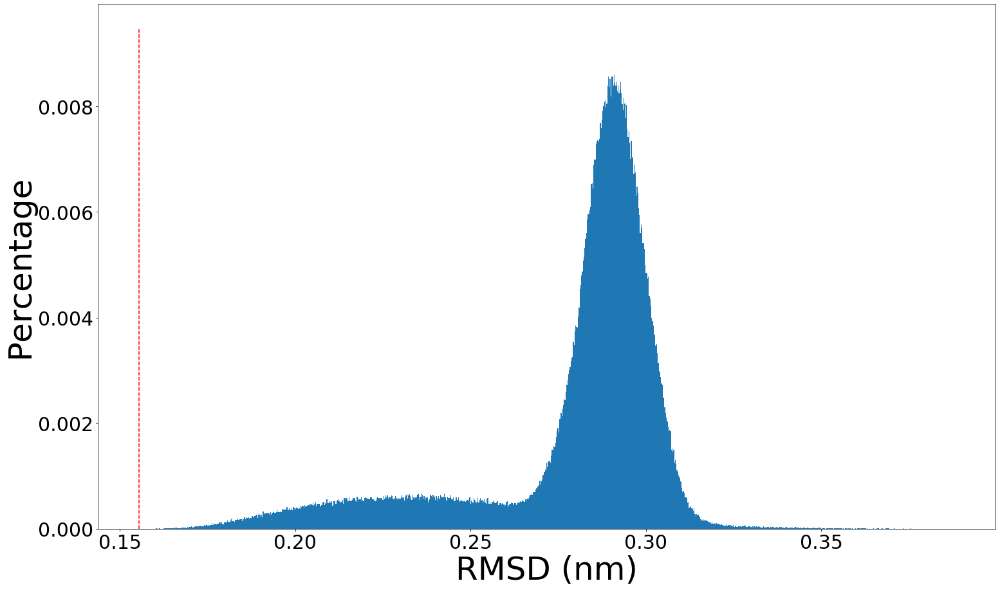

RMSD_r = 2.81e-01 (nm)
0.3880710510937815


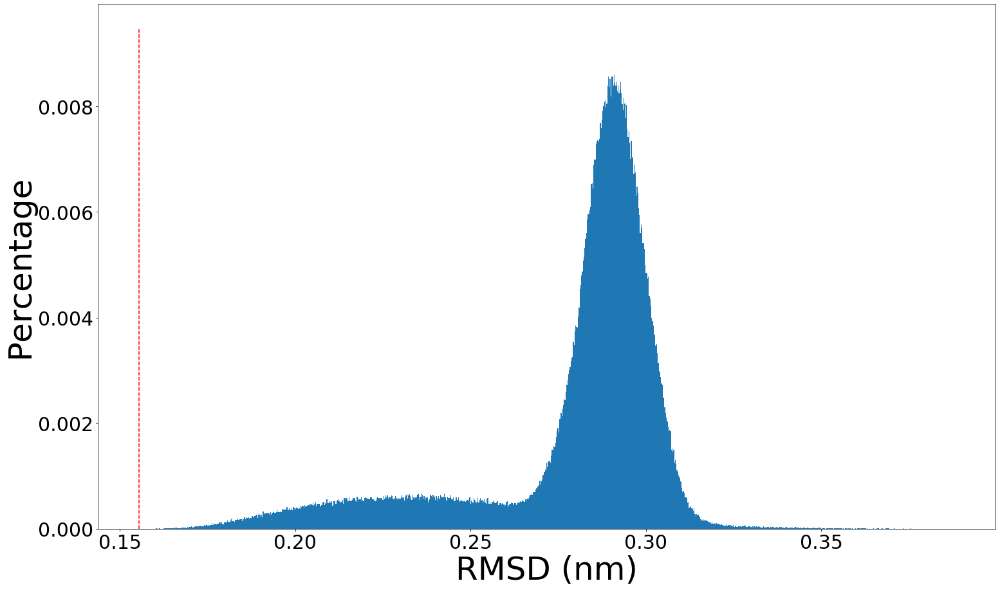

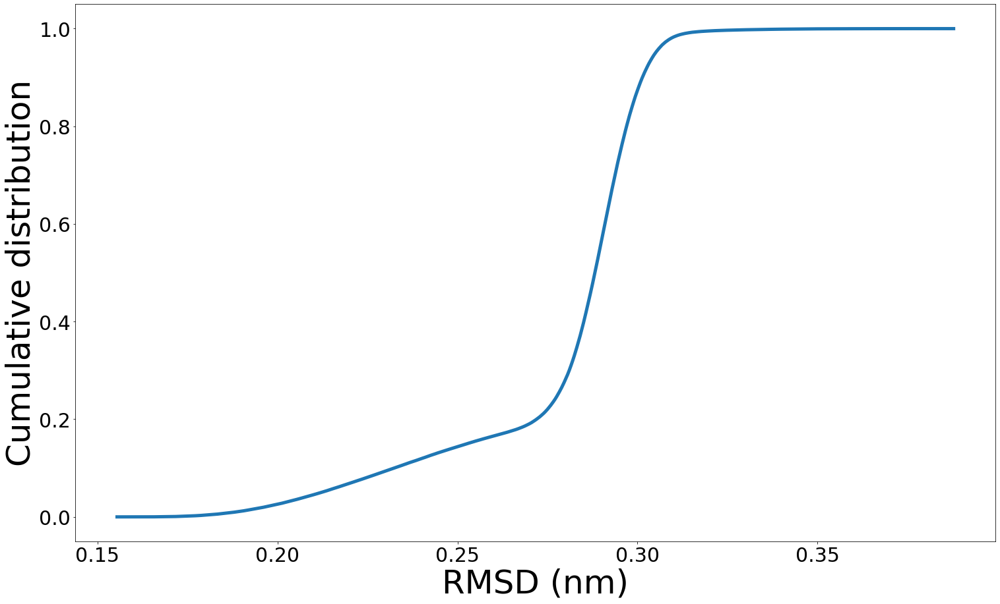

63 / 80 COMPLETE
534743
0
210
303
403
500
603
700
800
901
1005


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534732
RMSD_r = 2.86e-01 (nm)
RMSD_train = 2.44e-01 (nm)
0.3862116141371991


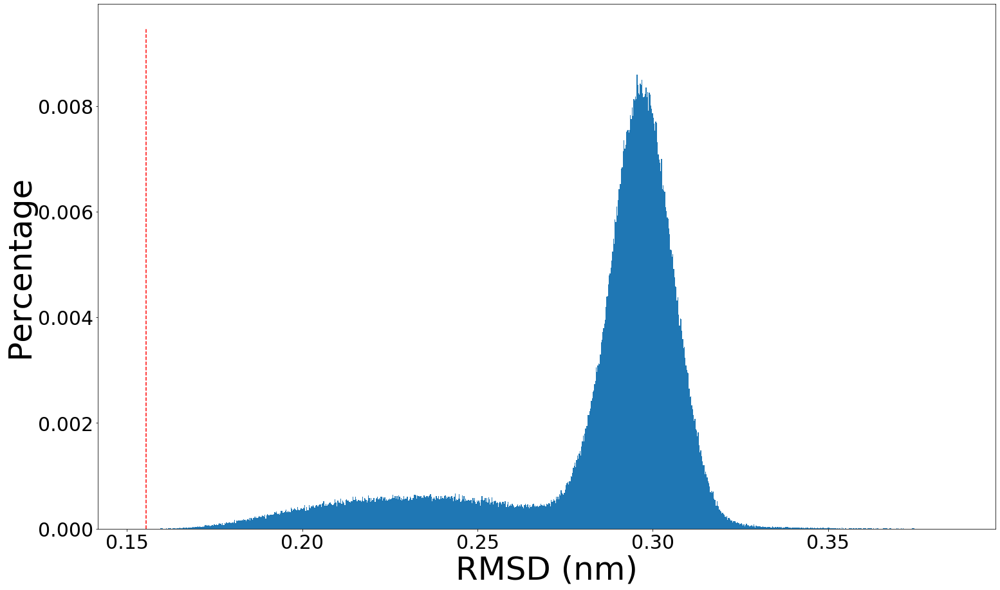

RMSD_r = 2.86e-01 (nm)
0.3862116141371991


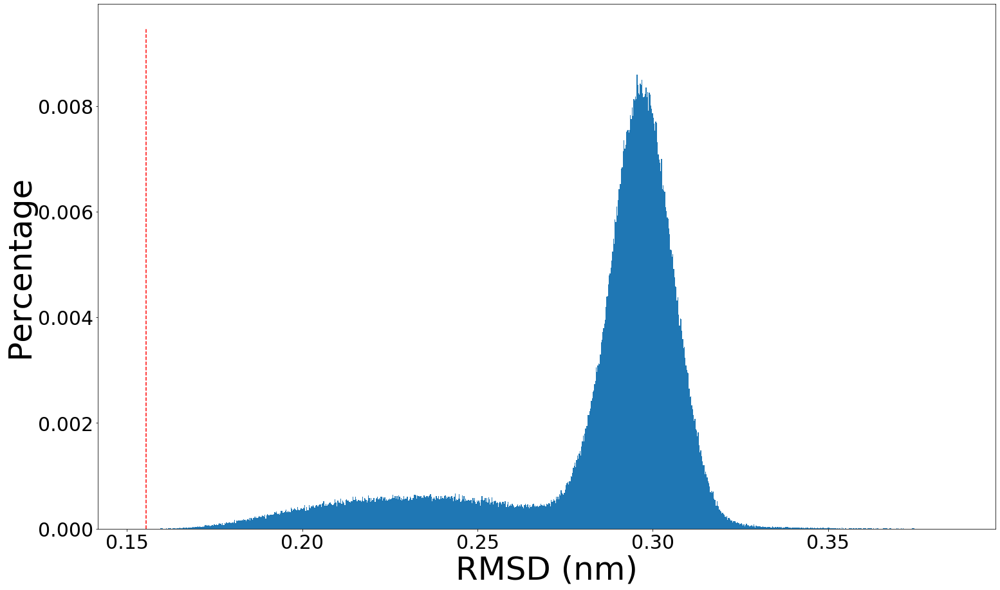

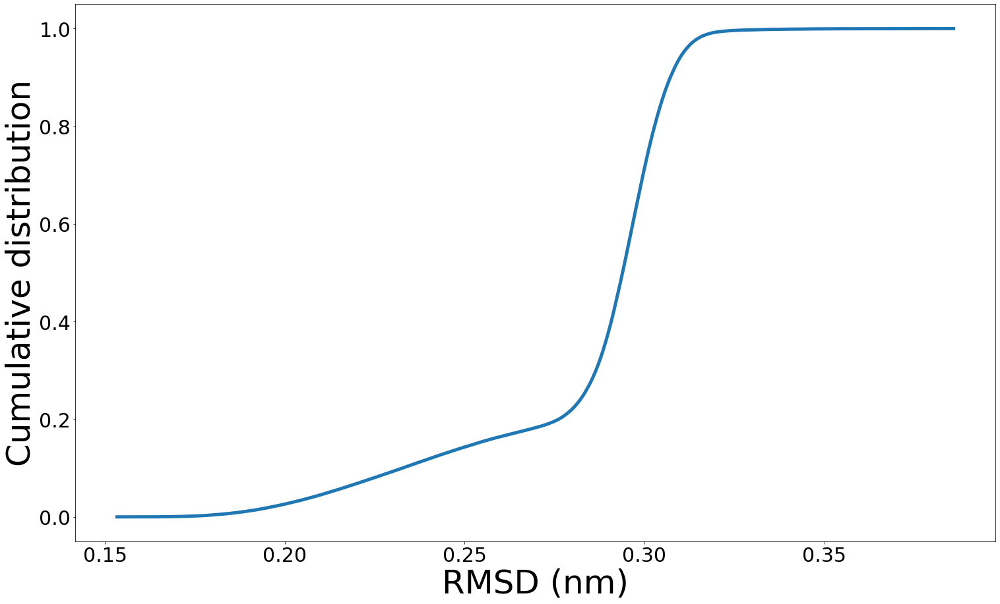

64 / 80 COMPLETE
534743
0
200
300
407
501
600
701
800
907
1006


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534688
RMSD_r = 2.51e-01 (nm)
RMSD_train = 1.95e-01 (nm)
0.3418165412615032


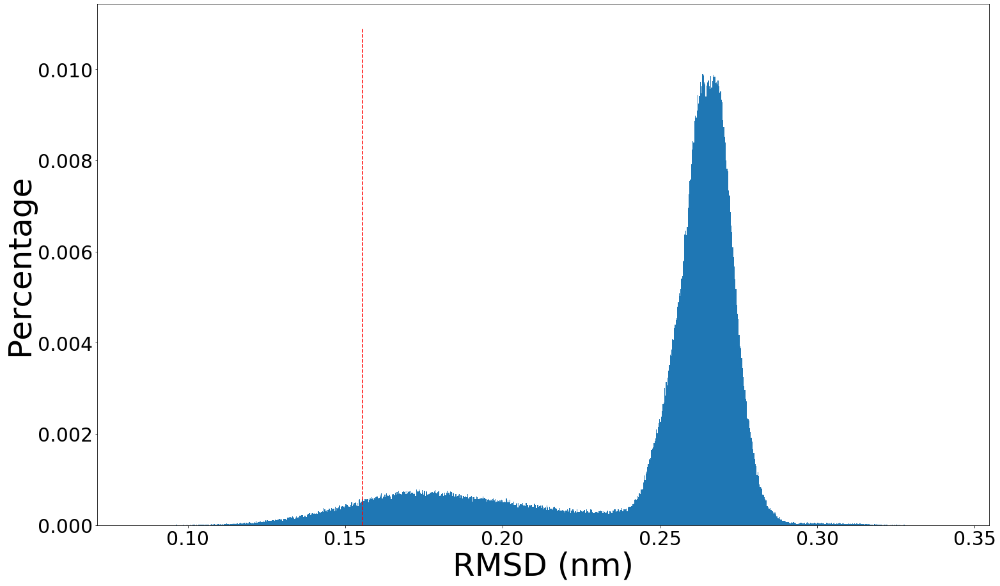

RMSD_r = 2.51e-01 (nm)
0.3418165412615032


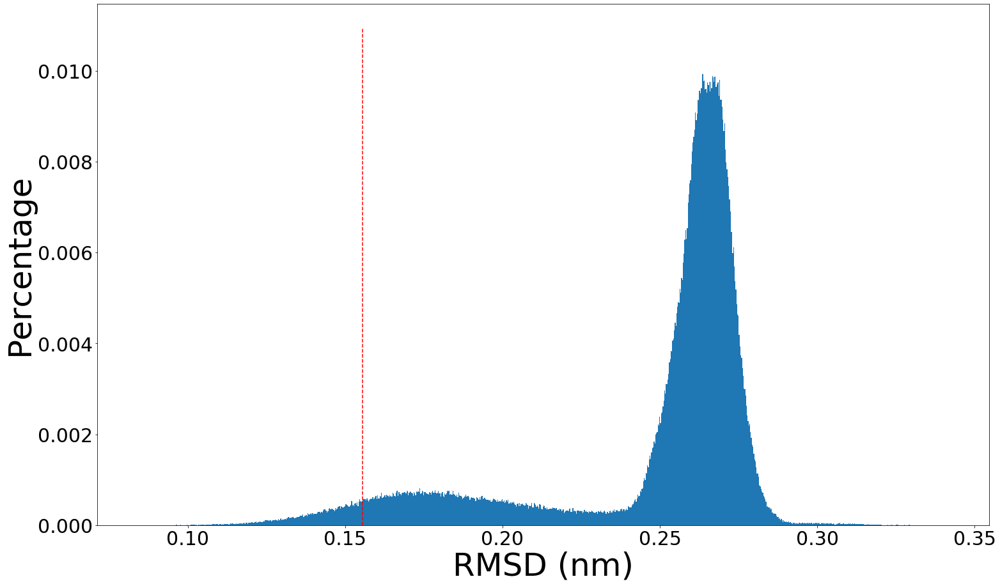

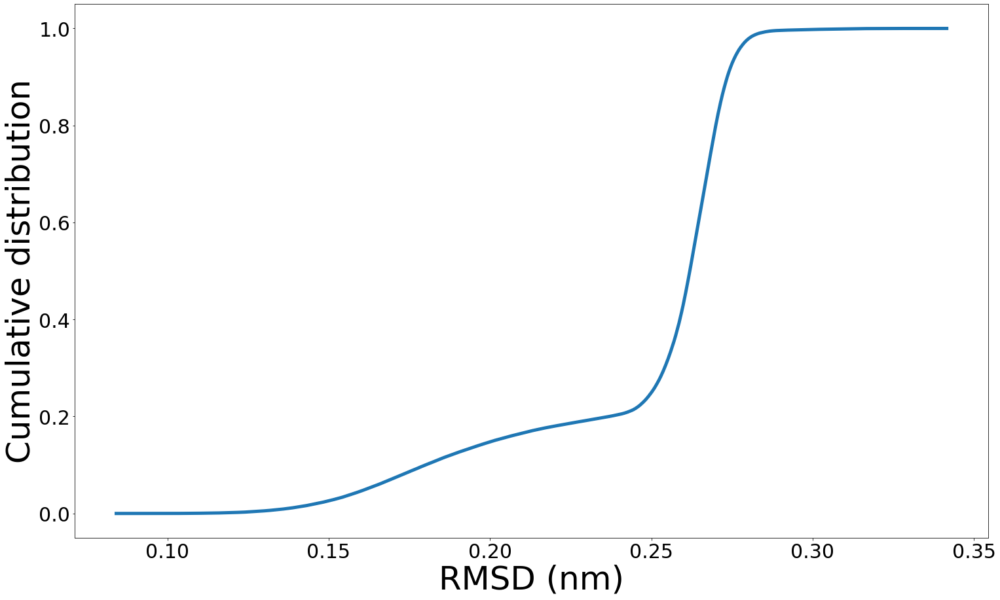

65 / 80 COMPLETE
534743
0
200
300
407
501
600
701
800
907
1006


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534688
RMSD_r = 2.18e-01 (nm)
RMSD_train = 1.87e-01 (nm)
0.32366606675960435


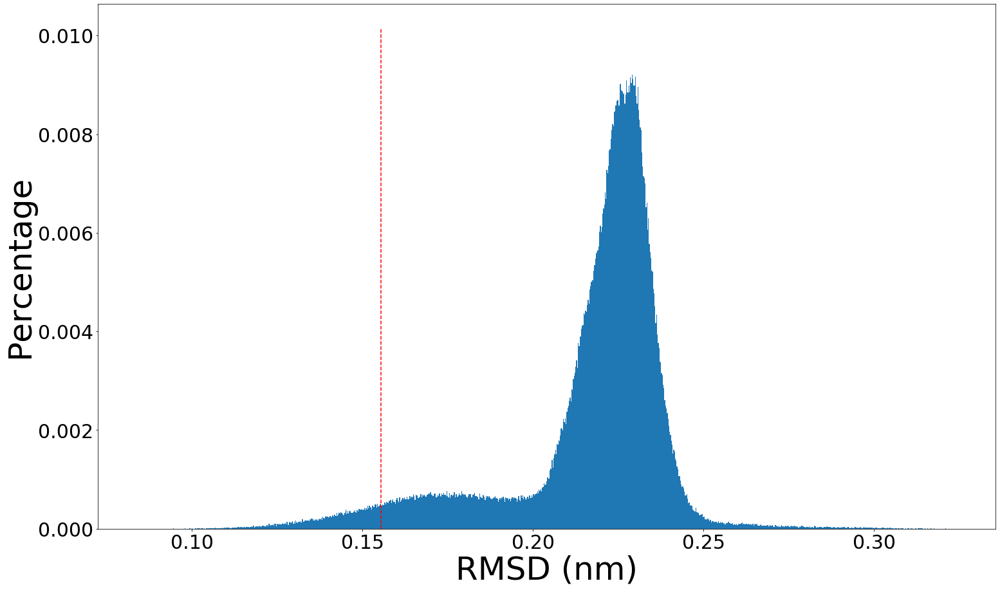

RMSD_r = 2.18e-01 (nm)
0.3233499269370069


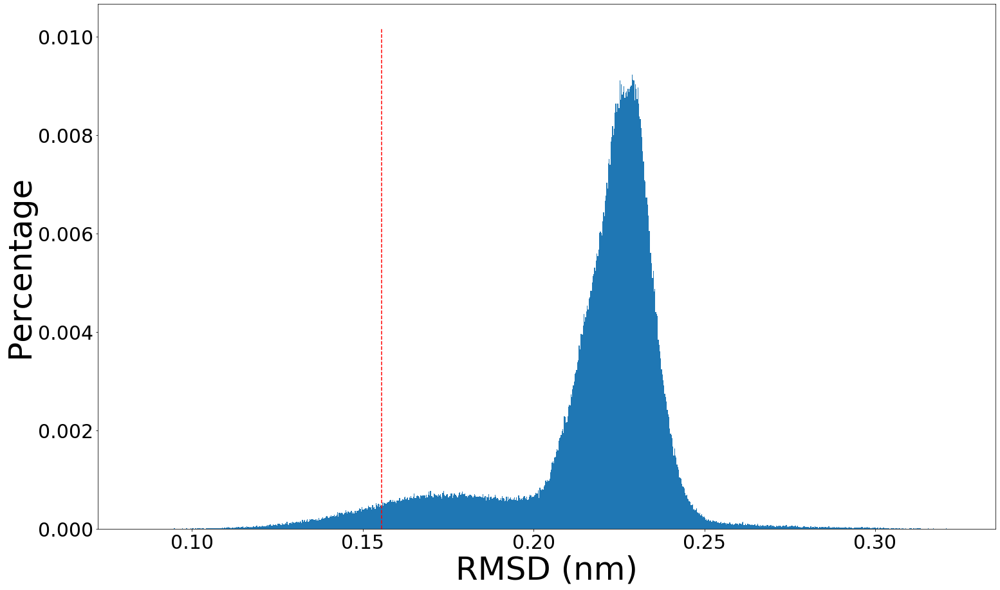

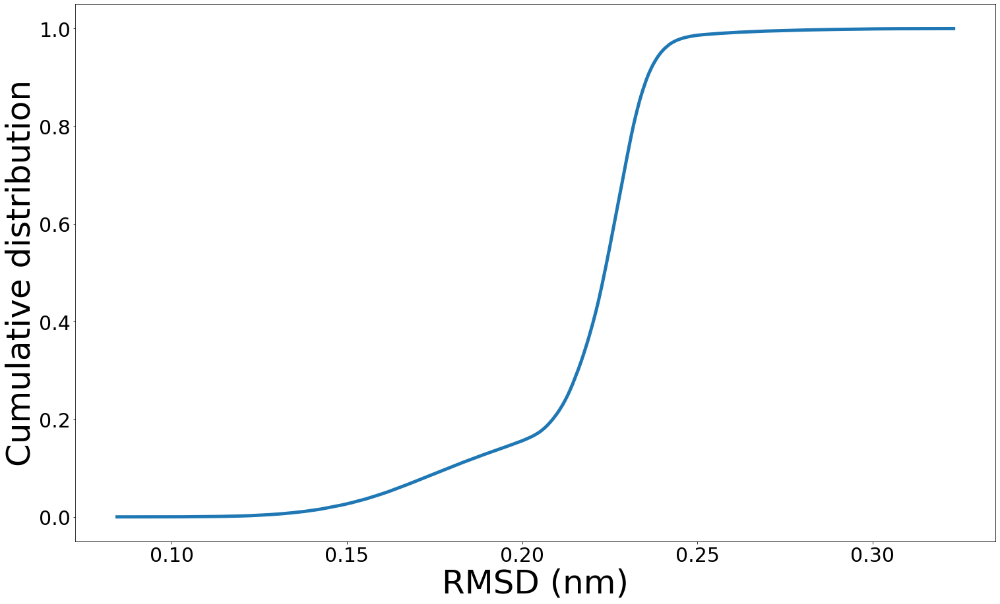

66 / 80 COMPLETE
534743
0
200
300
407
501
600
701
800
907
1006


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534688
RMSD_r = 2.30e-01 (nm)
RMSD_train = 1.89e-01 (nm)
0.3227131998771975


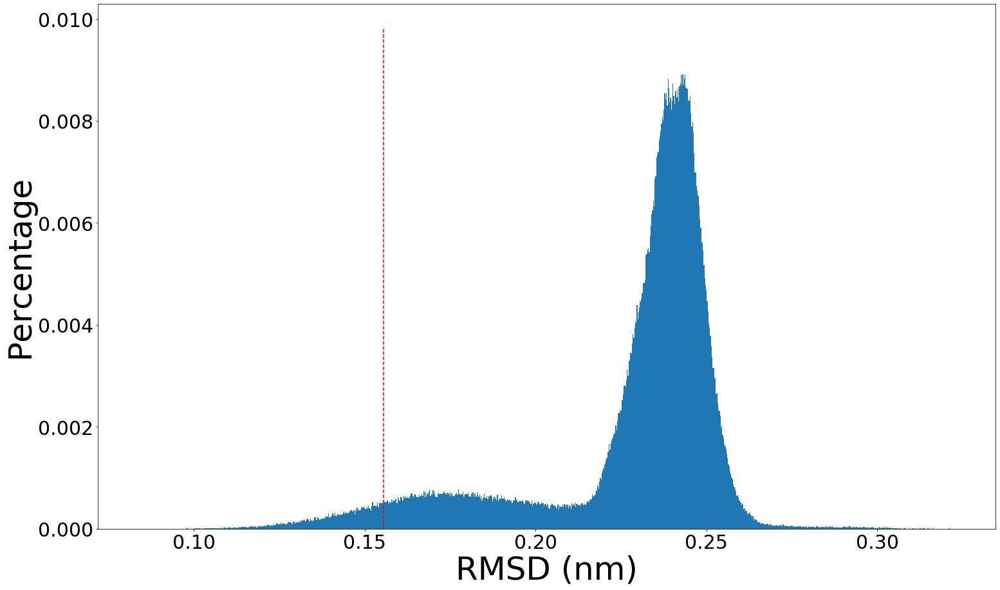

RMSD_r = 2.30e-01 (nm)
0.3227131998771975


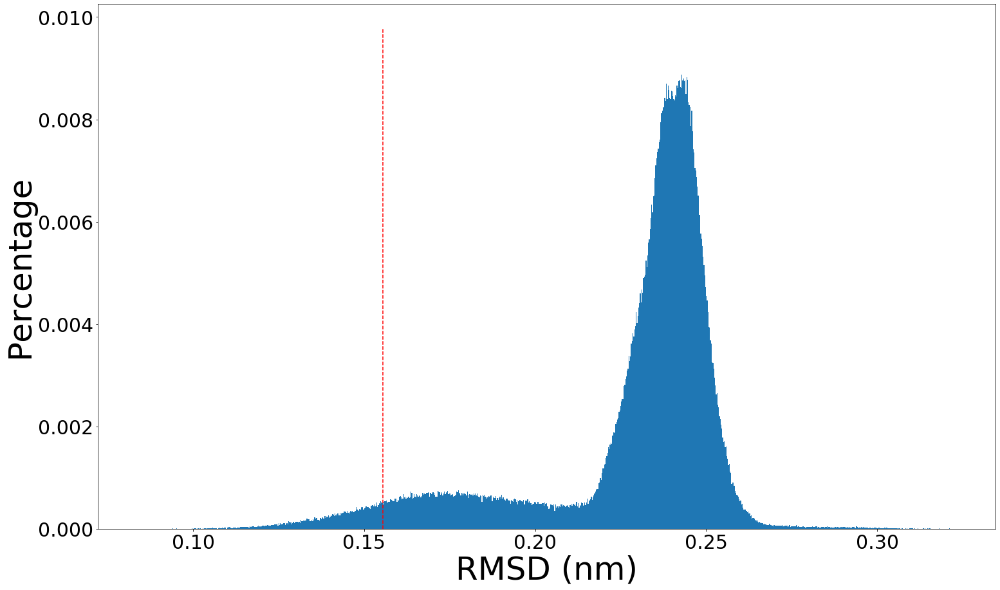

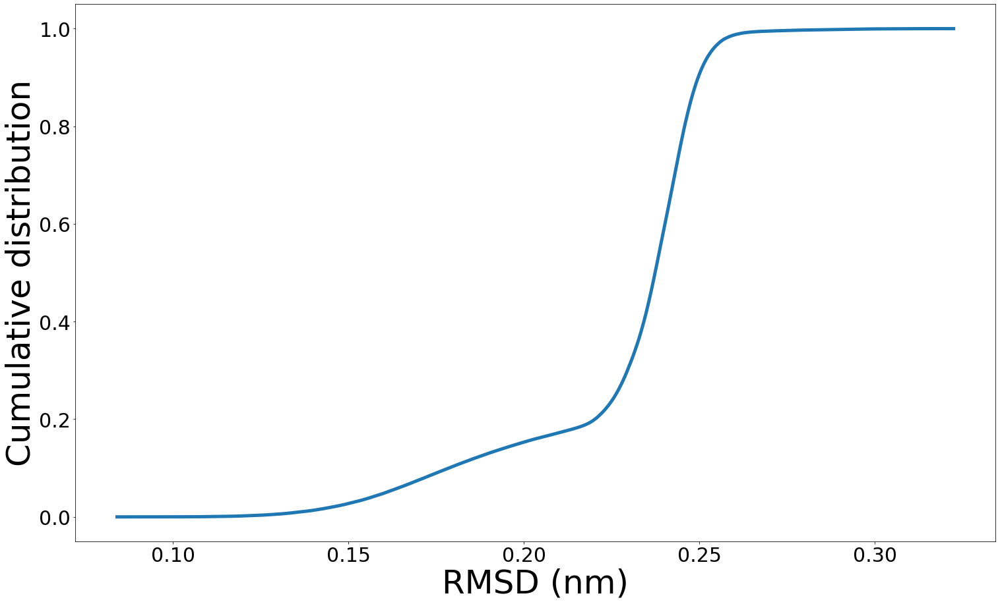

67 / 80 COMPLETE
534743
0
200
300
407
501
600
701
800
907
1006


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534688
RMSD_r = 2.69e-01 (nm)
RMSD_train = 2.02e-01 (nm)
0.33378503820152117


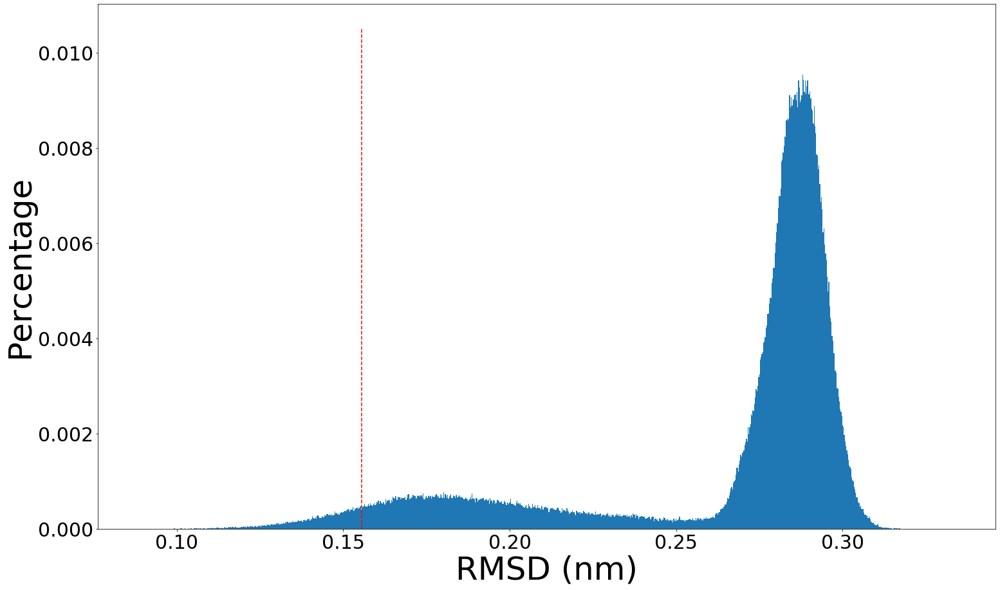

RMSD_r = 2.69e-01 (nm)
0.33378503820152117


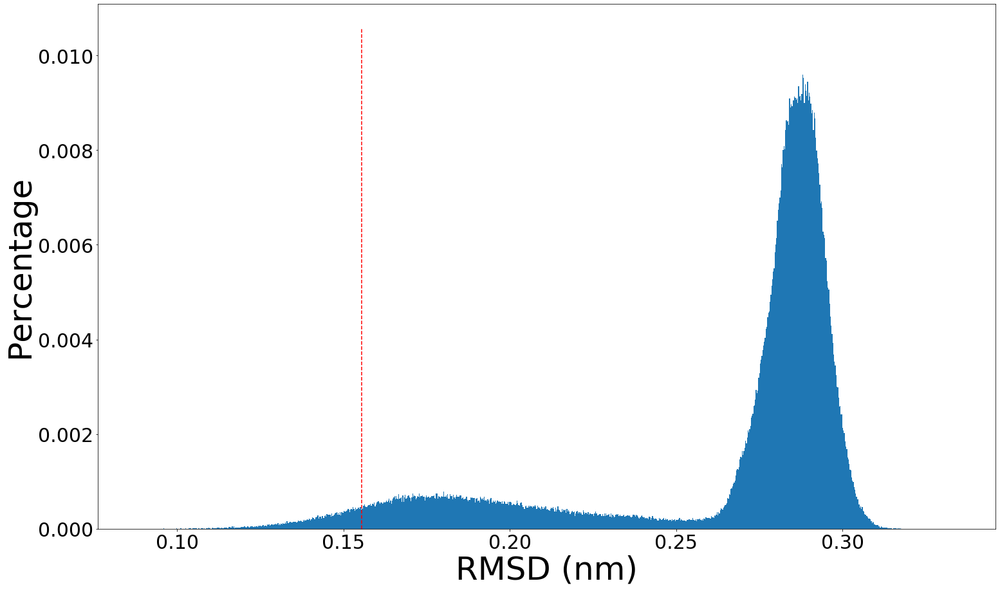

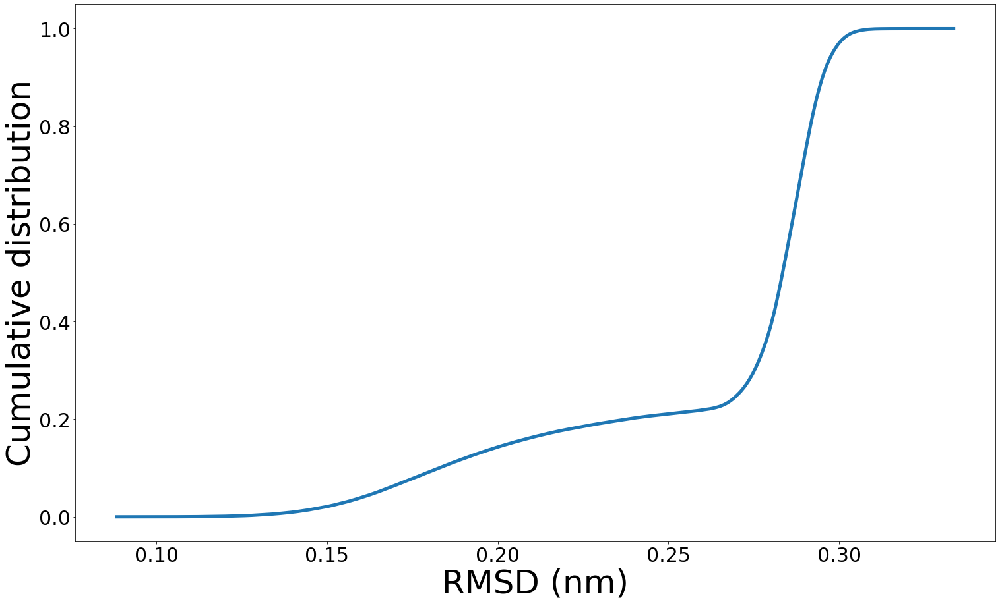

68 / 80 COMPLETE
534743
0
207
300
406
506
600
700
800
902
1003


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534633
RMSD_r = 2.48e-01 (nm)
RMSD_train = 1.97e-01 (nm)
0.3098683970441152


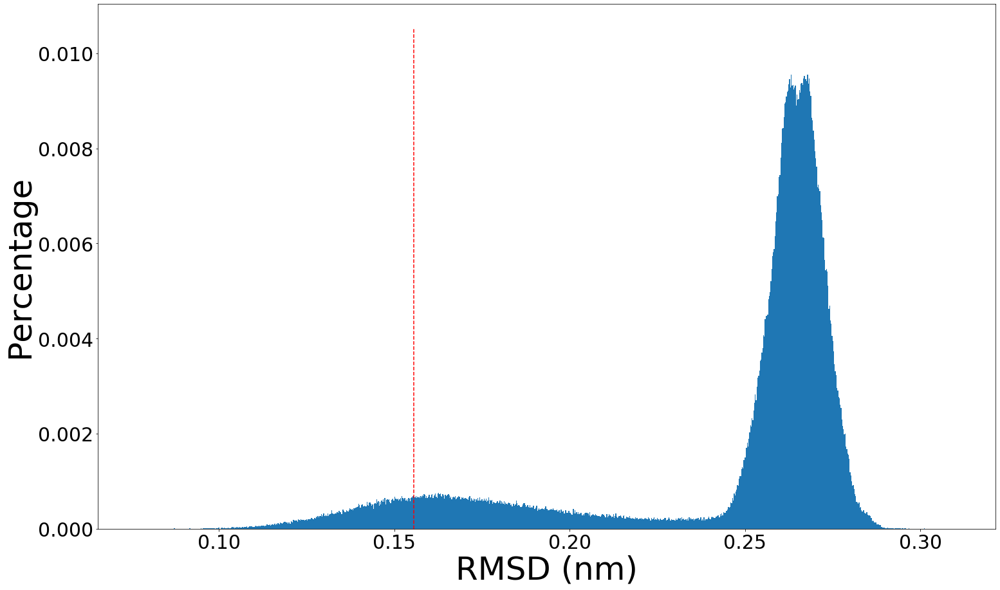

RMSD_r = 2.48e-01 (nm)
0.30995474883983265


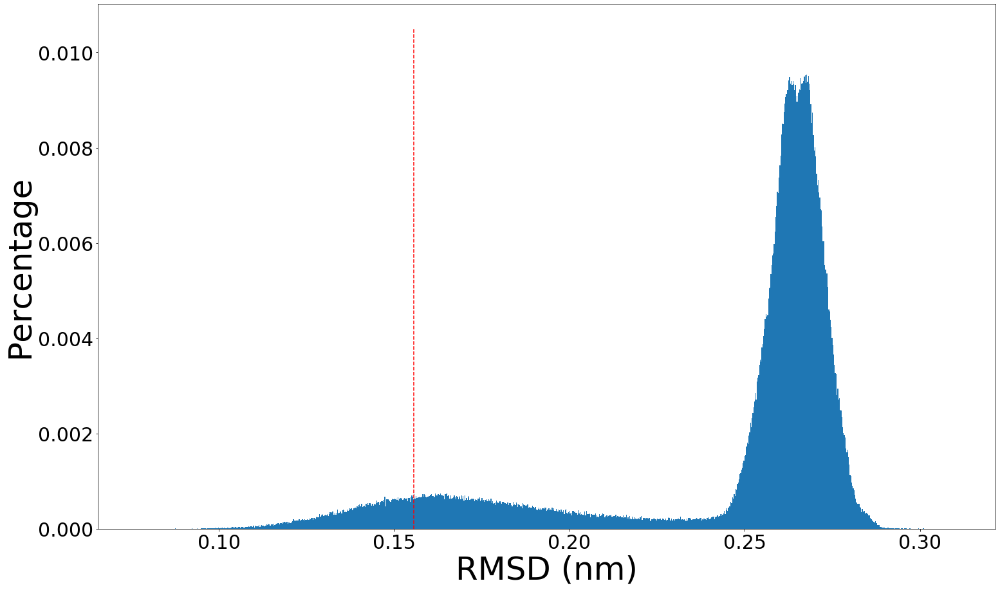

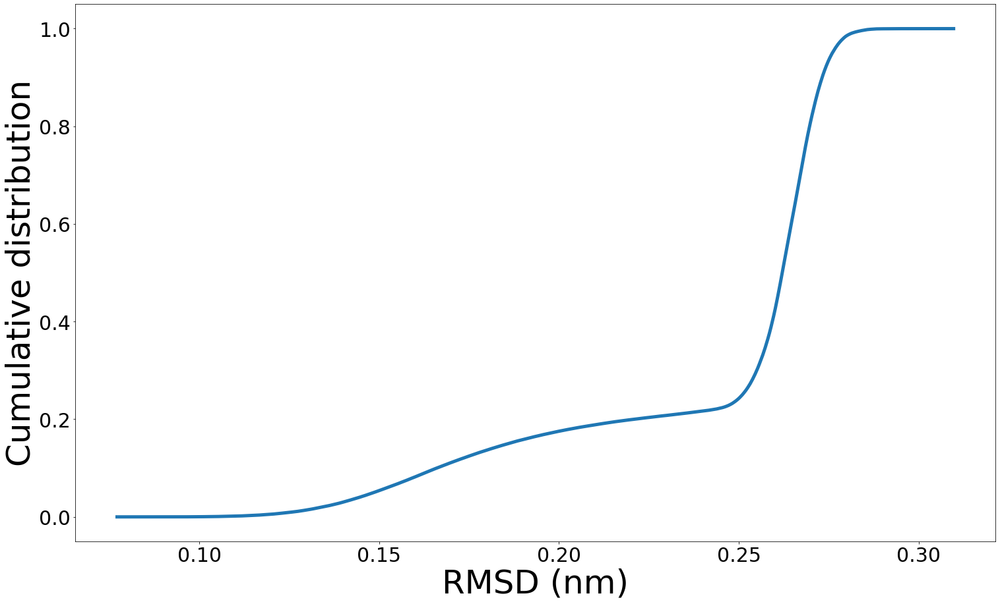

69 / 80 COMPLETE
534743
0
207
300
406
506
600
700
800
902
1003


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534633
RMSD_r = 1.99e-01 (nm)
RMSD_train = 1.70e-01 (nm)
0.3329884775026936


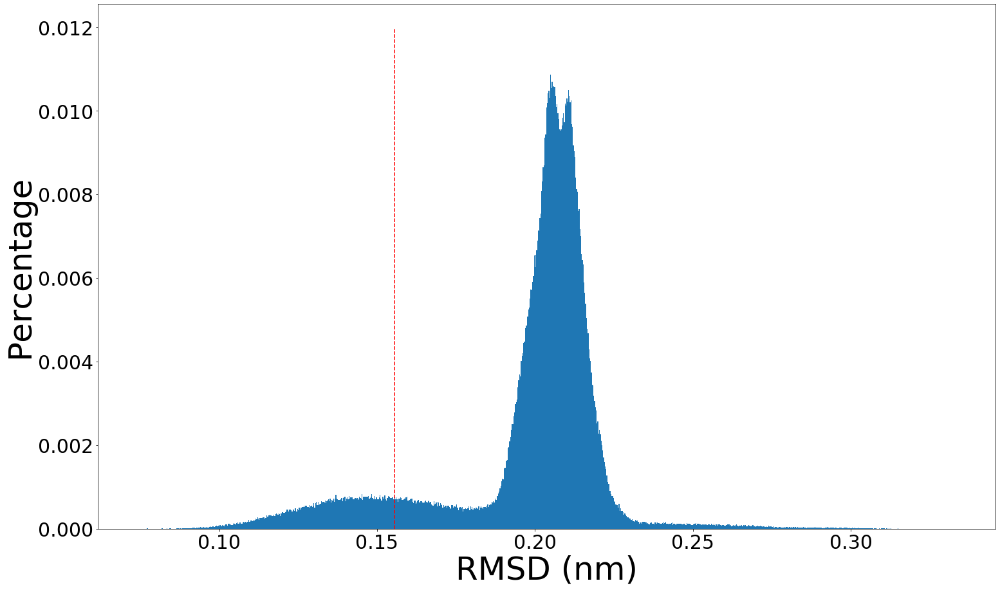

RMSD_r = 1.99e-01 (nm)
0.32705591697866465


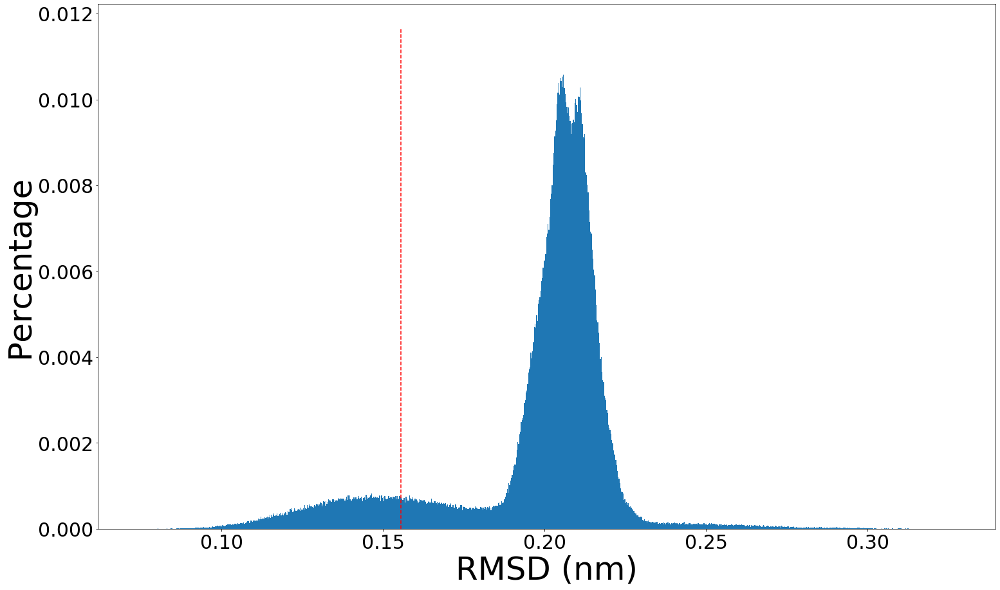

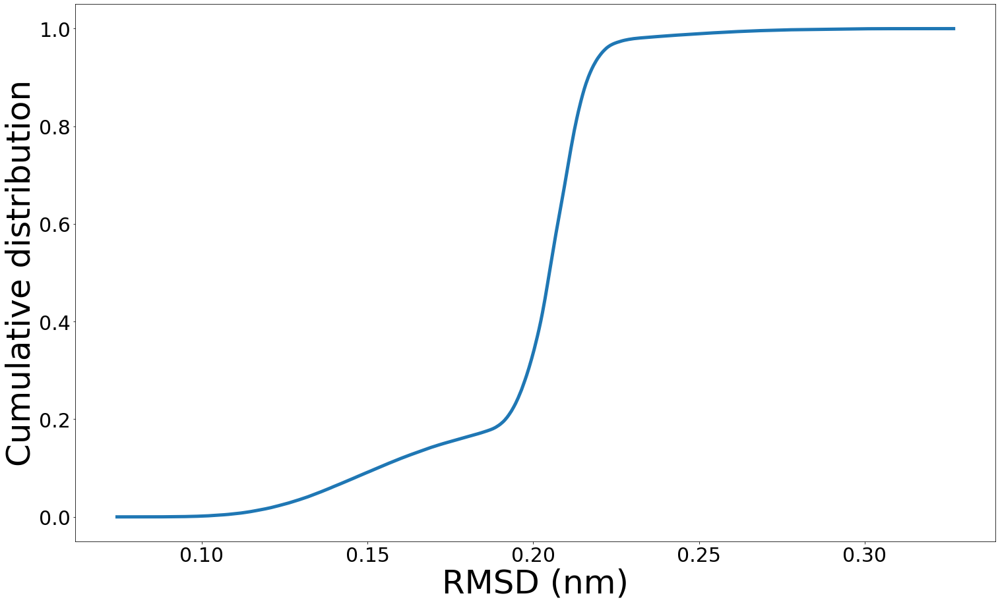

70 / 80 COMPLETE
534743
0
207
300
406
506
600
700
800
902
1003


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534633
RMSD_r = 2.20e-01 (nm)
RMSD_train = 1.84e-01 (nm)
0.31236864092777716


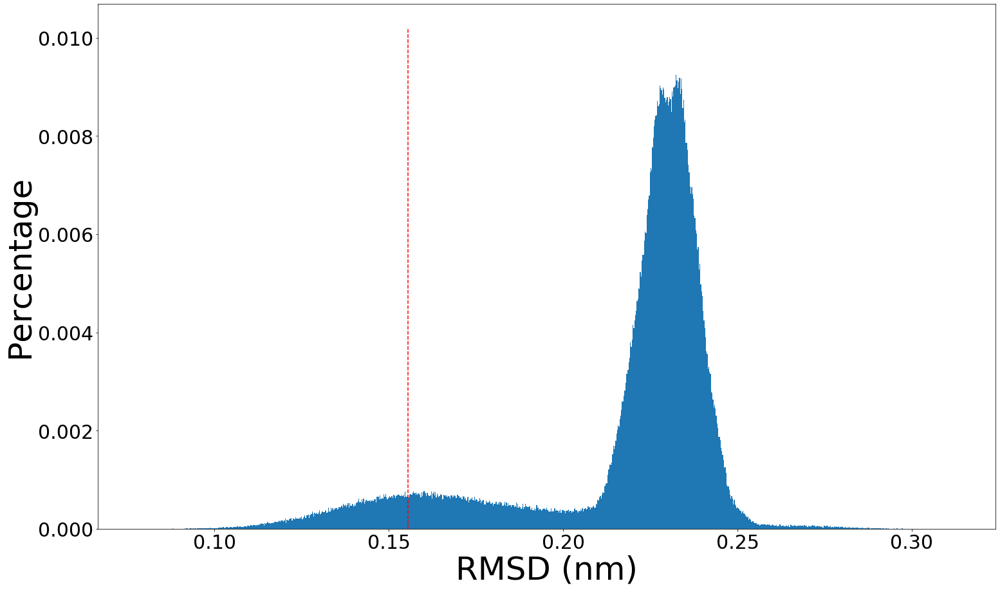

RMSD_r = 2.20e-01 (nm)
0.3113371408166182


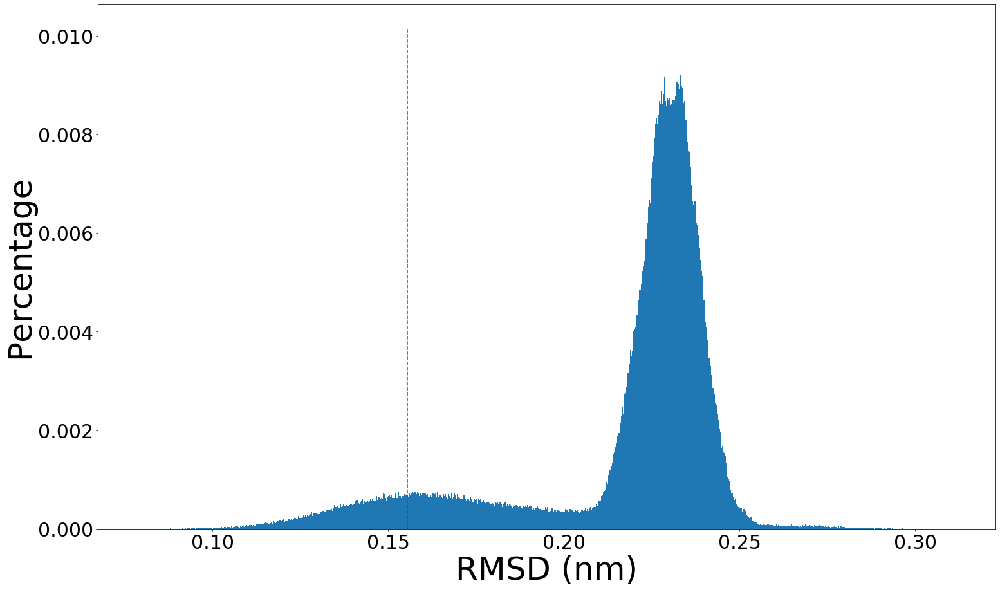

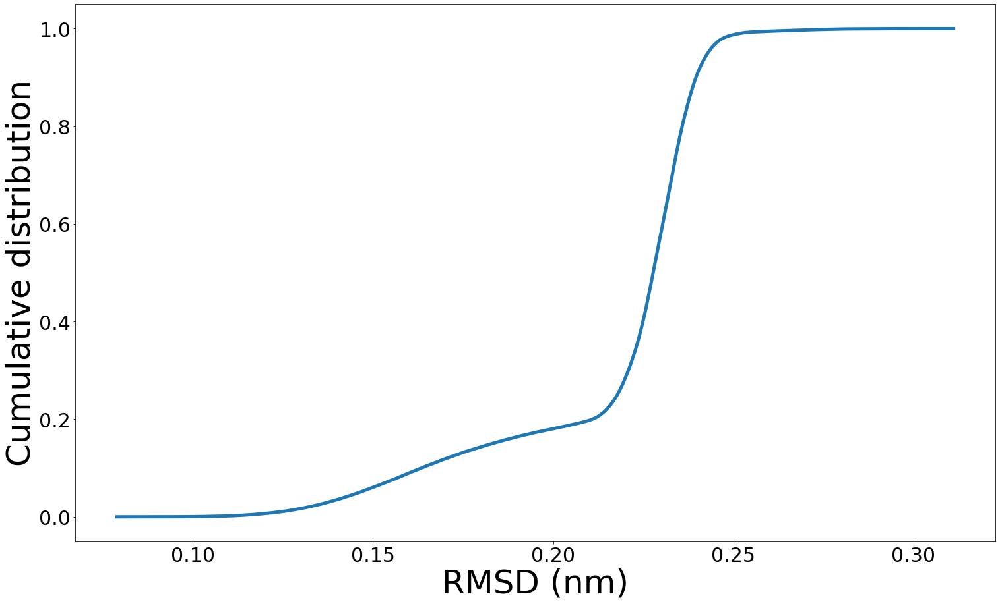

71 / 80 COMPLETE
534743
0
207
300
406
506
600
700
800
902
1003


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534633
RMSD_r = 2.22e-01 (nm)
RMSD_train = 1.83e-01 (nm)
0.32169750036532674


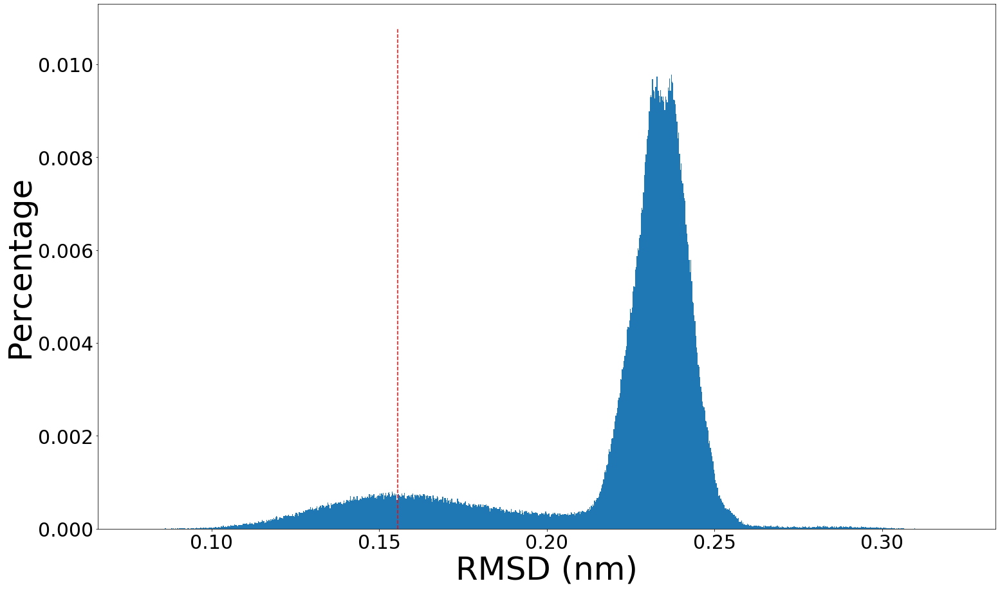

RMSD_r = 2.22e-01 (nm)
0.3249613779774837


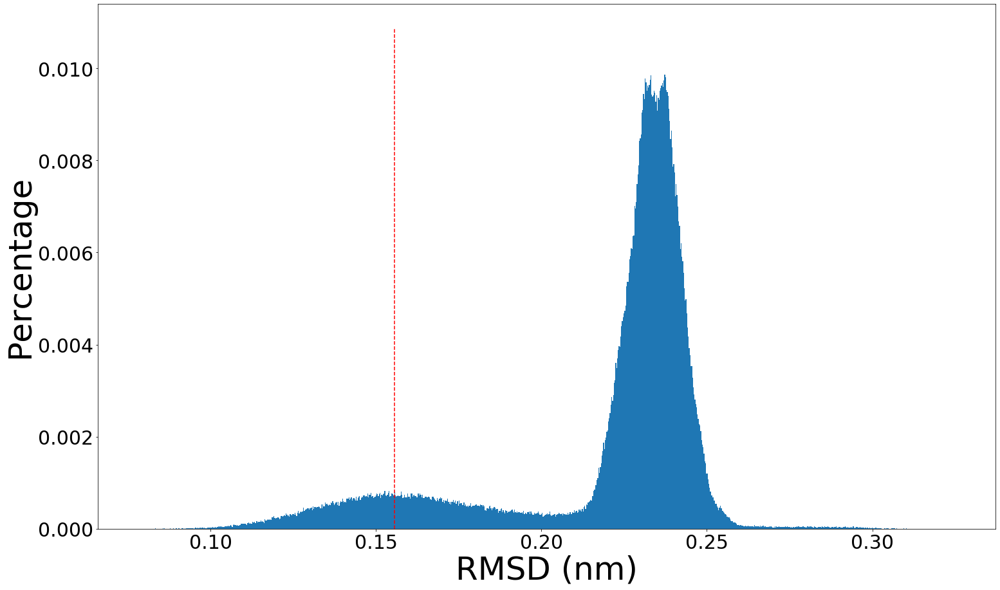

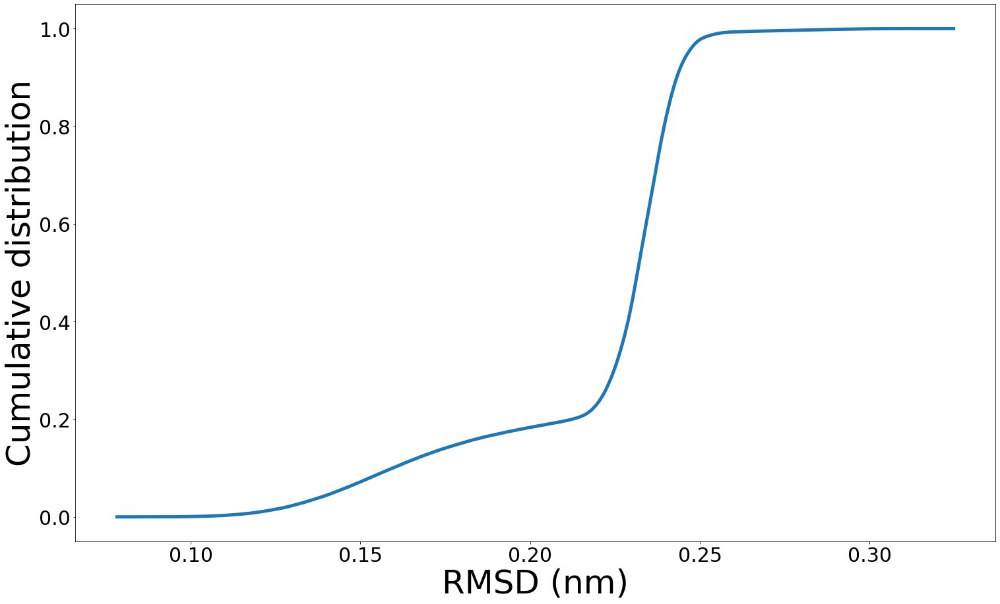

72 / 80 COMPLETE
534743
0
200
300
408
503
606
700
800
900
1000


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534468
RMSD_r = 1.84e-01 (nm)
RMSD_train = 1.59e-01 (nm)
0.33435481865744954


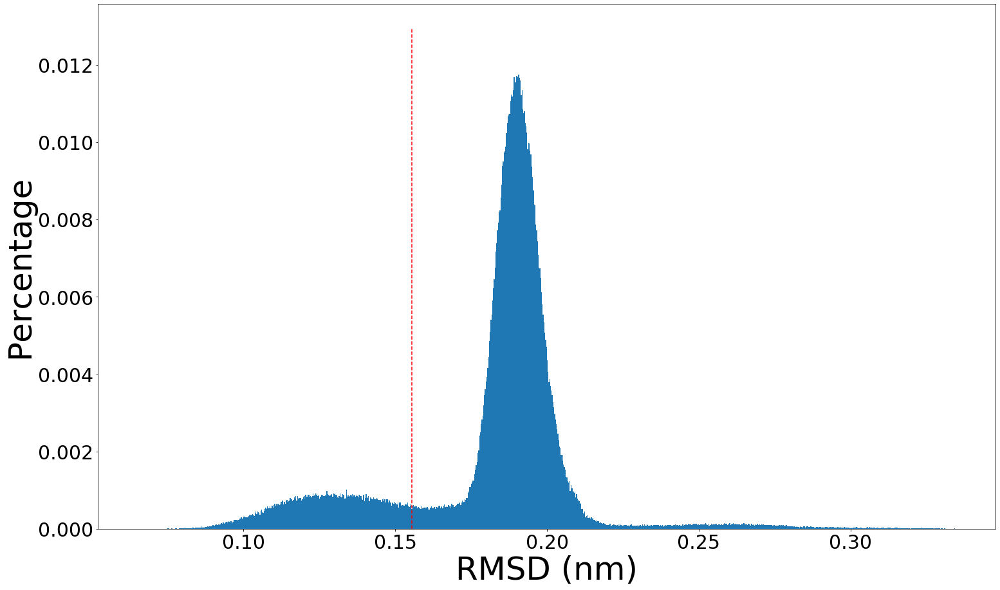

RMSD_r = 1.84e-01 (nm)
0.3301027420547931


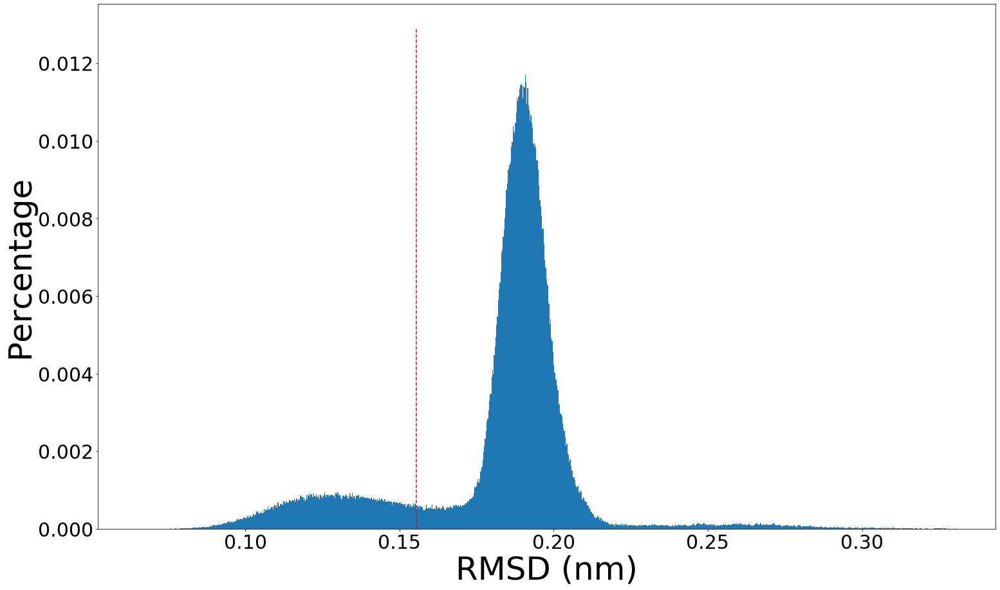

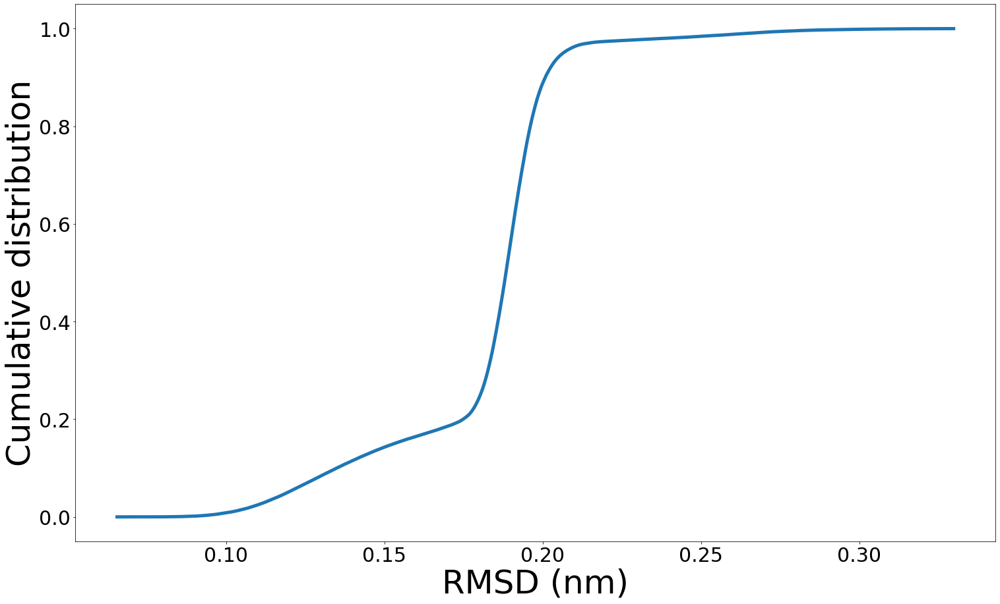

73 / 80 COMPLETE
534743
0
200
300
408
503
606
700
800
900
1000


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534468
RMSD_r = 1.87e-01 (nm)
RMSD_train = 1.62e-01 (nm)
0.32641205635297255


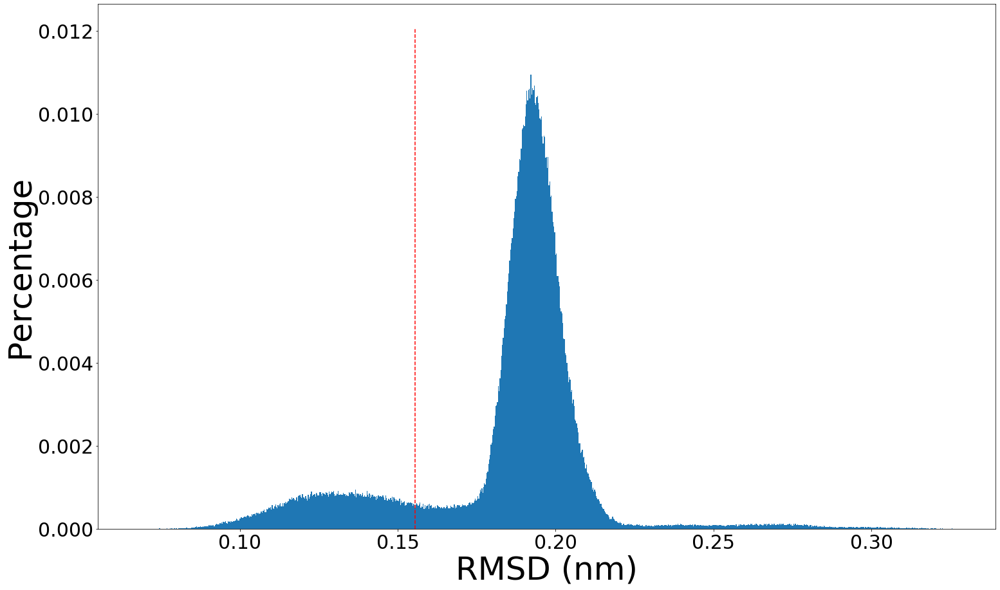

RMSD_r = 1.86e-01 (nm)
0.32216010275526297


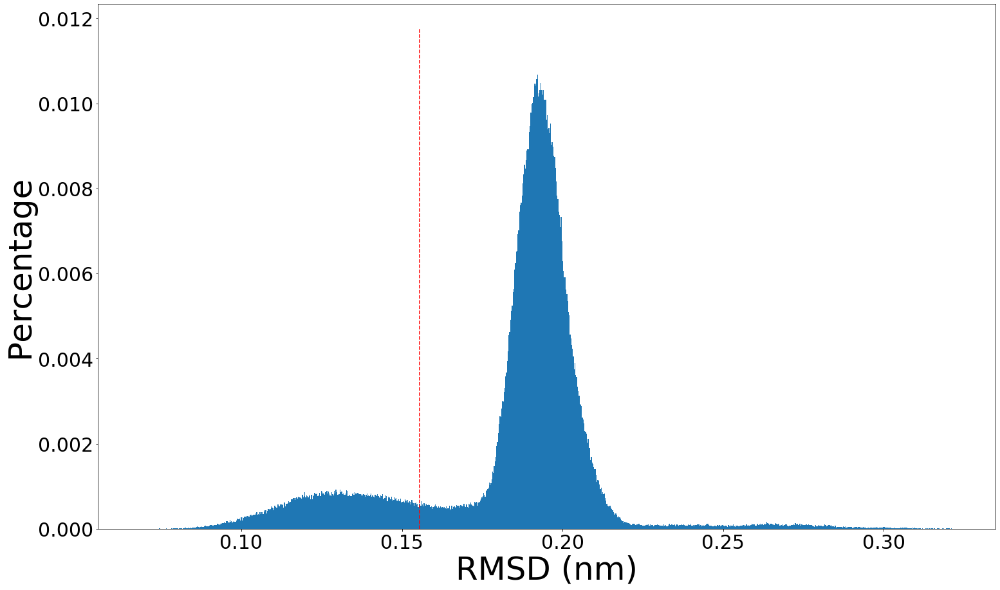

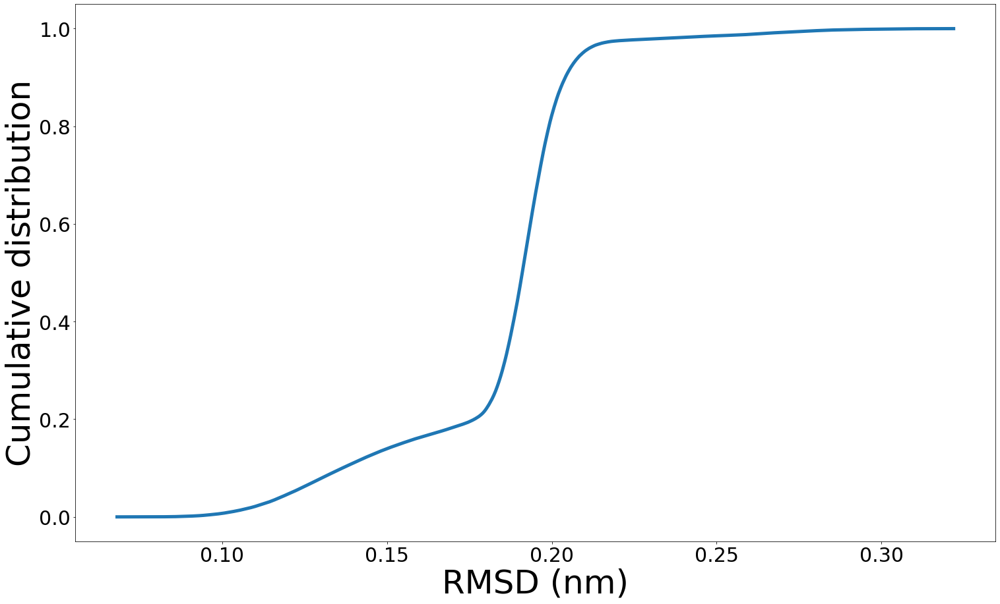

74 / 80 COMPLETE
534743
0
200
300
408
503
606
700
800
900
1000


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534468
RMSD_r = 2.20e-01 (nm)
RMSD_train = 1.88e-01 (nm)
0.28900179278997723


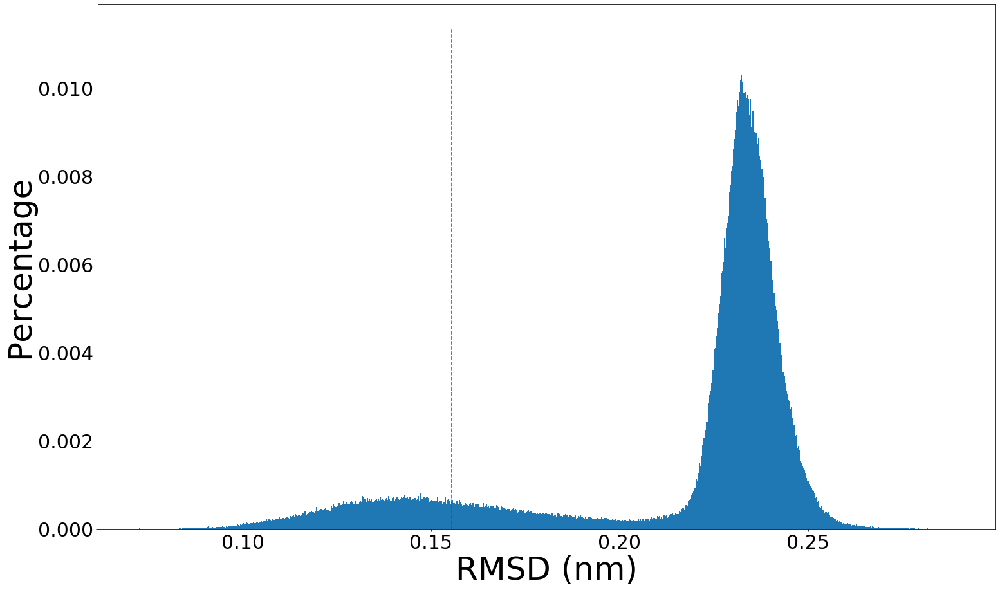

RMSD_r = 2.20e-01 (nm)
0.28806909220432636


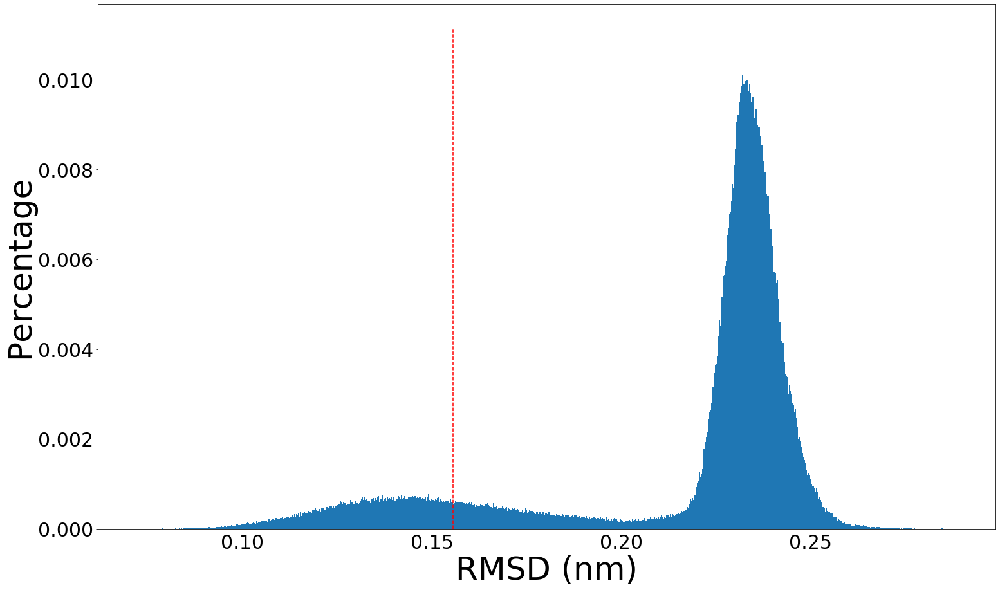

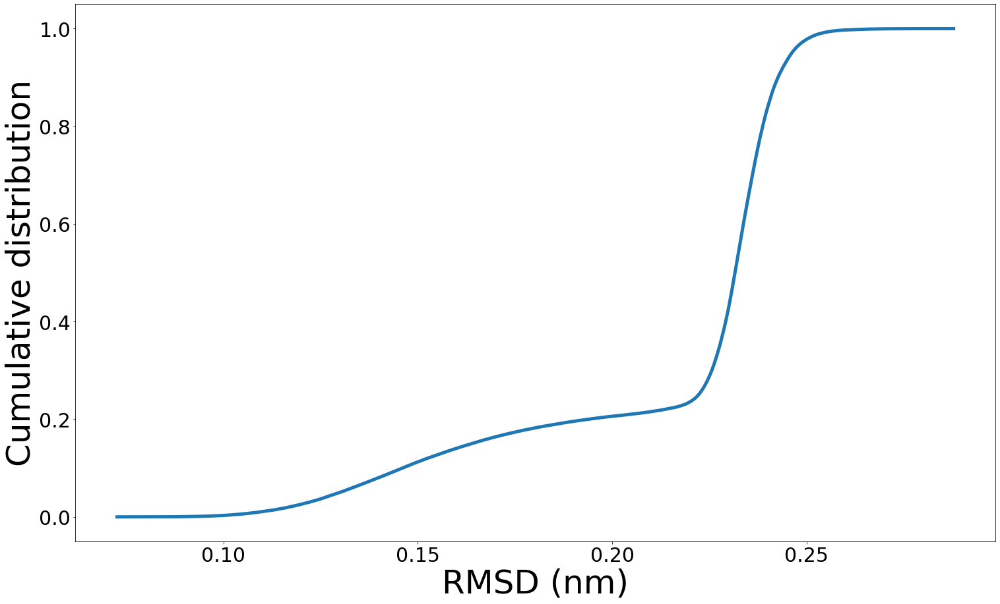

75 / 80 COMPLETE
534743
0
200
300
408
503
606
700
800
900
1000


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534468
RMSD_r = 1.88e-01 (nm)
RMSD_train = 1.61e-01 (nm)
0.3459279467166855


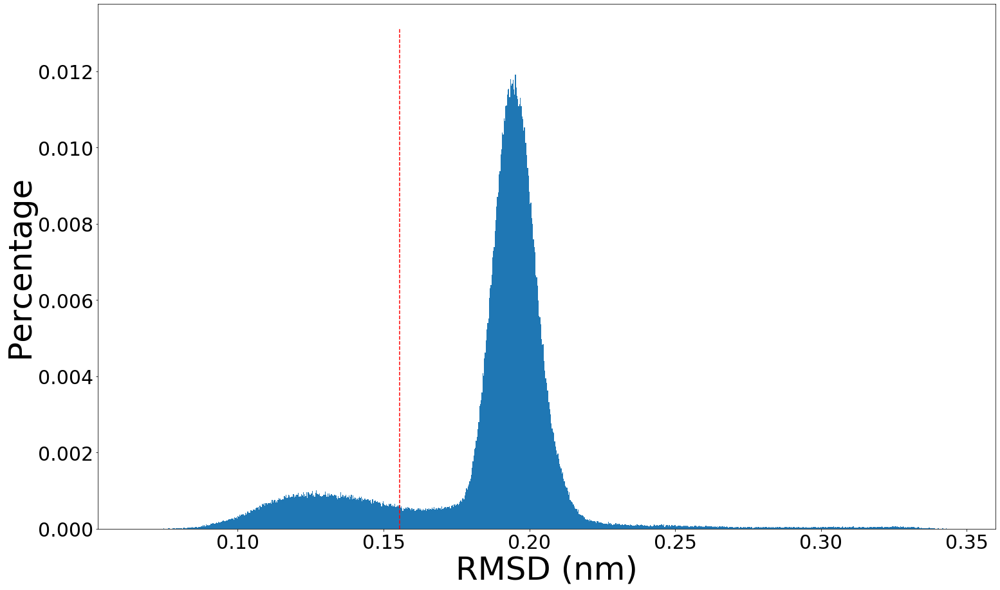

RMSD_r = 1.87e-01 (nm)
0.33755588118734375


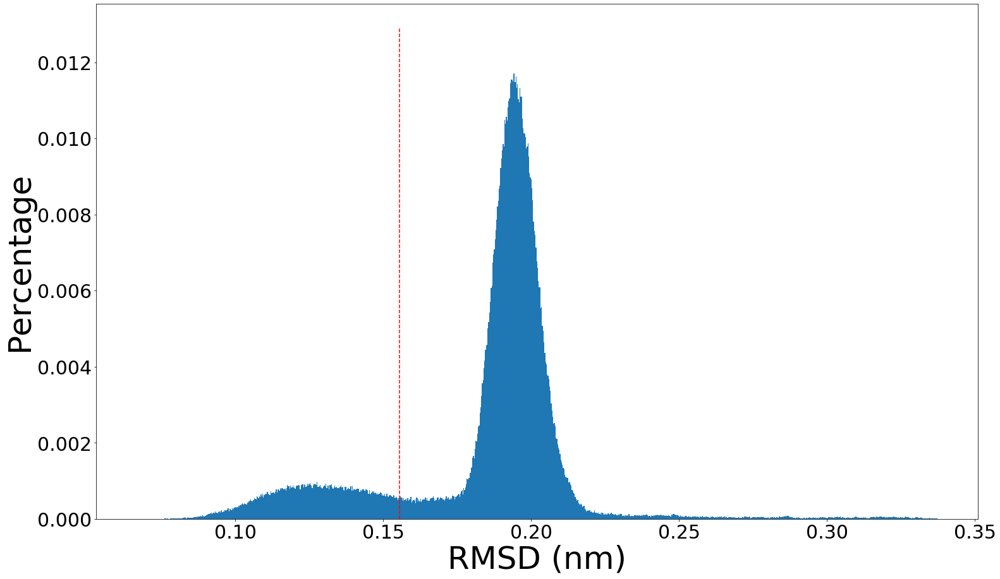

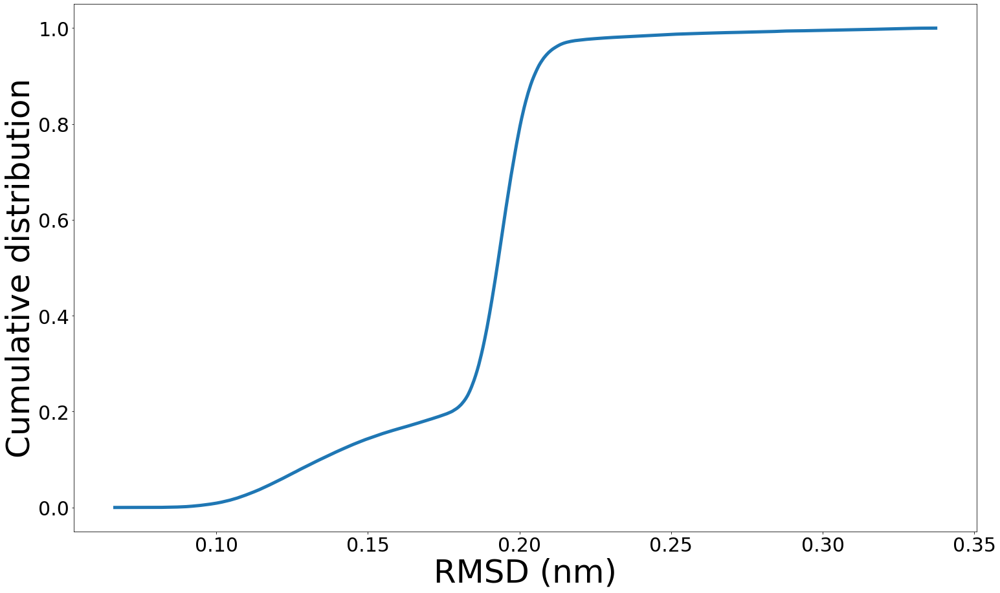

76 / 80 COMPLETE
534743
0
200
300
406
503
600
707
800
902
1000


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534193
RMSD_r = 1.97e-01 (nm)
RMSD_train = 1.62e-01 (nm)
0.3105823748038687


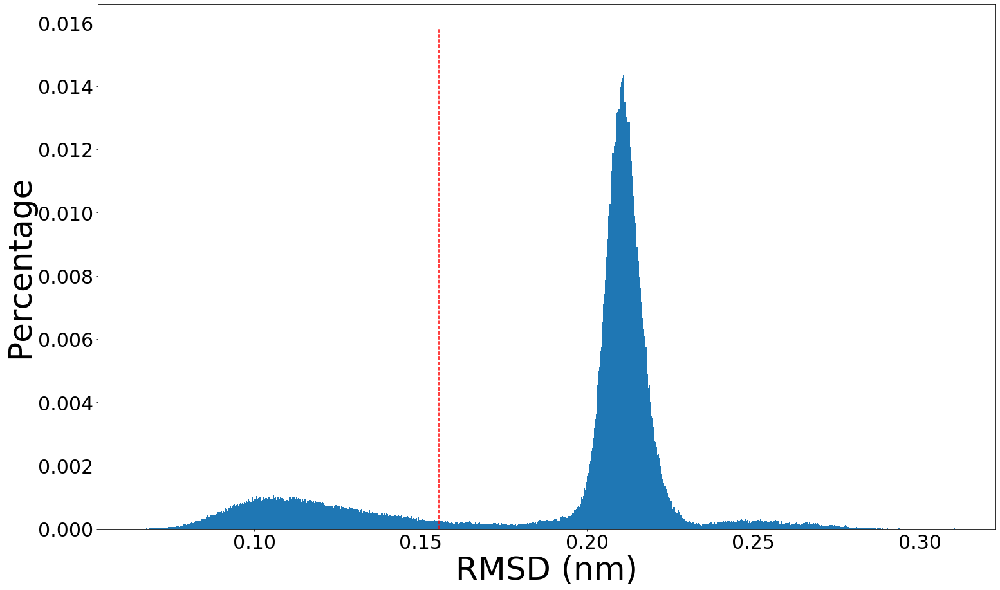

RMSD_r = 1.97e-01 (nm)
0.30546315120473516


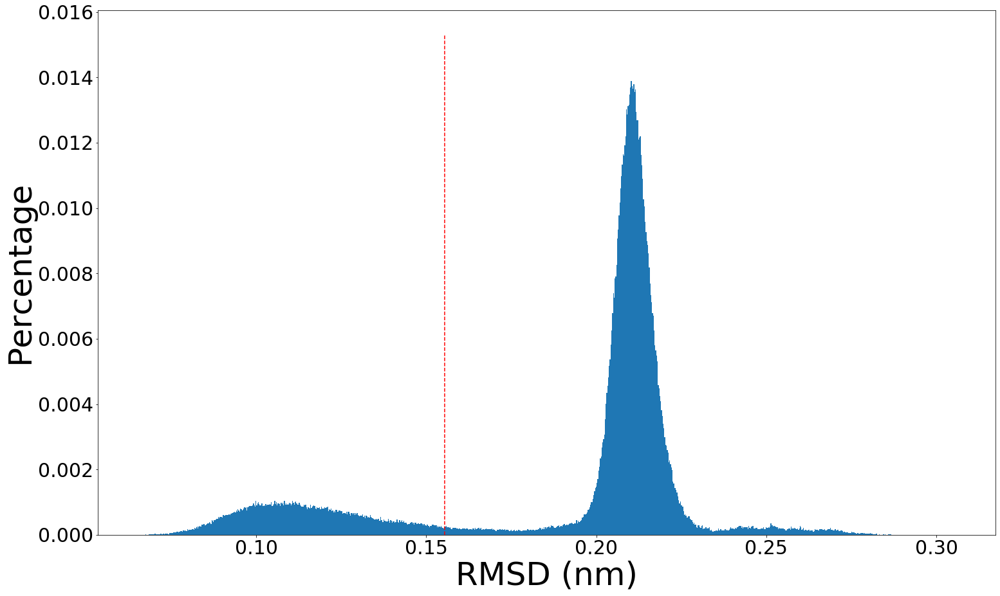

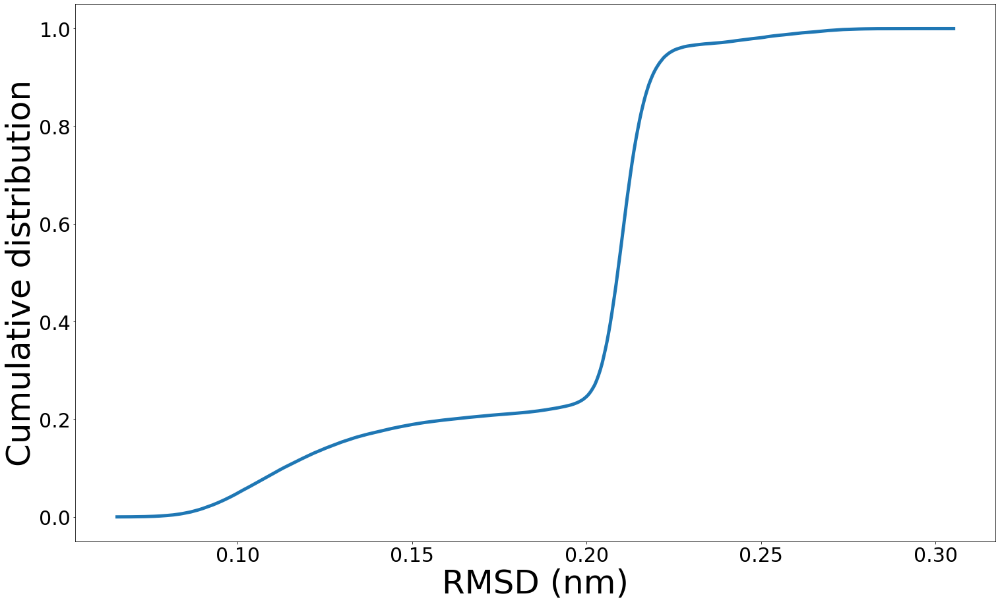

77 / 80 COMPLETE
534743
0
200
300
406
503
600
707
800
902
1000


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534193
RMSD_r = 1.97e-01 (nm)
RMSD_train = 1.61e-01 (nm)
0.3099366029546025


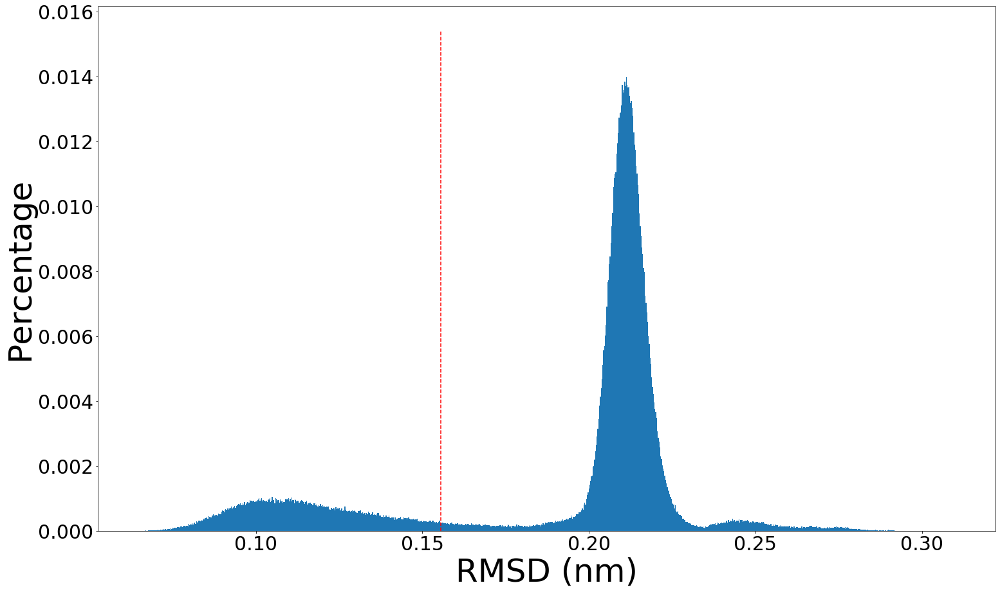

RMSD_r = 1.97e-01 (nm)
0.29977131528145495


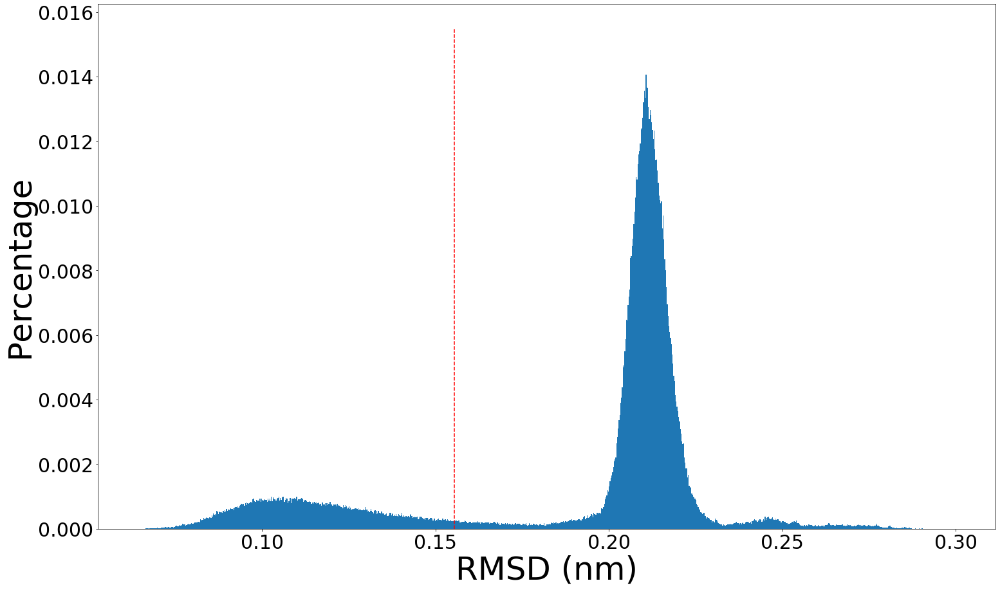

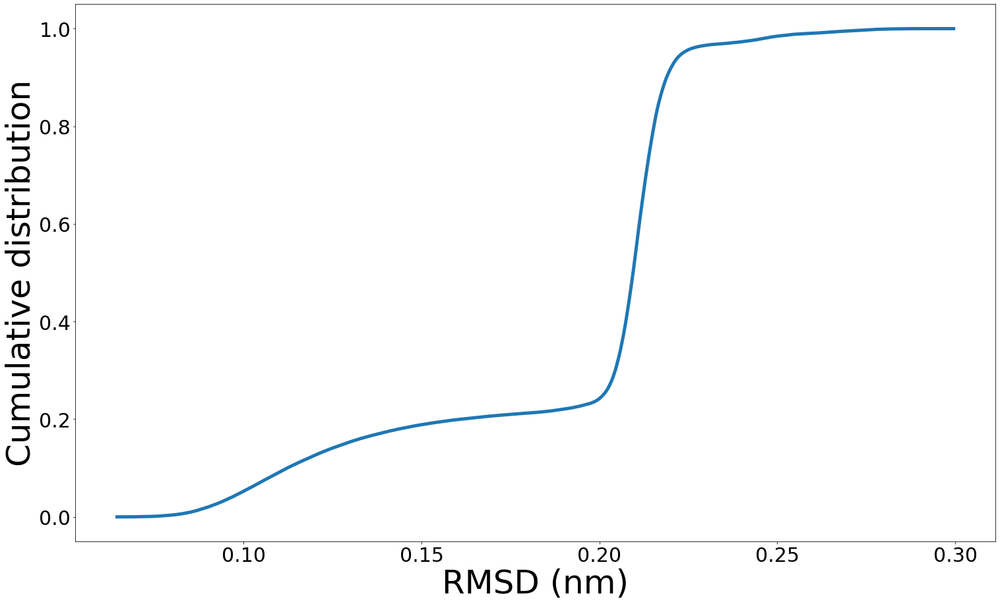

78 / 80 COMPLETE
534743
0
200
300
406
503
600
707
800
902
1000


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


534193
RMSD_r = 1.98e-01 (nm)
RMSD_train = 1.68e-01 (nm)
0.3373097591221508


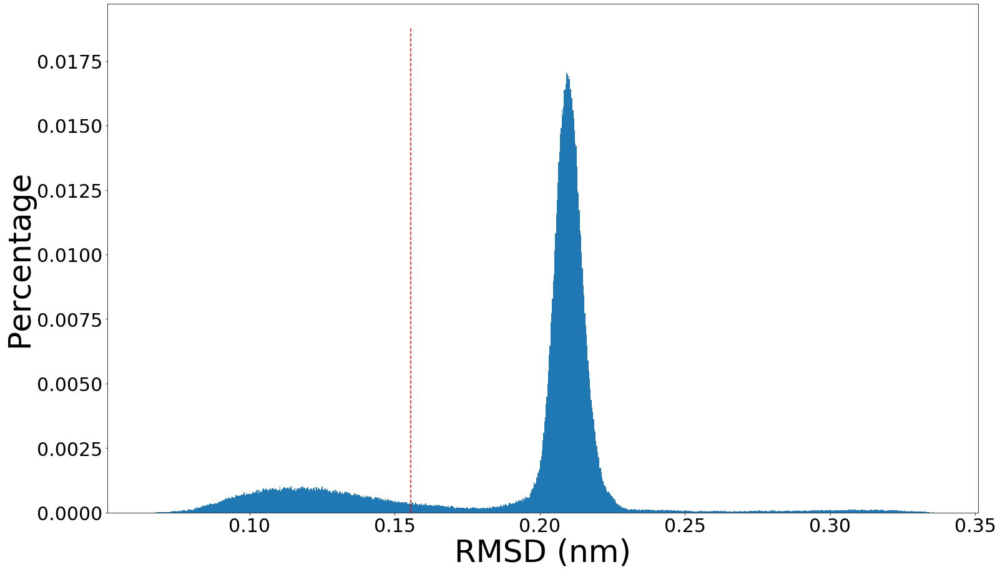

RMSD_r = 1.98e-01 (nm)
0.33827725503837025


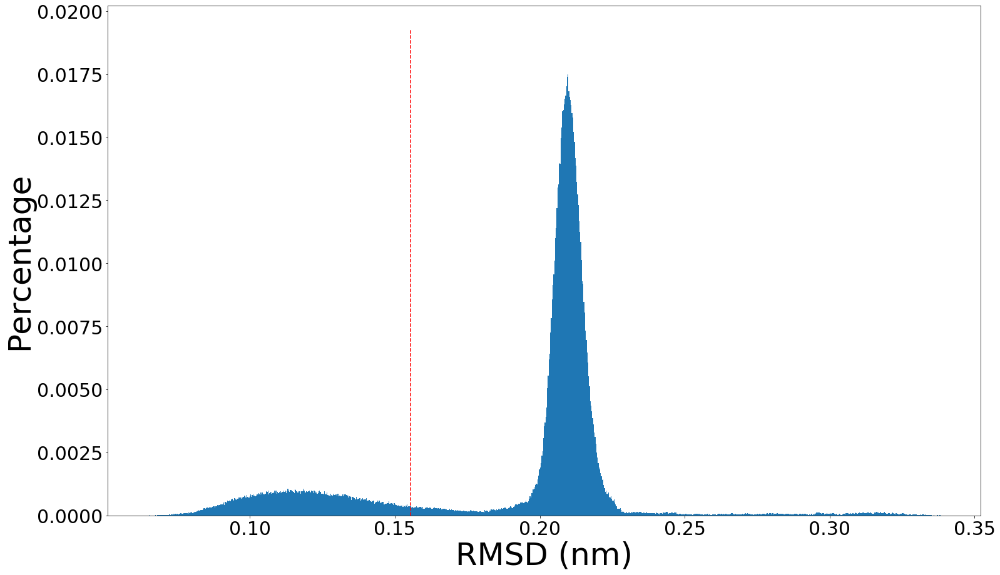

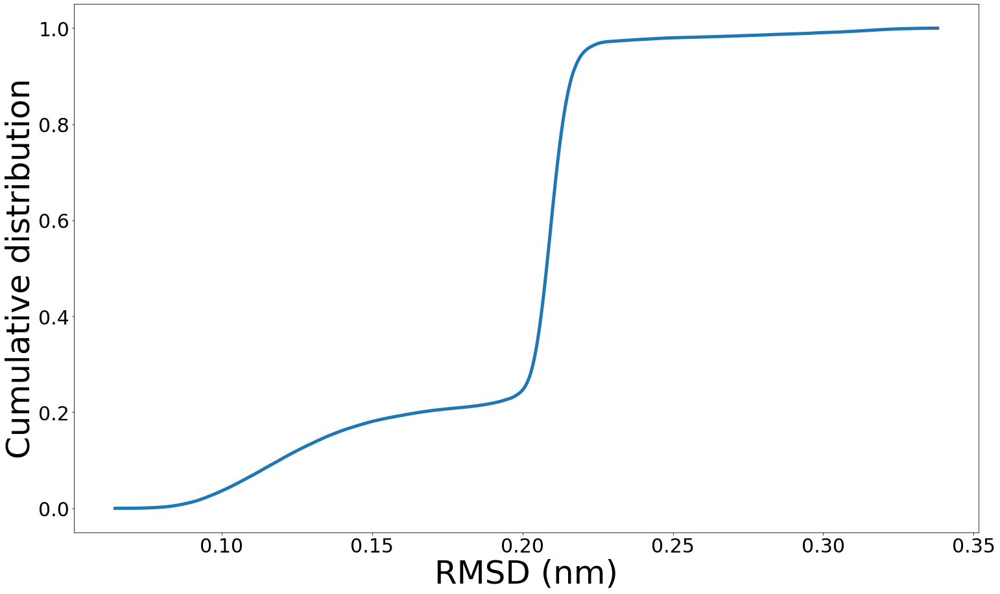

79 / 80 COMPLETE
534743
0
200
300
406
503
600
707
800
902


/home/maxtopel/anaconda3/lib/python3.7/site-packages/torch/nn/_reduction.py:14: UserWarning: reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.
  warnings.warn("reduction='elementwise_mean' is deprecated, please use reduction='mean' instead.")


1000
534193
RMSD_r = 2.21e-01 (nm)
RMSD_train = 1.78e-01 (nm)
0.28933210837399925


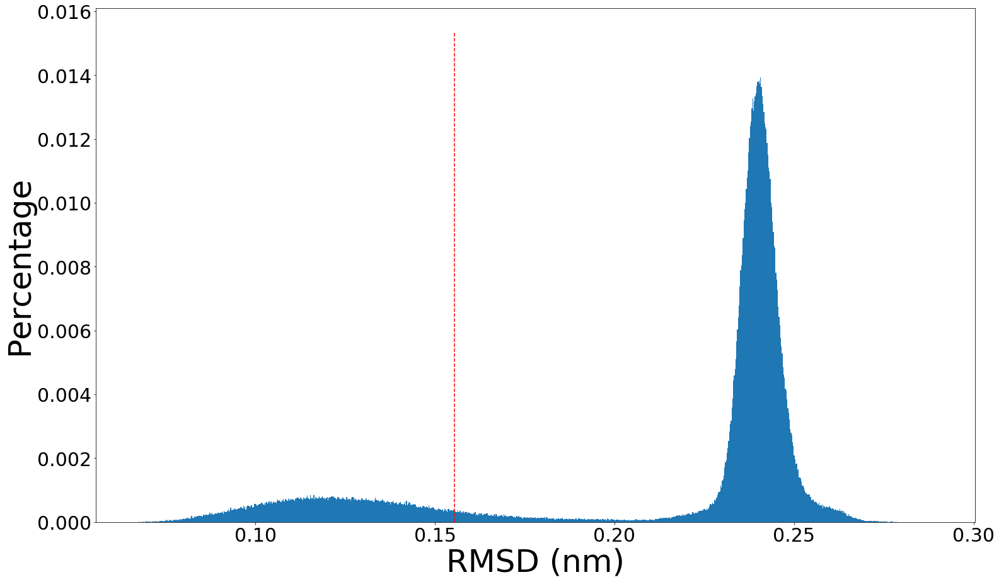

RMSD_r = 2.21e-01 (nm)
0.28131016067939446


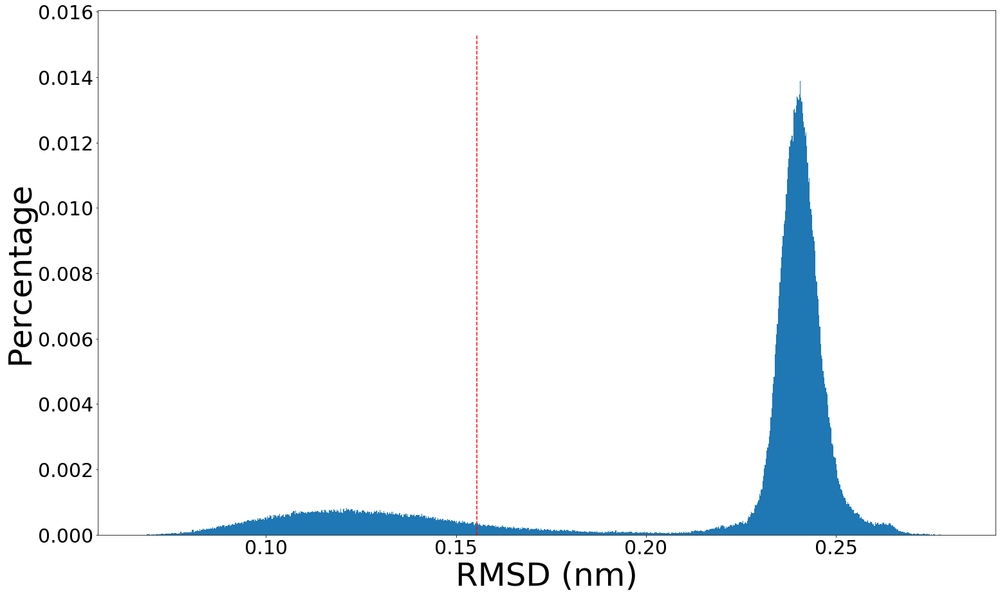

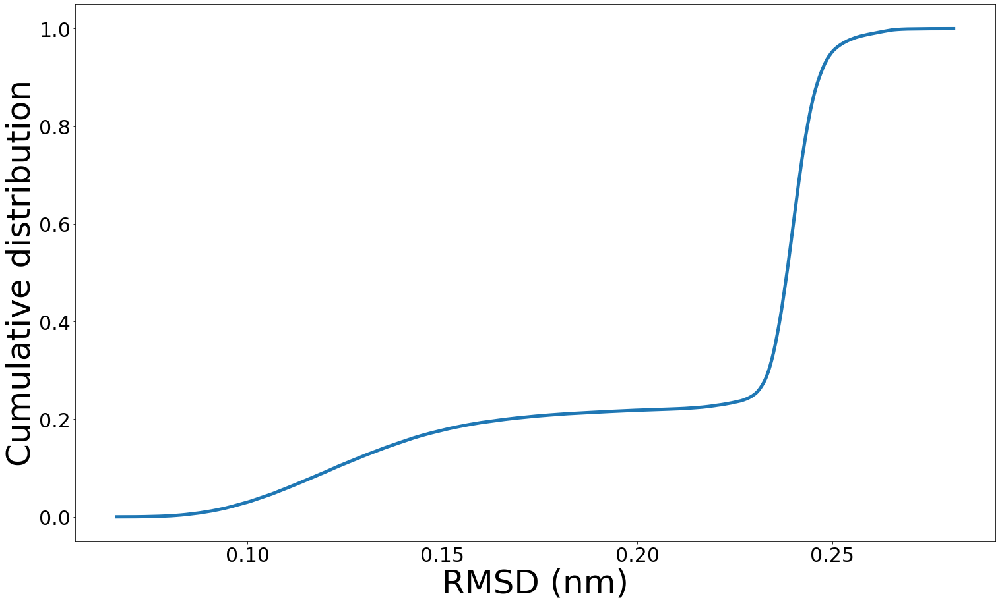

80 / 80 COMPLETE


In [17]:
tau = [1,5,10,25,50] #(done for tau=1,40k) 1,5,10,25,50  10,25,50

Dvec = [40000,20000,10000,1000] #40000,20000,10000,1000  #20000,10000,1000
#,20000,10000,1000


#no of observed photons
#Photon_No  = [0,1000000,100000,10000,1000]

Photon_No  = [0,1000000,100000, 10000]#,100000,10000,1000]# failure at 1000  #0,1000000,100000, 

iii = 0

for Dv in Dvec:
    for t in tau:
        for Nv in Photon_No:
            dim = 11
            trj_file = '../../Short Circuit/0A_aa_h2t/trj_%fns.xtc' %(t*0.2)
            pdb_file = '../../Short Circuit/0A_aa_h2t/trj_init%fns.pdb' %(t*0.2)

            # loading
            traj = md.load(trj_file, top=pdb_file)

            print(len(traj))

            npzfile = np.load('../../Short Circuit/0A_aa_h2t/princMom_%fns.npz' %(t*0.2)) 
            sorted(npzfile.files)
            princMom = npzfile['princMom']
            Rg = npzfile['Rg']

            #print(princMom.shape)
            #print(Rg.shape)
            npzfile = np.load('../../Short Circuit/0A_aa_h2t/h2t_%fns.npz' %(t*0.2)) 
            sorted(npzfile.files)
            h2t = npzfile['h2t_train']
    
            heavy = traj.top.select_atom_indices('heavy')
            
            
            indx = []
            dim = 11
            j = 0
            # Train in 40k data points
            stopframe = Dv
            #Chose over first 450000
            totframe = int(round(len(h2t)*0.8))
            # number of pieces
            nohist = 10
            #train 10 percent on each ile
            ratio = 1/nohist
            #print(stopframe,totframe)

            #find histogram values
            no = list(np.histogram(h2t[0:totframe],bins=nohist)[0])
            val = list(np.histogram(h2t[0:totframe],bins=nohist)[1][0:nohist])
            val.insert(0,0)

            #print(len(h2t), val)
            for ile in range(nohist):
                #print(ile)
                # iterate over all frames
                for i in range(totframe):
                    #iterate over deciles
                    #print(stopframe*ratio*(ile+1))
                    if j < stopframe*ratio*(ile+1):
                        # select that it is in the correct decile
                        if h2t[i] < val[ile+1] and h2t[i] > val[ile]:
                            for d in range(dim):
                                if (i+d) not in indx:
                                    #print(i-d)
                                    indx.append(i+d)
                                    j += 1
                                    #print(i-d)
                                    #print(indx[])

                    elif j >= stopframe:
                        #print(ile,i,j)
                        break

                print(len(indx))
                
                
        

            npzfile = np.load('../4A_ANN_dMapaa2dMaph2t/ANN_pred_%dk_%dphoton_%fns.npz' %(Dv,Nv,t*0.2))
            sorted(npzfile.files)
            z_ap = npzfile['z_aa']
            
            test = range(len(z_ap))
            test = list(test)
            for i in range(len(indx)):
                test.remove(indx[i])
            
            n_ap = z_ap.shape[0]
            d_ap = z_ap.shape[1]

            zscale_ap = pre.MinMaxScaler(feature_range=(0,1)) # changing feature range requires modification of chain rule in post-hoc gradient rescaling AND use of loss other than BCE

            Z_ap = zscale_ap.fit_transform(z_ap)

# saving scaling associated with model
            D = {}
            D['zscale'] = zscale_ap
            file = open('ANN_z_ap_scaling_%dk_%dphoton_%fns.pkl' %(Dv,Nv,t*0.2), 'wb')
            pickle.dump(D, file)
            file.close()

            nFrames = traj.xyz.shape[0]
            Natom = traj.xyz.shape[1]
            Ncord = 3*Natom


            xyz = traj[indx].xyz.reshape(-1, len(heavy)*3)
            scaler = MinMaxScaler(feature_range=(-1,1))
            y_train = scaler.fit_transform(xyz)

            Z_ap_full = deepcopy(Z_ap)
            z_ap_full = deepcopy(z_ap)
            z_ap = z_ap[indx]
            Z_ap = Z_ap[indx]
            trj = traj.xyz[indx]

            assert z_ap.shape[0] == Z_ap.shape[0]
            assert z_ap.shape[0] == trj.shape[0]



            class ANN(nn.Module):
                def __init__(self, q, d_in, d_out):
                    super(ANN, self).__init__()

                    n_nodes = np.ceil(q*np.linspace(d_in,d_out,4)).astype(int) # e.g. d_in = 2, d_out = 276, q = 2 => n_nodes = [  4 187 370 552]

                    self.hidden1 = nn.Linear(d_in, n_nodes[0])
                    self.hidden2 = nn.Linear(n_nodes[0], n_nodes[1])
                    self.hidden3 = nn.Linear(n_nodes[1], n_nodes[2])
                    self.hidden4 = nn.Linear(n_nodes[2], n_nodes[3])

                    self.output = nn.Linear(n_nodes[3], d_out)

                def forward(self, x):
                    x = torch.tanh(self.hidden1(x))
                    x = torch.tanh(self.hidden2(x))
                    x = torch.tanh(self.hidden3(x))
                    x = torch.tanh(self.hidden4(x))

                    x = torch.tanh(self.output(x))
                    return x


            # https://discuss.pytorch.org/t/how-can-l-load-my-best-model-as-a-feature-extractor-evaluator/17254/5
            activation = {}

            class CustomDataset(Dataset):
                def __init__(self, x_tensor, y_tensor):
                    self.x = x_tensor
                    self.y = y_tensor

                def __getitem__(self, index):
                    return (self.x[index], self.y[index])

                def __len__(self):
                    return len(self.x)

            x_tensor = torch.from_numpy(Z_ap).float() #[indx]
            y_tensor = torch.from_numpy(y_train).float()

            assert x_tensor.shape[0] == y_tensor.shape[0]

            idx = np.arange(x_tensor.shape[0])

            val_frac = 0.10
            idx_train, idx_val = train_test_split(idx, test_size=val_frac, random_state=42)

            train_dataset = CustomDataset(x_tensor[idx_train], y_tensor[idx_train])
            val_dataset = CustomDataset(x_tensor[idx_val], y_tensor[idx_val])


            q=2.
            d_ap = z_ap.shape[1]

            model = ANN(q, d_ap, Ncord).to(device)

            lr = 1e-5
            n_epochs = 120
            batch_size = 400

            loss_fn = nn.MSELoss(reduction='elementwise_mean')
            optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=0)

            train_step = make_train_step(model, loss_fn, optimizer)

            n_batch = math.ceil(1. * len(train_dataset) / batch_size)

            loss_train = np.zeros(n_epochs)
            loss_val = np.zeros(n_epochs)

            #start=time.time()
        
            
            

            for epoch in range(n_epochs):    

                dataset = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True, drop_last=True)

                model.train()

                batch_idx = 0
                for train_in, train_out in dataset:
                    train_in, train_out = train_in.to(device), train_out.to(device)
                    out = model(train_in)
                    loss = loss_fn(out, train_out) 
                    optimizer.zero_grad()
                    loss.backward() # scalar variables, when we call .backward() on them, don’t require arguments – only tensors require a matching sized tensor argument to be passed to the .backward() operation
                    optimizer.step()
                    batch_idx += 1

                model.eval()

                y_pred = model(train_dataset.x.to(device))
                diff = y_pred.cpu().detach().numpy() - train_dataset.y.cpu().detach().numpy()
                MSE = np.mean(diff**2)
                loss_train[epoch] = MSE

                y_pred = model(val_dataset.x.to(device))
                diff = y_pred.cpu().detach().numpy() - val_dataset.y.cpu().detach().numpy()
                MSE = np.mean(diff**2)
                loss_val[epoch] = MSE        


            save_path = "./ANN_%dk_%dphoton_%fns.pyt" %(Dv,Nv,t*0.2)
            torch.save(model.state_dict(), save_path)

            model = ANN(q, d_ap, Ncord).to(device) 
            save_path = "./ANN_%dk_%dphoton_%fns.pyt" %(Dv,Nv,t*0.2) # _%dtau_%dk_%d:1.npz' %(t,D,Nv))
            model.load_state_dict(torch.load(save_path, map_location=device))
            model.eval()


            xyz = traj[t*dim::].xyz.reshape(-1, len(heavy)*3)
            scaler = MinMaxScaler(feature_range=(-1,1))
            y_test = scaler.fit_transform(xyz)

            # initializing storage arrays
            Z_trj_pred = np.zeros(shape=(0,xyz.shape[1]), dtype=float)

            # running all data through model
            nSamples = Z_ap_full.shape[0]
            print(nSamples)
            maxBatchSz = 12000
            assert nSamples >= maxBatchSz
            nBatch = np.ceil(np.float(nSamples)/np.float(maxBatchSz)).astype(int)
            batchEdges = np.floor(np.linspace(0,nSamples,nBatch+1)).astype(int)

            #print('Running data through trained network...')
            for i in range(nBatch):
                data = torch.FloatTensor(Z_ap_full[batchEdges[i]:batchEdges[i+1],:])
                data = Variable(data, requires_grad=False)
                data = data.to(device)
                model.eval()
                pred = model(data)
                Z_trj_pred_i = pred.cpu().detach().numpy()
                Z_trj_pred = np.append(Z_trj_pred,Z_trj_pred_i,axis=0)


            trj_pred = scaler.inverse_transform(Z_trj_pred)


            np.savez('ANN_pred_%dk_%dphoton_%fns.npz' %(Dv,Nv,t*0.2), trj_pred=trj_pred)


        
            
            
           


            #Recon
            traj_recon = trj_pred.reshape(len(xyz),93, 3)
           # trj_test = deepcopy(traj_recon[test])
            trj_train = deepcopy(traj_recon[indx])
           # trj_rep = deepcopy(traj_recon[indx[len(indx)-1]:])


            #How well do we reconstruct our training set
            trjp = deepcopy(traj[0:len(traj_recon)].xyz)
           #### 
            #OR deepcopy(traj[b*t:].xyz)
                            
                            
            #TRAIN
            RMSD_r = np.sqrt(np.mean((trjp - traj_recon)**2)) 
            print('RMSD_r = %.2e (nm)' % RMSD_r)


            RMSD_r_train = np.sqrt(np.mean((traj[indx].xyz - trj_train)**2))
            print('RMSD_train = %.2e (nm)' % RMSD_r_train)


        
     


            RMSD_oFit_vec = []
            for i in range(len(traj_recon)):
                RMSD_oFit_vec.append(np.sqrt(np.mean((trjp[i] - traj_recon[i])**2)))

            maxim =0
            for i in range(len(RMSD_oFit_vec)):
                if RMSD_oFit_vec[i] > maxim:
                    maxim = RMSD_oFit_vec[i]
            print(maxim)
            counts, bins =np.histogram(RMSD_oFit_vec, bins=1000)
            count = []

            for i in range(len(counts)):
                count.append(float(counts[i])/len(traj_recon)) 

            #outfile='Chig_RMSD_%dk_%dphoton_%fns.npz' %(Dv,Nv,t*0.2)
            #np.savez(outfile, RMSD=RMSD_oFit_vec)


            fig = plt.figure(figsize=(25, 15))
            plt.hist(bins[:-1], bins, weights=count)
            plt.xlabel("RMSD (nm)", fontsize=50)
            plt.ylabel("Percentage", fontsize=50)
            plt.rc('xtick', labelsize=30)    # fontsize of the tick labels
            plt.rc('ytick', labelsize=30)    # fontsize of the tick labels
            plt.vlines(mrmsd, 0, max(count)*1.1,colors='r',linestyles='dashed')
            plt.show()
            fig.savefig('Chignolin_to_train_pdf_%dk_%dphoton_%fns.png' %(Dv,Nv,t*0.2), dpi=300)




           # sums =[]
            #sums.append(count[0])
            #for i in range(1,len(count)):
             #   sums.append(sums[i-1]+count[i])

            #fig = plt.figure(figsize=(25, 15))
      #      plt.plot(bins[:-1], sums, linewidth=5)
       #     plt.xlabel("RMSD (nm)", fontsize=50)
        #    plt.ylabel("Cumulative distribution", fontsize=50)
         #   plt.rc('xtick', labelsize=30)    # fontsize of the tick labels
          #  plt.rc('ytick', labelsize=30)    # fontsize of the tick labels
           # plt.show()
            #fig.savefig('Chignolin_cdf_%dns.png' %(b*0.2), dpi=300)



            #compare to traj true

            traj_recon_true = []
                                    
            # select only the test trajectory: the averages 0:b, b:2b,2b:3b....
            #these occur every b in ttraj_recon
                                    
            for i in range(0,len(traj_recon),t):
                #to make the reconstructed trajectory they must be  repeated b times for each time slot averaged
                for j in range(t):
                    traj_recon_true.append(traj_recon[i])

            traj_recon_true = traj_recon_true[0:len(traj_recon)]            
                            
            #How well do we reconstruct the true traj/ convert recons to pdb                 
            traj_restr = deepcopy(traj_true)
            traj_restr = traj_restr[0:len(traj_recon)]
            traj_recon_pdb = deepcopy(traj_restr)
            for i in range(len(traj_restr)):
                traj_recon_pdb.xyz[i] = traj_recon_true[i]
            
            
            #save
            
            traj_recon_init = traj_recon_pdb[0]
            traj_recon_init.save_pdb('traj_recon_init_%dk_%dphoton_%fns.pdb' %(Dv,Nv,t*0.2))
            traj_recon_pdb.save_xtc('traj_recon_pdb_%dk_%dphoton_%fns.xtc' %(Dv,Nv,t*0.2))
               
                            
                            

       
       #     trjp = traj_true[0:len(traj_recon_true)].xyz

            #TRAIN
            RMSD_r = np.sqrt(np.mean((trjp - traj_recon_true)**2)) 
            #RMSD_VEC.append(RMSD_r)
            print('RMSD_r = %.2e (nm)' % RMSD_r)


            RMSD_oFit_vec = []
            for i in range(len(traj_recon)):
                RMSD_oFit_vec.append(np.sqrt(np.mean((trjp[i] - traj_recon_true[i])**2)))

            maxim =0
            for i in range(len(RMSD_oFit_vec)):
                if RMSD_oFit_vec[i] > maxim:
                    maxim = RMSD_oFit_vec[i]
            print(maxim)

            counts, bins =np.histogram(RMSD_oFit_vec, bins=1000)
            count = []

            for i in range(len(counts)):
                count.append(float(counts[i])/len(traj_recon_true)) 

            fig = plt.figure(figsize=(25, 15))
            plt.hist(bins[:-1], bins, weights=count)
            plt.xlabel("RMSD (nm)", fontsize=50)
            plt.ylabel("Percentage", fontsize=50)
            plt.rc('xtick', labelsize=30)    # fontsize of the tick labels
            plt.rc('ytick', labelsize=30)    # fontsize of the tick labels
            plt.vlines(mrmsd, 0, max(count)*1.1,colors='r',linestyles='dashed')
            plt.show()
            fig.savefig('Chignolin_pdf_%dk_%dphoton_%fns.png' %(Dv,Nv,t*0.2), dpi=300)


            sums =[]
            sums.append(count[0])
            for i in range(1,len(count)):
                sums.append(sums[i-1]+count[i])

            fig = plt.figure(figsize=(25, 15))
            plt.plot(bins[:-1], sums, linewidth=5)
            plt.xlabel("RMSD (nm)", fontsize=50)
            plt.ylabel("Cumulative distribution", fontsize=50)
            plt.rc('xtick', labelsize=30)    # fontsize of the tick labels
            plt.rc('ytick', labelsize=30)    # fontsize of the tick labels
            plt.show()
            fig.savefig('Chignolin_cdf_%dk_%dphoton_%fns.png' %(Dv,Nv,t*0.2), dpi=300)
            iii += 1
            print('%d / %d COMPLETE' %(iii,len(tau)*len(Dvec)*len(Photon_No)))


In [ ]:
#RMSD_oFit_vec = []
#for i in range(len(traj_recon)):
 #   RMSD_oFit_vec.append(np.sqrt(np.mean((trjp[i] - traj_recon[i])**2)))
  #  print(trjp[i] - traj_recon[i])
print(trjp[0],traj_recon[0])


###old (PRE March 9th 2021)

tauu = [1,2,3,4,5]
Dvec = [40000,20000,10000,5000,2500,1000]
#Dvec = [1000]
Nvec = [0,20,10,5,1]


iii = 0
for Dv in Dvec:
    heavy = traj.top.select_atom_indices('heavy')
    indx = []
    j = 0
    # Train on Dvec number of data points
    stopframe = Dv
    #Chose over first 450000
    totframe = 450000
    # number of pieces
    nohist = 8
    #train nohist percent on each ile
    ratio = 1/nohist


    #find histogram values
    no = list(np.histogram(h2t[0:totframe],bins=nohist)[0])
    val = list(np.histogram(h2t[0:totframe],bins=nohist)[1][0:nohist])
    val.insert(0,0)

    #iterate over the number of histogram divisions
    for ile in range(nohist):
        for i in range(totframe):
            if j < stopframe*ratio*(ile+1):
                if h2t[i] < val[ile+1] and h2t[i] > val[ile]:
                    indx.append(i+5)
                    j += 1

            elif j >= stopframe:
                break
    for Nv in Nvec:
        for t in tauu:    
            tau = t
        #%d/%d...' % (i+1,nBatch)
# loading z_aa
            #npzfile = np.load('../4A_ANN_dMapaa2dMaph2t/ANN_pred.npz')
            npzfile = np.load('../4A_ANN_dMapaa2dMaph2t/ANN_pred_%dtau_%dk_%d:1.npz' %(t,Dv,Nv))
            sorted(npzfile.files)
            z_ap = npzfile['z_aa']
            
            test = range(len(z_ap))
            for i in range(len(indx)):
                test.remove(indx[i])
            
            n_ap = z_ap.shape[0]
            d_ap = z_ap.shape[1]

            zscale_ap = pre.MinMaxScaler(feature_range=(0,1)) # changing feature range requires modification of chain rule in post-hoc gradient rescaling AND use of loss other than BCE

            Z_ap = zscale_ap.fit_transform(z_ap)

# saving scaling associated with model
            D = {}
            D['zscale'] = zscale_ap
            file = open('ANN_z_ap_scaling_%dtau_%dk_%d:1.pkl' %(t,Dv,Nv), 'wb')
            pickle.dump(D, file)
            file.close()

            nFrames = traj.xyz.shape[0]
            Natom = traj.xyz.shape[1]
            Ncord = 3*Natom


            xyz = traj[indx].xyz.reshape(-1, len(heavy)*3)
            scaler = MinMaxScaler(feature_range=(-1,1))
            y_train = scaler.fit_transform(xyz)

            Z_ap_full = deepcopy(Z_ap)
            z_ap_full = deepcopy(z_ap)
            z_ap = z_ap[indx]
            Z_ap = Z_ap[indx]
            trj = traj.xyz[indx]

            assert z_ap.shape[0] == Z_ap.shape[0]
            assert z_ap.shape[0] == trj.shape[0]



            class ANN(nn.Module):
                def __init__(self, q, d_in, d_out):
                    super(ANN, self).__init__()

                    n_nodes = np.ceil(q*np.linspace(d_in,d_out,4)).astype(int) # e.g. d_in = 2, d_out = 276, q = 2 => n_nodes = [  4 187 370 552]

                    self.hidden1 = nn.Linear(d_in, n_nodes[0])
                    self.hidden2 = nn.Linear(n_nodes[0], n_nodes[1])
                    self.hidden3 = nn.Linear(n_nodes[1], n_nodes[2])
                    self.hidden4 = nn.Linear(n_nodes[2], n_nodes[3])

                    self.output = nn.Linear(n_nodes[3], d_out)

                def forward(self, x):
                    x = torch.tanh(self.hidden1(x))
                    x = torch.tanh(self.hidden2(x))
                    x = torch.tanh(self.hidden3(x))
                    x = torch.tanh(self.hidden4(x))

                    x = torch.tanh(self.output(x))
                    return x


            # https://discuss.pytorch.org/t/how-can-l-load-my-best-model-as-a-feature-extractor-evaluator/17254/5
            activation = {}

            class CustomDataset(Dataset):
                def __init__(self, x_tensor, y_tensor):
                    self.x = x_tensor
                    self.y = y_tensor

                def __getitem__(self, index):
                    return (self.x[index], self.y[index])

                def __len__(self):
                    return len(self.x)

            x_tensor = torch.from_numpy(Z_ap).float() #[indx]
            y_tensor = torch.from_numpy(y_train).float()

            assert x_tensor.shape[0] == y_tensor.shape[0]

            idx = np.arange(x_tensor.shape[0])

            val_frac = 0.10
            idx_train, idx_val = train_test_split(idx, test_size=val_frac, random_state=42)

            train_dataset = CustomDataset(x_tensor[idx_train], y_tensor[idx_train])
            val_dataset = CustomDataset(x_tensor[idx_val], y_tensor[idx_val])


            q=2.
            d_ap = z_ap.shape[1]

            model = ANN(q, d_ap, Ncord).to(device)

            lr = 1e-5
            n_epochs = 120
            batch_size = 400

            loss_fn = nn.MSELoss(reduction='elementwise_mean')
            optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=0)

            train_step = make_train_step(model, loss_fn, optimizer)

            n_batch = math.ceil(1. * len(train_dataset) / batch_size)

            loss_train = np.zeros(n_epochs)
            loss_val = np.zeros(n_epochs)

            #start=time.time()

            for epoch in range(n_epochs):    

                dataset = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True, drop_last=True)

                model.train()

                batch_idx = 0
                for train_in, train_out in dataset:
                    train_in, train_out = train_in.to(device), train_out.to(device)
                    out = model(train_in)
                    loss = loss_fn(out, train_out) 
                    optimizer.zero_grad()
                    loss.backward() # scalar variables, when we call .backward() on them, don’t require arguments – only tensors require a matching sized tensor argument to be passed to the .backward() operation
                    optimizer.step()
                    batch_idx += 1

                model.eval()

                y_pred = model(train_dataset.x.to(device))
                diff = y_pred.cpu().detach().numpy() - train_dataset.y.cpu().detach().numpy()
                MSE = np.mean(diff**2)
                loss_train[epoch] = MSE

                y_pred = model(val_dataset.x.to(device))
                diff = y_pred.cpu().detach().numpy() - val_dataset.y.cpu().detach().numpy()
                MSE = np.mean(diff**2)
                loss_val[epoch] = MSE        

                #if np.mod(epoch+1,1) == 0:
                 #   print('====> Epoch %d of %d done! Train loss = %.2e, Val loss = %.2e' % (epoch+1,n_epochs,loss_train[epoch],loss_val[epoch]))

            #end = time.time()
            #print("Using device = %s" % device)
            #print("Elapsed time %.2f (s)" % (end - start))

            save_path = "./ANN_%dtau_%dk_%d:1.pyt" %(t,Dv,Nv)
            torch.save(model.state_dict(), save_path)

            model = ANN(q, d_ap, Ncord).to(device) 
            save_path = "./ANN_%dtau_%dk_%d:1.pyt" %(t,Dv,Nv) # _%dtau_%dk_%d:1.npz' %(t,D,Nv))
            model.load_state_dict(torch.load(save_path, map_location=device))
            model.eval()


            xyz = traj[5*t:-5*t].xyz.reshape(-1, len(heavy)*3)
            scaler = MinMaxScaler(feature_range=(-1,1))
            y_test = scaler.fit_transform(xyz)

            # initializing storage arrays
            Z_trj_pred = np.zeros(shape=(0,xyz.shape[1]), dtype=float)

            # running all data through model
            nSamples = Z_ap_full.shape[0]
            print(nSamples)
            maxBatchSz = 12000
            assert nSamples >= maxBatchSz
            nBatch = np.ceil(np.float(nSamples)/np.float(maxBatchSz)).astype(int)
            batchEdges = np.floor(np.linspace(0,nSamples,nBatch+1)).astype(int)

            #print('Running data through trained network...')
            for i in range(nBatch):
                data = torch.FloatTensor(Z_ap_full[batchEdges[i]:batchEdges[i+1],:])
                data = Variable(data, requires_grad=False)
                data = data.to(device)
                model.eval()
                pred = model(data)
                Z_trj_pred_i = pred.cpu().detach().numpy()
                Z_trj_pred = np.append(Z_trj_pred,Z_trj_pred_i,axis=0)

                #print('\tProcessed batch %d/%d...' % (i+1,nBatch))

            #print('DONE!')
            #print('')

            trj_pred = scaler.inverse_transform(Z_trj_pred)

            # scaled MSE
            #diff = Z_trj_pred - y_test
            #MSE = np.mean(diff**2)
            #print('MSE_test = %.2e' % MSE)
            #print('RMSE_test = %.2e' % np.sqrt(MSE))
            #print('')

            # unscaled MSE
            #diff = trj_pred - xyz
            #MSE = np.mean(diff**2)
            #print('MSE_test = %.2e nm' % MSE)
            #print(' TAU, NOISE, DATA, RMSE_test = %.2e nm' % np.sqrt(MSE))
            #print('')

            # saving latent space projections
            np.savez('ANN_pred_%dtau_%dk_%d:1.npz' %(t,Dv,Nv), trj_pred=trj_pred)
            #npzfile = np.load('ANN_pred.npz')
            #sorted(npzfile.files)
            #pd_pred = npzfile['pd_pred']

            #Recon
            traj_recon = trj_pred.reshape(len(xyz),93, 3)
            trj_test = deepcopy(traj_recon[test])
            trj_train = deepcopy(traj_recon[indx])
            trj_rep = deepcopy(traj_recon[450000:])

            #TRAIN
            RMSD_r = np.sqrt(np.mean((traj[5*t:-5*t].xyz - traj_recon)**2)) 
            #print('RMSD_r = %.2e (nm)' % RMSD_r)
            RMSD_r_test = np.sqrt(np.mean((traj[test].xyz - trj_test)**2))
            #print('RMSD_test = %.2e (nm)' % RMSD_r_test)
            RMSD_r_train = np.sqrt(np.mean((traj[indx].xyz - trj_train)**2))
            #print('RMSD_train = %.2e (nm)' % RMSD_r_train)
            RMSD_r_rep = np.sqrt(np.mean((traj[(450000+5*t):-5*t].xyz - trj_rep)**2)) 
            #print('RMSD_rep = %.2e (nm)' % RMSD_r_sim)
            iii += 1
            np.savez('trjs_%dtau_%dk_%d:1.npz' %(t,Dv,Nv), traj_recon=traj_recon, trj_test=trj_test,trj_train=trj_train, trj_rep=trj_rep)
            np.savez('RMSE_%dtau_%dk_%d:1.npz' %(t,Dv,Nv), RMSD_r=RMSD_r, RMSD_r_test=RMSD_r_test, RMSD_r_train=RMSD_r_train, RMSD_r_rep=RMSD_r_rep)
            print('\tProcessed model %d/%d with reconstruction accuracies u_MSE = %d, uRMSE =%d, sRMSE = %d, sMSE = %d' % (iii,len(tauu)*len(Dvec)*len(Nvec),float(RMSD_r), float(RMSD_r_test), float(RMSD_r_train), float(RMSD_r_rep)))

tauu = [1,2,3,4,5,10,50,100,200,500,750,1000,1500,2000,2500,3000,4000,5000]
#Dvec = [40000,20000,10000]
Dvec = [40000]
Nvec = [0]


for Dv in Dvec:
    for Nv in Nvec:
        for t in tauu:
            npzfile = np.load('RMSE_%dtau_%dk_%d:1.npz' %(t,Dv,Nv))
            #sorted(npzfile.files)
            RMSD_r= float(npzfile['RMSD_r'])
            RMSD_r_test= float(npzfile['RMSD_r_test'])
            RMSD_r_train= float(npzfile['RMSD_r_train'])
            RMSD_r_rep= float(npzfile['RMSD_r_rep'])
            print(t,Dv,Nv,RMSD_r)#RMSD_r_rep, RMSD_r_train, RMSD_r_test, 
            

tau = [2,3,4,5]
Dvec = [40000,20000,10000,5000,2000]
Nvec = [100000000,20,10,5,1]


tau = [5]
Dvec = [2000]
Nvec = [1]

i=0
for t in tau:
    for Dv in Dvec:
        for Nv in Nvec:
            i+=1
            print('4A_ANN_dMapaa2dMaph2t/ANN_pred_%dtau_%dk_%d:1.npz' %(t,D,Nv))
            D = {}
            D['zscale'] = zscale_aa
            file = open('ANN_z_aa_scaling_%dtau_%dk_%d:1.pkl' %(t,D,Nv), 'wb')
            pickle.dump(D, file)
            file.close()
            print(save_path)
            